# Collecte et préparation des données

## Importation des bibliothèques

In [1]:
# La bibliothèque RapidFuzz permet d'effectuer des comparaisons approximatives entre des chaînes de caractères.
# 
# La méthode 'process' offre des outils puissants pour chercher des correspondances entre une chaîne
# donnée et une liste de chaînes de référence. Elle calcule un score de similarité (de 0 à 100) pour 
# indiquer à quel point deux chaînes sont proches l'une de l'autre.
#
# Dans ce projet, nous l'utilisons pour :
# 1. Identifier automatiquement des valeurs proches des valeurs attendues.
#    Exemple : transformer 'fruits-and-veg' en 'Fruits and vegetables' si cette valeur est proche.
# 2. Automatiser le nettoyage des données en associant des valeurs erronées à leurs correspondants valides.
# 3. Gagner du temps dans le traitement des erreurs typographiques ou des formats différents dans les données.
# 
# Documentation officielle : https://maxbachmann.github.io/RapidFuzz/

# Installation des bibliothèques nécessaires pour le projet :
# Installe RapidFuzz, utilisé pour les comparaisons de chaînes de caractères.
# Installe Pygrinder, une bibliothèque utilisée pour le nettoyage des données ou des chaînes.
# Installe scikit-posthocs, une bibliothèque utilisée pour effectuer des tests post-hoc sur les données statistiques.
!pip install rapidfuzz  
!pip install pygrinder 
!pip install scikit-posthocs  

In [2]:
# Importation des bibliothèques nécessaires pour la manipulation et l'analyse des données.
import pandas as pd  # Manipulation des données sous forme de DataFrame
import numpy as np  # Calculs mathématiques et manipulation de tableaux

# Bibliothèques pour la visualisation des données et l'analyse des valeurs manquantes.
import missingno as msno  # Visualisation des valeurs manquantes
import matplotlib.pyplot as plt  # Création de graphiques simples
import seaborn as sns  # Visualisation avancée des données
import scikit_posthocs as sp  # Tests post-hoc statistiques

# Bibliothèque pour la comparaison de chaînes de caractères
from rapidfuzz import process

# Importation des classes pour la transformation des données
from sklearn.preprocessing import StandardScaler  # Normalisation des variables numériques
from sklearn.impute import KNNImputer  # Imputation des valeurs manquantes

# Importation de fonctions statistiques
from scipy.stats import spearmanr  # Corrélation de Spearman
from scipy.stats import kruskal  # Test de Kruskal-Wallis
from scipy import stats  # Statistiques générales
from pygrinder import mcar_little_test  # Test sur les données manquantes
from scipy.stats import skew  # Calcul de l'asymétrie
from scipy.stats import mannwhitneyu  # Test de Mann-Whitney
from scipy.stats import chi2_contingency  # Test du chi carré

# PCA pour la réduction de dimensionnalité des données
from sklearn.decomposition import PCA

## Chargement des données

In [3]:
# Lecture du fichier CSV
dfData = pd.read_csv(
    'fr.openfoodfacts.org.products.csv',  # Chemin vers le fichier CSV
    sep='\t',                             # Définition du séparateur : tabulation ('\t')
    low_memory=False                      # Chargement du fichier entier en mémoire pour éviter les problèmes de type de données
)

In [4]:
# Vicualisation des 1ères lignes du tableau
dfData.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Exploration Initiale des Données

### Examiner la structure des données

In [5]:
#Visualisation des informations du tableau
dfData.shape

(320772, 162)

Le tableau contient 320 772 lignes et 162 colonnes

In [6]:
# Lister toutes les colonnes
colonnes = dfData.columns.tolist()
print(f"Nombre total de colonnes : {len(colonnes)}")
print("Liste des colonnes :", colonnes)

Nombre total de colonnes : 162
Liste des colonnes : ['code', 'url', 'creator', 'created_t', 'created_datetime', 'last_modified_t', 'last_modified_datetime', 'product_name', 'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_fr', 'origins', 'origins_tags', 'manufacturing_places', 'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_fr', 'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo', 'cities', 'cities_tags', 'purchase_places', 'stores', 'countries', 'countries_tags', 'countries_fr', 'ingredients_text', 'allergens', 'allergens_fr', 'traces', 'traces_tags', 'traces_fr', 'serving_size', 'no_nutriments', 'additives_n', 'additives', 'additives_tags', 'additives_fr', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil', 'ingredients_that_may_be_from_palm_oil_tags', 'nutritio

| **Catégorie**                      | **Colonnes**                                                                                                                                              | **Explication détaillée**                                                                                                     |
|:-----------------------------------|:----------------------------------------------------------------------------------------------------------------------------------------------------------|:---------------------------------------------------------------------------------------------------------------------|
| **Identifiants & Métadonnées**     | `code`, `url`, `creator`, `created_t`, `created_datetime`, `last_modified_t`, `last_modified_datetime`, `image_url`, `image_small_url`                    | Ces colonnes contiennent des informations de base permettant d'identifier chaque produit, son créateur, ses dates de création et de modification, ainsi que les liens vers les images associées. |
| **Produit & Nom**                  | `product_name`, `generic_name`                                                                                                                             | Ce groupe inclut le nom du produit (tel qu'il apparaît sur l'étiquette) ainsi que son nom générique.                                                         |
| **Quantité & Emballage**           | `quantity`, `packaging`, `packaging_tags`                                                                                                                  | Détails sur la quantité du produit (poids ou volume) ainsi que le type et les étiquettes d'emballage utilisées pour le produit. |
| **Marques & Catégories**           | `brands`, `brands_tags`, `categories`, `categories_tags`, `categories_fr`, `main_category`, `main_category_fr`                                              | Information sur la marque du produit et les catégories dans lesquelles il se classe (par exemple, bio, sucré, etc.). Les étiquettes permettent de classer ces catégories par balises associées. |
| **Origine & Fabrication**          | `origins`, `origins_tags`, `manufacturing_places`, `manufacturing_places_tags`                                                                              | Donne des détails sur l'origine du produit (ex : pays d'origine), ses tags associés, ainsi que les lieux de fabrication et leurs tags (ex : usine, pays).                                                   |
| **Labels & Tags**                  | `labels`, `labels_tags`, `labels_fr`, `emb_codes`, `emb_codes_tags`, `first_packaging_code_geo`, `states`, `states_tags`, `states_fr`                     | Inclut les labels (ex. : bio, sans gluten), les codes d'emballage, les tags géographiques associés à l'emballage du produit (ex. : continent, pays), ainsi que des informations sur l'état ou la région. |
| **Ingrédients & Allergènes**       | `ingredients_text`, `allergens`, `allergens_fr`, `traces`, `traces_tags`, `traces_fr`                                                                     | Liste des ingrédients et des allergènes présents dans le produit, ainsi que les traces d'autres composants potentiellement dangereux pour certaines personnes (ex. : traces de fruits à coque).                                           |
| **Additifs & Nutrition**           | `additives_n`, `additives`, `additives_tags`, `additives_fr`, `ingredients_from_palm_oil_n`, `ingredients_from_palm_oil`, `ingredients_from_palm_oil_tags`, `nutrition_grade_uk`, `nutrition_grade_fr`, `pnns_groups_1`, `pnns_groups_2` | Données sur les additifs alimentaires utilisés dans le produit, leur classification par tags, la présence d'huile de palme et ses tags, ainsi que la notation nutritionnelle du produit (grades A, B, C, etc.). |
| **Informations Nutritionnelles**   | `energy_100g`, `energy-from-fat_100g`, `fat_100g`, `saturated-fat_100g`, `cholesterol_100g`, `carbohydrates_100g`, `sugars_100g`, `fiber_100g`, `proteins_100g`, `sodium_100g`, `salt_100g`, `vitamin-a_100g`, etc. | Composants nutritionnels du produit exprimés pour 100g. Inclut des données sur les calories, les graisses, les sucres, les protéines, les fibres, le sodium, les vitamines et autres éléments nutritionnels.                   |
| **Vitamines et Minéraux**          | `vitamin-b1_100g`, `vitamin-b2_100g`, `vitamin-b3_100g`, `potassium_100g`, `calcium_100g`, `iron_100g`, `magnesium_100g`, `zinc_100g`, etc.               | Liste des vitamines (B1, B2, B3, etc.) et des minéraux (calcium, fer, magnésium, zinc, etc.) présents dans le produit, exprimée pour 100g du produit.                                              |
| **Autres Composants**              | `omega-3-fat_100g`, `fiber_100g`, `cocoa_100g`, `fruits-vegetables-nuts_100g`, `collagen-meat-protein-ratio_100g`, `carbon-footprint_100g`                  | Autres éléments d'information nutritionnelle comme le contenu en acides gras oméga-3, en fibres, en cacao, en fruits et légumes, ainsi que l'empreinte carbone du produit. |
| **Impact Environnemental**         | `carbon-footprint_100g`, `water-hardness_100g`                                                                                                             | Données concernant l'impact environnemental du produit, telles que l'empreinte carbone et la dureté de l'eau dans la production du produit.                                                               |
| **Indicateurs de Consommation**    | `nutrition-score-fr_100g`, `nutrition-score-uk_100g`, `glycemic-index_100g`                                                                                | Indicateurs de consommation comme les scores nutritionnels dans différentes régions (France, UK) et l'indice glycémique du produit.                                                                |


### Récupération des types des variables

In [7]:
dfData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


Il y a 106 colonnes de type "float64" et 56 de type "object"

In [8]:
# Séparer les colonnes en fonction de leurs types de données
colonnes_numeriques = dfData.select_dtypes(include=['float64', 'int64']).columns.tolist()
colonnes_categoriques = dfData.select_dtypes(include=['object']).columns.tolist()

# Afficher les colonnes quantitatives
print(f"\nNombre de colonnes quantitatives : {len(colonnes_numeriques)}")
print("Features quantitatives :", colonnes_numeriques)

# Afficher les colonnes qualitatives
print(f"\nNombre de colonnes qualitatives : {len(colonnes_categoriques)}")
print("Features qualitatives :", colonnes_categoriques)


Nombre de colonnes quantitatives : 106
Features quantitatives : ['no_nutriments', 'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil', 'nutrition_grade_uk', 'energy_100g', 'energy-from-fat_100g', 'fat_100g', 'saturated-fat_100g', 'butyric-acid_100g', 'caproic-acid_100g', 'caprylic-acid_100g', 'capric-acid_100g', 'lauric-acid_100g', 'myristic-acid_100g', 'palmitic-acid_100g', 'stearic-acid_100g', 'arachidic-acid_100g', 'behenic-acid_100g', 'lignoceric-acid_100g', 'cerotic-acid_100g', 'montanic-acid_100g', 'melissic-acid_100g', 'monounsaturated-fat_100g', 'polyunsaturated-fat_100g', 'omega-3-fat_100g', 'alpha-linolenic-acid_100g', 'eicosapentaenoic-acid_100g', 'docosahexaenoic-acid_100g', 'omega-6-fat_100g', 'linoleic-acid_100g', 'arachidonic-acid_100g', 'gamma-linolenic-acid_100g', 'dihomo-gamma-linolenic-acid_100g', 'omega-9-fat_100g', 'oleic-acid_100g', 'elaidic-acid_100g', 'gond

## Sélection de la variable cible (+ de 50% de valeurs manquantes)

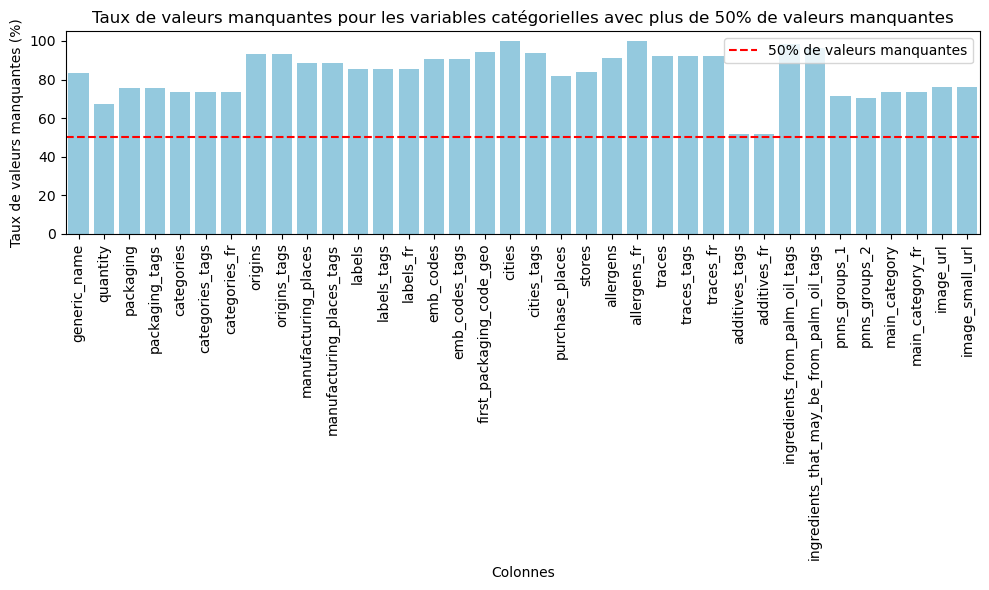

In [9]:
# Calculer le taux de valeurs manquantes pour chaque colonne catégorielle
taux_manquants_categoriques = dfData[colonnes_categoriques].isna().mean() * 100

# Filtrer les colonnes avec plus de 50% de valeurs manquantes
taux_manquants_sup_50 = taux_manquants_categoriques[taux_manquants_categoriques > 50]

# Créer le barplot pour ces colonnes
plt.figure(figsize=(10, 6))
sns.barplot(x=taux_manquants_sup_50.index, y=taux_manquants_sup_50.values, color='skyblue')

# Ajouter la barre à 50%
plt.axhline(y=50, color='red', linestyle='--', label='50% de valeurs manquantes')

# Ajouter des labels et un titre
plt.xlabel('Colonnes')
plt.ylabel('Taux de valeurs manquantes (%)')
plt.title('Taux de valeurs manquantes pour les variables catégorielles avec plus de 50% de valeurs manquantes')
plt.xticks(rotation=90)  # Pour faire pivoter les labels des colonnes si nécessaire

# Afficher la légende
plt.legend()

# Afficher le graphique
plt.tight_layout()
plt.show()

| Variable                                   | Taux de valeurs manquantes (%) | Explication |
|:-------------------------------------------|:------------------------------|:------------|
| **generic_name**                           | 83.54                         | Nom générique du produit. |
| **quantity**                               | 67.32                         | Quantité du produit.|
| **packaging**                              | 75.38                         | Type d'emballage du produit|
| **packaging_tags**                         | 75.38                         | Tags associés à l'emballage (ex. "sachets", "plastique") |
| **categories**                             | 73.69                         | Catégories des produits|
| **categories_tags**                        | 73.69                         | Tags associés aux catégories des produits. |
| **categories_fr**                          | 73.69                         | Catégories en français. |
| **origins**                                | 93.08                         | Origine géographique du produit. |
| **origins_tags**                           | 93.09                         | Tags associés à l'origine. |
| **manufacturing_places**                   | 88.62                         | Lieux de fabrication des produits. |
| **manufacturing_places_tags**              | 88.62                         | Tags associés aux lieux de fabrication. |
| **labels**                                 | 85.49                         | Labels du produit (ex. "Sans sucre ajouté", "sans gluten"). |
| **labels_tags**                            | 85.46                         | Tags associés aux labels. |
| **labels_fr**                              | 85.45                         | Labels en français. |
| **emb_codes**                              | 90.86                         | Codes d'emballage. |
| **emb_codes_tags**                         | 90.86                         | Tags associés aux codes d'emballage. |
| **first_packaging_code_geo**               | 94.14                         | Code géographique du premier type d'emballage. |
| **cities**                                 | 99.99                         | Villes associées aux produits. |
| **cities_tags**                            | 93.67                         | Tags associés aux villes. |
| **purchase_places**                        | 81.86                         | Lieux d'achat du produit. |
| **stores**                                 | 83.88                         | Magasins où le produit est disponible. |
| **allergens**                              | 91.16                         | Allergènes présents dans le produit (ex. "soja", "nuts"). |
| **allergens_fr**                           | 99.99                         | Allergènes en français. |
| **traces**                                 | 92.41                         | Traces d'autres substances (ex. "Milk", "nuts"). |
| **traces_tags**                            | 92.42                         | Tags associés aux traces (ex. "gluten"). |
| **traces_fr**                              | 92.41                         | Traces en français. |
| **additives_tags**                         | 51.78                         | Tags associés aux additifs (ex. "e123"). |
| **additives_fr**                           | 51.78                         | Additifs en français. |
| **ingredients_from_palm_oil_tags**         | 98.49                         | Tags associés aux ingrédients provenant de l'huile de palme. |
| **ingredients_that_may_be_from_palm_oil_tags** | 96.35                         | Tags associés aux ingrédients pouvant provenir de l'huile de palme. |
| **pnns_groups_1**                          | 71.47                         | Groupe PNNS (programme national nutrition santé). |
| **pnns_groups_2**                          | 70.54                         | Un autre groupe PNNS. |
| **main_category**                          | 73.70                         | Catégorie principale du produit (ex. "fresh-vegetables", "attieke"). |
| **main_category_fr**                       | 73.70                         | Catégorie principale en français. |
| **image_url**                              | 76.36                         | URL de l'image du produit. |
| **image_small_url**                        | 76.36                         | URL de la petite image du produit. |


Choix de la variable cible: pnns_groups_1

In [10]:
dfData['pnns_groups_1'].isna().sum() #229 259 valeurs nulles

229259

In [11]:
dfData['pnns_groups_1'].unique()

array([nan, 'unknown', 'Fruits and vegetables', 'Sugary snacks',
       'Cereals and potatoes', 'Composite foods', 'Fish Meat Eggs',
       'Beverages', 'Fat and sauces', 'fruits-and-vegetables',
       'Milk and dairy products', 'Salty snacks', 'sugary-snacks',
       'cereals-and-potatoes', 'salty-snacks'], dtype=object)

La variable cible que nous avons choisie pour ce projet est pnns_groups_1, qui représente la catégorie principale des produits alimentaires selon le système de classification du PNNS (Plan National Nutrition Santé). Cette variable catégorielle nous permet de classer chaque produit alimentaire dans une des 9 grandes catégories nutritionnelles, telles que "Fruits et légumes", "Produits sucrés", "Céréales et pommes de terre", etc.

| **English Category**        | **Catégorie**              |
|:----------------------------|:---------------------------------|
| Fruits and vegetables       | Fruits et légumes                |
| Sugary snacks               | Produits sucrés                  |
| Cereals and potatoes        | Céréales et pommes de terre      |
| Composite foods             | Aliments composés                |
| Fish Meat Eggs              | Poissons, viandes, œufs          |
| Beverages                   | Boissons                         |
| Fat and sauces              | Graisses et sauces               |
| Milk and dairy products     | Produits laitiers                |
| Salty snacks                | Produits salés                   |

## Filtrage de la cible 'pnns_groups_1'

### Uniformisation des données de la colonne pnns_groups_1

In [12]:
# Calculer le nombre d'occurrences pour chaque catégorie
occurrences_categorie = dfData['pnns_groups_1'].value_counts()

# Afficher le résultat
print(occurrences_categorie)

pnns_groups_1
unknown                    22624
Sugary snacks              12368
Beverages                   9033
Milk and dairy products     8825
Cereals and potatoes        8442
Fish Meat Eggs              8041
Composite foods             6747
Fruits and vegetables       5908
Fat and sauces              5216
Salty snacks                2809
fruits-and-vegetables        987
sugary-snacks                496
cereals-and-potatoes          16
salty-snacks                   1
Name: count, dtype: int64


Doublons avec des variations de casse et de format :<br>
Fruits and vegetables vs fruits-and-vegetables 5 908 et 987 = 6 895<br>
Sugary snacks vs sugary-snacks 12 368 et 496 = 12 864<br>
Cereals and potatoes vs cereals-and-potatoes 8 442 et 16 = 8 458 <br>
Salty snacks vs salty-snacks 2 809 et 1 = 2 810

In [13]:
#Liste des valeurs valides pour cette colonne
valeurs_valides_pnns1 = [
    "Fruits and vegetables", "Sugary snacks", "Cereals and potatoes",
    "Salty snacks", "Beverages", "Milk and dairy products",
    "Fish Meat Eggs", "Composite foods", "Fat and sauces"
]

In [14]:
# Fonction de normalisation
def normalisation(valeur, valeurs_valides):
    if pd.isna(valeur) or valeur == "Unknown":
        return "Unknown"
    
     # Mettre la première lettre de la valeur et des valeurs valides en majuscule
    valeur = valeur.capitalize()
    valeurs_valides = [v.capitalize() for v in valeurs_valides]
    
    # Appliquer la normalisation avec RapidFuzz en utilisant le seuil ajusté
    match, score, *_ = process.extractOne(valeur, valeurs_valides)  # Ignorer les valeurs supplémentaires
    
    if score >= 80:
        return match
    else:
        return "Unknown"  

In [15]:
# Fonction de nettoyage de la colonne
def nettoyage_pnns_groups_1(df):
    # Appliquer la normalisation uniquement si la valeur n'est pas "Unknown"
    df['pnns_groups_1'] = df['pnns_groups_1'].apply(
        lambda x: normalisation(x, valeurs_valides_pnns1) if x != "Unknown" else x
    )
    #return df

In [16]:
nettoyage_pnns_groups_1(dfData)

In [17]:
# Calculer le nombre d'occurrences pour chaque catégorie
occurrences_categorie = dfData['pnns_groups_1'].value_counts()

# Afficher le résultat
print(occurrences_categorie)

pnns_groups_1
Unknown                    251883
Sugary snacks               12864
Beverages                    9033
Milk and dairy products      8825
Cereals and potatoes         8458
Fish meat eggs               8041
Fruits and vegetables        6895
Composite foods              6747
Fat and sauces               5216
Salty snacks                 2810
Name: count, dtype: int64


### Suppression des lignes où les valeurs de la cible sont manquantes ou inconnues

In [18]:
# Supprimer les lignes où pnns_groups_1 est "Unknown"
dfData_clean = dfData[dfData['pnns_groups_1'] != 'Unknown']

# Vérifier la taille après suppression
print(dfData_clean.shape)

(68889, 162)


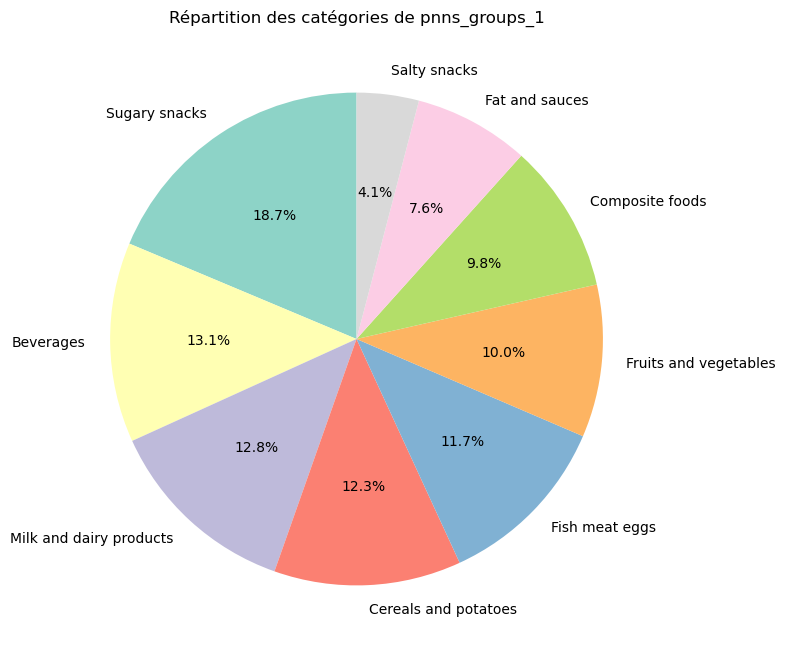

In [19]:
# Calculer le nombre d'occurrences pour chaque catégorie
occurrences_categorie = dfData_clean['pnns_groups_1'].value_counts()

# Afficher le diagramme circulaire
plt.figure(figsize=(8, 8))
plt.pie(occurrences_categorie, labels=occurrences_categorie.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set3", len(occurrences_categorie)))

# Ajouter un titre
plt.title("Répartition des catégories de pnns_groups_1")

# Afficher le graphique
plt.show()

### Isolement de la variable cible

In [20]:
# Séparer la variable cible (pnns_groups_1) du reste des données
X = dfData_clean.drop(columns=['pnns_groups_1'])  # Variables indépendantes
y = dfData_clean['pnns_groups_1']  # Variable cible

## Sélection des features (moins de 50% de valeurs manquantes)

### Visualisation du nombre de valeurs manquantes des features

In [21]:
# Calculer le taux de remplissage des colonnes
taux_valeurs_manquantes = X.isnull().mean() * 100

# Sélectionner les colonnes avec moins de 50% de données manquantes
colonnes_valides = taux_valeurs_manquantes[taux_valeurs_manquantes < 50].index

# Filtrer X pour ne garder que les colonnes valides
X_valides = X[colonnes_valides]

<Axes: >

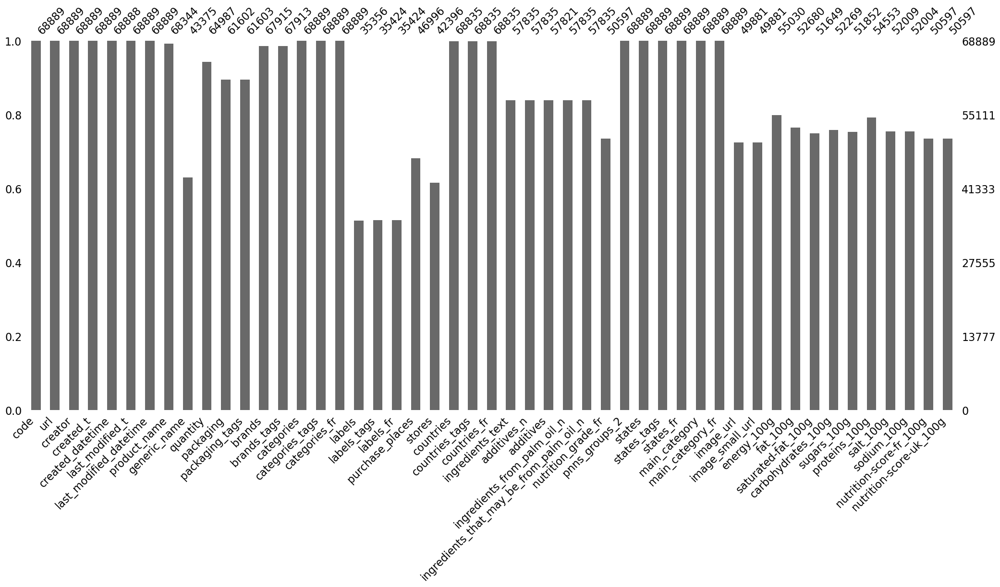

In [22]:
# Afficher un bar chart des données manquantes
msno.bar(X_valides)

In [23]:
print(colonnes_valides)

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands',
       'brands_tags', 'categories', 'categories_tags', 'categories_fr',
       'labels', 'labels_tags', 'labels_fr', 'purchase_places', 'stores',
       'countries', 'countries_tags', 'countries_fr', 'ingredients_text',
       'additives_n', 'additives', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_2', 'states', 'states_tags', 'states_fr', 'main_category',
       'main_category_fr', 'image_url', 'image_small_url', 'energy_100g',
       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')


In [24]:
len(colonnes_valides)

49

| Variable                          | Explication                                                                                          | Utile pour l'analyse ? |
|:-----------------------------------|:-----------------------------------------------------------------------------------------------------|:-----------------------|
| `code`                             | Identifiant unique pour chaque produit.                                                             | Non                    |
| `url`                              | Lien vers la page produit.                                                                          | Non                    |
| `creator`                          | Créateur ou contributeur du produit.                                                                 | Non                    |
| `created_t`                        | Date de création du produit.                                                                         | Non                    |
| `created_datetime`                 | Date et heure de création du produit.                                                                | Non                    |
| `last_modified_t`                  | Date de dernière modification.                                                                      | Non                    |
| `last_modified_datetime`           | Date et heure de dernière modification.                                                             | Non                    |
| `product_name`                     | Nom du produit.                                                                                     | Non                    |
| `generic_name`                     | Nom générique du produit (par exemple, un produit de marque sous un nom générique).                   | Non                    |
| `quantity`                         | Quantité du produit.                                                                                 | Non                    |
| `packaging`                        | Type de conditionnement du produit.                                                                  | Non                    |
| `packaging_tags`                   | Étiquettes associées au type de conditionnement.                                                     | Non                    |
| `brands`                           | Marque du produit.                                                                                  | Non                    |
| `brands_tags`                      | Étiquettes associées aux marques.                                                                    | Non                    |
| `categories`                       | Catégories générales auxquelles le produit appartient.                                                | Non                    |
| `categories_tags`                  | Étiquettes associées aux catégories.                                                                 | Non                    |
| `categories_fr`                    | Catégories en français.                                                                               | Non                    |
| `labels`                           | Labels (certifications) associés au produit.                                                         | Non                    |
| `labels_tags`                      | Étiquettes associées aux labels.                                                                     | Non                    |
| `labels_fr`                        | Labels en français.                                                                                 | Non                    |
| `purchase_places`                  | Lieux d'achat possibles pour le produit.                                                             | Non                    |
| `stores`                           | Magasins où le produit est vendu.                                                                    | Non                    |
| `countries`                        | Pays où le produit est disponible.                                                                   | Non                    |
| `countries_tags`                   | Étiquettes associées aux pays.                                                                       | Non                    |
| `countries_fr`                     | Pays en français.                                                                                    | Non                    |
| `ingredients_text`                 | Liste des ingrédients du produit.                                                                   | Non                    |
| `additives_n`                      | Nombre d'additifs dans le produit.                                                                   | Non                    |
| `additives`                         | Liste des additifs présents dans le produit.                                                         | Non                    |
| `ingredients_from_palm_oil_n`      | Nombre d'ingrédients provenant de l'huile de palme.                                                  | Non                    |
| `ingredients_that_may_be_from_palm_oil_n` | Nombre d'ingrédients potentiellement dérivés de l'huile de palme.                                  | Non                    |
| `nutrition_grade_fr`               | Note nutritionnelle du produit en France.                                                            | Non                    |
| `pnns_groups_2`                    | Catégorie secondaire selon le système PNNS (programme national nutrition santé).                    | Non                    |
| `states`                           | États ou condition de vente (par exemple, bio, végétalien).                                          | Non                    |
| `states_tags`                      | Étiquettes associées aux états.                                                                     | Non                    |
| `states_fr`                        | États en français.                                                                                  | Non                    |
| `main_category`                    | Catégorie principale du produit.                                                                    | Non                    |
| `main_category_fr`                 | Catégorie principale en français.                                                                   | Oui                    |
| `image_url`                        | URL de l'image du produit.                                                                          | Non                    |
| `image_small_url`                  | URL de l'image réduite du produit.                                                                  | Non                    |
| `energy_100g`                      | Quantité d'énergie (kcal) pour 100g du produit.                                                      | Oui                    |
| `fat_100g`                         | Quantité de graisses (g) pour 100g du produit.                                                      | Oui                    |
| `saturated-fat_100g`                | Quantité de graisses saturées (g) pour 100g du produit.                                              | Non                    |
| `carbohydrates_100g`               | Quantité de glucides (g) pour 100g du produit.                                                      | Oui                    |
| `sugars_100g`                      | Quantité de sucres (g) pour 100g du produit.                                                        | Oui                    |
| `proteins_100g`                    | Quantité de protéines (g) pour 100g du produit.                                                     | Oui                    |
| `salt_100g`                        | Quantité de sel (g) pour 100g du produit.                                                           | Oui                    |
| `sodium_100g`                      | Quantité de sodium (g) pour 100g du produit.                                                        | Non                    |
| `nutrition-score-fr_100g`          | Score nutritionnel du produit en France basé sur la quantité de nutriments pour 100g.               | Non                    |
| `nutrition-score-uk_100g`          | Score nutritionnel du produit au Royaume-Uni basé sur la quantité de nutriments pour 100g.          | Non                    |


Variables pertinentes à utiliser comme variables explicatives :<br>
**energy_100g** (énergie pour 100g)<br>
La quantité d'énergie par 100g d'un produit est essentielle pour distinguer les types de produits alimentaires.<br>
L'énergie est fortement liée à la densité calorique des aliments, ce qui peut distinguer des catégories comme :<br>
"Fat and sauces" : Ces aliments, riches en graisses, ont généralement une densité énergétique élevée.<br>
"Sugary snacks" : Les produits sucrés contiennent souvent beaucoup de calories par gramme.<br>
"Cereals and potatoes" : Les aliments riches en glucides complexes contribuent aussi à l'apport énergétique.<br>

**fat_100g** (graisses pour 100g)<br>
La quantité de graisses par 100g peut aider à différencier les produits riches en graisses des produits plus légers comme les fruits et légumes.<br>
Les aliments riches en graisses peuvent pointer vers : <br>
"Fat and sauces" : La catégorie qui inclut directement les graisses et les sauces riches en matières grasses.<br>
"Salty snacks" : Les produits salés (chips, biscuits apéritifs) sont souvent riches en graisses.<br>
"Fish Meat Eggs" : Certains produits d'origine animale contiennent une quantité significative de graisses.<br>

**carbohydrates_100g** (glucides pour 100g)<br>
La quantité de glucides, un autre facteur clé pour catégoriser les produits alimentaires, notamment les céréales, les pommes de terre et les produits sucrés.<br>
Les glucides sont un indicateur clé pour :<br>
"Sugary snacks" : Les produits riches en sucre et en glucides rapides.<br>
"Cereals and potatoes" : Ces aliments sont majoritairement composés de glucides complexes.<br>
"Fruits and vegetables" : Certains fruits sont naturellement riches en glucides, notamment les fruits sucrés.<br>

**sugars_100g** (sucres pour 100g)<br>
Le sucre est un indicateur clé pour identifier les produits sucrés (ex. biscuits, gâteaux) et les distinguer des autres types d'aliments.<br>
Le sucre est un excellent marqueur pour :<br>
"Sugary snacks" : Les produits sucrés ont des concentrations élevées en sucre.<br>
"Beverages" : Les boissons sucrées, comme les sodas ou les nectars, sont identifiables grâce à leur teneur élevée en sucre.<br>
"Fruits and vegetables" : Les fruits naturellement sucrés (ex. raisins, bananes) contiennent souvent une quantité notable de sucre.<br>

**proteins_100g** (protéines pour 100g)<br>
La quantité de protéines peut être utile pour différencier les produits à base de viande, de poisson ou de légumes riches en protéines.<br>
Les protéines permettent de repérer des catégories comme :<br>
"Fish Meat Eggs" : Les produits d'origine animale sont riches en protéines.<br>
"Milk and dairy products" : Les produits laitiers (yaourts, fromages) sont souvent une bonne source de protéines.<br>
"Cereals and potatoes" : Certains céréales (comme l’avoine ou le quinoa) contiennent une proportion notable de protéines.<br>

**salt_100g** (sel pour 100g)<br>
Le sel, comme le sucre, est un bon indicateur pour les produits salés, comme les snacks salés ou les produits transformés.<br>
La teneur en sel est cruciale pour identifier :<br>
"Salty snacks" : Les snacks salés (chips, crackers) sont souvent riches en sel.<br>
"Fat and sauces" : Les sauces et les graisses peuvent être fortement salées.<br>
"Fish Meat Eggs" : Les produits transformés d'origine animale (comme les charcuteries) contiennent généralement beaucoup de sel.<br>
"Composite foods" : Les plats composés ou préparés (pizzas, quiches, etc.) sont souvent très salés.<br>

### Sélection des features 

In [25]:
X = X[['code','product_name', 'energy_100g','fat_100g','carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g']] 

In [26]:
X.shape

(68889, 8)

In [27]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68889 entries, 174 to 320769
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                68889 non-null  object 
 1   product_name        68344 non-null  object 
 2   energy_100g         55030 non-null  float64
 3   fat_100g            52680 non-null  float64
 4   carbohydrates_100g  52269 non-null  float64
 5   sugars_100g         51852 non-null  float64
 6   proteins_100g       54553 non-null  float64
 7   salt_100g           52009 non-null  float64
dtypes: float64(6), object(2)
memory usage: 4.7+ MB


## Identification des doublons

Ici je ne considère comme doublon que les lignes complètement identiques (sauf le code du produit mais il ne sera pas gardé dans la phase d'automatisation). 

In [28]:
# Définir les colonnes à vérifier pour les doublons
colonnes_a_verifier = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g']

# Compter le nombre de doublons
nombre_doublons = X.duplicated(subset=colonnes_a_verifier).sum()
print(f"Nombre de doublons : {nombre_doublons}")

Nombre de doublons : 20897


In [29]:
# Supprimer les doublons en gardant la première occurrence
X = X.drop_duplicates(subset=colonnes_a_verifier, keep='first')

# Afficher le résultat
print(f"Nombre de lignes après suppression des doublons : {len(X)}")

Nombre de lignes après suppression des doublons : 47992


In [30]:
X.head()

,code,product_name,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g
174,0000000290616,Salade Cesar,1210.0,12.00,23.00,0.000,22.00,2.160
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,54.10,28.100,4.79,0.922
177,0000001071894,Flute,NaN,NaN,NaN,NaN,NaN,NaN
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,38.70,24.700,3.33,0.647
185,0000008237798,Quiche Lorraine,478.0,6.79,7.86,0.714,5.36,0.499


## Automatisation des tâches

In [31]:
#Avant l'appel de la fonction il faut s'assurer d'avoir une liste des catégories valide pour Pnns1
#Liste des valeurs valides pour Pnns1
valeurs_valides_pnns1 = [
    "Fruits and vegetables", "Sugary snacks", "Cereals and potatoes",
    "Salty snacks", "Beverages", "Milk and dairy products",
    "Fish Meat Eggs", "Composite foods", "Fat and sauces"
]
# On pourra modifier cette liste en dehors de la fonction

In [32]:
# Fonction
def nettoyage_filtrage(DataFrame):
    
# Etape de normalisation de la variable cible
    # Fonction de normalisation
    def normalisation(valeur, valeurs_valides): 
        if pd.isna(valeur) or valeur == "Unknown":
            return "Unknown"
    
         # Mettre la première lettre de la valeur et des valeurs valides en majuscule
        valeur = valeur.capitalize()
        valeurs_valides = [v.capitalize() for v in valeurs_valides]
    
        # Appliquer la normalisation avec RapidFuzz en utilisant le seuil ajusté
        match, score, *_ = process.extractOne(valeur, valeurs_valides)  # Ignorer les valeurs supplémentaires
    
        if score >= 80:
            return match
        else:
            return "Unknown"  # Ou une valeur par défaut
    
    # Fonction de nettoyage des colonnes
    def nettoyage_colonne(df, colonne, valeurs_valides): 
        df.loc[:, colonne] = df[colonne].apply(
            lambda x: normalisation(x, valeurs_valides) if x != "Unknown" else x
        )
 
    # Appel de fonction de nettoyage de ma colonne pour pnns1
    nettoyage_colonne(DataFrame, 'pnns_groups_1', valeurs_valides_pnns1)
    
#Etape de suppression des lignes où la colonne pnns_groups_1 est Unknown
    df_clean = DataFrame[DataFrame['pnns_groups_1'] != 'Unknown']
    
#Etape d'isolement de ma variable cible et de mes features explicatifs
    y = df_clean['pnns_groups_1'] # Variable cible
    X = df_clean[['energy_100g', 'fat_100g','carbohydrates_100g',
                  'sugars_100g', 'proteins_100g', 'salt_100g']] # Features explicatifs

# Etape de suppression des doublons
    X = X.drop_duplicates()
    
    return X, y  # Retourner X et y pour les utiliser plus tard

In [33]:
Z, y = nettoyage_filtrage(dfData)

In [34]:
Z.head()

,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g
174,1210.0,12.00,23.00,0.000,22.00,2.160
175,1520.0,14.40,54.10,28.100,4.79,0.922
177,NaN,NaN,NaN,NaN,NaN,NaN
180,1090.0,10.70,38.70,24.700,3.33,0.647
185,478.0,6.79,7.86,0.714,5.36,0.499


In [35]:
X.head()

,code,product_name,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g
174,0000000290616,Salade Cesar,1210.0,12.00,23.00,0.000,22.00,2.160
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,54.10,28.100,4.79,0.922
177,0000001071894,Flute,NaN,NaN,NaN,NaN,NaN,NaN
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,38.70,24.700,3.33,0.647
185,0000008237798,Quiche Lorraine,478.0,6.79,7.86,0.714,5.36,0.499


In [36]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47992 entries, 174 to 320751
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                47992 non-null  object 
 1   product_name        47758 non-null  object 
 2   energy_100g         47710 non-null  float64
 3   fat_100g            45179 non-null  float64
 4   carbohydrates_100g  45127 non-null  float64
 5   sugars_100g         44853 non-null  float64
 6   proteins_100g       47279 non-null  float64
 7   salt_100g           44987 non-null  float64
dtypes: float64(6), object(2)
memory usage: 3.3+ MB


In [37]:
Z.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47992 entries, 174 to 320751
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   energy_100g         47710 non-null  float64
 1   fat_100g            45179 non-null  float64
 2   carbohydrates_100g  45127 non-null  float64
 3   sugars_100g         44853 non-null  float64
 4   proteins_100g       47279 non-null  float64
 5   salt_100g           44987 non-null  float64
dtypes: float64(6)
memory usage: 2.6 MB


Les deux tableaux X et Z sont identiques. Mon automatisation fonctionne.

In [38]:
y.info()

<class 'pandas.core.series.Series'>
Index: 68889 entries, 174 to 320769
Series name: pnns_groups_1
Non-Null Count  Dtype 
--------------  ----- 
68889 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


## Respect des normes RGPD

Dans le cadre de ce projet d'analyse de données nutritionnelles, il est important d'aborder la question du respect des normes RGPD (Règlement Général sur la Protection des Données). Bien que notre étude porte sur des informations relatives aux produits alimentaires et non sur des données personnelles, il est pertinent de comprendre les principes du RGPD et d'évaluer leur applicabilité à notre contexte.

### Explication des 5 grands principes RGPD

Le RGPD repose sur cinq principes fondamentaux :<br>

**Licéité, loyauté et transparence du traitement des données** :<br>
Les données doivent être traitées de manière légale et éthique.<br>
Le traitement doit être transparent pour les personnes concernées.<br>

**Limitation des finalités** :<br>
Les données ne doivent être collectées que pour des objectifs spécifiques et légitimes.<br>
Elles ne doivent pas être utilisées d'une manière incompatible avec ces objectifs.<br>

**Minimisation des données** :<br>
Seules les données nécessaires aux finalités spécifiées doivent être collectées.<br>
Il faut éviter la collecte excessive de données personnelles.<br>

**Exactitude des données** :<br>
Les données personnelles doivent être exactes et tenues à jour.<br>
Les données inexactes doivent être rectifiées ou supprimées.<br>

**Limitation de la conservation** :<br>
Les données ne doivent pas être conservées plus longtemps que nécessaire.<br>
La durée de conservation doit être limitée au strict minimum requis pour les finalités du traitement.<br>

Ces principes visent à protéger les droits et libertés des individus en ce qui concerne leurs données personnelles.

### Démonstration de l'absence de lien avec le RGPD dans ce projet

Notre projet d'analyse nutritionnelle ne traite pas de données personnelles pour les raisons suivantes :<br>

Nature des données : Nous utilisons exclusivement des informations sur les produits alimentaires, telles que leur composition nutritionnelle et leur catégorie.<br>
**Absence d'identification** : Aucune donnée ne permet d'identifier des individus spécifiques.<br>
**Source des données** : Les informations proviennent de bases de données publiques sur les aliments.<br>
**Objectif de l'étude** : Notre analyse vise à comprendre les relations entre les composants nutritionnels et les groupes d'aliments, sans impliquer de traitement de données personnelles.<br>

**Conclusion** :
Bien que le RGPD soit un cadre réglementaire important pour la protection des données personnelles, notre projet d'analyse nutritionnelle n'entre pas dans son champ d'application. Nous traitons uniquement des données relatives aux produits alimentaires, sans aucun lien avec des informations personnelles identifiables. Néanmoins, cette réflexion sur le RGPD nous rappelle l'importance de manipuler les données de manière éthique et responsable, même lorsqu'elles ne sont pas directement soumises à cette réglementation.

## Identification et traitement des valeurs aberrantes

### Identification des valeurs aberrantes pour energy_100g

#### Résumé statistique d'energy_100g

In [39]:
# Résumé statistique de la variable 'energy_100g'
summary = X['energy_100g'].describe()

# Afficher le résumé
print(summary)

count    47710.000000
mean      1076.403285
std        783.570416
min          0.000000
25%        379.000000
50%        978.000000
75%       1640.300000
max      22000.000000
Name: energy_100g, dtype: float64


La valeur minimale de 0 peut être suspecte. En général, l'énergie d'un produit alimentaire ne devrait pas être égale à zéro, cependant notre base contient des données sur l'eau en bouteille et des boissons sans sucre qui sont des produit qui ont une quantité d'energie à 0.<br> 

Max : 22000 : La valeur maximale est extrêment élevée. On peut se demander si une telle quantité d'energie est possible pour un aliment<br>

#### Graphiques pour visualiser les valeurs extrêmes d'energy_100g

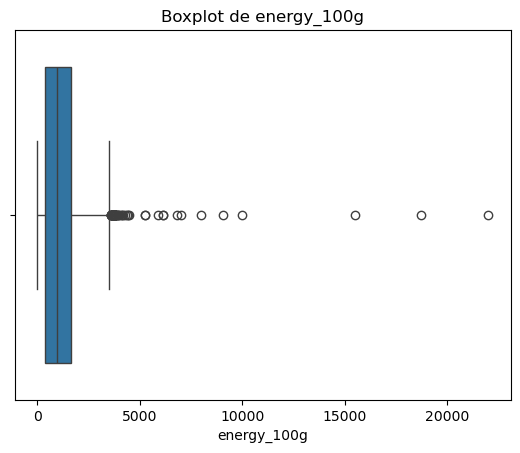

In [40]:
# Boxplot de la variable 'energy_100g'
sns.boxplot(x=X['energy_100g'])
plt.title('Boxplot de energy_100g')
plt.show()

Des valeurs aberrantes sont visibles au-delà de la moustache supérieure. Certaines sont beaucoup plus éloignées et pourraient représenter des cas rares ou des erreurs de données.

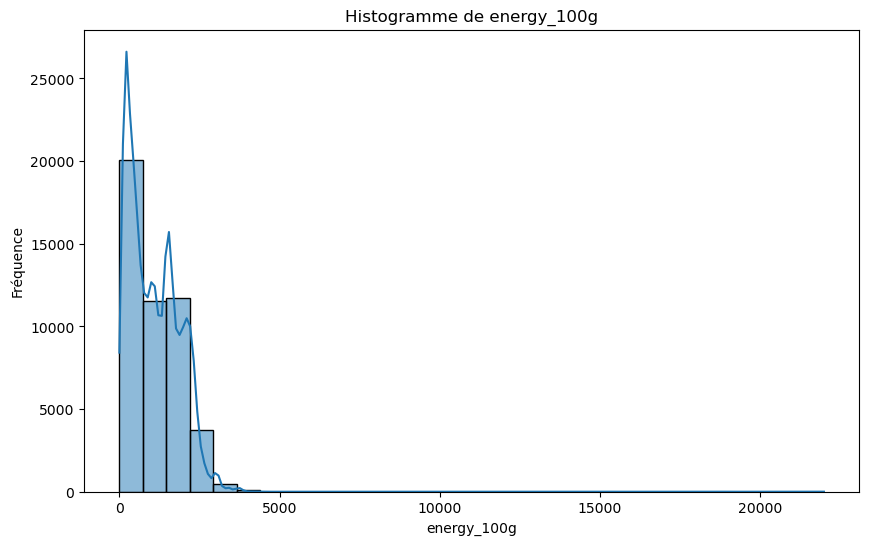

In [41]:
# Créer l'histogramme de 'energy_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['energy_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de energy_100g')
plt.xlabel('energy_100g')
plt.ylabel('Fréquence')
plt.show()

L'histogramme de la variable energy_100g révèle une distribution asymétrique avec une longue queue à droite ainsi que plusieurs pics, ce qui indique une distribution non normale. En raison de cette asymétrie, l'utilisation de l'intervalle interquartile (IQR) est préférable pour détecter les valeurs aberrantes, car cette méthode est moins influencée par les valeurs extrêmes que les méthodes basées sur l'écart-type.

#### Calcul de l'IQR pour la variable 'energy_100g'

L'Interquartile Range (IQR) est une mesure utilisée pour évaluer la dispersion des données. Il est calculé en soustrayant le 25e percentile (Q1) du 75e percentile (Q3), ce qui donne la plage où se situent la majorité des valeurs.

Dans cette analyse, nous appliquons l'IQR à la variable 'energy_100g', qui représente l'énergie des produits alimentaires pour 100g. Cela nous permet de repérer les valeurs extrêmes ou aberrantes, en identifiant celles qui sont trop élevées ou trop faibles par rapport à la majorité des données.

L'objectif est de détecter les valeurs qui pourraient nécessiter une attention particulière dans le cadre de notre étude.

In [42]:
# Calcul des quartiles sur la colonne 'energy_100g'
Q1 = X['energy_100g'].quantile(0.25)
Q3 = X['energy_100g'].quantile(0.75)

# Calcul de l'IQR
IQR = Q3 - Q1

# Calcul des bornes (seuils) pour les outliers
IQR_inf = Q1 - 1.5 * IQR  # Borne inférieure
IQR_sup = Q3 + 1.5 * IQR  # Borne supérieure

# Affichage des résultats
print(f"IQR inférieur : {IQR_inf}")
print(f"IQR supérieur : {IQR_sup}")

IQR inférieur : -1512.9500000000003
IQR supérieur : 3532.2500000000005


Interprétation :
IQR inférieur (-1515.0) : Toute valeur inférieure à -1515.0 est considérée comme un outlier par rapport à la règle de l'IQR. Cependant, il est impossible d'avoir des valeurs négatives pour l'énergie alimentaire, donc cette borne n'est pas pertinente.

IQR supérieur (3532.0) : Toute valeur supérieure à 3532.0 est considérée comme un outlier. Cela signifie que les valeurs de 'energy_100g' supérieures à cette limite sont potentiellement aberrantes.

In [43]:
X_copie=X.copy()

In [44]:
X = X_copie.copy()

#### Identification et suppression des valeurs incohérentes

Après une étude sur la teneur énergétique possible d'un produit, il s'avère qu'une énergie supérieure à 3900 kJ pour 100 g est peu probable (cela correspond à la valeur approximative pour un produit composé uniquement de matières grasses pures). Par conséquent, toute valeur dépassant 3900 kJ sera considérée comme erronée.

##### Cas où energie >3900

In [45]:
# Identifier les lignes où les valeurs de energy_100g sont incohérentes (inférieures à 0 ou supérieures à 3900kj)
erreurs_energy = X['energy_100g'] > 3900

# Sélectionner les lignes avec des erreurs
erreurs_energy_info = X[erreurs_energy]

# Afficher les infos des lignes avec des erreurs
erreurs_energy_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23 entries, 176697 to 311783
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                23 non-null     object 
 1   product_name        23 non-null     object 
 2   energy_100g         23 non-null     float64
 3   fat_100g            13 non-null     float64
 4   carbohydrates_100g  13 non-null     float64
 5   sugars_100g         23 non-null     float64
 6   proteins_100g       23 non-null     float64
 7   salt_100g           23 non-null     float64
dtypes: float64(6), object(2)
memory usage: 1.6+ KB


Il y a 23 valeurs fausses dans energy_100g, 23 valeurs qui dépassent 3900 Kj et qui sont donc des valeurs incohérentes avec la réalité.

In [46]:
print(f"Nombre de valeurs NaN dans 'energy_100g avant remplacement' : {X['energy_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'energy_100g avant remplacement' : 282


In [47]:
# Remplacer les valeurs incohérentes par NaN
X.loc[X['energy_100g'] > 3900, 'energy_100g'] = np.nan

# Vérifier le résultat
print(f"Nombre de valeurs NaN dans 'energy_100g' : {X['energy_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'energy_100g' : 305


#### Conclusion pour energy_100g

Pour la variable energy_100g, les valeurs comprises entre 0 et 3900 kJ sont cohérentes avec les données nutritionnelles. En effet, l'eau ne fournit pas d'énergie, tandis que des produits très gras, tels que les huiles, peuvent atteindre un maximum d'environ 3900 kJ. Par conséquent, toute valeur excédant cette limite a été considérée comme incorrecte.

Cette analyse a conduit à la suppression de 23 enregistrements pour cette variable.

### Identification des valeurs aberrantes pour fat_100g

#### Résumé statistique de fat_100g

In [48]:
# Résumé statistique de la variable 'fat_100g'
summary = X['fat_100g'].describe()

# Afficher le résumé
print(summary)

count    45179.000000
mean        12.799778
std         15.826564
min          0.000000
25%          1.040000
50%          6.400000
75%         21.000000
max        380.000000
Name: fat_100g, dtype: float64


Les données de la variable fat_100g présentent clairement des incohérences. En effet, une valeur supérieure à 100 est impossible pour une mesure exprimée en grammes pour 100 g de produit. Ces valeurs seront identifiées et supprimées.

In [49]:
# Identifier les lignes où les valeurs sont incohérentes (supérieures à 100)
erreurs = X[X['fat_100g'] > 100]

# Afficher les infos des lignes avec des erreurs
erreurs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, 245311 to 305054
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                3 non-null      object 
 1   product_name        3 non-null      object 
 2   energy_100g         2 non-null      float64
 3   fat_100g            3 non-null      float64
 4   carbohydrates_100g  3 non-null      float64
 5   sugars_100g         3 non-null      float64
 6   proteins_100g       3 non-null      float64
 7   salt_100g           3 non-null      float64
dtypes: float64(6), object(2)
memory usage: 216.0+ bytes


Il y a 3 lignes avec des valeurs de fat_100g >100

In [50]:
print(f"Nombre de valeurs NaN dans 'fat_100g avant remplacement' : {X['fat_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'fat_100g avant remplacement' : 2813


In [51]:
# Remplacer les valeurs incohérentes par NaN
X.loc[X['fat_100g'] > 100, 'fat_100g'] = np.nan

# Vérifier le résultat
print(f"Nombre de valeurs NaN dans 'fat_100g' : {X['fat_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'fat_100g' : 2816


#### Graphiques pour visualiser les valeurs extrêmes de fat_100g

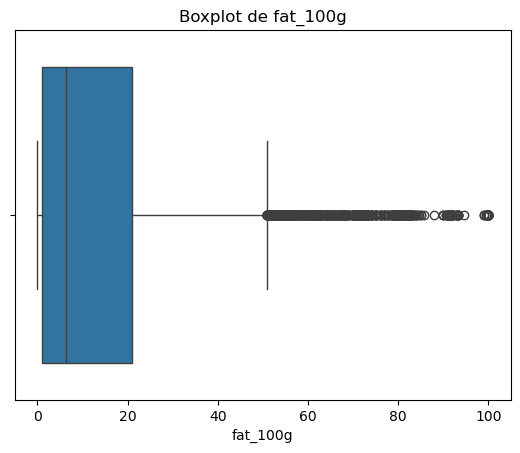

In [52]:
# Boxplot de la variable 'energy_100g'
sns.boxplot(x=X['fat_100g'])
plt.title('Boxplot de fat_100g')
plt.show()

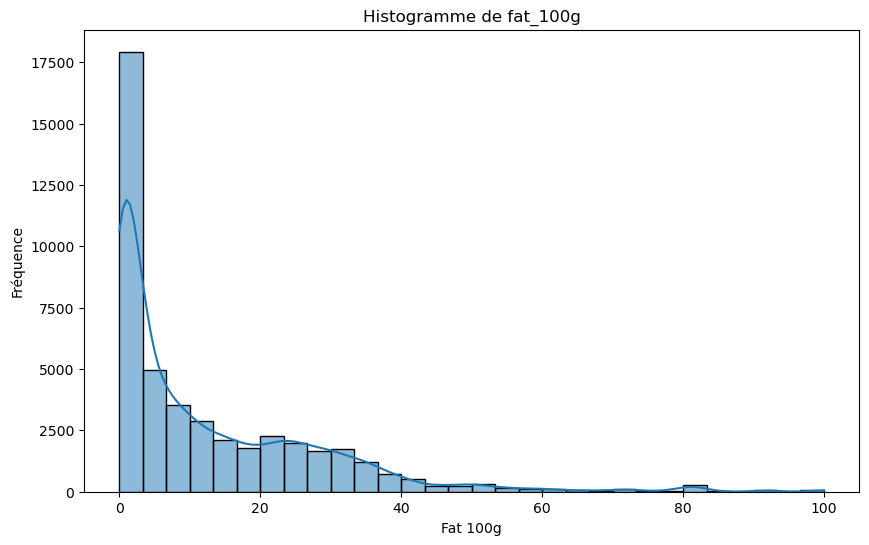

In [53]:
# Créer l'histogramme de 'fat_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['fat_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de fat_100g')
plt.xlabel('Fat 100g')
plt.ylabel('Fréquence')
plt.show()

L'histogramme de la variable fat_100g' montre une distribution asymétrique avec une longue queue à droite, ce qui indique également une distribution non normale. En raison de cette asymétrie, il est plus pertinent d'utiliser l'intervalle interquartile (IQR) pour détecter les valeurs aberrantes, car cette méthode est moins sensible aux valeurs extrêmes comparée aux approches basées sur l'écart-type.

#### Calcul de l'IQR pour la variable 'fat_100g'

L'Interquartile Range (IQR) est une mesure utilisée pour évaluer la dispersion des données. Il est calculé en soustrayant le 25e percentile (Q1) du 75e percentile (Q3), ce qui donne la plage où se situent la majorité des valeurs.

Dans cette analyse, nous appliquons l'IQR à la variable 'fat_100g', qui représente le gras des produits alimentaires pour 100g. Cela nous permet de repérer les valeurs extrêmes ou aberrantes, en identifiant celles qui sont trop élevées ou trop faibles par rapport à la majorité des données.

L'objectif est de détecter les valeurs qui pourraient nécessiter une attention particulière dans le cadre de notre étude.

In [54]:
# Calcul des quartiles sur la colonne 'fat_100g'
Q1 = X['fat_100g'].quantile(0.25)
Q3 = X['fat_100g'].quantile(0.75)

# Calcul de l'IQR
IQR = Q3 - Q1

# Calcul des bornes (seuils) pour les outliers
IQR_inf = Q1 - 1.5 * IQR  # Borne inférieure
IQR_sup = Q3 + 1.5 * IQR  # Borne supérieure

# Affichage des résultats
print(f"IQR inférieur : {IQR_inf}")
print(f"IQR supérieur : {IQR_sup}")

IQR inférieur : -28.900000000000002
IQR supérieur : 50.94


Interprétation :
IQR inférieur (-28.9g) :Les valeurs inférieures à -28.9 g sont considérées comme aberrantes, mais dans ce contexte, étant donné que la teneur en graisses ne peut pas être négative, on peut ignorer cette borne inférieure.

IQR supérieur (50.94) : Toute valeur supérieure à 50.94g  est considérée comme un outlier. Cela signifie que les valeurs de 'fat_100g' supérieures à cette limite sont potentiellement aberrantes.

#### Conclusion pour fat_100g

Un produit alimentaire peut contenir entre 0 g et 100 g de graisses pour 100 g de produit, ce qui couvre une large gamme de catégories, allant des fruits et légumes (0 g de graisses) à des produits extrêmement gras comme les huiles (100 g de graisses) ou certains fromages (60 à 80 g de graisses). Ainsi, les valeurs observées pour ces produits sont conformes aux attentes nutritionnelles, et aucune action corrective n'est requise pour ces données.

L'étude des valeurs aberrantes de cette variables nous a poussée à supprimer 3 valeurs qui étaient supérieures à 100g.

### Identification des valeurs aberrantes pour carbohydrates_100g

#### Résumé statistique de carbohydrates_100g

In [55]:
# Résumé statistique de la variable 'carbohydrates_100g'
summary = X['carbohydrates_100g'].describe()

# Afficher le résumé
print(summary)

count    45127.000000
mean        27.926376
std         27.040966
min          0.000000
25%          4.700000
50%         14.900000
75%         53.000000
max        190.000000
Name: carbohydrates_100g, dtype: float64


Nous pouvons clairement identifier des incohérences dans les données. En effet, certaines valeurs dépassent 100, ce qui n'est pas logique pour une variable exprimant des quantités pour 100 g de produit. Nous allons donc localiser ces valeurs incorrectes et les supprimer.

In [56]:
# Identifier les lignes où les valeurs sont incohérentes (carbohydrates_100g > 100)
erreurs = X[X['carbohydrates_100g'] > 100]

# Afficher les infos des lignes avec des erreurs
erreurs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5 entries, 111566 to 317635
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                5 non-null      object 
 1   product_name        5 non-null      object 
 2   energy_100g         3 non-null      float64
 3   fat_100g            3 non-null      float64
 4   carbohydrates_100g  5 non-null      float64
 5   sugars_100g         5 non-null      float64
 6   proteins_100g       4 non-null      float64
 7   salt_100g           4 non-null      float64
dtypes: float64(6), object(2)
memory usage: 360.0+ bytes


Il y a 5 lignes avec des valeurs de carbohydrates_100g >100

In [57]:
print(f"Nombre de valeurs NaN dans 'carbohydrates_100g' avant remplacement' : {X['carbohydrates_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'carbohydrates_100g' avant remplacement' : 2865


In [58]:
# Remplacer les valeurs incohérentes par NaN
X.loc[X['carbohydrates_100g'] > 100, 'carbohydrates_100g'] = np.nan

# Vérifier le résultat
print(f"Nombre de valeurs NaN dans 'carbohydrates_100g' : {X['carbohydrates_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'carbohydrates_100g' : 2870


#### Graphiques pour visualiser les valeurs extrêmes carbohydrates_100g

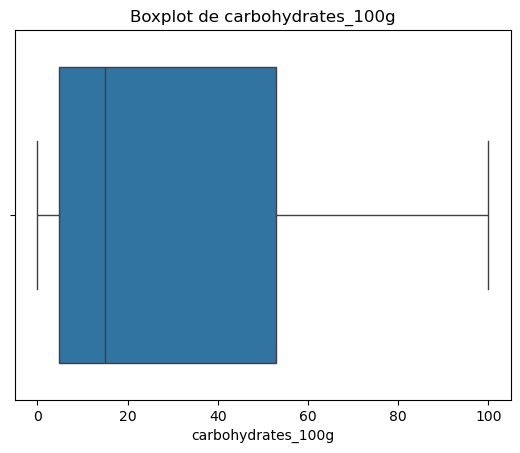

In [59]:
# Boxplot de la variable 'carbohydrates_100g'
sns.boxplot(x=X['carbohydrates_100g'])
plt.title('Boxplot de carbohydrates_100g')
plt.show()

Le boxplot de la variable ne révèle aucune valeur extrême identifiable, toutes les observations se situant à l'intérieur des bornes définies par l'intervalle interquartile. Cela suggère que les données sont globalement cohérentes et qu'il n'y a pas de valeurs aberrantes nécessitant une attention particulière ou un traitement spécifique.

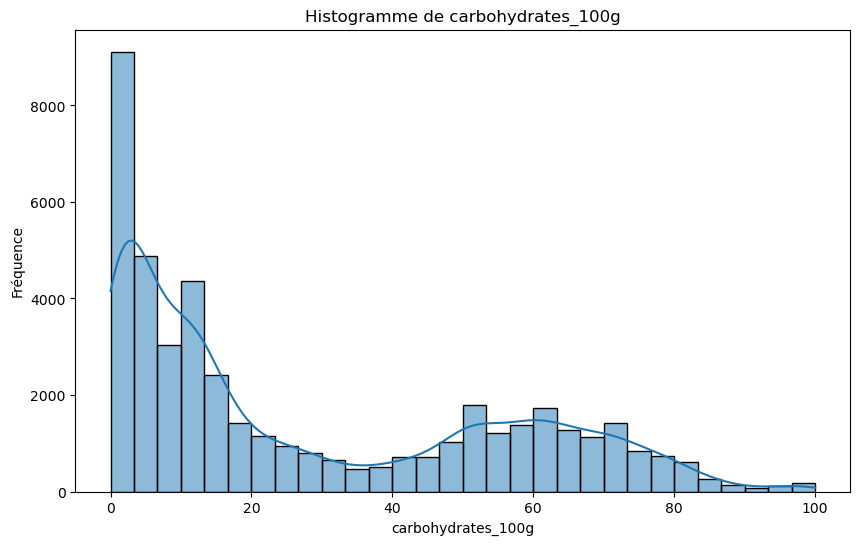

In [60]:
# Créer l'histogramme de 'carbohydrates_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['carbohydrates_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de carbohydrates_100g')
plt.xlabel('carbohydrates_100g')
plt.ylabel('Fréquence')
plt.show()

L'histogramme de la variable carbohydrates_100g montre une concentration élevée près des valeurs proches de 0, suivie d'un léger déclin avant de présenter une petite vague, puis de redescendre à nouveau. Cette distribution suggère une forme légèrement bimodale, avec une forte concentration de produits ayant peu ou pas de glucides, mais également quelques produits présentant des valeurs plus élevées. Toutefois, aucune anomalie flagrante ne ressort, ce qui justifie l'utilisation de l'intervalle interquartile (IQR) pour détecter d'éventuelles valeurs aberrantes.

#### Calcul de l'IQR pour la variable 'carbohydrates_100g'

L'Intervalle Interquartile (IQR) est une mesure statistique utilisée pour évaluer la dispersion des données en se concentrant sur les valeurs centrales. Il est obtenu en soustrayant le 25ᵉ centile (Q1) du 75ᵉ centile (Q3), ce qui délimite la plage où se situe la majorité des observations.

Dans cette analyse, nous utilisons l'IQR pour la variable 'carbohydrates_100g', qui représente la teneur en glucides des produits alimentaires pour 100 g. Cette approche permet d'identifier les valeurs potentiellement extrêmes ou aberrantes, c'est-à-dire celles qui s'écartent significativement des données principales.

L'objectif est de repérer les valeurs atypiques qui pourraient influencer l'interprétation globale des données et nécessiter une vérification ou une exclusion dans le cadre de notre étude.

In [61]:
# Calcul des quartiles sur la colonne 'carbohydrates_100g'
Q1 = X['carbohydrates_100g'].quantile(0.25)
Q3 = X['carbohydrates_100g'].quantile(0.75)

# Calcul de l'IQR
IQR = Q3 - Q1

# Calcul des bornes (seuils) pour les outliers
IQR_inf = Q1 - 1.5 * IQR  # Borne inférieure
IQR_sup = Q3 + 1.5 * IQR  # Borne supérieure

# Affichage des résultats
print(f"IQR inférieur : {IQR_inf}")
print(f"IQR supérieur : {IQR_sup}")

IQR inférieur : -67.74999999999999
IQR supérieur : 125.44999999999999


Étant donné que toutes les valeurs de carbohydrates_100g se situent dans la plage logique de 0 à 100, aucune donnée ne dépasse les seuils calculés de -67 à 125, confirmant ainsi l'absence de valeurs aberrantes. Par ailleurs, le boxplot de cette variable ne montre aucun point extrême, renforçant cette observation.<br>

#### Identification et suppression des valeurs incohérentes

#### Conclusion pour carbohydrates_100g

Aucune valeur aberrante n'a été identifiée pour la variable carbohydrates_100g. Les données se trouvent toutes dans une plage cohérente de 0 à 100, ce qui est attendu pour des produits alimentaires. Par exemple, les fruits secs, riches en glucides, peuvent approcher les 100 g de glucides par portion, tandis que des produits comme la viande ou l’eau n’en contiennent pratiquement pas. Cette répartition confirme que les valeurs sont fiables.

Grace à cette étude nous avons détecté et supprimé 5 valeurs incohérentes pour cette variable.

### Identification des valeurs aberrantes pour sugars_100g

#### Résumé statistique de sugars_100g

In [62]:
# Résumé statistique de la variable 'sugars_100g'
summary = X['sugars_100g'].describe()

# Afficher le résumé
print(summary)

count    44853.000000
mean        13.342256
std         18.453097
min         -0.100000
25%          1.200000
50%          4.500000
75%         17.000000
max        134.000000
Name: sugars_100g, dtype: float64


Nous avons identifié plusieurs valeurs incohérentes dans les données, notamment des valeurs inférieures à 0 et supérieures à 100. Ces valeurs ne sont pas plausibles pour une variable mesurant des quantités pour 100 g. Nous allons les repérer précisément et les exclure de l'ensemble de données.

In [63]:
# Identifier les lignes où les valeurs sont incohérentes (supérieures à 100 ou inférieures à 0)
erreurs = X[(X['sugars_100g'] < 0) | (X['sugars_100g'] > 100)]

# Afficher les infos des lignes avec des erreurs
erreurs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, 111566 to 239347
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                3 non-null      object 
 1   product_name        3 non-null      object 
 2   energy_100g         3 non-null      float64
 3   fat_100g            2 non-null      float64
 4   carbohydrates_100g  1 non-null      float64
 5   sugars_100g         3 non-null      float64
 6   proteins_100g       2 non-null      float64
 7   salt_100g           2 non-null      float64
dtypes: float64(6), object(2)
memory usage: 216.0+ bytes


Il y a 3 lignes avec des valeurs de  sugars_100g >100 ou sugars_100g<0.

In [64]:
print(f"Nombre de valeurs NaN dans 'sugars_100g' avant remplacement' : {X['sugars_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'sugars_100g' avant remplacement' : 3139


In [65]:
# Remplacer les valeurs incohérentes par NaN
X.loc[(X['sugars_100g'] > 100) | (X['sugars_100g'] < 0), 'sugars_100g'] = np.nan

# Vérifier le résultat
print(f"Nombre de valeurs NaN dans 'sugars_100g' : {X['sugars_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'sugars_100g' : 3142


#### Graphiques pour visualiser les valeurs extrêmes sugars_100g

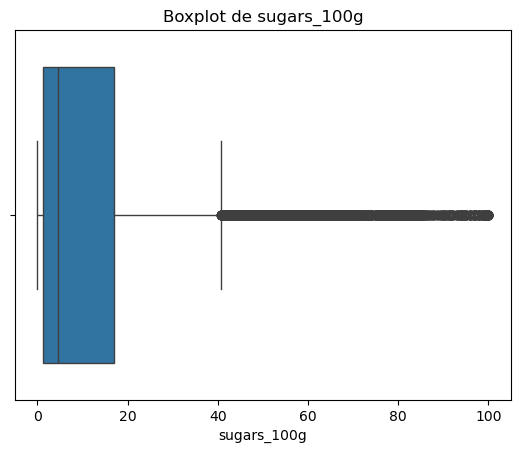

In [66]:
# Boxplot de la variable 'sugars_100g'
sns.boxplot(x=X['sugars_100g'])
plt.title('Boxplot de sugars_100g')
plt.show()

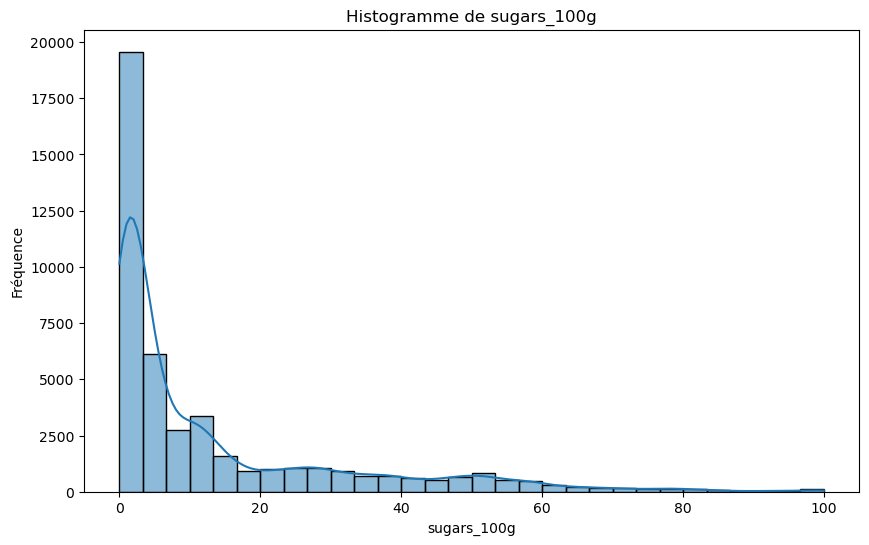

In [67]:
# Créer l'histogramme de 'sugars_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['sugars_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de sugars_100g')
plt.xlabel('sugars_100g')
plt.ylabel('Fréquence')
plt.show()

L'histogramme de la variable sugars_100g montre  une distribution asymétrique avec une longue queue à droite. En raison de cette asymétrie, il est plus pertinent d'utiliser l'intervalle interquartile (IQR) pour détecter les valeurs aberrantes, car cette méthode est moins sensible aux valeurs extrêmes comparée aux approches basées sur l'écart-type.

#### Calcul de l'IQR pour la variable 'sugars_100g'

In [68]:
# Calcul des quartiles sur la colonne 'sugars_100g'
Q1 = X['sugars_100g'].quantile(0.25)
Q3 = X['sugars_100g'].quantile(0.75)

# Calcul de l'IQR
IQR = Q3 - Q1

# Calcul des bornes (seuils) pour les outliers
IQR_inf = Q1 - 1.5 * IQR  # Borne inférieure
IQR_sup = Q3 + 1.5 * IQR  # Borne supérieure

# Affichage des résultats
print(f"IQR inférieur : {IQR_inf}")
print(f"IQR supérieur : {IQR_sup}")

IQR inférieur : -22.500000000000004
IQR supérieur : 40.7


Interprétation : IQR inférieur (-22.5g) :Les valeurs inférieures à -22.5 g sont considérées comme aberrantes, mais dans ce contexte, étant donné que la teneur en sucre ne peut pas être négative, on peut ignorer cette borne inférieure.

IQR supérieur (40.7) : Toute valeur supérieure à 40.7g est considérée comme un outlier. Cela signifie que les valeurs de 'sugar_100g' supérieures à cette limite sont potentiellement aberrantes.

#### Identification des produits avec sugars_100g > carbohydates_100g

Dans une analyse nutritionnelle, il est important de vérifier la cohérence des données. Pour les variables sugars_100g (quantité de sucres pour 100 g) et carbohydrates_100g (quantité totale de glucides pour 100 g), une relation logique doit être respectée : la quantité de sucres ne peut jamais dépasser la quantité totale de glucides, car les sucres sont une sous-catégorie des glucides.

In [69]:
# Identifier les lignes où sugars_100g est supérieur à carbohydrates_100g
incoherences = X[X['sugars_100g'] > X['carbohydrates_100g']]

# Afficher le nombre de lignes concernées
print(f"Nombre de lignes avec incohérences : {incoherences.shape[0]}")

# Afficher les premières lignes concernées pour analyse
incoherences[['code', 'product_name', 'sugars_100g', 'carbohydrates_100g']].head(50)

Nombre de lignes avec incohérences : 92


,code,product_name,sugars_100g,carbohydrates_100g
18955,0021357020138,Hickory Farms® Our Signature Beef Summer Sausa...,1.00,0.00
27505,00318655,6 Pork & Bramley Apple Sausages,5.60,5.50
66912,0060383998622,Milk chocolate with hazelnuts,76.30,52.60
67359,0063351049005,Rôti de bœuf au jus,2.00,1.00
149041,0810757009177,Wild Pacific Sardines in Tomato Sauce,1.79,0.00
174058,0898999000022,Vita coco,5.00,4.55
178305,20158125,Fromage blanc saveur vanille,14.00,13.00
178306,20158132,Fromage blanc 20 % nature,3.90,3.50
179979,20455569,Chèvre frais,3.00,2.00
180784,20621586,Wok d'Autruche pré-grillé mariné,0.50,0.10


Nous avons détecté des incohérences où la quantité de sucre par 100 g (sugars_100g) dépasse celle des glucides totaux (carbohydrates_100g). Ces anomalies sont problématiques, car les sucres constituent un sous-ensemble des glucides et ne peuvent donc logiquement pas les dépasser. Ces écarts peuvent résulter d'erreurs de saisie, d'arrondis incorrects ou de données mal formatées.<br>
Cependant, certaines de ces anomalies sont liées au fait que **la réglementation permet un écart de jusqu'à 20%** entre la valeur nutritive réelle et celle déclarée sur l'étiquette. Cette marge tient compte de la variabilité naturelle des aliments et des limites des méthodes d'analyse.
Dans un premier temps nous allons identifier les valeurs "acceptables" : 

Pour garantir la qualité et la cohérence des données avant de poursuivre nos analyses nous allons différencier plusieurs cas en fonction des écarts :<br>

**Pour les valeurs acceptables** nous allons considérer comme acceptables les valeurs de sugars_100g qui tiennent compte des marges d'erreurs de 20% pour lui même mais aussi pour carbohydrates_100g. Si la valeurs maximum possibe de carbohydrates_100g (en tenant compte des 20% d'erreur) est supérieure ou égale à la valeur minimum possible de sugars_100g, alors nous considérons la valeur de sugars_100g comme acceptable. Dans le cas contraire nous considérons les valeurs de sugars_100g comme inaccceptable.<br>

Pour les valeurs acceptables, nous laisserons les valeurs telles quelles pour respecter la réalité des valeurs nutritives déclarées.<br>
**Pour les valeurs inacceptable**, nous allons étudier l'écart entre sugars_100g et carbohydrates_100g pour prendre une décision.

In [70]:
# Calculer les marges d'erreur pour chaque ligne
marge_erreur_sugar = 0.20 * incoherences['sugars_100g']
marge_erreur_carb = 0.20 * incoherences['carbohydrates_100g']

# Calculer les valeurs minimales de sucre et maximales de glucides
sucre_min_possible = incoherences['sugars_100g'] - marge_erreur_sugar
carb_max_possible = incoherences['carbohydrates_100g'] + marge_erreur_carb

# Identifier les lignes où l'écart est acceptable (carb_max_possible >= sucre_min_possible)
incoherences_acceptable = incoherences[carb_max_possible >= sucre_min_possible]

# Identifier les lignes où l'écart est inacceptable (carb_max_possible < sucre_min_possible)
incoherences_inacceptable = incoherences[carb_max_possible < sucre_min_possible]

# Afficher les résultats
print(f"Nombre de lignes acceptables : {incoherences_acceptable.shape[0]}")
print(f"Nombre de lignes inacceptables : {incoherences_inacceptable.shape[0]}")

incoherences_inacceptable[['code', 'product_name', 'sugars_100g', 'carbohydrates_100g']].head()

Nombre de lignes acceptables : 63
Nombre de lignes inacceptables : 29


,code,product_name,sugars_100g,carbohydrates_100g
18955,0021357020138,Hickory Farms® Our Signature Beef Summer Sausa...,1.00,0.0
67359,0063351049005,Rôti de bœuf au jus,2.00,1.0
149041,0810757009177,Wild Pacific Sardines in Tomato Sauce,1.79,0.0
180784,20621586,Wok d'Autruche pré-grillé mariné,0.50,0.1
181268,20717483,British beef lean diced steak,0.20,0.1


In [71]:
incoherences_acceptable[['code', 'product_name', 'sugars_100g', 'carbohydrates_100g']].head()

,code,product_name,sugars_100g,carbohydrates_100g
27505,00318655,6 Pork & Bramley Apple Sausages,5.6,5.50
66912,0060383998622,Milk chocolate with hazelnuts,76.3,52.60
174058,0898999000022,Vita coco,5.0,4.55
178305,20158125,Fromage blanc saveur vanille,14.0,13.00
178306,20158132,Fromage blanc 20 % nature,3.9,3.50


In [72]:
# Créer une copie explicite pour éviter l'avertissement
incoherences_inacceptable = incoherences_inacceptable.copy()

# Calculer l'écart
incoherences_inacceptable['ecart'] = incoherences_inacceptable['sugars_100g'] - incoherences_inacceptable['carbohydrates_100g']

# Résumé statistique de l'écart
incoherences_inacceptable['ecart'].describe()

count    29.000000
mean      2.948966
std       6.655170
min       0.010000
25%       0.100000
50%       0.500000
75%       1.200000
max      28.500000
Name: ecart, dtype: float64

In [73]:
# Filtrer les lignes où l'écart est inférieur à 0.5
incoherences_filtrées = incoherences_inacceptable[incoherences_inacceptable['ecart'].abs() > 0.5]

# Afficher les premières lignes des incohérences filtrées
print(f"Nombre de lignes avec écart > 0.5 : {incoherences_filtrées.shape[0]}")

Nombre de lignes avec écart > 0.5 : 12


À partir de 29 produits identifiés avec des incohérences inacceptables (carbohydrates_100g < sugars_100g), nous avons étudié les écarts entre ces deux variables.<br>

**Justification du choix du seuil**<br>
Analyse basée sur la médiane :<br>
La médiane de 0.5 g divise les écarts en deux groupes cohérents. Cela signifie que 50 % des écarts sont ≤ 0.5 g, ce qui correspond à des incohérences limitées.<br>
Ces écarts mineurs sont plus susceptibles d’être liés à des erreurs d’arrondi ou à des marges d’erreur tolérées dans l’étiquetage, justifiant leur correction.<br>

Contrôle des valeurs extrêmes :<br>
Les écarts > 0.5 g (12 produits) dépassent clairement les incohérences typiques observées. Ces écarts sont donc traités comme des anomalies.<br>

Proportion des valeurs affectées :
Avec plus de 47 000 produits dans le dataset, le seuil de 0.5 g permet de corriger les incohérences légères pour 17 produits (58,6 % des cas) tout en supprimant seulement 12 lignes (~0.025 % du total).<br>
Ce seuil équilibre le besoin de conserver un maximum de données tout en maintenant leur fiabilité.

Cohérence avec les pratiques réglementaires :<br>
Les marges d’erreur légales (20 %) ont déjà été utilisées pour identifier les incohérences acceptables. Un seuil plus large (>0.5 g) risquerait de réintroduire des anomalies dans les données corrigées.

**Stratégie adoptée**<br>
*Cas des écarts ≤ 0.5 g* :<br>
Les écarts sont considérés mineurs et peuvent être corrigés de manière fiable.<br>
Action : Remplacer la valeur de sugars_100g par NaN pour ces lignes.<br>
Cela garantit la cohérence entre les deux valeurs tout en conservant les produits dans le dataset.<br>

*Cas des écarts > 0.5 g* :<br>
Ces écarts représentent des incohérences significatives.<br>
Les valeurs ne peuvent pas être corrigées de manière fiable et risquent de biaiser l’analyse.<br>
Action : Supprimer ces produits du dataset.<br>
Impact minimal sur l’ensemble des données (12 produits supprimés, soit ~0.025 % du dataset).

In [74]:
# Afficher le nombre de ligne avant application de notre stratégie
print(f"Nombre total des produits avant nettoyage : {X.shape[0]}")

Nombre total des produits avant nettoyage : 47992


In [75]:
# Nombre de valeurs NaN dans sugars_100g avant application de notre stratégie
print(f"Nombre de valeurs NaN dans sugars_100g avant remplacement : {X['sugars_100g'].isna().sum()}")

Nombre de valeurs NaN dans sugars_100g avant remplacement : 3142


In [76]:
# Calcul de l'écart entre sucres et carbohydrates
X['ecart'] = X['sugars_100g'] - X['carbohydrates_100g']

# Conditions pour établir `est_acceptable` (y compris NaN)
X['est_acceptable'] = np.where(X['ecart'].isna(), 'oui', np.where(X['ecart'] <= 0, 'oui', 'non'))

# Ajouter 20% des carbohydrates pour créer la valeur `carb_max_possible`
X['carb_max_possible'] = (X['carbohydrates_100g'] * 1.2).round(3)

# Diminuer 20% des sucres pour créer la valeur `min_sucre_possible`
X['min_sucre_possible'] = (X['sugars_100g'] * 0.8).round(3)

# Ajuster `est_acceptable` en fonction des conditions supplémentaires
X.loc[X['carb_max_possible'] >= X['min_sucre_possible'], 'est_acceptable'] = 'oui'

# Masque pour remplacer les valeurs incohérentes lorsque `ecart` est inférieur ou égale à 0.5
mask_ecart_inf_0_5 = (X['est_acceptable'] == 'non') & (X['ecart'].abs() <= 0.5)
num_replacements = mask_ecart_inf_0_5.sum()  # Nombre de valeurs remplacées par NaN
X.loc[mask_ecart_inf_0_5, 'sugars_100g'] = np.NaN

# Masque pour supprimer les lignes avec des écarts trop grands
mask_ecart_sup_0_5 = (X['est_acceptable'] == 'non') & (X['ecart'].abs() > 0.5)
num_lignes_supprimees = mask_ecart_sup_0_5.sum()  # Nombre de lignes supprimées
X = X[~mask_ecart_sup_0_5]

# Suppression des colonnes temporaires après traitement
X = X.copy()  # Assure une copie complète pour éviter SettingWithCopyWarning
X.drop(columns=['ecart', 'carb_max_possible', 'min_sucre_possible', 'est_acceptable'], inplace=True)

# Afficher les résultats finaux
print(f"Nombre total des produits après nettoyage : {X.shape[0]}")
print(f"Nombre de valeurs NaN dans 'sugars_100g' après nettoyage : {X['sugars_100g'].isna().sum()}")
print(f"Nombre de lignes supprimées : {num_lignes_supprimees}")
print(f"Nombre de valeurs remplacées par NaN : {num_replacements}")

Nombre total des produits après nettoyage : 47980
Nombre de valeurs NaN dans 'sugars_100g' après nettoyage : 3159
Nombre de lignes supprimées : 12
Nombre de valeurs remplacées par NaN : 17


#### Conclusion pour sugars_100g

Nous avons identifié des incohérences où la quantité des sucres par 100 g (sugars_100g) dépasse celle des glucides totaux (carbohydrates_100g). De telles anomalies ne sont pas réalistes, puisque les sucres sont nécessairement un sous-ensemble des glucides. Ces écarts peuvent être attribués à des erreurs de saisie, des arrondis incorrects ou des données mal formatées.<br>

Les marges d’erreur de 20%, autorisées par la réglementation pour les valeurs nutritionnelles sur les emballages, expliquent une partie des écarts acceptables. Ainsi, nous avons mis en place une méthodologie pour distinguer les valeurs acceptables des valeurs inacceptables :<br>

Pour les valeurs acceptables :<br>
Les produits sont considérés comme conformes si la valeur maximale possible de carbohydrates_100g, en prenant en compte la marge des 20%, est supérieure ou égale à la valeur minimale possible de sugars_100g. Dans ce cas, les valeurs sont laissées telles quelles pour préserver la réalité des informations déclarées.

Pour les valeurs inacceptables :<br>
Nous avons identifié des écarts où sugars_100g dépasse carbohydrates_100g. Pour ces cas, nous avons utilisé deux actions :<br>

Pour les écarts ≤ 0.5 g, nous avons remplacé sugars_100g par carbohydrates_100g pour assurer la cohérence des valeurs sans perdre de données.<br>
Pour les écarts > 0.5 g, nous avons supprimé les produits du dataset, afin d’éviter des biais dans l’analyse.<br>

Résultats clés<br>
Nombre total des produits après nettoyage : La suppression des écarts extrêmes a touché uniquement 12 produits, représentant environ 0.025% du dataset total (48 215 produits).<br>
Nombre des valeurs remplacées : Nous avons remplacé 17 valeurs (sugars_100g pour les écarts ≤ 0.5 g).<br>
Suppression des valeurs incohérentes : Nous avons également supprimé 3 valeurs aberrantes qui étaient soit inférieures à 0 soit supérieures à 100.<br>
Cette stratégie permet de maintenir la qualité des données tout en minimisant l’impact sur l'intégrité globale des informations. Nous avons réussi à corriger les incohérences mineures tout en supprimant uniquement les anomalies significatives, garantissant ainsi des résultats fiables et conformes aux pratiques réglementaires et aux réalités nutritionnelles.

### Identification des valeurs aberrantes pour proteins_100g

#### Résumé statistique de proteins_100g

In [77]:
# Résumé statistique de la variable 'proteins_100g'
summary = X['proteins_100g'].describe()

# Afficher le résumé
print(summary)

count    47267.000000
mean         7.454213
std          7.192645
min          0.000000
25%          1.700000
50%          5.900000
75%         10.100000
max         86.000000
Name: proteins_100g, dtype: float64


Les données de proteins_100g sont bien comprises entre 0 et 100g, nous ne détectons ici aucune valeur incohérente.

#### Graphiques pour visualiser les valeurs extrêmes proteins_100g

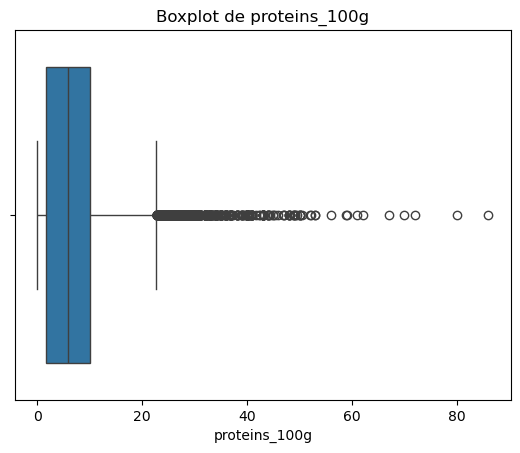

In [78]:
# Boxplot de la variable 'carbohydrates_100g'
sns.boxplot(x=X['proteins_100g'])
plt.title('Boxplot de proteins_100g')
plt.show()

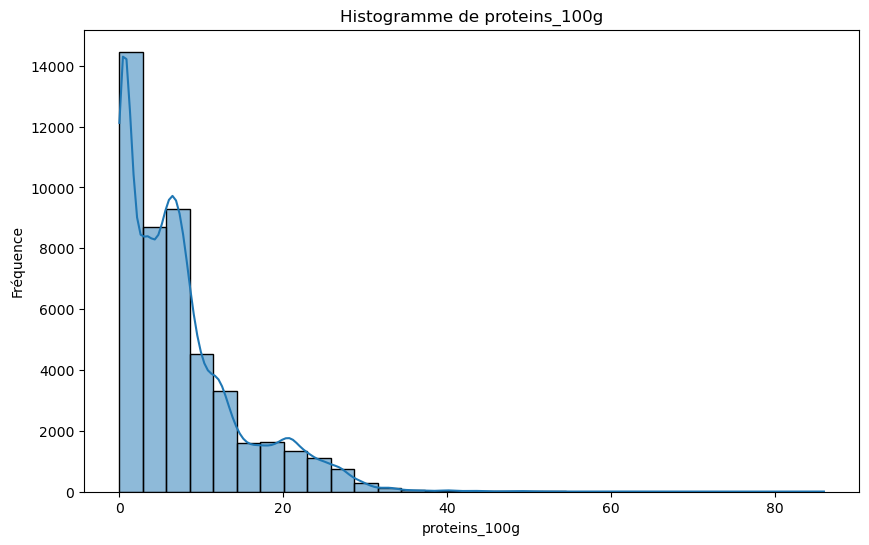

In [79]:
# Créer l'histogramme de 'proteins_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['proteins_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de proteins_100g')
plt.xlabel('proteins_100g')
plt.ylabel('Fréquence')
plt.show()

L'histogramme de la variable proteins_100g révèle une distribution asymétrique caractérisée par une longue queue à droite. Compte tenu de cette asymétrie, l'utilisation de l'intervalle interquartile (IQR) est préférable pour identifier les valeurs aberrantes. Cette méthode, moins influencée par les valeurs extrêmes, offre une analyse plus robuste que les approches basées sur l'écart-type.

#### Calcul de l'IQR pour la variable 'proteins_100g'

In [80]:
# Calcul des quartiles sur la colonne 'proteins_100g'
Q1 = X['proteins_100g'].quantile(0.25)
Q3 = X['proteins_100g'].quantile(0.75)

# Calcul de l'IQR
IQR = Q3 - Q1

# Calcul des bornes (seuils) pour les outliers
IQR_inf = Q1 - 1.5 * IQR  # Borne inférieure
IQR_sup = Q3 + 1.5 * IQR  # Borne supérieure

# Affichage des résultats
print(f"IQR inférieur : {IQR_inf}")
print(f"IQR supérieur : {IQR_sup}")

IQR inférieur : -10.900000000000002
IQR supérieur : 22.700000000000003


Interprétation : IQR inférieur (-10.9g) :Les valeurs inférieures à -10.9 g sont considérées comme aberrantes, mais dans ce contexte, étant donné que la teneur en proteines ne peut pas être négative, on peut ignorer cette borne inférieure.

IQR supérieur (22.7) : Toute valeur supérieure à 22.7g est considérée comme un outlier. Cela signifie que les valeurs de 'proteins_100g' supérieures à cette limite sont potentiellement aberrantes.

#### Identification et suppression des valeurs incohérentes

Après une analyse approfondie de la teneur en protéines des produits alimentaires, il apparaît qu'un produit peut contenir entre 0 g (par exemple, l'eau ou des boissons non nutritives) et 80 g de protéines pour 100 g (comme le seitan). Par conséquent, il est totalement incohérent de trouver des valeurs supérieures à 80 g dans nos données pour cette variable.

In [81]:
# Filtrer les lignes où 'proteins_100g ' supérieur à 80
produits_protein_sup = X[X['proteins_100g'] > 80]

# Afficher le nombre de lignes
print(f"Nombre de produits avec proteins_100g  supérieur à 80g : {produits_protein_sup.shape[0]}")

# Afficher les produits avec 'proteins_100g ' supérieur à 80
produits_protein_sup.head(50)

Nombre de produits avec proteins_100g  supérieur à 80g : 1


,code,product_name,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g
193318,3092718618971,Sirop Fraise,180.0,0.0,10.6,10.6,86.0,0.0


In [82]:
print(f"Nombre de valeurs NaN dans 'proteins_100g' avant remplacement' : {X['proteins_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'proteins_100g' avant remplacement' : 713


In [83]:
# Remplacer les valeurs incohérentes par NaN
X.loc[X['proteins_100g'] > 80, 'proteins_100g'] = np.nan

# Vérifier le résultat
print(f"Nombre de valeurs NaN dans 'proteins_100g' : {X['proteins_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'proteins_100g' : 714


#### Conclusion pour proteins_100g

Pour la variable proteins_100g, les valeurs comprises entre 0 g et 80 g sont cohérentes avec les données nutritionnelles. En effet, des produits comme l'eau ou des boissons non nutritives ne contiennent pas de protéines, tandis que des aliments très riches en protéines, tels que le seitan, peuvent atteindre un maximum d'environ 80 g de protéines pour 100 g. Par conséquent, toute valeur excédant cette limite est considérée comme incorrecte.

Cette analyse a conduit à la suppression d'un enregistrement pour cette variable.

### Identification des valeurs aberrantes pour salt_100g

#### Résumé statistique de salt_100g

In [84]:
# Résumé statistique de la variable 'salt_100g'
summary = X['salt_100g'].describe()

# Afficher le résumé
print(summary)

count    44975.000000
mean         0.904036
std          2.802245
min          0.000000
25%          0.076200
50%          0.530000
75%          1.200000
max        297.600000
Name: salt_100g, dtype: float64


Nous pouvons clairement repérer des incohérences dans les données. En effet, certaines valeurs de la variable salt_100g dépassent 100, ce qui n'est pas cohérent pour une mesure exprimant des quantités pour 100 g de produit. Nous allons donc identifier ces valeurs erronées et les supprimer.

In [85]:
# Identifier les lignes où les valeurs sont incohérentes (supérieures à 100)
erreurs = X[X['salt_100g'] > 100]

# Afficher les infos des lignes avec des erreurs
erreurs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, 176694 to 274767
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                3 non-null      object 
 1   product_name        3 non-null      object 
 2   energy_100g         3 non-null      float64
 3   fat_100g            3 non-null      float64
 4   carbohydrates_100g  3 non-null      float64
 5   sugars_100g         3 non-null      float64
 6   proteins_100g       3 non-null      float64
 7   salt_100g           3 non-null      float64
dtypes: float64(6), object(2)
memory usage: 216.0+ bytes


Il y a 3 lignes avec des valeurs de salt_100g >100

In [86]:
print(f"Nombre de valeurs NaN dans 'salt_100g' avant remplacement' : {X['salt_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'salt_100g' avant remplacement' : 3005


In [87]:
# Remplacer les valeurs incohérentes par NaN
X.loc[X['salt_100g'] > 100, 'salt_100g'] = np.nan

# Vérifier le résultat
print(f"Nombre de valeurs NaN dans 'salt_100g' : {X['salt_100g'].isna().sum()}")

Nombre de valeurs NaN dans 'salt_100g' : 3008


#### Graphiques pour visualiser les valeurs extrêmes salt_100g

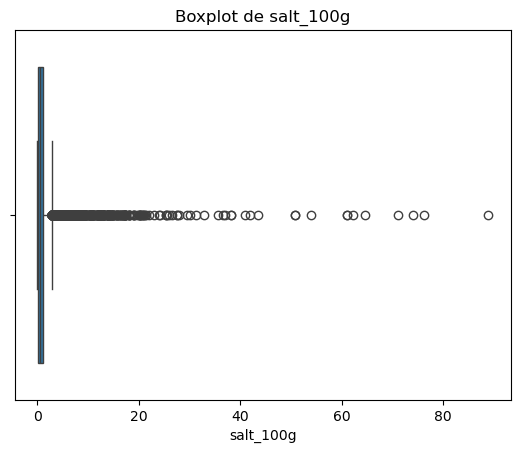

In [88]:
# Boxplot de la variable 'salt_100g'
sns.boxplot(x=X['salt_100g'])
plt.title('Boxplot de salt_100g')
plt.show()

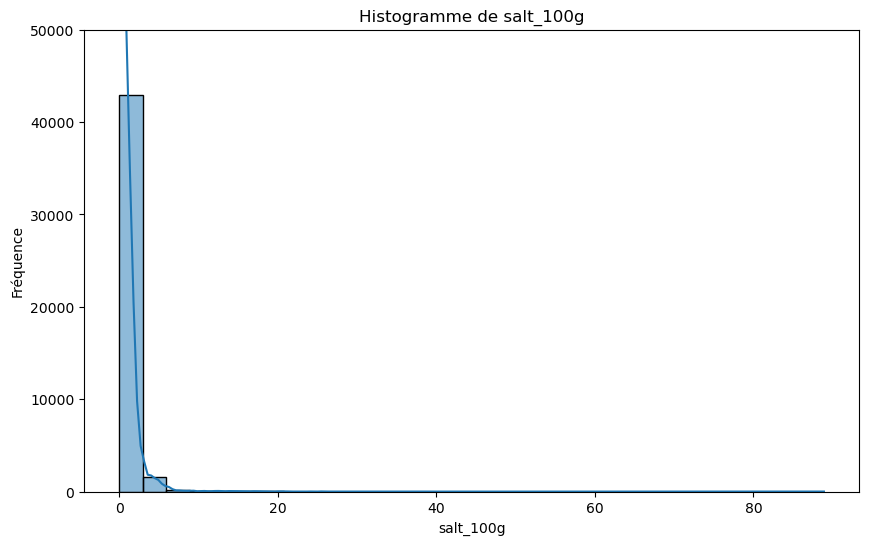

In [89]:
# Créer l'histogramme de 'salt_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['salt_100g'], kde=True, bins=30)
plt.ylim(0, 50000)  # Limiter l'axe des ordonnées à 50 000
plt.title('Histogramme de salt_100g')
plt.xlabel('salt_100g')
plt.ylabel('Fréquence')
plt.show()

L'histogramme de la variable salt_100g présente une distribution asymétrique avec une longue queue à droite. En raison de cette asymétrie, l'utilisation de l'intervalle interquartile (IQR) s'avère plus appropriée pour identifier les valeurs aberrantes, car cette méthode est moins influencée par les valeurs extrêmes, contrairement aux approches basées sur l'écart-type.

#### Calcul de l'IQR pour la variable 'salt_100g'

In [90]:
# Calcul des quartiles sur la colonne 'salt_100g'
Q1 = X['salt_100g'].quantile(0.25)
Q3 = X['salt_100g'].quantile(0.75)

# Calcul de l'IQR
IQR = Q3 - Q1

# Calcul des bornes (seuils) pour les outliers
IQR_inf = Q1 - 1.5 * IQR  # Borne inférieure
IQR_sup = Q3 + 1.5 * IQR  # Borne supérieure

# Affichage des résultats
print(f"IQR inférieur : {IQR_inf}")
print(f"IQR supérieur : {IQR_sup}")

IQR inférieur : -1.6094999999999997
IQR supérieur : 2.8857


Interprétation :<br>

IQR inférieur (-1,6 g) : Bien que les valeurs inférieures à -1,6 g soient considérées comme aberrantes, elles peuvent être ignorées dans ce contexte, car la teneur en sucre ne peut pas être négative.<br>

IQR supérieur (2,89 g) : Toute valeur supérieure à 2,89 g est considérée comme une valeur aberrante. Cela signifie que les valeurs de salt_100g au-delà de cette limite sont potentiellement suspectes et nécessitent une vérification.

#### Conclusion pour salt_100g

Après analyse, il s'avère qu'un produit alimentaire peut contenir entre 0 g et 100 g de sel pour 100 g, reflétant ainsi la diversité des catégories alimentaires. Par exemple, des produits comme l'eau ou le quinoa peuvent contenir 0 g de sel. En revanche, certains produits comme le sel de table peuvent atteindre 100 g de sel pour 100 g, étant constitués uniquement de chlorure de sodium.

Ainsi, les valeurs observées dans nos données, comprises entre 0 et 100 g de sel pour 100 g, sont en accord avec les attentes nutritionnelles. Par conséquent, aucune correction supplémentaire n'est nécessaire pour ces valeurs.

Cependant, cette étude des valeurs aberrantes nous a permis de détecter et de supprimer trois enregistrements incohérents où la teneur en sel dépassait 100 g pour 100 g, ce qui est physiquement impossible et donc non représentatif de tout produit alimentaire réel.

### Automatisation du traitement des valeurs incohérentes

In [91]:
def traitement_valeurs_aberrantes(DataFrame):
    
# Etape 1: traiter les erreurs pour les données <0
    # Liste des colonnes à nettoyer
    colonnes_a_nettoyer_inf = ['energy_100g', 'fat_100g', 'carbohydrates_100g', 
                           'sugars_100g', 'proteins_100g', 'salt_100g']

    # Nettoyer chaque colonne
    for colonne in colonnes_a_nettoyer_inf:
        DataFrame[colonne] = DataFrame[colonne].apply(lambda x: x if x >= 0 else np.nan)

# Etape 2: traiter les erreurs pour les données >100
    colonnes_a_nettoyer_sup = ['fat_100g', 'carbohydrates_100g', 'sugars_100g', 'salt_100g']

    # Nettoyer chaque colonne
    for colonne in colonnes_a_nettoyer_sup:
        DataFrame[colonne] = DataFrame[colonne].apply(lambda x: x if x <= 100 else np.nan)

# Etape 3: traiter les erreurs pour la limite supérieure d'energy_100g
    DataFrame.loc[DataFrame['energy_100g'] > 3900, 'energy_100g'] = np.nan
    
# Etape 4: traiter les erreurs pour la limite supérieure de proteins_100g
    DataFrame.loc[DataFrame['proteins_100g'] > 80, 'proteins_100g'] = np.nan

# Etape 5: Traitement des valeurs de sugars_100g > carbohydrates_100g
    # Calcul de l'écart entre sucres et carbohydrates
    DataFrame['ecart'] = DataFrame['sugars_100g'] - DataFrame['carbohydrates_100g']

    # Conditions pour établir `est_acceptable` (y compris NaN)
    DataFrame['est_acceptable'] = np.where(DataFrame['ecart'].isna(), 'oui', np.where(DataFrame['ecart'] <= 0, 'oui', 'non'))

    # Ajouter 20% des carbohydrates pour créer la valeur `carb_max_possible`
    DataFrame['carb_max_possible'] = (DataFrame['carbohydrates_100g'] * 1.2).round(3)

    # Diminuer 20% des sucres pour créer la valeur `min_sucre_possible`
    DataFrame['min_sucre_possible'] = (DataFrame['sugars_100g'] * 0.8).round(3)

    # Ajuster `est_acceptable` en fonction des conditions supplémentaires
    DataFrame.loc[DataFrame['carb_max_possible'] >= DataFrame['min_sucre_possible'], 'est_acceptable'] = 'oui'

    # Masque pour remplacer les valeurs incohérentes lorsque `ecart` est inférieur ou égale à 0.5
    mask_ecart_inf_0_5 = (DataFrame['est_acceptable'] == 'non') & (DataFrame['ecart'].abs() <= 0.5)
    DataFrame.loc[mask_ecart_inf_0_5, 'sugars_100g'] = np.NaN

    # Masque pour supprimer les lignes avec des écarts trop grands
    mask_ecart_sup_0_5 = (DataFrame['est_acceptable'] == 'non') & (DataFrame['ecart'].abs() > 0.5)
    DataFrame = DataFrame[~mask_ecart_sup_0_5]

    # Suppression des colonnes temporaires après traitement
    DataFrame = DataFrame.copy()  # Assure une copie complète pour éviter SettingWithCopyWarning
    DataFrame.drop(columns=['ecart', 'carb_max_possible', 'min_sucre_possible', 'est_acceptable'], inplace=True)
    
    return DataFrame 

In [92]:
Z = traitement_valeurs_aberrantes(Z)

In [93]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47980 entries, 174 to 320751
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                47980 non-null  object 
 1   product_name        47746 non-null  object 
 2   energy_100g         47675 non-null  float64
 3   fat_100g            45166 non-null  float64
 4   carbohydrates_100g  45110 non-null  float64
 5   sugars_100g         44821 non-null  float64
 6   proteins_100g       47266 non-null  float64
 7   salt_100g           44972 non-null  float64
dtypes: float64(6), object(2)
memory usage: 3.3+ MB


In [94]:
Z.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47980 entries, 174 to 320751
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   energy_100g         47675 non-null  float64
 1   fat_100g            45166 non-null  float64
 2   carbohydrates_100g  45110 non-null  float64
 3   sugars_100g         44821 non-null  float64
 4   proteins_100g       47266 non-null  float64
 5   salt_100g           44972 non-null  float64
dtypes: float64(6)
memory usage: 2.6 MB


Les deux tableaux X et Z sont identiques. Mon automatisation fonctionne.

## Identification et traitement des valeurs manquantes

### Recherche et suppression des lignes entièrement nulles

Dans le cadre de l’analyse des données, il est fréquent de rencontrer des lignes où toutes les valeurs sont manquantes. Ces lignes ne contiennent aucune information exploitable dans les colonnes d’intérêt et peuvent être considérées comme inutiles pour l’analyse.

La présence de telles lignes peut compliquer certaines étapes de traitement ou biaiser des analyses statistiques ultérieures. Par conséquent, il est pertinent de les supprimer afin d'améliorer la qualité et la clarté des données.

Dans notre cas, nous ciblons spécifiquement les colonnes energy_100g, fat_100g, carbohydrates_100g, sugars_100g, proteins_100g, et salt_100g. La suppression des lignes entièrement nulles dans ces colonnes permettra d’épurer le dataset tout en conservant les informations partielles, qui pourront être exploitées après traitement des valeurs manquantes.

In [95]:
# Liste des colonnes concernées
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g']

# Vérifier le nombre de lignes avec uniquement des NaN dans ces colonnes
nb_lignes_vides = X[colonnes_concernees][X[colonnes_concernees].isnull().all(axis=1)].shape[0]
print(f"Nombre de lignes avec uniquement des NaN dans les colonnes analysées : {nb_lignes_vides}")

Nombre de lignes avec uniquement des NaN dans les colonnes analysées : 1


In [96]:
print(f"Nombre de lignes avant suppression des lignes vides dans les colonnes analysées : {X.shape[0]}")

# Supprimer les lignes avec uniquement des NaN dans les colonnes spécifiées
X = X[~X[colonnes_concernees].isnull().all(axis=1)]

# Vérifier le résultat
print(f"Nombre de lignes après suppression des lignes vides dans les colonnes analysées : {X.shape[0]}")

Nombre de lignes avant suppression des lignes vides dans les colonnes analysées : 47980
Nombre de lignes après suppression des lignes vides dans les colonnes analysées : 47979


### Identification du type des données manquantes

Dans toute analyse de données, il est essentiel de comprendre pourquoi certaines valeurs sont manquantes. Cette étape permet de déterminer si les données manquantes sont aléatoires ou si elles suivent un motif systématique. Identifier ce motif est crucial pour choisir la meilleure stratégie de traitement, car des approches inadéquates pourraient introduire des biais ou altérer la qualité des résultats.<br>
Dans le cadre de l'analyse des données pour le projet avec Santé publique France, il est essentiel de comprendre les valeurs manquantes présentes dans les différentes colonnes de la base de données. Les valeurs manquantes peuvent être dues à des erreurs de saisie, des produits incomplets ou des omissions volontaires/non intentionnelles.

Il existe trois types de motifs de données manquantes :<br>

**MCAR (Missing Completely At Random)** : Les données sont manquantes de manière totalement aléatoire, sans lien avec d'autres variables ou les valeurs elles-mêmes.<br>
**MAR (Missing At Random)** : Les données manquantes sont liées à d'autres variables observées dans le dataset.<br>
**MNAR (Missing Not At Random)** : Les données manquantes dépendent directement de la variable elle-même (par exemple, les revenus manquants pour des individus ayant des revenus très élevés).<br>

Le choix de la méthode de traitement dépend donc du type de données manquantes identifié :<br>
Pour les données MCAR, des méthodes simples comme l'imputation par la moyenne ou la médiane peuvent suffire.<br>
Pour les données MAR, des techniques plus avancées comme l'imputation multiple ou les méthodes basées sur le maximum de vraisemblance sont recommandées.<br>
Pour les données MNAR, des approches spécifiques au domaine d'étude, prenant en compte les raisons de l'absence des données, sont nécessaires.<br>
Une mauvaise identification du motif des données manquantes peut conduire à l'utilisation de méthodes inappropriées, introduisant ainsi des biais dans l'analyse et compromettant la validité des conclusions tirées des données.<br>

L'objectif de cette étape est donc de détecter et d'analyser ces motifs pour orienter la méthode de traitement des valeurs manquantes. Cela inclut des analyses visuelles, statistiques et contextuelles pour tirer des conclusions précises et adaptées au domaine d'étude.

In [97]:
# Compter le nombre de lignes avec au moins une valeur manquante dans les colonnes concernées
nb_lignes_manquantes = X[colonnes_concernees].isnull().any(axis=1).sum()

print(f"Nombre de lignes avec des données manquantes dans les colonnes concernées : {nb_lignes_manquantes}")

# Afficher les premières lignes avec des NaN dans les colonnes concernées
X[X[colonnes_concernees].isnull().any(axis=1)].head()  # Affiche les lignes avec des NaN

Nombre de lignes avec des données manquantes dans les colonnes concernées : 6332


,code,product_name,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g
186,0000008240095,Pâté au poulet,751.0,10.2,16.6,NaN,33.9,0.735
239,0000084154071,Salsa de mostaza,320.0,3.5,7.5,NaN,3.6,NaN
463,00013628,Chicken pad thaï,619.0,NaN,NaN,2.9,8.4,0.750
664,00071543,Aloe Vera Grape & Apple Juice,155.0,NaN,NaN,8.5,0.1,0.100
886,00088978,Fresh Drinking Coconut,0.0,NaN,NaN,0.0,0.0,0.000


#### Visualisation des valeurs manquantes

<Figure size 1200x600 with 0 Axes>

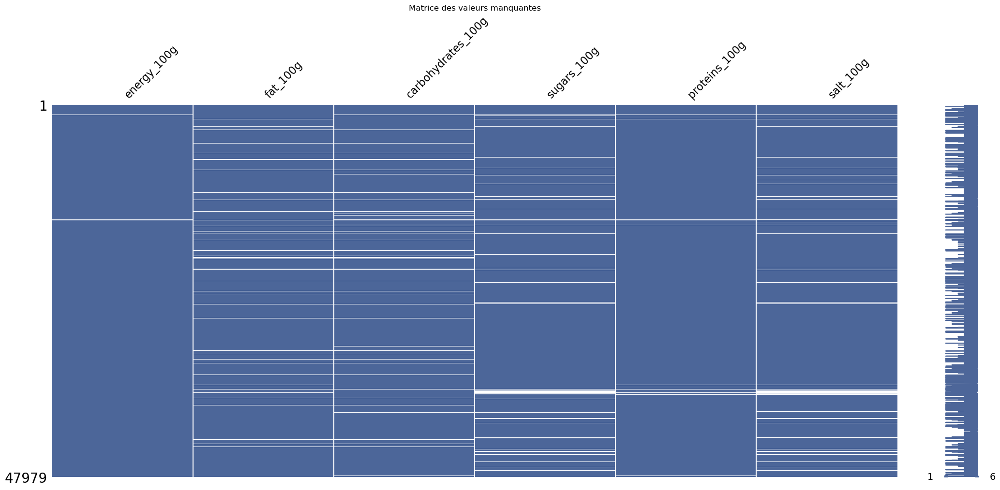

In [98]:
# Sélectionner uniquement ces colonnes dans X
X_concernees = X[colonnes_concernees]

# Afficher la matrice des valeurs manquantes
plt.figure(figsize=(12, 6))
msno.matrix(X_concernees, color=(0.3, 0.4, 0.6))
plt.title("Matrice des valeurs manquantes")
plt.show()

#### Identification des données manquantes

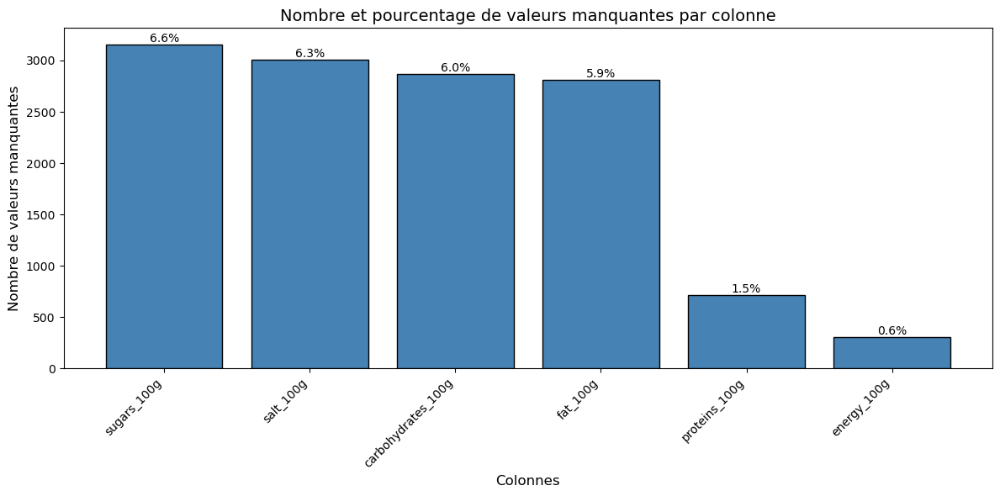

In [99]:
# Calculer le nombre de valeurs manquantes par colonne
missing_values = X_concernees.isnull().sum()

# Calculer le pourcentage de valeurs manquantes par colonne
missing_percentages = (missing_values / len(X_concernees)) * 100

# Trier les colonnes par nombre de valeurs manquantes
missing_values_sorted = missing_values.sort_values(ascending=False)
missing_percentages_sorted = missing_percentages[missing_values_sorted.index]

# Créer le barplot
plt.figure(figsize=(12, 6))
bars = plt.bar(missing_values_sorted.index, missing_values_sorted, color='steelblue', edgecolor='black')

# Ajouter les pourcentages au-dessus des barres
for bar, percentage in zip(bars, missing_percentages_sorted):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # Position en x
        height,  # Position en y (hauteur de la barre)
        f"{percentage:.1f}%",  # Texte (pourcentage)
        ha='center',  # Alignement horizontal
        va='bottom',  # Alignement vertical
        fontsize=10,  # Taille de la police
        color='black'  # Couleur du texte
    )

# Ajouter les titres et les labels
plt.title("Nombre et pourcentage de valeurs manquantes par colonne", fontsize=14)
plt.xlabel("Colonnes", fontsize=12)
plt.ylabel("Nombre de valeurs manquantes", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout() 
plt.show()

Les résultats de l'analyse des valeurs manquantes montrent que la colonne "sugars_100g" présente le pourcentage le plus élevé de valeurs manquantes (6,58%), suivie par "salt_100g" (6,27%) et "carbohydrates_100g" (5,98%). Les autres colonnes, telles que "fat_100g" (5,87%) et "proteins_100g" (1,49%), présentent des pourcentages de valeurs manquantes plus faibles. Enfin, "energy_100g" a le pourcentage le plus bas de valeurs manquantes (0,63%).

Ces pourcentages nous indiquent quelles variables nécessitent une attention particulière, mais ils ne nous donnent pas d'information sur les motifs des données manquantes. Pour analyser la structure des données manquantes, une étape supplémentaire est nécessaire pour examiner si certaines colonnes manquent de données simultanément, ce qui pourrait révéler un motif systématique dans les valeurs manquantes.

#### Analyse des distributions avec ou sans valeurs manquantes dans les autres variables

Afin d'identifier le type des valeurs manquantes, il est nécessaire d'explorer leurs distributions et leurs relations avec les autres variables. <br>
Le code analyse donc, pour chaque colonne concernée, la distribution des valeurs manquantes et la distribution des valeurs complètes. Cela permet d'observer des différences éventuelles et d'identifier le type des valeurs manquantes.

In [100]:
# Parcourir uniquement les colonnes concernées pour afficher les statistiques descriptives
for col in colonnes_concernees:
    print(f"\n--- {col} ---")
    # Distribution des valeurs manquantes
    print("Distribution de", col, "avec valeurs manquantes dans les autres colonnes :")
    print(X[X.isnull().any(axis=1)][col].describe())

    # Distribution des valeurs sans valeurs manquantes
    print("\nDistribution de", col, "sans valeurs manquantes :")
    print(X[~X.isnull().any(axis=1)][col].describe())
    print("-" * 50)


--- energy_100g ---
Distribution de energy_100g avec valeurs manquantes dans les autres colonnes :
count    6229.000000
mean      996.090738
std       807.938578
min         0.000000
25%       251.000000
50%       840.000000
75%      1529.000000
max      3830.000000
Name: energy_100g, dtype: float64

Distribution de energy_100g sans valeurs manquantes :
count    41446.000000
mean      1085.064385
std        757.088117
min          0.000000
25%        398.000000
50%        994.000000
75%       1657.750000
max       3883.000000
Name: energy_100g, dtype: float64
--------------------------------------------------

--- fat_100g ---
Distribution de fat_100g avec valeurs manquantes dans les autres colonnes :
count    3720.000000
mean       13.619180
std        19.179693
min         0.000000
25%         0.700000
50%         4.700000
75%        21.000000
max       100.000000
Name: fat_100g, dtype: float64

Distribution de fat_100g sans valeurs manquantes :
count    41446.000000
mean        12.

**Energy (kJ/100g)**
La moyenne avec valeurs manquantes est significativement inférieure à celle sans valeurs manquantes, ce qui suggère que les produits à haute teneur énergétique (valeurs élevées) peuvent être sous-représentés dans l'échantillon avec des valeurs manquantes.
Type probable: Données Manquantes Aléatoirement (MAR), car les produits avec une très haute énergie pourraient être moins souvent enregistrés ou mesurés.

**Fat (g/100g)**
La moyenne est légèrement plus élevée dans l'échantillon avec des valeurs manquantes, ce qui pourrait indiquer que les produits plus riches en graisses ont plus de chances d'avoir des données manquantes.
Type probable: Données Manquantes Non Aléatoirement (MNAR), car cela pourrait indiquer un biais lié à la richesse en graisses.

**Carbohydrates (g/100g)**
La moyenne est plus basse avec des valeurs manquantes, ce qui peut suggérer que les produits riches en glucides sont moins souvent enregistrés.
Type probable: Données Manquantes Aléatoirement (MAR), car cela pourrait être lié à d'autres variables observables.

**Sugars (g/100g)**
La moyenne est plus élevée dans l'échantillon avec des valeurs manquantes, suggérant que les produits très sucrés sont plus susceptibles d'avoir des données manquantes.
Type probable: Données Manquantes Non Aléatoirement (MNAR), car cela pourrait indiquer un biais systématique lié à la teneur en sucre.

**Proteins (g/100g)**
La différence de moyenne est faible, ce qui indique que les données manquantes ne semblent pas affecter de manière significative la distribution des protéines.
Type probable: Données Manquantes Complètement Aléatoires (MCAR), car il n'y a pas de tendance évidente dans les moyennes.

**Salt (g/100g)**
Conclusion sur les Données Manquantes
La moyenne est légèrement inférieure avec des valeurs manquantes, mais la différence est minime.
Type probable: Données Manquantes Complètement Aléatoires (MCAR), car il n’y a pas de biais évident dans la distribution du sel.

**Conclusion** :
Les valeurs manquantes ne présentent pas de schémas systématiques majeurs. Des différences significatives pour certaines colonnes, notamment pour energy_100g, nécessitent une investigation approfondie, tandis que les autres valeurs montrent des distributions cohérentes, avec de petites variations attribuables à des différences entre produits ou des erreurs de mesure.

#### Test MCAR de little

Le **test de Little** est une méthode statistique conçue pour évaluer si les données manquantes dans un ensemble de données sont de type MCAR (Missing Completely At Random). Ce test multivarié compare les moyennes observées des variables pour chaque modèle de données manquantes avec les moyennes attendues de la population, estimées à l'aide de l'algorithme EM (Expectation-Maximization).<br>

Le test de Little calcule une statistique qui suit asymptotiquement une distribution chi-carré sous l'hypothèse nulle que les données sont MCAR. Un résultat statistiquement significatif fournit des preuves contre l'hypothèse MCAR, suggérant que les données manquantes pourraient être MAR (Missing At Random) ou MNAR (Missing Not At Random).<br>

In [101]:
colonnes_quanti = ['energy_100g', 'fat_100g', 'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g']

X_quanti = X[colonnes_quanti]

result = mcar_little_test(X_quanti)
print(f"Résultat du test de Little : {result}")

Résultat du test de Little : 0.0


Le test de Little a été réalisé pour évaluer si les données manquantes dans notre ensemble de données sont distribuées de manière aléatoire (MCAR). Les résultats ont révélé une p-value de 0, ce qui indique un rejet fort de l'hypothèse nulle. 

Par conséquent, nous pouvons conclure que **les données manquantes ne sont pas MCAR**. Cela suggère qu'il existe probablement un biais systématique dans la distribution des valeurs manquantes, ce qui pourrait être lié à d'autres variables présentes dans l'ensemble de données. Cette information est cruciale pour le choix des méthodes d'imputation ou d'analyse des données manquantes, car elle souligne la nécessité d'explorer plus en profondeur les relations entre les variables afin de comprendre l'origine des valeurs manquantes.<br>

Pour approfondir notre compréhension des données manquantes et explorer les relations potentielles entre elles, nous allons examiner la matrice de corrélation des valeurs manquantes. 

#### Matrice de corrélation des valeurs manquantes

Dans cette étape, nous allons visualiser la corrélation entre les valeurs manquantes dans les colonnes sélectionnées pour mieux comprendre s'il existe des relations entre les données manquantes. Pour ce faire, nous allons créer une matrice de corrélation binaire des NaN, où chaque cellule représente la corrélation entre deux colonnes en termes de valeurs manquantes. Une forte corrélation entre les valeurs manquantes de différentes variables pourrait indiquer que certaines d'entre elles sont liées et que leur absence pourrait être influencée par des facteurs communs.

La matrice de corrélation sera ensuite affichée sous forme de heatmap, facilitant ainsi l'interprétation visuelle des relations entre les colonnes concernées. Cela nous permettra de mieux cibler les colonnes potentiellement liées aux données manquantes et d'adopter des stratégies de traitement adaptées.

Le test Little, permet d’affirmer de manière formelle si les données manquantes d’une base de données sont MCAR ou pas

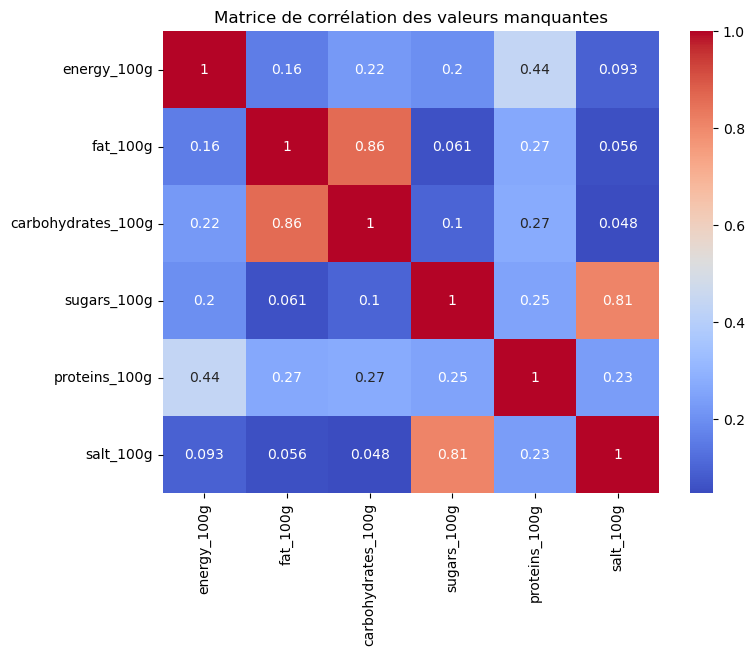

In [102]:
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Calcul de la matrice de corrélation des valeurs manquantes
corr_matrix = df.isnull().corr()

# Affichage de la matrice
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', cbar=True)
plt.title("Matrice de corrélation des valeurs manquantes")
plt.show()

In [103]:
# Charger les colonnes concernées
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Calcul de la matrice de corrélation des données manquantes
corr_matrix = df.isnull().corr()

# Afficher les valeurs de la matrice de corrélation
print("Matrice de corrélation des données manquantes :")
print(corr_matrix)

Matrice de corrélation des données manquantes :
                    energy_100g  fat_100g  carbohydrates_100g  sugars_100g  \
energy_100g            1.000000  0.157849            0.224689     0.197021   
fat_100g               0.157849  1.000000            0.859370     0.061483   
carbohydrates_100g     0.224689  0.859370            1.000000     0.100732   
sugars_100g            0.197021  0.061483            0.100732     1.000000   
proteins_100g          0.437408  0.265574            0.272699     0.251523   
salt_100g              0.093146  0.056260            0.047942     0.807354   

                    proteins_100g  salt_100g  
energy_100g              0.437408   0.093146  
fat_100g                 0.265574   0.056260  
carbohydrates_100g       0.272699   0.047942  
sugars_100g              0.251523   0.807354  
proteins_100g            1.000000   0.234758  
salt_100g                0.234758   1.000000  


Interprétation des corrélations dans les données manquantes:

**Corrélations élevées (proches de 1)** :<br>
Une forte corrélation entre les valeurs manquantes de deux variables indique que ces colonnes ont tendance à manquer simultanément. Cela peut s'expliquer par une origine commune des données manquantes, comme des catégories d'aliments mal renseignées ou des omissions dans les étiquettes nutritionnelles.<br>
**fat_100g ↔ carbohydrates_100g (0.86)** : Les deux variables semblent très fortement liées en termes de valeurs manquantes.<br>
**sugars_100g ↔ salt_100g (0.81)** : Relation forte également.<br>

**Corrélations faibles (proches de 0)** :<br>
Des corrélations faibles ou nulles montrent que les absences dans ces colonnes sont indépendantes.<br>
Par exemple :<br>
carbohydrates_100g ↔ salt_100g (0.04).<br>
fat_100g ↔ salt_100g (0.06).<br>
Cela signifie que ces colonnes peuvent être traitées séparément.<br>

**Corrélations modérées (entre 0.2 et 0.5)** :<br>
Ces valeurs suggèrent un lien moins marqué, mais à ne pas négliger.<br>
energy_100g ↔ proteins_100g (0.44).<br>
energy_100g ↔ carbohydrates_100g (0.22).<br>
fat_100g ↔ proteins_100g (0.27).<br>
carbohydrates_100g ↔ proteins_100g (0.27).<br>
sugars_100g ↔ proteins_100g (0.25).<br>
salt_100g ↔ proteins_100g (0.23).<br>

### Imputation de sugars_100g

Les sucres simples (sugars_100g) sont une sous-partie des glucides (carbohydrates_100g). Par exemple, un produit peut contenir des sucres simples (comme du glucose ou du fructose) et des sucres complexes (comme l'amidon).
Un produit très riche en glucides a souvent une part importante en sucres simples.<br>

Si sugars_100g est manquant mais carbohydrates_100g est présent, on peut estimer les sucres comme une proportion des glucides totaux:<br>
Calculer la proportion moyenne de sucres dans les glucides pour les lignes où sugars_100g et carbohydrates_100g sont présents :<br>

**Proportion moyenne = sugars_100g / carbohydrates_100g**

Appliquer cette proportion moyenne aux produits où sugars_100g est manquant :<br>

**sugar_estimé = proportion moyenne x carbohydrates_100g**<br>

Si la moyenne est biaisée par des valeurs extrêmes, nous utiliserons la médiane pour éviter que les valeurs aberrantes influencent notre estimation.

#### Calcul des proportions sugars_100g / carbohydrates_100g 

Pour traiter les valeurs manquantes dans la colonne sugars_100g en fonction des données disponibles dans carbohydrates_100g, nous avons entrepris une analyse exploratoire visant à évaluer si la moyenne ou la médiane est plus adaptée comme estimation. Cette étape est essentielle pour déterminer si des valeurs extrêmes ou des outliers influencent de manière significative la moyenne, ce qui pourrait biaiser nos imputations.<br>

Nous avons tout d'abord filtré les données pour ne conserver que les lignes où sugars_100g et carbohydrates_100g sont renseignés. Ensuite, nous avons exclu les cas où carbohydrates_100g est égal à zéro, car cela provoquerait des divisions par zéro, entraînant des valeurs infinies dans le calcul de la proportion.<br>

Pour chaque produit, nous avons calculé la proportion de sucres par rapport aux glucides totaux en utilisant la formule suivante :<br>

**Proportion moyenne = sugars_100g / carbohydrates_100g**<br>

Enfin, nous avons calculé la moyenne et la médiane de cette proportion pour évaluer leur pertinence en tant qu'estimation. Si la moyenne diffère fortement de la médiane, cela indiquerait que la distribution est influencée par des valeurs extrêmes, et la médiane serait alors privilégiée comme estimateur plus robuste.

In [104]:
# Filtrer les données valides
donnees_valides = X[X['sugars_100g'].notna() & X['carbohydrates_100g'].notna()]

# Exclure les lignes où carbohydrates_100g est nul
donnees_valides = donnees_valides[donnees_valides['carbohydrates_100g'] > 0]

# Calculer la proportion
donnees_valides['proportion_sugars'] = donnees_valides['sugars_100g'] / donnees_valides['carbohydrates_100g']

# Moyenne et médiane
moyenne = donnees_valides['proportion_sugars'].mean()
mediane = donnees_valides['proportion_sugars'].median()

#print(f"Moyenne : {moyenne}")
#print(f"Médiane : {mediane}")
donnees_valides['proportion_sugars'].describe()

count    41123.000000
mean         0.561335
std          0.373419
min          0.000000
25%          0.165049
50%          0.615385
75%          0.943662
max          1.500000
Name: proportion_sugars, dtype: float64

Différence entre moyenne et médiane :<br>
**La médiane est légèrement plus élevée que la moyenne**, ce qui suggère une distribution légèrement asymétrique avec quelques produits où la proportion de sucres simples dans les glucides est plus faible (ces valeurs extrêmes tirant la moyenne vers le bas).<br>

Distribution et biais potentiel :<br>
Ici, **la médiane semble être une estimation plus robuste** et pourrait donc être privilégiée pour imputer les valeurs manquantes dans la colonne sugars_100g.

#### Visualisation de la distribution de proportion_sugars

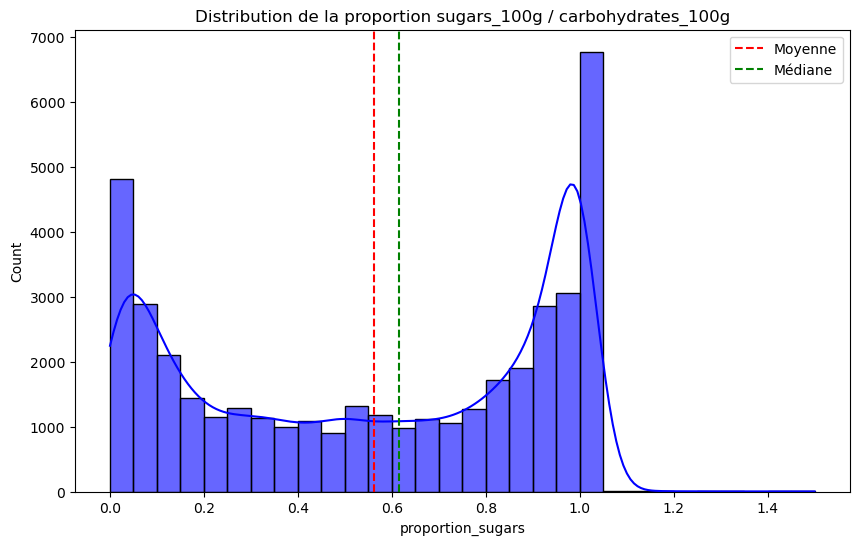

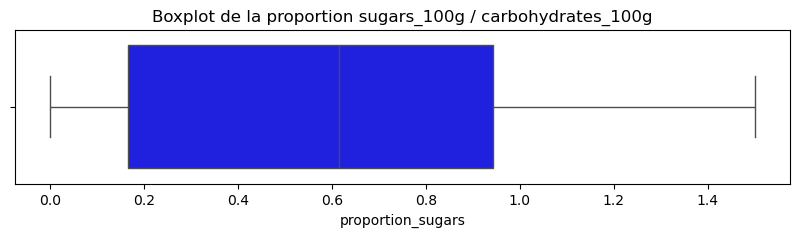

In [105]:
# Histogramme
plt.figure(figsize=(10, 6))
sns.histplot(donnees_valides['proportion_sugars'], bins=30, kde=True, color='blue', alpha=0.6)
plt.axvline(moyenne, color='red', linestyle='--', label='Moyenne')
plt.axvline(mediane, color='green', linestyle='--', label='Médiane')
plt.title("Distribution de la proportion sugars_100g / carbohydrates_100g")
plt.legend()
plt.show()

# Boxplot
plt.figure(figsize=(10, 2))
sns.boxplot(x=donnees_valides['proportion_sugars'], color='blue')
plt.title("Boxplot de la proportion sugars_100g / carbohydrates_100g")
plt.show()

Histogramme :<br>
La distribution montre une forme en U, avec une concentration des proportions autour de valeurs faibles (proche de 0) et élevées (près de 1).<br>
Les proportions intermédiaires (entre 0.3 et 0.7) sont relativement moins fréquentes.<br>
Les lignes de la moyenne (rouge) et de la médiane (vert) permettent de visualiser la position de ces statistiques par rapport à la distribution.<br>

Boxplot :<br>
Le boxplot ne met pas en évidence de valeurs extrêmes significatives.<br>
La répartition des données montre une plage interquartile (entre 25 % et 75 %) assez large, indiquant une grande variabilité des proportions.

#### Mesure de l'asymétrie de proportion_sugars

Dans cette étape de l'analyse des données, nous souhaitons évaluer l'asymétrie de la distribution des proportions de sucres par rapport aux glucides (proportion_sugars).<br> 

**L'asymétrie, mesurée par le skewness (ou coefficient d'asymétrie)**, est une caractéristique importante pour comprendre si les données suivent une distribution symétrique ou si elles sont biaisées vers un côté.

Un skewness positif indique que la distribution des données est asymétrique à droite, c'est-à-dire qu'il y a quelques valeurs élevées qui influencent la moyenne. À l'inverse, un skewness négatif signifie que la distribution est asymétrique à gauche, avec une prépondérance de valeurs faibles. Si le skewness est proche de zéro, cela suggère une distribution symétrique

In [106]:
skewness = skew(donnees_valides['proportion_sugars'].dropna())
print(f"Asymétrie (skewness) : {skewness}")

Asymétrie (skewness) : -0.195570880509552


L'asymétrie est de -0.19, ce qui indique une distribution presque symétrique, avec un léger biais vers la gauche (plus de valeurs légèrement inférieures à la moyenne).

Lien avec la différence entre la moyenne et la médiane :
La moyenne (0.56) étant inférieure à la médiane (0.6154) dans ce cas, ce petit skew négatif correspond à l'idée qu'il y a quelques valeurs plus faibles qui influencent la moyenne et la tirent vers le bas, mais de façon modérée.<br>

**Conclusion** :<br>
L'asymétrie négative montre que **la médiane reste une meilleure statistique** pour représenter la tendance centrale, car elle est moins influencée par les valeurs faibles qui tirent la moyenne vers le bas. Par conséquent, choisir la médiane pour l'imputation des valeurs manquantes est une option judicieuse dans ce contexte.

#### Analyse de la corrélation de sugars_100g avec les autres variables

Avant d'imputer les valeurs manquantes de sugars_100g, il est essentiel d'examiner ses corrélations avec les autres variables. Cette analyse permet de s'assurer que l'imputation ne modifie pas les relations existantes entre sugars_100g et les autres attributs, préservant ainsi la structure et les liens importants des données.

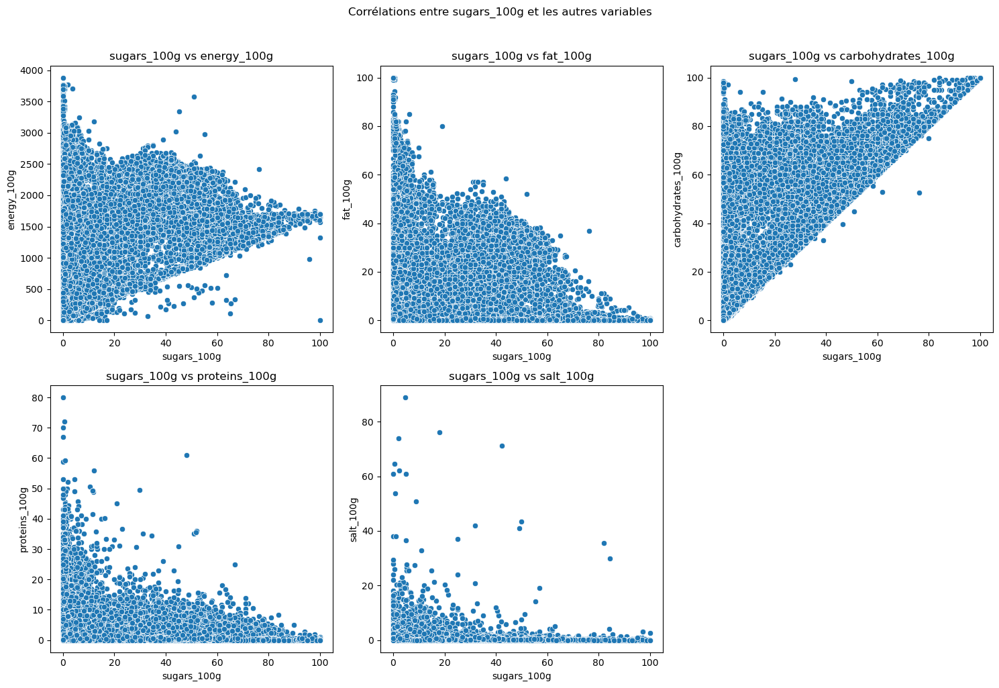

In [107]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à sugars_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre sugars_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf sugars_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'sugars_100g']):
    sns.scatterplot(data=df, x='sugars_100g', y=col, ax=axes[i])
    axes[i].set_title(f'sugars_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

Comme les nuages de points ne révèlent **pas de relation linéaire** entre sugars_100g et les autres variables, il est préférable d’utiliser une corrélation de Spearman. Cette méthode évalue les relations non linéaires et est moins sensible aux valeurs aberrantes. En examinant les corrélations de Spearman, on peut mieux comprendre les associations monotones entre sugars_100g et les autres variables, ce qui peut être crucial pour choisir les caractéristiques pertinentes lors de l'imputation.

In [108]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'sugars_100g'
variables_quanti = ['salt_100g', 'energy_100g', 'proteins_100g', 'fat_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['sugars_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'sugars_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['sugars_100g', variables_quanti]
print(correlation_salt_subset)

salt_100g            -0.376397
energy_100g           0.263152
proteins_100g        -0.329684
fat_100g             -0.014714
carbohydrates_100g    0.639735
Name: sugars_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'sugars_100g'"}>

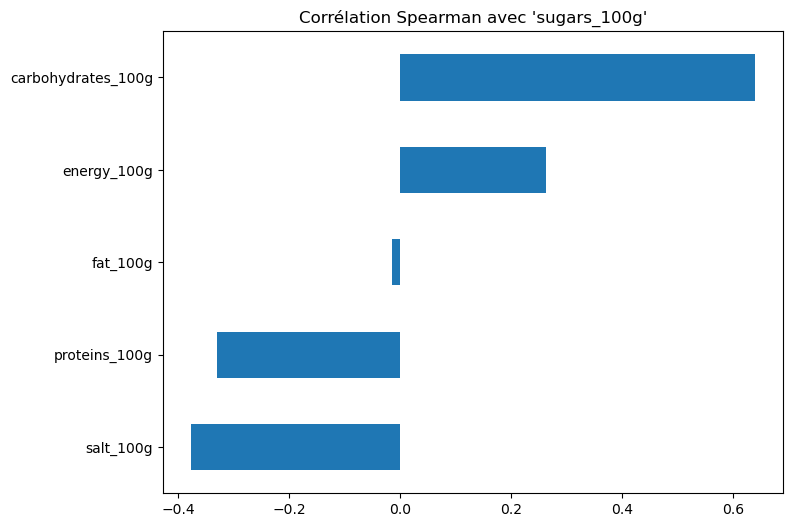

In [109]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'sugars_100g'")

**Une corrélation positive élevée entre sugars_100g et carbohydrates_100g (0.6397)** indique que les produits riches en glucides contiennent généralement aussi une quantité significative de sucres. 

De même, une corrélation positive modérée avec energy_100g (0.2632) suggère que les produits plus caloriques tendent à avoir des niveaux plus élevés de sucres.

Les corrélations négatives, comme avec salt_100g (-0.3764) et proteins_100g (-0.3297), indiquent que les produits contenant plus de sucres ont tendance à être moins riches en sel et en protéines. 

Enfin, la très faible corrélation avec fat_100g (-0.0147) montre qu’il n’existe pratiquement aucune relation entre les niveaux de sucres et de matières grasses.

#### Imputation avec la proportion de sucre médiane contenue dans les glucides

In [110]:
# Étape 1 : Calculer la médiane des proportions
proportion_mediane = donnees_valides['proportion_sugars'].median()

# Étape 2 : Créer une nouvelle colonne 'sugars_estimé' en copiant les valeurs actuelles de 'sugars_100g'
X['sugars_estimé'] = X['sugars_100g']

# Étape 3 : Identifier les lignes où sugars_100g est manquant mais carbohydrates_100g est présent
masque_sugars_manquant = X['sugars_100g'].isna() & X['carbohydrates_100g'].notna()

# Étape 4 : Appliquer l'imputation uniquement dans la colonne 'sugars_estimé'
X.loc[masque_sugars_manquant, 'sugars_estimé'] = (
    X.loc[masque_sugars_manquant, 'carbohydrates_100g'] * proportion_mediane
).round(3)  # Arrondir à 3 décimales

# Vérification des résultats
print(f"Nombre de valeurs manquantes initiales dans 'sugars' : {X['sugars_100g'].isna().sum()}")
print(f"Nombre de valeurs imputées dans 'sugars_estimé' : {masque_sugars_manquant.sum()}")
print(f"Nombre de valeurs manquantes restantes dans 'sugars_estimé' : {X['sugars_estimé'].isna().sum()}")

Nombre de valeurs manquantes initiales dans 'sugars' : 3158
Nombre de valeurs imputées dans 'sugars_estimé' : 2685
Nombre de valeurs manquantes restantes dans 'sugars_estimé' : 473


#### Vérifications aprés imputation

In [111]:
# Comparer les statistiques descriptives avant et après imputation
describe_avant = X['sugars_100g'].describe()
describe_apres = X['sugars_estimé'].describe()

print("Statistiques descriptives avant imputation :")
print(describe_avant)
print("\nStatistiques descriptives après imputation :")
print(describe_apres)

Statistiques descriptives avant imputation :
count    44821.000000
mean        13.342912
std         18.441818
min          0.000000
25%          1.200000
50%          4.500000
75%         17.000000
max        100.000000
Name: sugars_100g, dtype: float64

Statistiques descriptives après imputation :
count    47506.000000
mean        13.476081
std         18.395873
min          0.000000
25%          1.200000
50%          4.600000
75%         18.000000
max        100.000000
Name: sugars_estimé, dtype: float64


Les statistiques descriptives avant et après imputation montrent des différences mineures, ce qui indique que l'imputation n'a pas significativement biaisé la distribution globale des données. Voici une analyse des principaux points :<br>

Moyenne (mean) :<br>
La différence est faible, ce qui suggère que l'imputation n'a pas introduit de biais notable dans la moyenne.<br>

Écart-type (std) :<br>
La variabilité des données est presque inchangée, ce qui montre que l'imputation a bien respecté la dispersion des valeurs initiales.<br>

Médiane (50%) :<br>
Une très légère augmentation, indiquant que l'imputation n'a pas déformé le centre de la distribution.<br>

Quartiles (25% et 75%) :<br>
Les quartiles supérieurs montrent une légère augmentation après l’imputation, ce qui peut refléter un léger ajustement dans les valeurs imputées.

Valeurs extrêmes (min et max) :<br>
Les valeurs minimale et maximale restent inchangées à 0.0 et 100.0 respectivement, ce qui est un bon indicateur que l’imputation n’a pas introduit de nouvelles valeurs extrêmes.<br>

Conclusion :<br>
La distribution globale des données a été bien préservée après imputation. Les modifications observées (notamment sur la moyenne, la médiane et les quartiles) sont faibles, suggérant que l'approche utilisée (basée sur la médiane des proportions) est adaptée. Pour confirmer davantage nous allons visualiser les distributions.

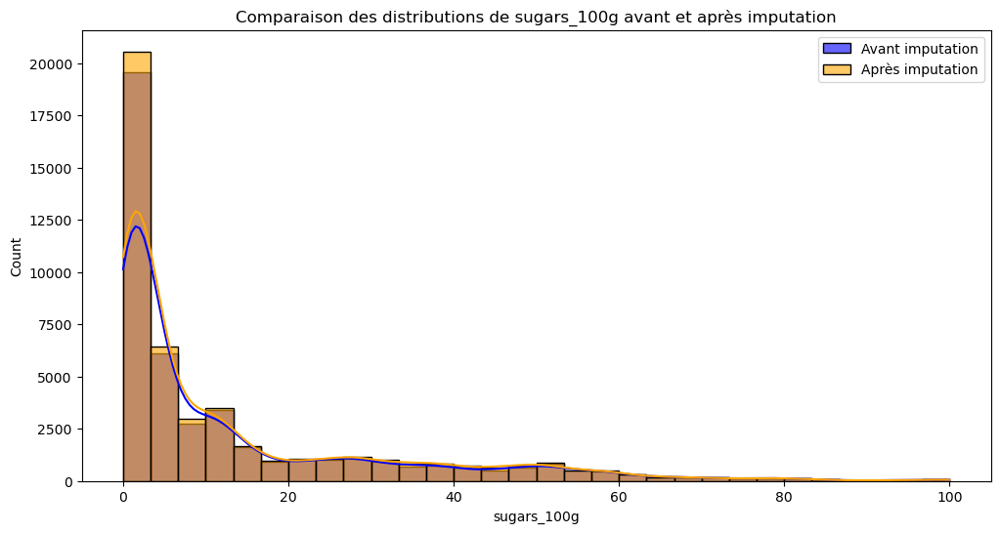

In [112]:
# Histogramme pour comparer les distributions avant et après l'imputation
plt.figure(figsize=(12, 6))
sns.histplot(X['sugars_100g'], bins=30, kde=True, color='blue', label='Avant imputation', alpha=0.6)
sns.histplot(X['sugars_estimé'], bins=30, kde=True, color='orange', label='Après imputation', alpha=0.6)
plt.title("Comparaison des distributions de sugars_100g avant et après imputation")
plt.legend()
plt.show()

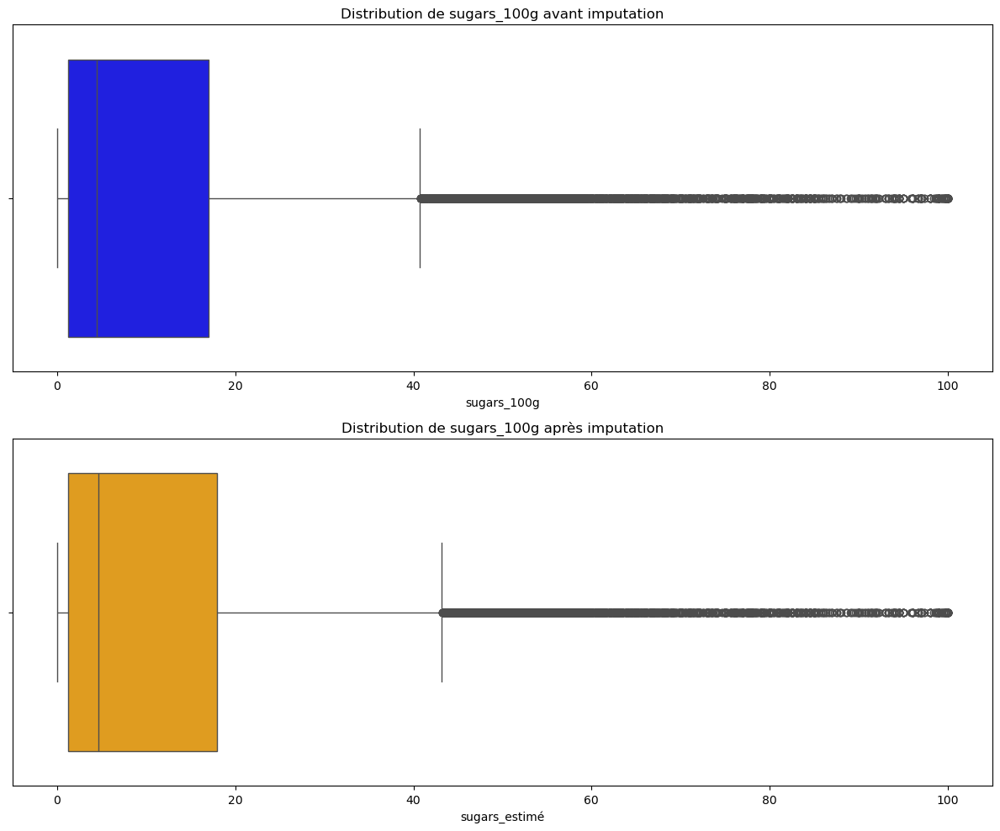

In [113]:
# Boxplots pour comparer les distributions avant et après l'imputation
plt.figure(figsize=(12, 10))

# Boxplot avant imputation
plt.subplot(2, 1, 1)
sns.boxplot(x=X['sugars_100g'], color='blue')
plt.title("Distribution de sugars_100g avant imputation")

# Boxplot après imputation
plt.subplot(2, 1, 2)
sns.boxplot(x=X['sugars_estimé'], color='orange')
plt.title("Distribution de sugars_100g après imputation")

plt.tight_layout()
plt.show()

Les visualisations confirment les observations issues des statistiques descriptives :

Boxplots :
Avant imputation, le 75e percentile (Q3) des valeurs de sugars_100g était légèrement inférieur à celui observé après imputation. Cela indique une augmentation modérée des valeurs élevées après l'estimation des données manquantes.
En revanche, les valeurs minimales et le 25e percentile (Q1) restent similaires, ce qui montre que l'imputation n'a pas altéré la répartition dans la partie basse des valeurs.

Histogrammes :
L'imputation a légèrement augmenté la densité des valeurs faibles de sugars_100g, ce qui se traduit par une distribution un peu plus concentrée dans les premières classes (valeurs faibles). Cela reflète l'impact de l'imputation basée sur la proportion médiane, qui a tendance à favoriser des estimations conservatrices pour les sucres simples.
Globalement, les ajustements réalisés semblent cohérents, sans altérer de manière significative la structure générale de la distribution des sucres dans les produits alimentaires.

In [114]:
# Supprimer la colonne 'sugars_100g' originale
X.drop(columns=['sugars_100g'], inplace=True)

# Renommer 'sugars_estimé' en 'sugars_100g'
X.rename(columns={'sugars_estimé': 'sugars_100g'}, inplace=True)

# Vérifier la structure du DataFrame
X.head()

,code,product_name,energy_100g,fat_100g,carbohydrates_100g,proteins_100g,salt_100g,sugars_100g
174,0000000290616,Salade Cesar,1210.0,12.00,23.00,22.00,2.160,0.000
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,54.10,4.79,0.922,28.100
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,38.70,3.33,0.647,24.700
185,0000008237798,Quiche Lorraine,478.0,6.79,7.86,5.36,0.499,0.714
186,0000008240095,Pâté au poulet,751.0,10.20,16.60,33.90,0.735,10.215


In [115]:
print(f"Nombre de valeurs manquantes dans 'sugars' : {X['sugars_100g'].isna().sum()}")

Nombre de valeurs manquantes dans 'sugars' : 473


Il nous reste 473 valeurs manquantes pour sugars_100g ,lorsque sugars_100g et carbohydrates_100g sont toutes les deux manquantes, il n'est pas possible d'utiliser la relation des proportions déjà établie. Il est donc nécessaire d’adopter une autre approche qui prend en compte les tendances générales des valeurs pour l'ensemble des produits.

#### Imputation par la médiane de sugars_100g

Pourquoi imputer ces valeurs avec la médiane globale?<br>
Stabilité des statistiques globales :
La médiane reste robuste et est moins influencée par les valeurs aberrantes. Compte tenu du faible nombre de valeurs manquantes, utiliser cette médiane ne déformera pas significativement la distribution des sucres.

Impact négligeable :
Puisque 473 valeurs manquantes sont une petite partie des 47 979 lignes totales, leur remplacement ne devrait pas avoir un impact notable sur les tendances générales de votre analyse.

In [116]:
# Copier directement la colonne sugars_100g dans sugars_estimé
X['sugars_estimé'] = X['sugars_100g']

# Calcul de la médiane globale des sucres
mediane_sugars = X['sugars_100g'].median()

# Imputer les valeurs manquantes restantes avec cette médiane
X['sugars_estimé'] = X['sugars_estimé'].fillna(mediane_sugars)

print(f"Les valeurs manquantes restantes ont été imputées avec la médiane globale de {mediane_sugars}")
# Vérification des résultats
print(f"Nombre de valeurs manquantes initiales dans 'sugars' : {X['sugars_100g'].isna().sum()}")
print(f"Nombre de valeurs manquantes restantes dans 'sugars_estimé' : {X['sugars_estimé'].isna().sum()}")

Les valeurs manquantes restantes ont été imputées avec la médiane globale de 4.6
Nombre de valeurs manquantes initiales dans 'sugars' : 473
Nombre de valeurs manquantes restantes dans 'sugars_estimé' : 0


#### Vérification des distributions aprés imputation

##### Vérification de la distribution de sugars_100g

In [117]:
# Comparer les statistiques descriptives avant et après imputation
describe_avant = X['sugars_100g'].describe()
describe_apres = X['sugars_estimé'].describe()

print("Statistiques descriptives avant imputation :")
print(describe_avant)
print("\nStatistiques descriptives après imputation :")
print(describe_apres)

Statistiques descriptives avant imputation :
count    47506.000000
mean        13.476081
std         18.395873
min          0.000000
25%          1.200000
50%          4.600000
75%         18.000000
max        100.000000
Name: sugars_100g, dtype: float64

Statistiques descriptives après imputation :
count    47979.000000
mean        13.388577
std         18.325963
min          0.000000
25%          1.250000
50%          4.600000
75%         17.500000
max        100.000000
Name: sugars_estimé, dtype: float64


Les statistiques descriptives avant et après l'imputation montrent des changements mineurs, indiquant que l'imputation n'a pas significativement altéré la distribution globale des données. Voici une analyse détaillée des principaux points :<br>

Moyenne (mean) :<br>
La différence entre les deux valeurs est de +0.05, ce qui reste une variation très faible. Cela signifie que l'imputation n'a pas introduit de biais significatif dans la moyenne des valeurs.<br>

Écart-type (std) :<br>
L'écart-type est resté quasiment inchangé, avec une légère diminution. Cela indique que la dispersion des valeurs n'a pas été affectée par l'imputation, et la variabilité des données a été bien préservée.<br>

Médiane (50%) :<br>
La médiane reste inchangée après l'imputation. Cela signifie que le centre de la distribution des données reste stable, confirmant ainsi que l'imputation a été correctement réalisée sans déformer la tendance centrale des valeurs.<br>

Quartiles (25% et 75%) :<br>
Les quartiles montrent une légère diminution des valeurs après l'imputation. Cela peut être attribué à l'ajustement des valeurs manquantes sans altérer les relations initiales des quartiles de manière significative.<br>

Valeurs extrêmes (min et max) :<br>
Les valeurs minimale et maximale restent inchangées à 0.0 et 100.0 respectivement, ce qui est un bon indicateur que l’imputation n’a pas introduit de nouvelles valeurs extrêmes.<br>

Conclusion :<br>
Les résultats des statistiques descriptives montrent que l'imputation a correctement rempli les valeurs manquantes sans perturber les caractéristiques générales des données. Les changements sont mineurs et ne déforment pas les relations fondamentales de la distribution. Cela démontre l'efficacité de l'approche basée sur l'imputation par la médiane globale.

Pour confirmer ces résultats et mieux visualiser l'impact des imputations, nous allons procéder à une analyse visuelle des distributions avec des histogrammes et des boxplots.

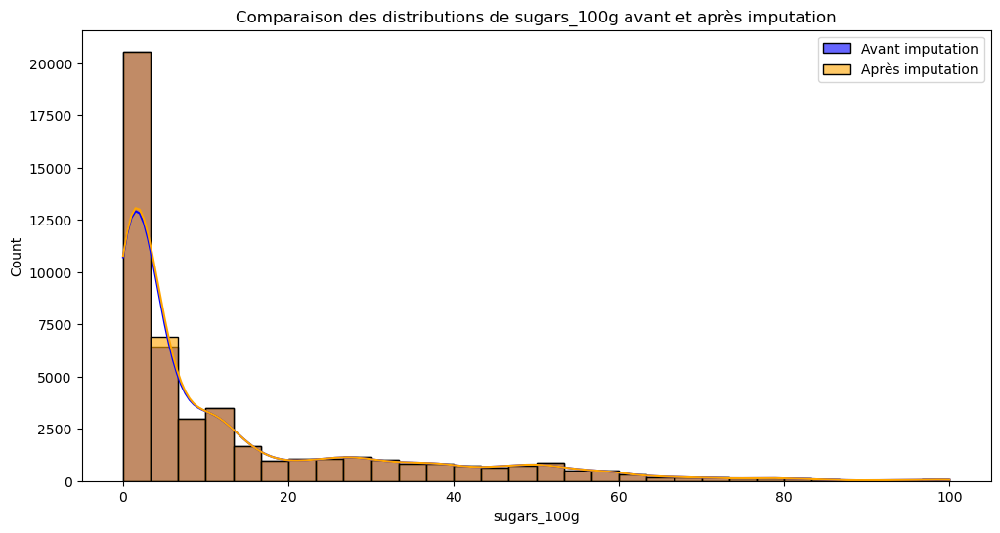

In [118]:
# Histogramme pour comparer les distributions avant et après l'imputation
plt.figure(figsize=(12, 6))
sns.histplot(X['sugars_100g'], bins=30, kde=True, color='blue', label='Avant imputation', alpha=0.6)
sns.histplot(X['sugars_estimé'], bins=30, kde=True, color='orange', label='Après imputation', alpha=0.6)
plt.title("Comparaison des distributions de sugars_100g avant et après imputation")
plt.legend()
plt.show()

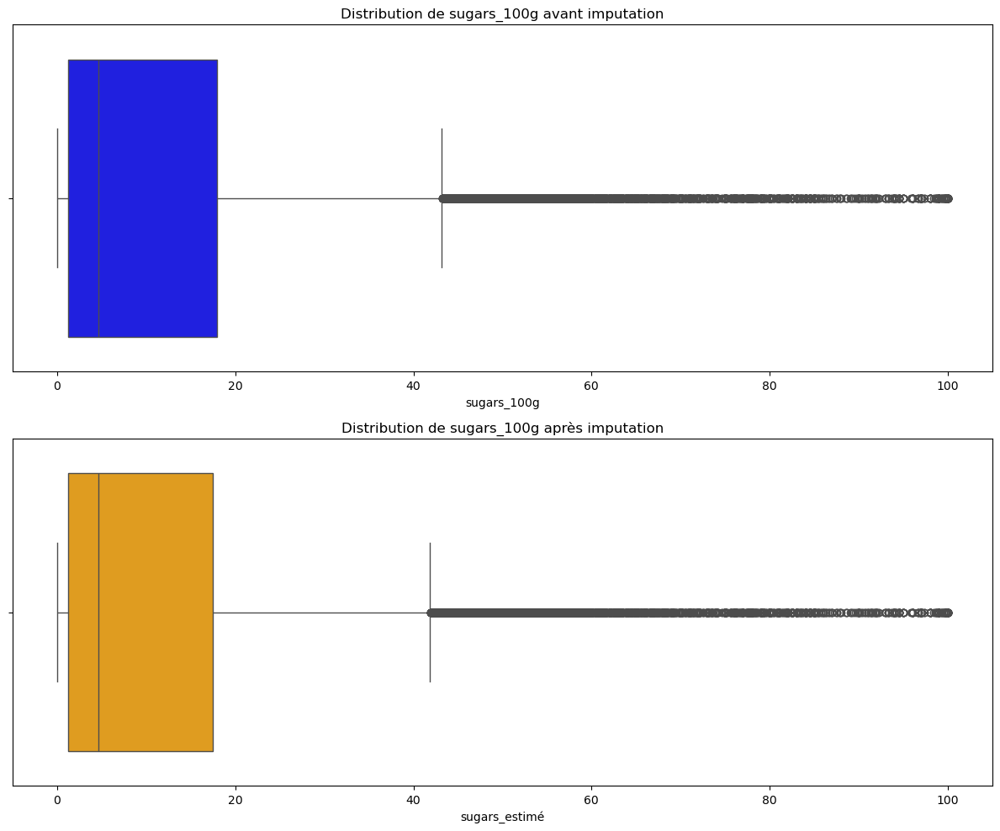

In [119]:
# Boxplots pour comparer les distributions avant et après l'imputation
plt.figure(figsize=(12, 10))

# Boxplot avant imputation
plt.subplot(2, 1, 1)
sns.boxplot(x=X['sugars_100g'], color='blue')
plt.title("Distribution de sugars_100g avant imputation")

# Boxplot après imputation
plt.subplot(2, 1, 2)
sns.boxplot(x=X['sugars_estimé'], color='orange')
plt.title("Distribution de sugars_100g après imputation")

plt.tight_layout()
plt.show()

Les visualisations confirment les observations issues des statistiques descriptives :

Boxplots :
Avant imputation, le 75e percentile (Q3) des valeurs de sugars_100g était légèrement plus élevé qu'après imputation. On observe donc une légère réduction du 75e percentile, et la moustache de droite est un peu plus rapprochée vers la gauche, indiquant une diminution des valeurs maximales des sucres. Cela signifie que les valeurs élevées ont été ajustées avec une légère correction après l'imputation.
En ce qui concerne les valeurs minimales et le 25e percentile (Q1), ils restent inchangés. Cela montre que l'imputation n'a pas affecté la répartition des valeurs faibles..

Histogrammes :
Les histogrammes révèlent qu'il n'y a pas de changement significatif entre les distributions avant et après l'imputation. La forme globale des histogrammes reste stable, ce qui confirme que l'imputation n'a pas introduit de biais ou de distorsion notable dans les valeurs des sucres. Les ajustements ont été faits de manière à maintenir la cohérence de la distribution des données sans affecter sa structure générale.

En résumé, l'imputation a été réalisée de manière efficace, tout en respectant la distribution originale des valeurs.

##### Vérification de la création de valeurs abérrantes

In [120]:
# Identifier les lignes où sugars_100g est supérieur à carbohydrates_100g
incoherences = X[X['sugars_estimé'] > X['carbohydrates_100g']]

# Afficher le nombre de lignes concernées
print(f"Nombre de lignes avec incohérences : {incoherences.shape[0]}")

Nombre de lignes avec incohérences : 63


L'imputation n'a pas réintroduit de valeurs aberrantes avec une quantité de sucre supérieure à la quantité de carbohydrates. On retrouve ici les 63 lignes que nous avons considérées comme acceptables a
à cause de la marge d'erreur de 20%.

##### Vérification de a distribution des proportions de sucre dans les carbohydrates

Est que ces différentes imputations ont eu un impact sur la distribution des proportions entre sugars_100g et carbohydrates_100g?

In [121]:
# Filtrer les données valides
donnees_valides = X[X['carbohydrates_100g'].notna()]

# Exclure les lignes où carbohydrates_100g est nul
donnees_valides = donnees_valides[donnees_valides['carbohydrates_100g'] > 0]

# Calculer la proportion
donnees_valides['proportion_sugars'] = donnees_valides['sugars_estimé'] / donnees_valides['carbohydrates_100g']

donnees_valides['proportion_sugars'].describe()

count    43630.000000
mean         0.564445
std          0.362750
min          0.000000
25%          0.185185
50%          0.615385
75%          0.933333
max          1.500000
Name: proportion_sugars, dtype: float64

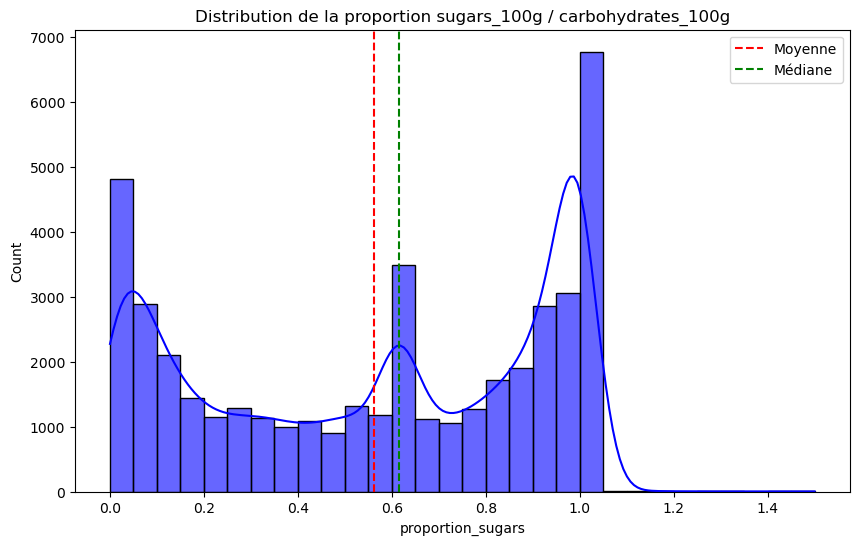

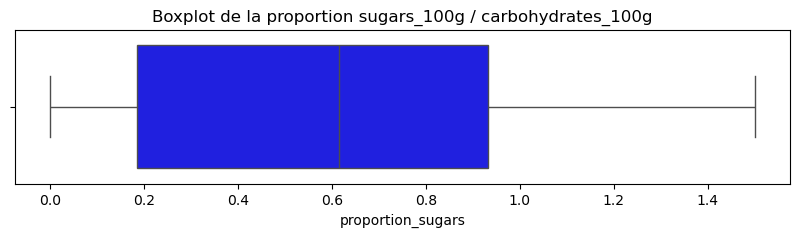

In [122]:
# Histogramme
plt.figure(figsize=(10, 6))
sns.histplot(donnees_valides['proportion_sugars'], bins=30, kde=True, color='blue', alpha=0.6)
plt.axvline(moyenne, color='red', linestyle='--', label='Moyenne')
plt.axvline(mediane, color='green', linestyle='--', label='Médiane')
plt.title("Distribution de la proportion sugars_100g / carbohydrates_100g")
plt.legend()
plt.show()

# Boxplot
plt.figure(figsize=(10, 2))
sns.boxplot(x=donnees_valides['proportion_sugars'], color='blue')
plt.title("Boxplot de la proportion sugars_100g / carbohydrates_100g")
plt.show()

Les statistiques descriptives des proportions avant et après l'imputation de sugars_100g montrent des différences minimes, ce qui indique que les imputations n'ont pas significativement biaisé la distribution globale des proportions. Voici une analyse détaillée des principaux points :<br>

Moyenne (mean)<br>
La moyenne des proportions a légèrement augmenté (+0.003), ce qui montre que l'imputation a eu un impact très limité sur la tendance centrale des proportions.<br>

Écart-type (std)<br>
Une légère réduction de la dispersion est observée après l'imputation (-0.01), suggérant que l'imputation a légèrement resserré la distribution, probablement en ajoutant des proportions calculées à partir de la médiane.

Médiane (50%)<br>
La médiane est restée constante tout au long du processus, ce qui confirme que l'imputation, même en deux étapes, n'a pas affecté la valeur centrale des proportions. Cette stabilité était attendue :<br>
Lors de la première étape, les valeurs imputées étaient calculées en fonction de la proportion médiane sugars_100g / carbohydrates_100g, ce qui a préservé les caractéristiques globales de la distribution.
Lors de la deuxième étape, les valeurs restantes ont été imputées avec la médiane globale de sugars_100g. Cela a également contribué à maintenir la médiane inchangée, car les imputations finales ont été alignées sur la valeur centrale des données observées.<br>

Quartiles (25% et 75%)<br>
Une légère augmentation du 1er quartile et une diminution du 3e quartile sont observées. Cela suggère que l'imputation a légèrement redistribué les proportions dans la partie inférieure de la distribution, sans modifier de manière significative la structure globale.<br>

Valeurs extrêmes (min et max)<br>
Les valeurs minimale (0.0) et maximale (1.5) restent inchangées, ce qui confirme que l'imputation n'a pas introduit de proportions aberrantes ou inattendues.<br>

Conclusion générale<br>
L'imputation de sugars_100g basée sur la proportion médiane et sur la médiane quand on ne pouvait pas calculer la proportion ont eu un impact minimal sur la distribution des proportions de sucres dans les carbohydrates. Les ajustements observés sont mineurs et cohérents avec l'objectif de l'imputation, tout en respectant les tendances et les relations originales dans les données. Cela valide les approches utilisées comme fiables et adaptées à cette analyse.

#### Vérification des relations avec les autres variables après imputation

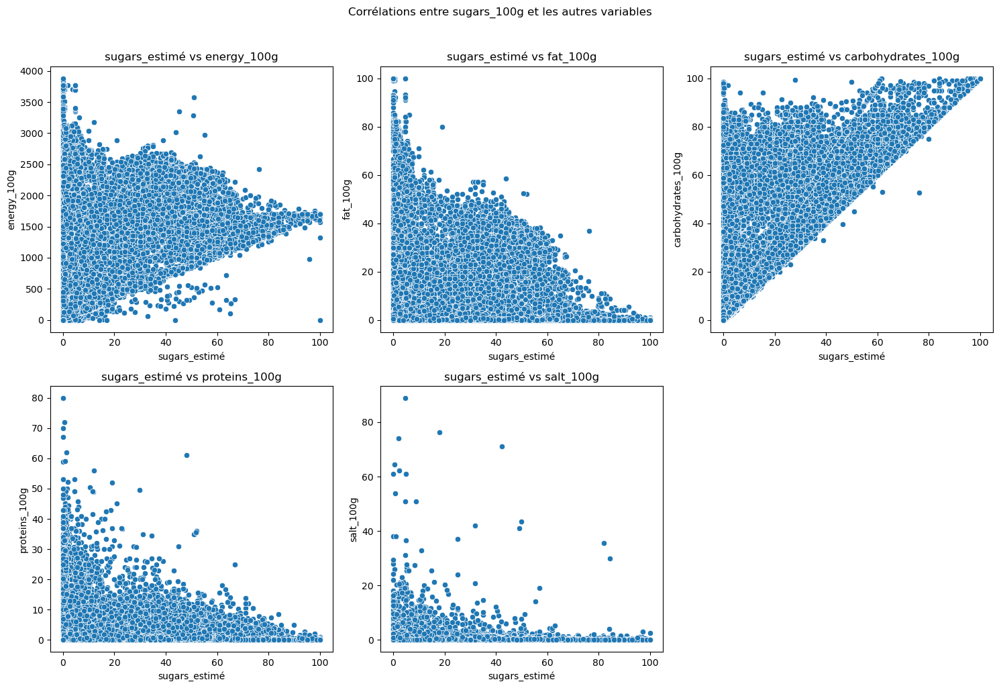

In [123]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_estimé', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à sugars_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre sugars_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf sugars_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'sugars_estimé']):
    sns.scatterplot(data=df, x='sugars_estimé', y=col, ax=axes[i])
    axes[i].set_title(f'sugars_estimé vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [124]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'sugars_100g'
variables_quanti = ['salt_100g', 'energy_100g', 'proteins_100g', 'fat_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['sugars_estimé'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'sugars_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['sugars_estimé', variables_quanti]
print(correlation_salt_subset)

salt_100g            -0.373047
energy_100g           0.268273
proteins_100g        -0.312766
fat_100g             -0.024330
carbohydrates_100g    0.660892
Name: sugars_estimé, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'sugars_100g'"}>

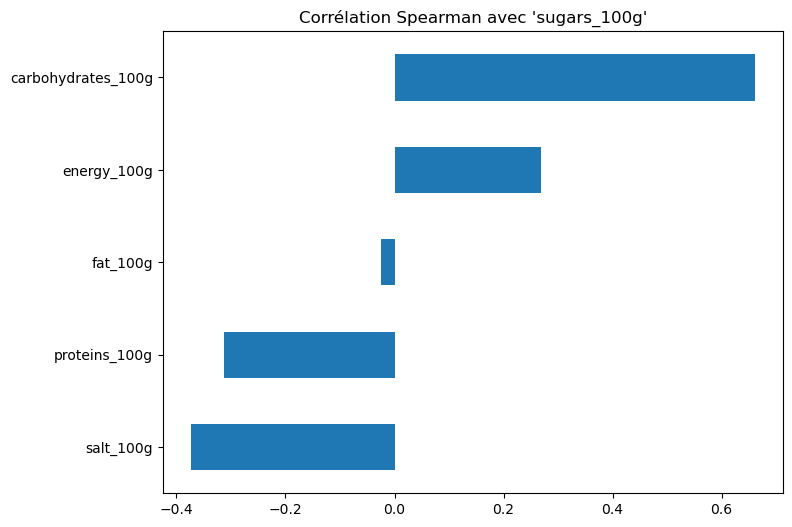

In [125]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'sugars_100g'")

La corrélation positive élevée entre sugars_100g et carbohydrates_100g (0.6609) est toujours présente.
Les corrélations négatives, comme avec salt_100g et proteins_100g sont presque identiques.
La faible corrélation avec fat_100g est toujours aussi faible.

**Conclusion** <br>
Toutes nos analyses confirment que nos imputations ont respecté la distribution originale des valeurs mais aussi les relations entre les variables.

In [126]:
# Supprimer la colonne 'sugars_100g' originale
X.drop(columns=['sugars_100g'], inplace=True)

# Renommer 'sugars_estimé' en 'sugars_100g'
X.rename(columns={'sugars_estimé': 'sugars_100g'}, inplace=True)

# Vérifier la structure du DataFrame
X.head()

,code,product_name,energy_100g,fat_100g,carbohydrates_100g,proteins_100g,salt_100g,sugars_100g
174,0000000290616,Salade Cesar,1210.0,12.00,23.00,22.00,2.160,0.000
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,54.10,4.79,0.922,28.100
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,38.70,3.33,0.647,24.700
185,0000008237798,Quiche Lorraine,478.0,6.79,7.86,5.36,0.499,0.714
186,0000008240095,Pâté au poulet,751.0,10.20,16.60,33.90,0.735,10.215


### Imputation de carbohydrates_100g

Dans le cadre de notre analyse des données, nous avons précédemment imputé les valeurs manquantes de sugars_100g en utilisant un modèle basé sur les proportions (sugars_100g/carbohydrates_100g). Cette méthode a été validée par une analyse approfondie de la distribution des proportions avant et après imputation. Nous avons constaté que cette approche préservait la cohérence des données et n'introduisait pas de biais significatif dans la distribution.<br>

Grâce à ces vérifications, nous avons confirmé que les proportions calculées sont fiables. Par conséquent, nous pouvons réutiliser ces analyses pour imputer les valeurs manquantes de carbohydrates_100g. La méthode consiste à inverser le raisonnement précédent en utilisant la proportion médiane validée pour estimer les glucides totaux (carbohydrates_100g) à partir des valeurs déjà imputées de sugars_100g:<br>

**carbohydrates_estimés = sugars_100g / proportion médiane**<br>
 
Ce processus garantit la cohérence méthodologique et préserve la structure des relations entre les deux variables.

#### Analyse de la corrélation de carbohydrates_100g avec les autres variables

Avant d'imputer les valeurs manquantes de carbohydrates_100g, il est essentiel d'examiner ses corrélations avec les autres variables. Cette analyse permet de s'assurer que l'imputation ne modifie pas les relations existantes entre carbohydrates_100g et les autres attributs, préservant ainsi la structure et les liens importants des données.

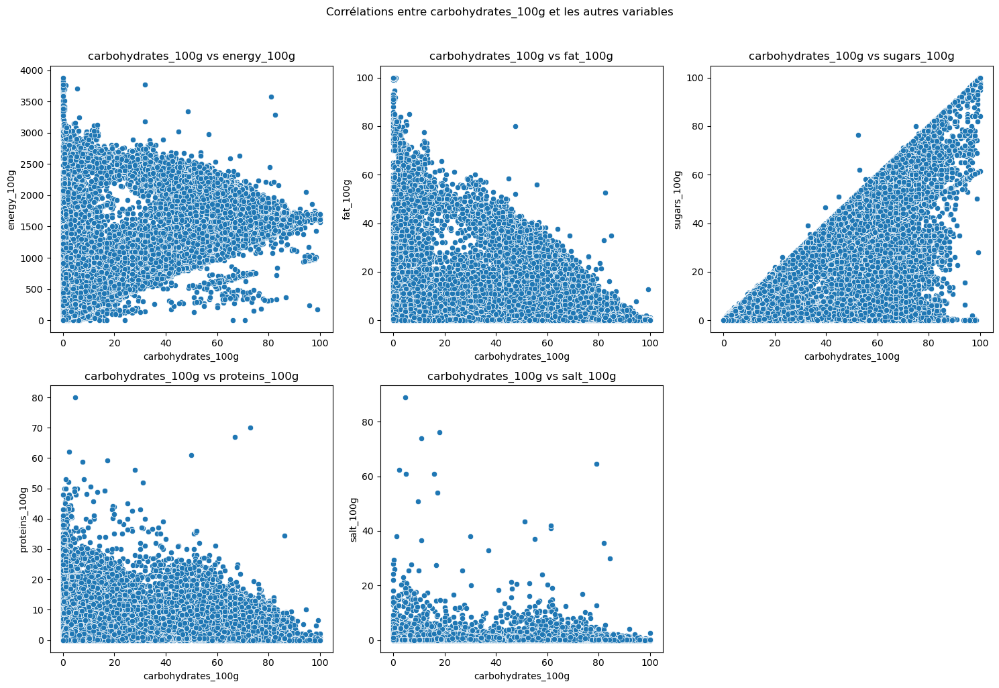

In [127]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à carbohydrates_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre carbohydrates_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf carbohydrates_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'carbohydrates_100g']):
    sns.scatterplot(data=df, x='carbohydrates_100g', y=col, ax=axes[i])
    axes[i].set_title(f'carbohydrates_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

Comme les nuages de points ne révèlent **pas de relation linéaire** entre carbohydrates_100g et les autres variables, il est préférable d’utiliser une corrélation de Spearman. Cette méthode évalue les relations non linéaires et est moins sensible aux valeurs aberrantes. En examinant les corrélations de Spearman, on peut mieux comprendre les associations monotones entre carbohydrates_100g et les autres variables, ce qui peut être crucial pour choisir les caractéristiques pertinentes lors de l'imputation.

In [128]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'carbohydrates_100g'
variables_quanti = ['salt_100g', 'energy_100g', 'proteins_100g', 'fat_100g', 'sugars_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['carbohydrates_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'carbohydrates_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['carbohydrates_100g', variables_quanti]
print(correlation_salt_subset)

salt_100g       -0.221864
energy_100g      0.523122
proteins_100g   -0.047142
fat_100g         0.015573
sugars_100g      0.660892
Name: carbohydrates_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'carbohydrates_100g'"}>

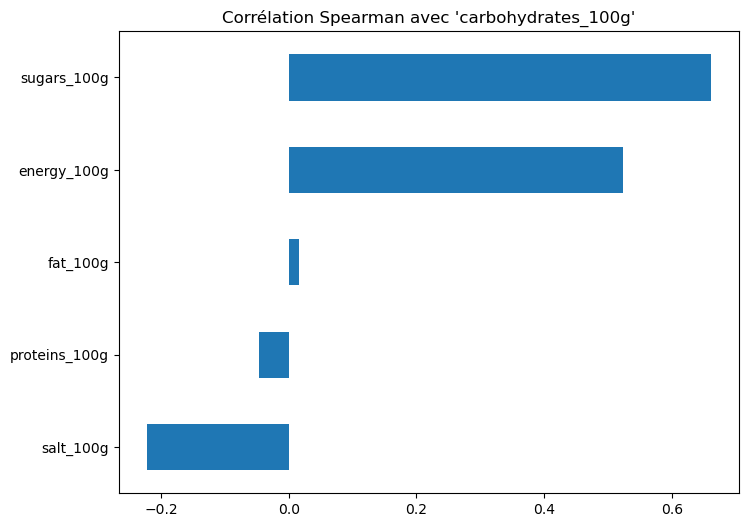

In [129]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'carbohydrates_100g'")

**Une corrélation positive élevée entre carbohydrates_100g et sugars_100g (0.6609)** indique que les produits riches en glucides contiennent généralement aussi une quantité significative de sucres. 

De même, une corrélation modérée positive avec energy_100g (0.5231) montre que les produits plus caloriques ont tendance à être plus riches en glucides.

La corrélation négative modérée avec salt_100g (-0.2219) suggère que les produits plus riches en glucides sont légèrement moins salés. 

En revanche, la très faible corrélation négative avec proteins_100g (-0.0471) indique qu'il n'y a pratiquement pas de relation entre les glucides et les protéines dans les produits analysés. 

Enfin, la corrélation quasi nulle avec fat_100g (0.0156) confirme l'absence de lien significatif entre glucides et matières grasses.

#### Imputation avec la proportion médiane contenue dans les glucides

In [130]:
# Étape 1 : Calculer et arrondir la médiane des proportions
proportion_mediane = donnees_valides['proportion_sugars'].median() 
# On calcule la médiane de la colonne 'proportion_sugars' à partir des données valides

# Étape 2 : Créer une nouvelle colonne 'carbohydrates_estimé' en copiant les valeurs actuelles de 'carbohydrates_100g'
X['carbohydrates_estimé'] = X['carbohydrates_100g']

# Étape 3 : Appliquer l'imputation pour les valeurs manquantes dans 'carbohydrates_estimé'
X.loc[X['carbohydrates_estimé'].isna(), 'carbohydrates_estimé'] = \
    X.loc[X['carbohydrates_estimé'].isna(), 'sugars_100g'].apply(
        lambda sugar: max(sugar, (sugar / proportion_mediane))
    ).round(4)
# Pour les lignes où 'carbohydrates_estimé' est manquant (NaN), on applique l'imputation suivante :
# - On calcule une estimation de 'carbohydrates' en divisant 'sugars_100g' par 'proportion_mediane'.
# - Si la valeur calculée est inférieure à 'sugars_100g', on remplace par 'sugars_100g' (pour éviter une incohérence).
# - On arrondit les résultats à 4 décimales pour une meilleure précision.

# Cloisonner les valeurs pour ne pas dépasser 100
X['carbohydrates_estimé'] = X['carbohydrates_estimé'].clip(upper=100)
# On impose une limite supérieure de 100 à toutes les valeurs de 'carbohydrates_estimé', 
# car un pourcentage de macronutriments supérieur à 100 serait incohérent.

print(f"Nombre de valeurs manquantes initiales dans 'carbohydrates' : {X['carbohydrates_100g'].isna().sum()}")
print(f"Nombre de valeurs manquantes restantes dans 'carbohydrates_estimé' : {X['carbohydrates_estimé'].isna().sum()}")

Nombre de valeurs manquantes initiales dans 'carbohydrates' : 2869
Nombre de valeurs manquantes restantes dans 'carbohydrates_estimé' : 0


#### Vérification des distributions aprés imputation

##### Vérification de la distribution de carbohydrates_100g

In [131]:
# Comparer les statistiques descriptives avant et après imputation
describe_avant = X['carbohydrates_100g'].describe()
describe_apres = X['carbohydrates_estimé'].describe()

print("Statistiques descriptives avant imputation :")
print(describe_avant)
print("\nStatistiques descriptives après imputation :")
print(describe_apres)

Statistiques descriptives avant imputation :
count    45110.000000
mean        27.920318
std         27.017787
min          0.000000
25%          4.700000
50%         14.900000
75%         53.000000
max        100.000000
Name: carbohydrates_100g, dtype: float64

Statistiques descriptives après imputation :
count    47979.000000
mean        27.404403
std         27.084135
min          0.000000
25%          4.600000
50%         14.100000
75%         52.300000
max        100.000000
Name: carbohydrates_estimé, dtype: float64


Les statistiques descriptives avant et après l'imputation montrent des changements mineurs, indiquant que l'imputation n'a pas significativement altéré la distribution globale des données. Voici une analyse détaillée des principaux points :<br>

Moyenne :<br>
La légère diminution de la moyenne indique que l'imputation a légèrement réduit la quantité moyenne des glucides par produit.<br>

Écart-type (std) :<br>
L'écart-type reste quasiment inchangé, ce qui montre que la dispersion des valeurs reste stable. Les valeurs imputées n'ont pas introduit d'anomalies majeures dans la répartition des glucides.<br>

Médiane (50%) :<br>
Une légère diminution de la médiane peut être observée après l'imputation, mais elle reste proche des valeurs initiales, confirmant que les valeurs manquantes ont été correctement remplacées sans déformer significativement la tendance centrale des données.<br>

Quartiles :<br>
Les quartiles montrent des changements minimes. Cela confirme que l'imputation a été faite de manière à ne pas altérer la distribution des valeurs en profondeur.<br>

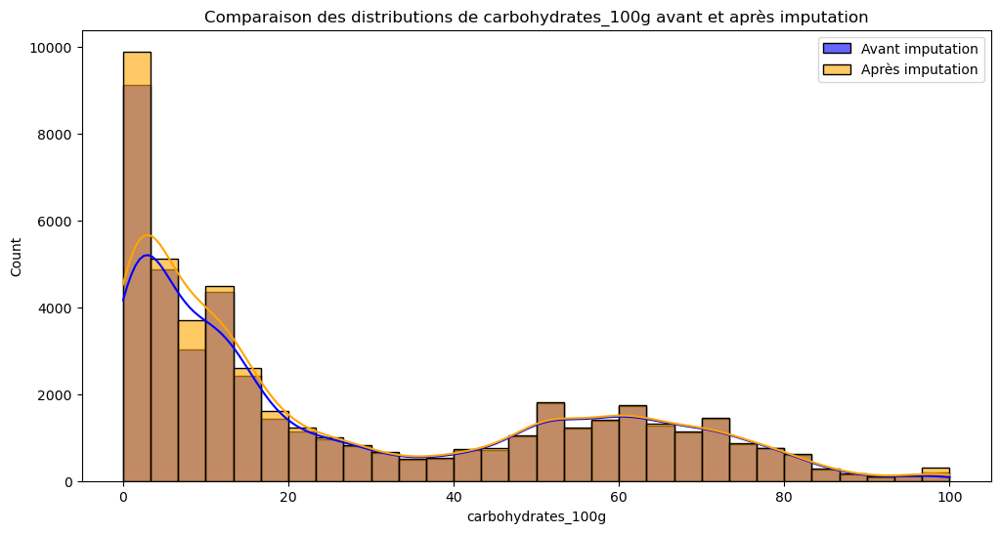

In [132]:
# Histogramme pour comparer les distributions avant et après l'imputation
plt.figure(figsize=(12, 6))
sns.histplot(X['carbohydrates_100g'], bins=30, kde=True, color='blue', label='Avant imputation', alpha=0.6)
sns.histplot(X['carbohydrates_estimé'], bins=30, kde=True, color='orange', label='Après imputation', alpha=0.6)
plt.title("Comparaison des distributions de carbohydrates_100g avant et après imputation")
plt.legend()
plt.show()

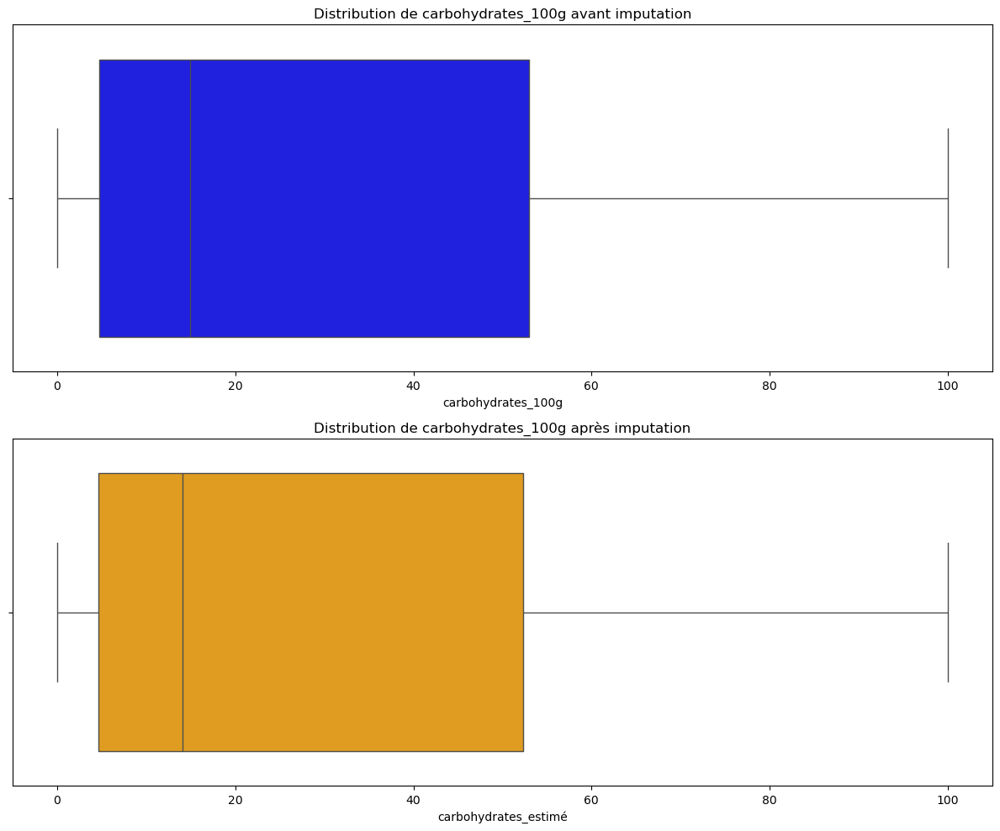

In [133]:
# Boxplots pour comparer les distributions avant et après l'imputation
plt.figure(figsize=(12, 10))

# Boxplot avant imputation
plt.subplot(2, 1, 1)
sns.boxplot(x=X['carbohydrates_100g'], color='blue')
plt.title("Distribution de carbohydrates_100g avant imputation")

# Boxplot après imputation
plt.subplot(2, 1, 2)
sns.boxplot(x=X['carbohydrates_estimé'], color='orange')
plt.title("Distribution de carbohydrates_100g après imputation")

plt.tight_layout()
plt.show()

Les analyses visuelles des histogrammes et boxplots corroborent parfaitement les conclusions précédentes des statistiques descriptives :

Tendance centrale stable :
Les médianes et les quartiles ne sont pas significativement modifiés après l'imputation.

Dispersion des valeurs intacte :
L'écart-type reste stable, et la distribution des valeurs suit les mêmes schémas.

Absence de valeurs aberrantes :
Le plafonnement des valeurs à 100 g garantit des résultats réalistes sans valeurs aberrantes.

Ces résultats attestent que l'imputation a été correctement réalisée et maintenue fidèle aux caractéristiques statistiques et visuelles des données originales.

##### Vérification de la création de valeurs abérrantes

In [134]:
# Identifier les lignes où sugars_100g est supérieur à carbohydrates_100g
incoherences = X[X['sugars_100g'] > X['carbohydrates_estimé']]

# Afficher le nombre de lignes concernées
print(f"Nombre de lignes avec incohérences : {incoherences.shape[0]}")

Nombre de lignes avec incohérences : 63


L'imputation n'a pas réintroduit de valeurs aberrantes avec une quantité de sucre supérieure à la quantité de carbohydrates. On retrouve ici les 63 lignes que nous avons considérées comme acceptables a
à cause de la marge d'erreur de 20%.

##### Vérification de la distribution des proportions de sucre dans les carbohydrates

Est que ces différentes imputations ont eu un impact sur la distribution des proportions entre sugars_100g et carbohydrates_100g?

In [135]:
# Exclure les lignes où carbohydrates_100g est nul et calculer directement
X.loc[X['carbohydrates_estimé'] > 0, 'proportion_sugars'] = \
    X.loc[X['carbohydrates_estimé'] > 0, 'sugars_100g'] / X.loc[X['carbohydrates_estimé'] > 0, 'carbohydrates_estimé']
# La division est effectuée entre sugars_100g et carbohydrates_estimé 

# Afficher les statistiques descriptives de proportion_sugars
print(X['proportion_sugars'].describe())

count    46352.000000
mean         0.567827
std          0.352324
min          0.000000
25%          0.212091
50%          0.615385
75%          0.921611
max          1.500000
Name: proportion_sugars, dtype: float64


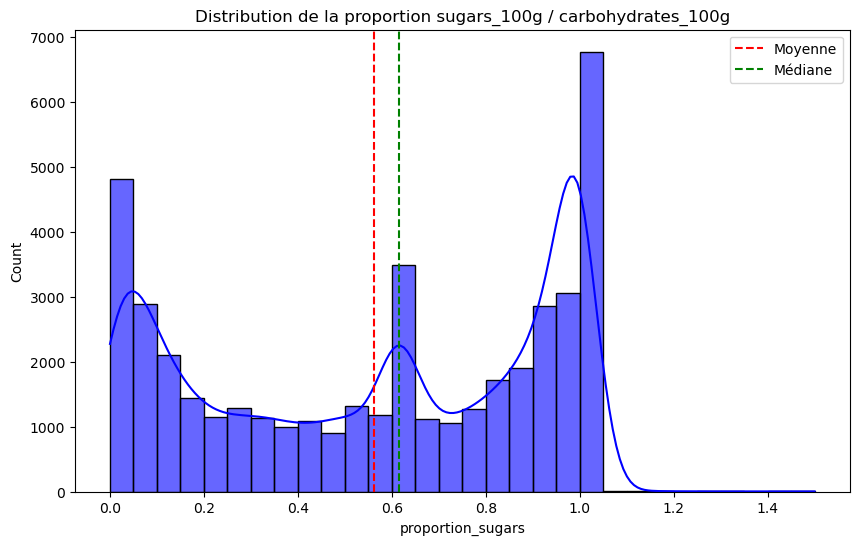

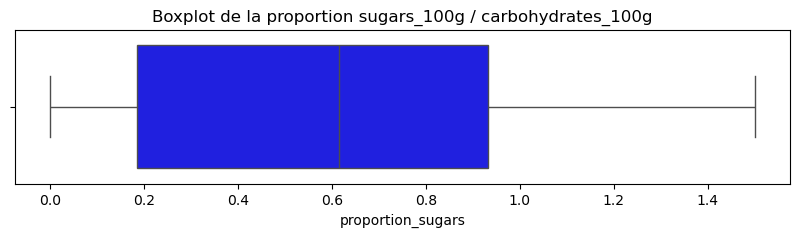

In [136]:
# Histogramme
plt.figure(figsize=(10, 6))
sns.histplot(donnees_valides['proportion_sugars'], bins=30, kde=True, color='blue', alpha=0.6)
plt.axvline(moyenne, color='red', linestyle='--', label='Moyenne')
plt.axvline(mediane, color='green', linestyle='--', label='Médiane')
plt.title("Distribution de la proportion sugars_100g / carbohydrates_100g")
plt.legend()
plt.show()

# Boxplot
plt.figure(figsize=(10, 2))
sns.boxplot(x=donnees_valides['proportion_sugars'], color='blue')
plt.title("Boxplot de la proportion sugars_100g / carbohydrates_100g")
plt.show()

| Statistique | Avant imputation | Après imputation |
|:------------|------------------|------------------|
| **Count**   | 43,630           | 46,352           |
| **Mean**    | 0.564445         | 0.567827         |
| **Std**     | 0.362750         | 0.352324         |
| **Min**     | 0.000000         | 0.000000         |
| **25%**     | 0.185185         | 0.212091         |
| **50%**     | 0.615385         | 0.615385         |
| **75%**     | 0.933333         | 0.921611         |
| **Max**     | 1.500000         | 1.500000         |


Les statistiques descriptives des proportions de sucres (proportion_sugars) avant et après l'imputation montrent des changements minimes, ce qui confirme que l'imputation a eu un impact négligeable sur la distribution globale des proportions. Voici une analyse détaillée des principaux points :

Moyenne (mean)<br>
La moyenne des proportions a légèrement augmenté. Cette augmentation est très faible et montre que l'imputation n'a pas significativement affecté la tendance centrale des proportions de sucres. Cela signifie que la relation moyenne entre sugars_100g et carbohydrates_estimé reste stable.<br>

Écart-type (std)<br>
Une légère réduction de l'écart-type est observée. Cela suggère que l'imputation a légèrement réduit la dispersion des proportions, ce qui a resserré la distribution sans déformer ses tendances originales.<br>

Médiane (50%)<br>
La médiane reste inchangée, ce qui est une observation cruciale. Cela confirme que l'imputation n'a pas affecté la valeur centrale des proportions.

Quartiles (25% et 75%)<br>
Une légère augmentation du 1er quartile et une légère diminution du 3ème quartile sont observées. Cela indique que l'imputation a légèrement redistribué les proportions, principalement dans la partie inférieure de la distribution, sans modifier de manière significative la structure globale.<br>

Valeurs extrêmes (min et max)<br>
Les valeurs minimale (0.0) et maximale (1.5) sont restées inchangées. Cela confirme que l'imputation n'a pas introduit de proportions aberrantes ou inattendues dans les données.<br>

Conclusion générale<br>
L'imputation des valeurs manquantes des proportions des sucres en se basant sur la proportion médiane des sucres/carbohydrates a eu un **impact minimal sur la distribution globale des proportions de sucres**. Les ajustements sont mineurs et cohérents avec l'objectif initial, tout en respectant les relations et tendances originales des données. Cela valide les approches utilisées comme fiables et adaptées pour cette analyse, tout en préservant l'intégrité des relations observées dans les proportions entre sucres et carbohydrates.

#### Vérification des relations ce carbohydrates_100g avec les autres variables

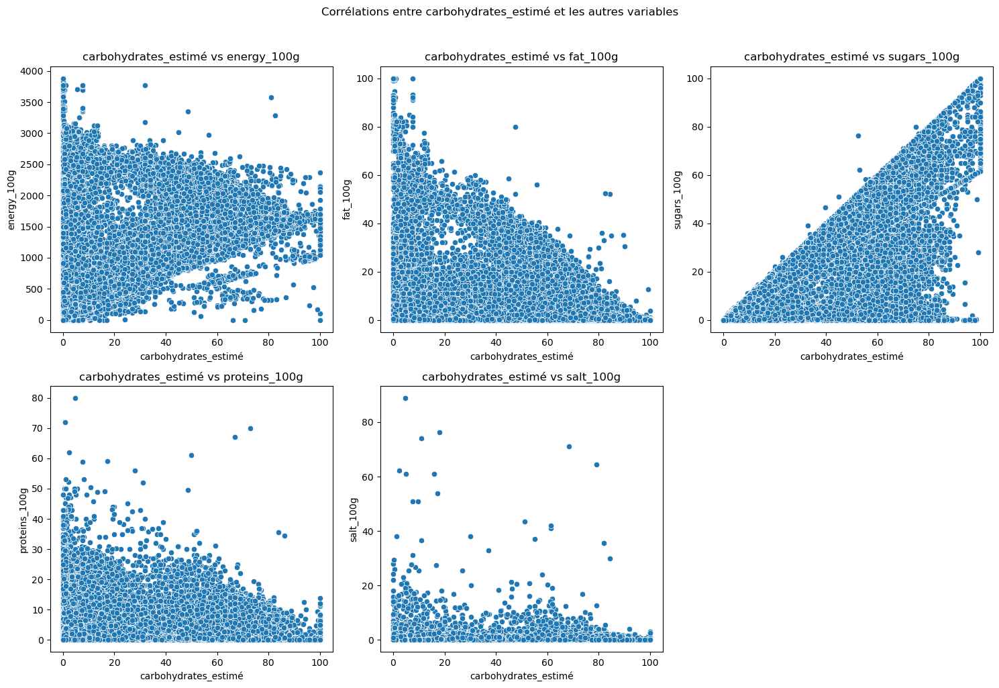

In [137]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_estimé', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à carbohydrates_estimé
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre carbohydrates_estimé et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf carbohydrates_estimé) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'carbohydrates_estimé']):
    sns.scatterplot(data=df, x='carbohydrates_estimé', y=col, ax=axes[i])
    axes[i].set_title(f'carbohydrates_estimé vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [138]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'carbohydrates_estimé'
variables_quanti = ['salt_100g', 'energy_100g', 'proteins_100g', 'fat_100g', 'sugars_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['carbohydrates_estimé'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'carbohydrates_estimé' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['carbohydrates_estimé', variables_quanti]
print(correlation_salt_subset)

salt_100g       -0.223334
energy_100g      0.499409
proteins_100g   -0.061289
fat_100g         0.009609
sugars_100g      0.676555
Name: carbohydrates_estimé, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'carbohydrates_estimé'"}>

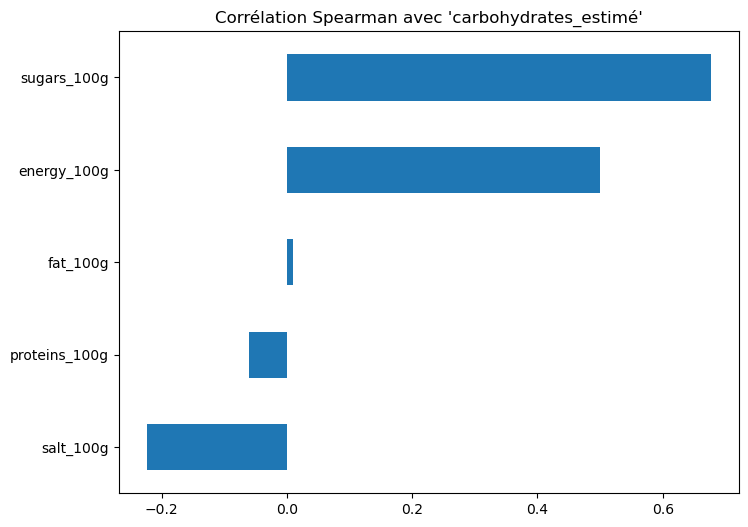

In [139]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'carbohydrates_estimé'")

| Variable       | Corrélation avant imputation | Corrélation après imputation |
|:---------------|------------------------------|-----------------------------|
| **salt_100g**  | -0.221864                   | -0.223334                   |
| **energy_100g**|  0.523122                   |  0.499409                   |
| **proteins_100g** | -0.047142                | -0.061289                   |
| **fat_100g**   |  0.015573                   |  0.009609                   |
| **sugars_100g**|  0.660892                   |  0.676555                   |


Les corrélations après imputation restent globalement cohérentes avec celles d'avant, avec des variations minimes qui ne modifient pas significativement les tendances initiales :

salt_100g : La corrélation reste négative, passant de -0.221 à -0.223, montrant une très légère intensification de la relation inverse.

energy_100g : La corrélation diminue légèrement de 0.523 à 0.499, mais reste modérément positive, indiquant que les produits riches en glucides tendent à contenir davantage d’énergie.

proteins_100g : La corrélation passe de -0.047 à -0.061, renforçant légèrement la relation négative, mais l'effet reste très faible.

fat_100g : La corrélation diminue légèrement de 0.015 à 0.009, confirmant l'absence de relation significative entre matières grasses et glucides.

sugars_100g : La corrélation la plus forte, avec sugars_100g, augmente légèrement de 0.660 à 0.676, renforçant la relation positive entre glucides et sucres.

Ces variations indiquent que l'imputation des données n'a pas altéré de manière notable les relations entre les variables.

**Conclusion**<br>
L'analyse confirme que nos imputations ont préservé à la fois la distribution initiale des valeurs et les relations entre les variables.

In [140]:
# Supprimer la colonne 'sugars_100g' originale
X.drop(columns=['proportion_sugars'], inplace=True)

# Supprimer la colonne 'sugars_100g' originale
X.drop(columns=['carbohydrates_100g'], inplace=True)

# Renommer 'sugars_estimé' en 'sugars_100g'
X.rename(columns={'carbohydrates_estimé': 'carbohydrates_100g'}, inplace=True)

# Vérifier la structure du DataFrame
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.160,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.922,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.647,24.700,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.499,0.714,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.735,10.215,16.60


In [141]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47979 entries, 174 to 320751
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   code                47979 non-null  object 
 1   product_name        47745 non-null  object 
 2   energy_100g         47675 non-null  float64
 3   fat_100g            45166 non-null  float64
 4   proteins_100g       47266 non-null  float64
 5   salt_100g           44972 non-null  float64
 6   sugars_100g         47979 non-null  float64
 7   carbohydrates_100g  47979 non-null  float64
dtypes: float64(6), object(2)
memory usage: 3.3+ MB


### Imputation de salt_100g

La variable salt_100g représente la quantité de sel contenue dans 100 grammes d'un produit alimentaire. Dans le cadre de notre analyse, une partie des données de cette variable est manquante. Pour garantir la cohérence et l'utilité des résultats, nous allons imputer ces valeurs de manière raisonnée en tenant compte des relations identifiées avec d'autres variables nutritionnelles.

Nous avons observé, via notre analyse métier et la matrice des corrélations des valeurs manquantes, que salt_100g est fortement corrélée à sugars_100g (0.808) et modérément corrélée à proteins_100g (0.236). Ces relations reflètent des liens potentiels dans la composition nutritionnelle des aliments.

L'objectif de cette étape est de :

Identifier les relations clés pour guider l'imputation.
Imputer les valeurs manquantes de salt_100g tout en préservant la cohérence des données.
Vérifier que les distributions après imputation restent réalistes par rapport aux données observées.
Nous utiliserons une approche basée sur la régression, en tenant compte des variables corrélées, afin d'estimer les valeurs de manière fiable et interprétable.

#### Résumé statistique de salt_100g

In [142]:
# Afficher le nombre de valeurs manquantes pour la colonne 'salt_100g'
nombre_manquantes = X['salt_100g'].isnull().sum()
print(f"Nombre de valeurs manquantes pour 'salt_100g' : {nombre_manquantes}")

Nombre de valeurs manquantes pour 'salt_100g' : 3007


In [143]:
X['salt_100g'].describe()

count    44972.000000
mean         0.886631
std          1.794566
min          0.000000
25%          0.076200
50%          0.530000
75%          1.200000
max         88.900000
Name: salt_100g, dtype: float64

Moyenne : 0.885 g/100g
La moyenne des valeurs est de 0.886 g/100g, ce qui donne une idée générale de la teneur moyenne en sel des produits.

Écart-type : 1.79 g/100g
L'écart-type assez élevé (1.791) indique une grande dispersion des valeurs autour de la moyenne. Cela signifie qu'il existe une variété significative dans les concentrations de sel des différents produits.

Quartiles :<br>
25ème percentile (Q1) = 0.076 g/100g : Cela signifie que 25 % des observations ont une valeur inférieure ou égale à 0.076 g/100g.<br>
Médiane (Q2) = 0.520 g/100g : Cela indique que 50 % des observations sont inférieures ou égales à 0.520 g/100g.<br<
75ème percentile (Q3) = 1.200 g/100g : Cela signifie que 75 % des observations ont une valeur inférieure ou égale à 1.200 g/100g.

Les statistiques descriptives indiquent une certaine variabilité dans les teneurs en sel.

Notre analyse des valeurs extrêmes, réalisée précédemment lors de l'étude des valeurs aberrantes avec le calcul de l'IQR, a révélé la présence de valeurs atypiques. Nous avons conclu que les valeurs situées en dehors des limites de l'IQR ont une signification métier. Par exemple, elles peuvent être liées à des produits spécialement conçus pour être riches en sel, comme :<br>
-Des snacks<br>
-Des conserves<br>
-Des plats préparés, etc.<br>
Ces valeurs ne sont donc pas nécessairement des erreurs de mesure, mais plutôt des résultats naturels en rapport avec les types de produits considérés.

L'analyse des valeurs et l'observation de l'histogramme ont confirmé que les valeurs aberrantes pour salt_100g sont pertinentes et alignées avec une approche métier solide. Par conséquent, l'imputation des valeurs manquantes doit prendre en compte ces spécificités et les relations intrinsèques entre la composition des produits alimentaires.

#### Visualisation de la distribution de salt_100g

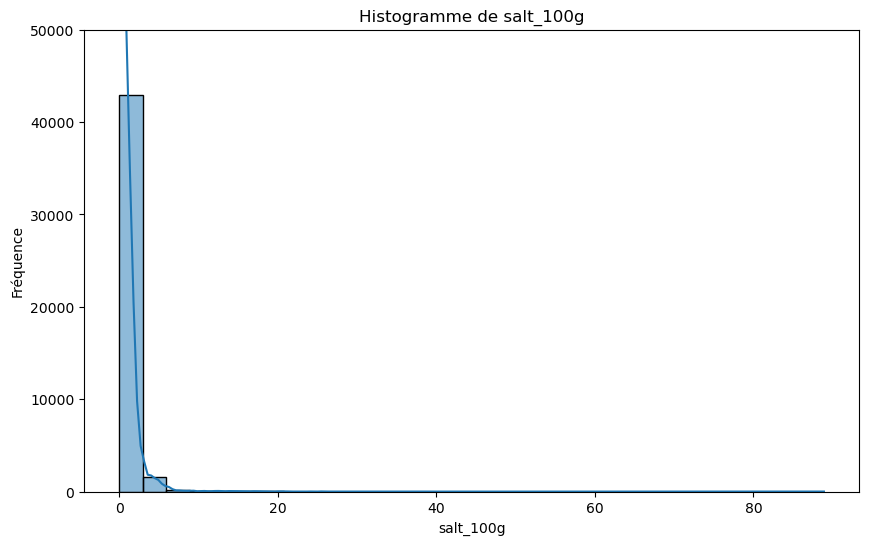

In [144]:
# Créer l'histogramme de 'salt_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['salt_100g'], kde=True, bins=30)
plt.ylim(0, 50000)  # Limiter l'axe des ordonnées à 50 000
plt.title('Histogramme de salt_100g')
plt.xlabel('salt_100g')
plt.ylabel('Fréquence')
plt.show()

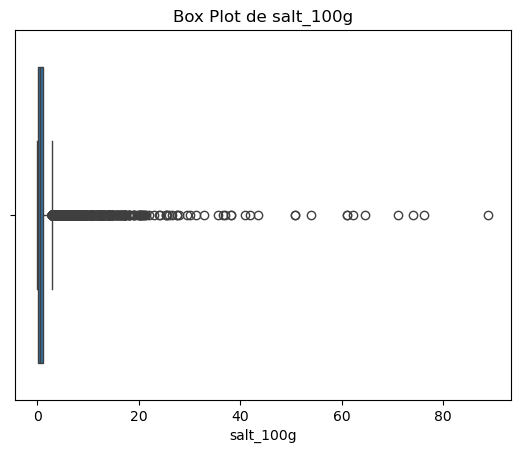

In [145]:
sns.boxplot(x=X['salt_100g'])
plt.title('Box Plot de salt_100g')
plt.show()

#### Analyse des corrélation de salt et des autres variables

Avant d'imputer les valeurs manquantes de salt_100g, il est crucial d'examiner ses corrélations avec les autres variables. Cette analyse permet de comprendre les relations potentielles entre salt_100g et d'autres caractéristiques, ce qui peut guider le choix de la méthode d'imputation. De plus, des corrélations observées dans les données manquantes suggèrent que les absences ne sont pas aléatoires (non-MCAR), renforçant l'importance d'une imputation adaptée pour préserver la structure des données.

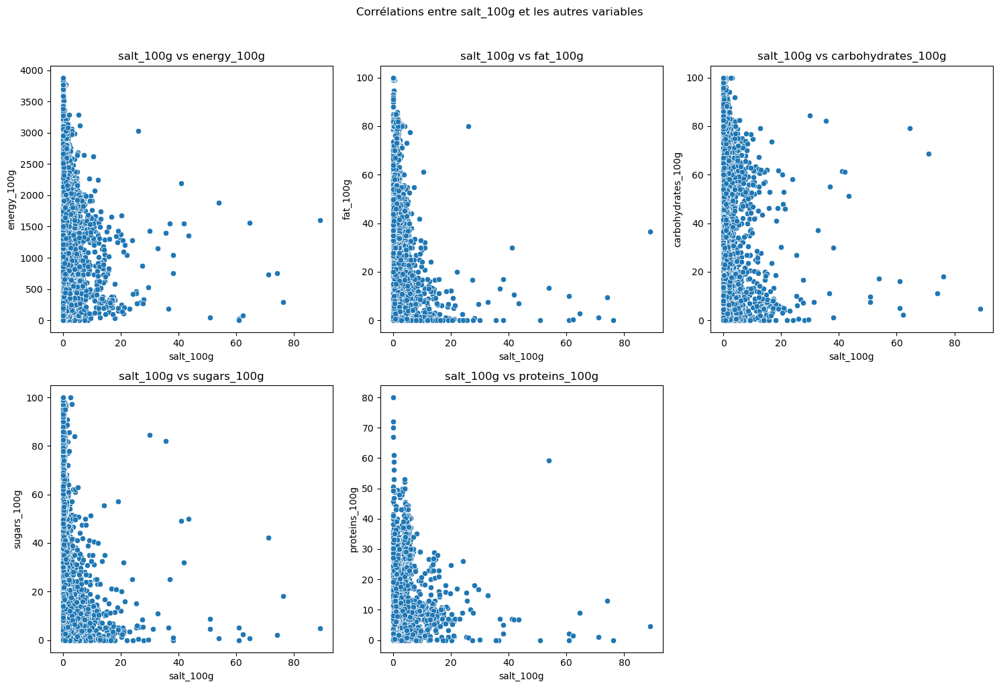

In [146]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à salt_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre salt_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf salt_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'salt_100g']):
    sns.scatterplot(data=df, x='salt_100g', y=col, ax=axes[i])
    axes[i].set_title(f'salt_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

Comme les nuages de points ne révèlent pas de relation linéaire entre salt_100g et les autres variables, il est préférable d’utiliser une corrélation de Spearman. Cette méthode évalue les relations non linéaires et est moins sensible aux valeurs aberrantes. En examinant les corrélations de Spearman, on peut mieux comprendre les associations monotones entre salt_100g et les autres variables, ce qui peut être crucial pour choisir les caractéristiques pertinentes lors de l'imputation.

In [147]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'salt_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'proteins_100g', 'fat_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['salt_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'salt_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['salt_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.373047
energy_100g           0.184495
proteins_100g         0.487276
fat_100g              0.395373
carbohydrates_100g   -0.223334
Name: salt_100g, dtype: float64


Interprétation des coefficients :<br>
proteins_100g (0.487) :
Corrélation positive modérée. Cela signifie que lorsque la teneur en protéines dans un produit augmente, la teneur en sel tend également à augmenter.

fat_100g (0.395) :
Corrélation positive modérée. Les produits contenant plus de matières grasses ont tendance à avoir légèrement plus de sel, mais l'effet est moins prononcé qu'avec les protéines.

energy_100g (0.184) :
Corrélation positive faible. Il existe une relation entre la teneur en énergie et le sel, mais elle est peu marquée.

carbohydrates_100g (-0.223) :
Corrélation négative faible. Les produits riches en glucides ont tendance à contenir un peu moins de sel, mais la relation est limitée.

sugars_100g (-0.373) :
Corrélation négative modérée. Cela indique que les produits sucrés ont tendance à contenir moins de sel, ce qui correspond à l'idée que les produits sucrés et salés sont souvent des catégories opposées.

<Axes: title={'center': "Corrélation Spearman avec 'salt_100g'"}>

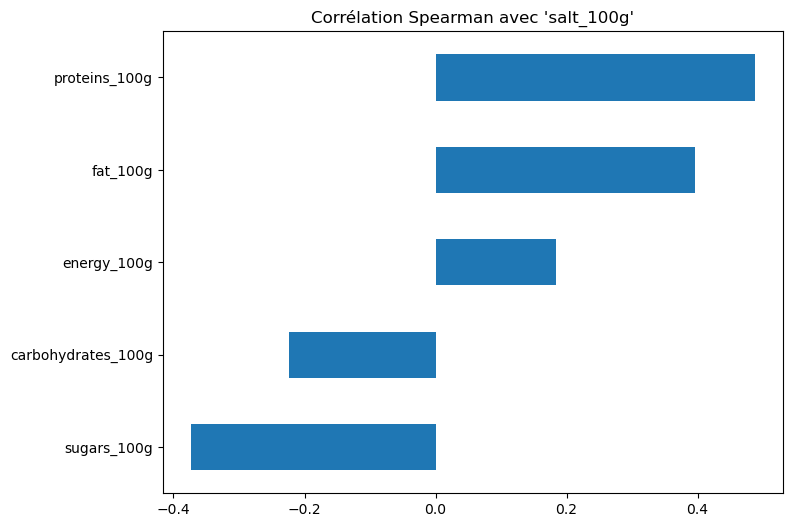

In [148]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'salt_100g'")

Les résultats de l'analyse des corrélations de Spearman montrent des associations monotones entre salt_100g et les autres variables :<br>

Une corrélation positive notable avec proteins_100g et fat_100g, indiquant des relations significatives.<br>
Des corrélations négatives avec sugars_100g et carbohydrates_100g, bien que plus faibles.<br>
Ces relations suggèrent qu’il existe des associations intéressantes entre salt_100g et certaines variables quantitatives, ce qui peut être utile pour l'imputation.<br>

Pourquoi choisir KNN pour l'imputation ?<br>
Je choisis l'imputation KNN car cette méthode prend en compte les relations complexes et non linéaires entre les variables. En utilisant KNN, je peux imputer les valeurs manquantes de salt_100g en me basant sur les valeurs des voisins les plus proches, ce qui permet de mieux préserver les structures des associations existantes entre les différentes caractéristiques du dataset.

#### Imputation avec la méthode des KNN

L'imputation des valeurs manquantes de salt_100g à l'aide de la méthode KNN (K-Nearest Neighbors) est une approche pertinente, étant donné que vos données ne sont pas MCAR (Missing Completely At Random) et que les valeurs manquantes de salt_100g sont corrélées avec celles d'autres variables. <br>

Fonctionnement de l'imputation KNN :<br>
Pour chaque observation avec une valeur manquante, l'algorithme identifie les k observations les plus proches dans l'espace multidimensionnel des variables sélectionnées.<br>
La valeur manquante est imputée en utilisant la moyenne (pour les variables continues) ou le mode (pour les variables catégorielles) des valeurs correspondantes des k voisins les plus proches. Ce processus est répété pour toutes les valeurs manquantes.<br>

Voici les points clés pour mettre en œuvre cette méthode :<br>

**Choix de k** :<br>
Je vais commencer par utiliser la racine carrée du nombre total d'observations dans mon jeu de données comme point de départ pour k. Nous avons 48202 observation donc nous choisirons k = 220 <br>

**Sélection des variables** :<br>
En combinant les deux analyses des corrélation des données manquantes et l'analyse des corrélation des variables, voici les variables à inclure dans KNN, classées par pertinence :

**Très pertinentes (corrélation élevée avec les données observées et/ou manquantes)** :<br>
sugars_100g (-0.37) : Corrélation négative modérée avec les données observées, forte corrélation avec les données manquantes (0.81).<br>
proteins_100g (0.49) : Bonne corrélation monotone avec les données observées.<br>

**Modérément pertinentes (corrélations faibles mais utiles)** :<br>
fat_100g (0.4): Corrélation positive modérée avec les données observées.<br>
energy_100g (0.18): Corrélation faible mais présente avec les données observées et manquantes.<br>
Cependant, nutrionnellement pertinentes car: La teneur en sel peut influencer la valeur énergétique globale d'un aliment.
Les aliments transformés à haute teneur en sel ont souvent une densité énergétique élevée.

**Moins pertinentes** :<br>
carbohydrates_100g (-0.22): Faible corrélation avec les données observées et les données manquantes. Peut être incluse pour renforcer la distance KNN mais n’apportera pas beaucoup d’information.<br>

Cette approche permettra de prendre en compte les relations entre les variables et d'obtenir une imputation plus précise des valeurs manquantes de salt_100g.

In [149]:
# Liste des variables numériques à utiliser pour imputer 'salt_100g'
features_a_normaliser = ['sugars_100g', 'fat_100g', 'energy_100g', 'proteins_100g', 'salt_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X[features_a_normaliser] = scaler.fit_transform(X[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [150]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.049994,2.025101,0.709577,-0.730587,23.00
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.102692,-0.370645,0.019709,0.802772,54.10
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.132699,-0.573887,-0.133533,0.617241,38.70
185,0000008237798,Quiche Lorraine,-0.778866,-0.381449,-0.291297,-0.216005,-0.691626,7.86
186,0000008240095,Pâté au poulet,-0.421768,-0.164508,3.681660,-0.084495,-0.173176,16.60


In [151]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'salt_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'salt_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs =  features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de salt_100g uniquement
X[['salt_100g']] = imputer.fit_transform(X[features_predicteurs + ['salt_100g']])[:, -1].reshape(-1, 1)

In [152]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.049994,2.025101,0.709577,-0.730587,23.00
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.102692,-0.370645,0.019709,0.802772,54.10
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.132699,-0.573887,-0.133533,0.617241,38.70
185,0000008237798,Quiche Lorraine,-0.778866,-0.381449,-0.291297,-0.216005,-0.691626,7.86
186,0000008240095,Pâté au poulet,-0.421768,-0.164508,3.681660,-0.084495,-0.173176,16.60


In [153]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X[features_a_normaliser] = scaler.inverse_transform(X[features_a_normaliser])

In [154]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.160,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.922,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.647,24.700,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.499,0.714,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.735,10.215,16.60


#### Vérification de la distribution de salt_100g après imputation

In [155]:
X['salt_100g'].describe()

count    47979.000000
mean         0.879941
std          1.742723
min          0.000000
25%          0.090000
50%          0.550000
75%          1.200000
max         88.900000
Name: salt_100g, dtype: float64

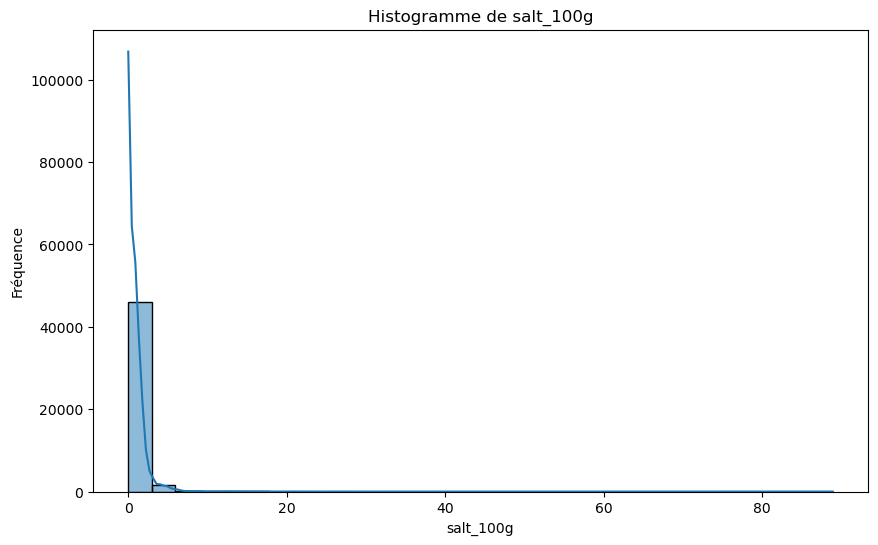

In [156]:
# Créer l'histogramme de 'salt_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['salt_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de salt_100g')
plt.xlabel('salt_100g')
plt.ylabel('Fréquence')
plt.show()

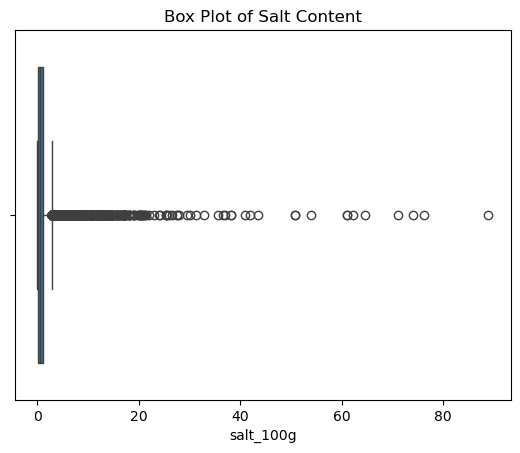

In [157]:
sns.boxplot(x=X['salt_100g'])
plt.title('Box Plot of Salt Content')
plt.show()

| Statistique        | Avant Imputation       | Après Imputation        |
|:--------------------|:-----------------------|:------------------------|
| Nombre de valeurs  | 45193                  | 47979                     |
| Moyenne             | 0.885                  | 0.880                  |
| Écart-type         | 1.791                  | 1.743                |
| Valeur minimale    | 0.000                  | 0.000                     |
| 1er Quartile (25%)  | 0.076                  | 0.090                     |
| Médiane (50%)       | 0.520                  | 0.550                    |
| 3ème Quartile (75%)  | 1.200                  | 1.200                     |
| Valeur maximale    | 88.9                   | 88.9                      |


Moyenne :
La moyenne reste très proche (0.885 avant, 0.880 après), ce qui suggère que l'imputation n'a pas introduit de biais significatif dans la répartition globale des valeurs.

Écart-type :
Une légère diminution de l'écart-type (1.791 à 1.743) montre que les valeurs imputées ont réduit la dispersion des données. Cela peut refléter des valeurs imputées plus proches des tendances générales.

Valeur minimale et maximale :
Les bornes extrêmes restent inchangées (0.000 à 88.9), ce qui confirme que l'imputation n'a pas modifié les limites existantes des données.

Quartiles :<br>
1er quartile (Q1) : Une augmentation de 0.076 à 0.090 suggère que les données imputées ont ajouté quelques valeurs légèrement supérieures au bas de la distribution.
Médiane (Q2) : Une légère hausse de 0.520 à 0.550 indique que les valeurs imputées s'inscrivent principalement autour de la tendance centrale.
3e quartile (Q3) : Le maintien de la valeur à 1.200 montre que l'imputation n'a pas modifié le comportement des valeurs dans la partie supérieure de la distribution.

**Conclusion**
Les statistiques montrent que l'imputation a bien respecté la structure des données. La légère réduction de la dispersion et les changements mineurs des quartiles inférieurs et de la médiane indiquent que les valeurs imputées sont cohérentes avec les tendances existantes, sans altérer significativement les distributions globales.

#### Vérification des relations avec les autres variables après imputation

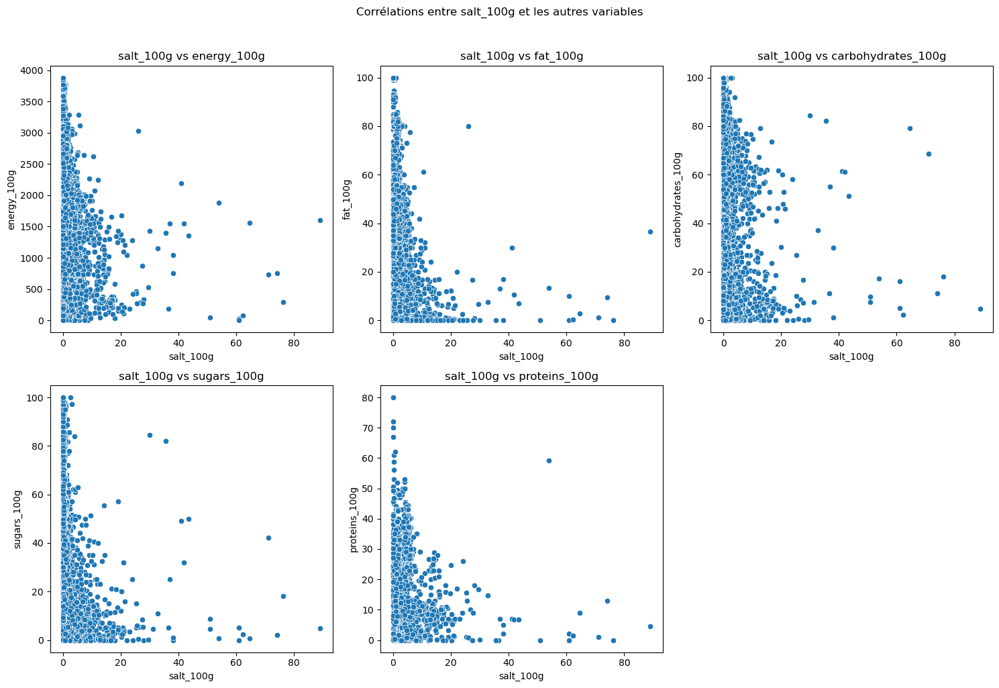

In [158]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à salt_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre salt_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf salt_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'salt_100g']):
    sns.scatterplot(data=df, x='salt_100g', y=col, ax=axes[i])
    axes[i].set_title(f'salt_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [159]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'salt_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'proteins_100g', 'fat_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['salt_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'salt_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['salt_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.373548
energy_100g           0.180305
proteins_100g         0.489779
fat_100g              0.390433
carbohydrates_100g   -0.231985
Name: salt_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'salt_100g'"}>

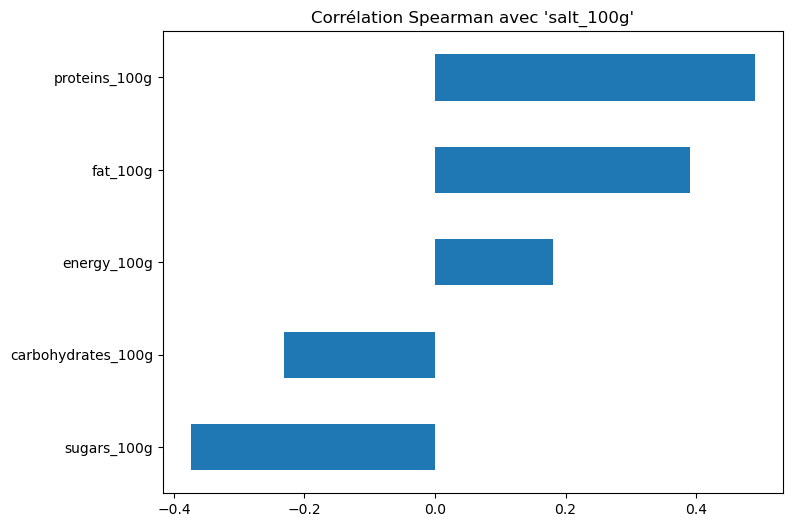

In [160]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'salt_100g'")

| Variable       | Corrélation avec salt_100g (Avant) | Corrélation avec salt_100g (Après) |
|:---------------|:------------------------------------|:------------------------------------|
| sugars_100g    | -0.373                         | -0.374                         |
| energy_100g    | 0.184                          | 0.180                          |
| proteins_100g   | 0.487                          | 0.490                          |
| fat_100g       | 0.395                          | 0.390                          |
| carbohydrates_100g | -0.223                  | -0.232                         |




Stabilité des corrélations :<br>
Les valeurs des corrélations après imputation sont très proches des valeurs initiales. Cela indique que l'imputation avec KNN a réussi à préserver les relations entre salt_100g et les autres variables quantitatives.<br>

Relations robustes :<br>
Les relations importantes, notamment avec des variables telles que sugars_100g, proteins_100g, et fat_100g, sont maintenues. Cela est crucial pour assurer la qualité des relations inter-données, ce qui est indispensable pour les futures analyses prédictives ou les modèles statistiques.<br>

Fiabilité des imputations :<br>
L'imputation KNN semble être une bonne approche dans ce contexte, car elle a conservé la structure des relations sans introduire de déformations notables.<br>

### Imputation de fat_100g

#### Résumé statistique de fat_100g

In [161]:
# Afficher le nombre de valeurs manquantes pour la colonne 'fat_100g'
nombre_manquantes = X['fat_100g'].isnull().sum()
print(f"Nombre de valeurs manquantes pour 'fat_100g' : {nombre_manquantes}")

Nombre de valeurs manquantes pour 'fat_100g' : 2813


In [162]:
X['fat_100g'].describe()

count    45166.000000
mean        12.785833
std         15.718733
min          0.000000
25%          1.040000
50%          6.400000
75%         21.000000
max        100.000000
Name: fat_100g, dtype: float64

**Moyenne** : 12.78 g/100g
La teneur moyenne en matières grasses est de 12.81 g/100g, ce qui donne une vue d'ensemble sur la composition des produits.

**Écart-type** : 15.71 g/100g
Un écart-type assez élevé indique une grande dispersion des valeurs autour de la moyenne. Cela signifie qu’il existe une large variété dans les concentrations de matières grasses entre les produits.

**Valeurs minimales et maximale**s :
Min : 0.000 g/100g
Les valeurs nulles sont présentes et peuvent être explicitées par des produits très faibles en matières grasses.

Max : 100.000 g/100g
Une valeur maximale de 100 g/100g lié à des produits très riches en graisses (huiles).

**Quartiles** :
25ème percentile (Q1) : 1 g/100g
Cela indique que 25% des produits ont une teneur en matières grasses inférieure ou égale à 1 g/100g.

Médiane (Q2) : 6.4 g/100g
La médiane est de 6.4 g/100g.

75ème percentile (Q3) : 21 g/100g
Les valeurs au-dessus du 75ème percentile montrent que de nombreux produits contiennent des niveaux assez élevés de matières grasses.

Les statistiques descriptives montrent une variabilité significative dans les teneurs en matières grasses. Plusieurs observations notables peuvent être mises en évidence :

Une large dispersion des valeurs est confirmée par l'écart-type élevé.
Les valeurs élevées (proches de 100 g/100g) qui sont être représentatives des produits très riches en graisses, comme  huiles végétales.
Les valeurs faibles et moyennes sont plus fréquentes et représentent des produits courants, comme des céréales, boissons, yaourts, etc.

L'analyse des valeurs de fat_100g confirme des tendances attendues dans le contexte des produits alimentaires. La variabilité des teneurs en matières grasses doit être prise en compte lors de l'imputation des valeurs manquantes. Les relations avec d'autres composants nutritionnels (par exemple, sugars_100g, carbohydrates_100g, energy_100g) jouent également un rôle essentiel pour comprendre ces relations inter-dépendantes.

La prochaine imputation doit respecter ces propriétés métier et les relations intrinsèques des composants des aliments, tout en prenant soin de ne pas introduire des valeurs qui dénaturent ces relations naturelles.

#### Visualisation de la distribution de fat_100g

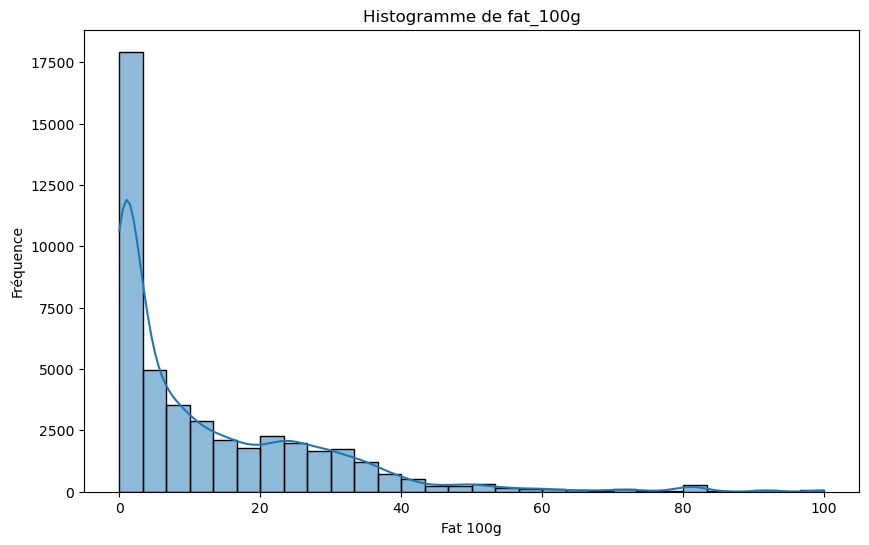

In [163]:
# Créer l'histogramme de 'fat_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['fat_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de fat_100g')
plt.xlabel('Fat 100g')
plt.ylabel('Fréquence')
plt.show()

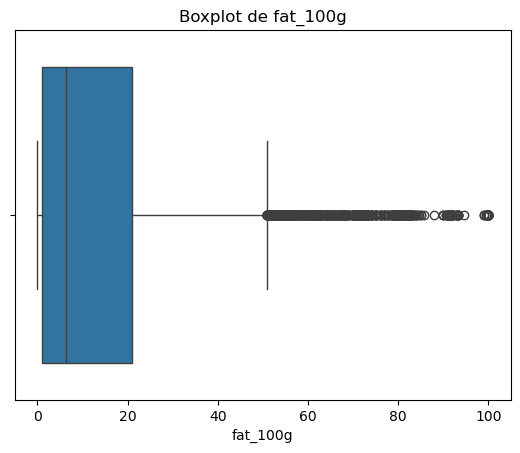

In [164]:
# Boxplot de la variable 'fat_100g'
sns.boxplot(x=X['fat_100g'])
plt.title('Boxplot de fat_100g')
plt.show()

#### Analyse des corrélation de fat_100g et des autres variables

Avant d'imputer les valeurs manquantes de fat_100g, il est essentiel d'analyser ses corrélations avec les autres variables. Cette exploration permet d'identifier les relations potentielles entre fat_100g et d'autres caractéristiques, ce qui peut influencer le choix de la méthode d'imputation. En outre, les corrélations observées dans les valeurs manquantes indiquent que ces absences ne sont pas aléatoires (non-MCAR), ce qui renforce la nécessité d'une imputation soignée pour maintenir la cohérence et l'intégrité des relations dans les données.

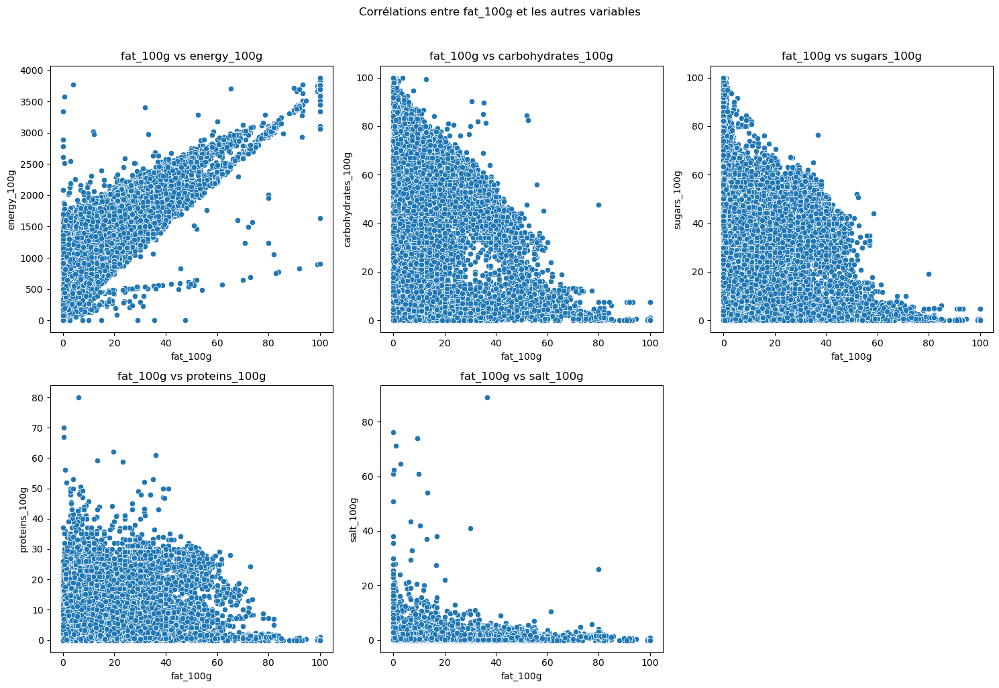

In [165]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à salt_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre fat_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf fat_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'fat_100g']):
    sns.scatterplot(data=df, x='fat_100g', y=col, ax=axes[i])
    axes[i].set_title(f'fat_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

Comme les nuages de points ne montrent pas de relation linéaire entre fat_100g et les autres variables, il est préférable d’utiliser une corrélation de Spearman. Cette méthode capture les relations non linéaires et est moins influencée par les valeurs aberrantes. En analysant les corrélations de Spearman, on peut identifier les associations monotones entre fat_100g et les autres caractéristiques, ce qui aide à sélectionner les variables les plus pertinentes pour l'imputation.

In [166]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'salt_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'proteins_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['fat_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'salt_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['fat_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.024330
energy_100g           0.767029
proteins_100g         0.487506
salt_100g             0.390433
carbohydrates_100g    0.009609
Name: fat_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'fat_100g'"}>

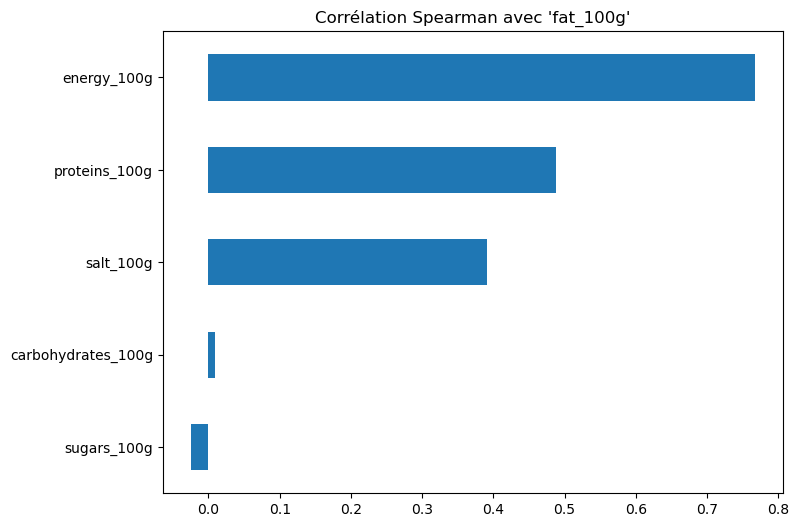

In [167]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'fat_100g'")

Interprétation des coefficients de corrélation de Spearman pour fat_100g :<br>
energy_100g (0.767) :<br>
Corrélation positive forte. Une teneur plus élevée en énergie dans un produit est fortement associée à une augmentation des matières grasses. Cela peut être dû à des aliments énergétiques riches en graisses saturées.<br>

proteins_100g (0.487) :<br>
Corrélation positive modérée. Une teneur plus élevée en protéines dans un produit est souvent liée à une teneur en matières grasses plus importante. Cela peut être observé dans certains produits où les protéines et les graisses sont corrélées, comme dans les viandes grasses.<br>

salt_100g (0.39) :<br>
Corrélation positive faible à modérée. Les produits avec une teneur plus élevée en matières grasses ont également une légère augmentation de la teneur en sel. Cela peut être dû aux recettes où des ingrédients riches en matières grasses nécessitent aussi des ajustements en sel.<br>

carbohydrates_100g (0.009) :<br>
Corrélation négligeable. Les glucides ne semblent pas avoir de relation significative avec la teneur en matières grasses, ce qui signifie qu'ils sont indépendants dans ce contexte.<br>

sugars_100g (-0.024) :<br>
Corrélation négative faible. Une quantité plus élevée de sucre dans un produit n'est pas associée à une variation notable des matières grasses. Cela peut être dû au fait que les produits sucrés ne partagent pas nécessairement les mêmes propriétés nutritionnelles que ceux riches en graisses.<br>

En résumé, fat_100g présente des relations plus marquées avec des variables comme energy_100g et proteins_100g, mais pas avec des glucides ou des sucres. Cela doit être pris en compte lors de l'imputation, notamment pour préserver les associations pertinentes entre les matières grasses et les autres variables.

**Conclusion** :<br>
Ces relations suggèrent qu’il existe des associations importantes entre fat_100g et d'autres attributs du dataset. Cela peut être exploité pour choisir une méthode d'imputation qui maintient ces relations.<br>

Pourquoi choisir KNN pour l'imputation ?<br>
Je choisis l'imputation KNN car cette méthode prend en compte les relations complexes et non linéaires entre les variables. En utilisant KNN, je peux imputer les valeurs manquantes de salt_100g en me basant sur les valeurs des voisins les plus proches, ce qui permet de mieux préserver les structures des associations existantes entre les différentes caractéristiques du dataset.

#### Imputation avec la méthode des KNN

L'imputation des valeurs manquantes de fat_100g à l'aide de la méthode KNN (K-Nearest Neighbors) est une approche adaptée, en raison des relations complexes et des associations significatives que cette variable entretient avec d'autres caractéristiques du dataset. Les valeurs manquantes ne sont pas aléatoires et présentent des associations interconnectées qui nécessitent une imputation prenant en compte ces relations.

Sélection des variables pour l'imputation KNN<br>
**Très pertinentes (corrélations élevées avec les données manquantes ou observées)** :<br>
**energy_100g (0.767)** :
Corrélation positive forte. Cela signifie que les produits avec une teneur plus élevée en énergie contiennent généralement davantage de matières grasses, souvent en raison des graisses saturées présentes dans ces aliments.

**proteins_100g (0.487)** :
Corrélation positive modérée. Une teneur élevée en protéines est souvent associée à une teneur en matières grasses plus élevée, notamment dans des produits comme les viandes grasses.

**carbohydrates_100g (0.008)** :
Corrélation négligeable avec fat_100g, ce qui indique que les glucides ne partagent pas de relation significative avec la teneur en matières grasses dans ce contexte. Mais une forte corrélation des valeurs manquantes (0.86 avec fat_100g). Son inclusion peut renforcer la distance KNN sans apporter d’information majeure.


**Modérément pertinentes (corrélations utiles mais moins marquées)** :<br>
**salt_100g (0.39)** :
Corrélation positive faible à modérée. Les produits avec une teneur plus élevée en matières grasses présentent également une légère augmentation de la teneur en sel, possiblement due aux ajustements des recettes.


**Moins pertinentes** :<br>
**sugars_100g** : 
Corrélation négative faible (-0.024) et corrélation négligeable avec fat_100g dans les schémas manquants.
La corrélation des valeurs manquantes pour sugars_100g et fat_100g est relativement faible. 

Conclusion
Pour l'imputation de fat_100g, la priorité doit être donnée à **energy_100g, suivi de proteins_100g et carbohydrates_100g (en raison de la forte corrélation des valeurs manquantes)**. Salt_100g peut être inclus, mais avec moins d'importance, tandis que sugars_100g n'apporte pas une contribution significative pour l'imputation de fat_100g.

In [168]:
X_copie = X.copy()

##### Imputation de fat_100g par KNN en utilisation les variables trés pertinentes

In [169]:
# Liste des variables numériques à utiliser pour imputer 'fat_100g'
features_a_normaliser = ['energy_100g', 'proteins_100g', 'carbohydrates_100g', 'fat_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X[features_a_normaliser] = scaler.fit_transform(X[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [170]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.049994,2.025101,2.160,0.000,-0.162621
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.102692,-0.370645,0.922,28.100,0.985665
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.132699,-0.573887,0.647,24.700,0.417060
185,0000008237798,Quiche Lorraine,-0.778866,-0.381449,-0.291297,0.499,0.714,-0.721626
186,0000008240095,Pâté au poulet,-0.421768,-0.164508,3.681660,0.735,10.215,-0.398924


In [171]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'fat_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'fat_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs = features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de fat_100g uniquement
X[['fat_100g']] = imputer.fit_transform(X[features_predicteurs + ['fat_100g']])[:, -1].reshape(-1, 1)

In [172]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.049994,2.025101,2.160,0.000,-0.162621
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.102692,-0.370645,0.922,28.100,0.985665
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.132699,-0.573887,0.647,24.700,0.417060
185,0000008237798,Quiche Lorraine,-0.778866,-0.381449,-0.291297,0.499,0.714,-0.721626
186,0000008240095,Pâté au poulet,-0.421768,-0.164508,3.681660,0.735,10.215,-0.398924


In [173]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X[features_a_normaliser] = scaler.inverse_transform(X[features_a_normaliser])

In [174]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.160,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.922,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.647,24.700,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.499,0.714,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.735,10.215,16.60


##### Imputation de fat_100g en utilisant les variables très pertinentes et modérément pertinentes

In [175]:
# Liste des variables numériques à utiliser pour imputer 'fat_100g'
features_a_normaliser = ['energy_100g', 'proteins_100g', 'carbohydrates_100g', 'salt_100g', 'fat_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X_copie[features_a_normaliser] = scaler.fit_transform(X_copie[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [176]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.049994,2.025101,0.734524,0.000,-0.162621
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.102692,-0.370645,0.024134,28.100,0.985665
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.132699,-0.573887,-0.133667,24.700,0.417060
185,0000008237798,Quiche Lorraine,-0.778866,-0.381449,-0.291297,-0.218592,0.714,-0.721626
186,0000008240095,Pâté au poulet,-0.421768,-0.164508,3.681660,-0.083170,10.215,-0.398924


In [177]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'fat_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'fat_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs = features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X_copie)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de fat_100g uniquement
X_copie[['fat_100g']] = imputer.fit_transform(X_copie[features_predicteurs + ['fat_100g']])[:, -1].reshape(-1, 1)

In [178]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.049994,2.025101,0.734524,0.000,-0.162621
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.102692,-0.370645,0.024134,28.100,0.985665
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.132699,-0.573887,-0.133667,24.700,0.417060
185,0000008237798,Quiche Lorraine,-0.778866,-0.381449,-0.291297,-0.218592,0.714,-0.721626
186,0000008240095,Pâté au poulet,-0.421768,-0.164508,3.681660,-0.083170,10.215,-0.398924


In [179]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X_copie[features_a_normaliser] = scaler.inverse_transform(X_copie[features_a_normaliser])

In [180]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.160,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.922,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.647,24.700,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.499,0.714,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.735,10.215,16.60


#### Vérification de la distribution de fat_100g après imputation

##### Après imputation par KNN avec les variables très pertinentes

In [181]:
X['fat_100g'].describe()

count    47979.000000
mean        12.828253
std         15.733475
min          0.000000
25%          1.000000
50%          6.500000
75%         21.000000
max        100.000000
Name: fat_100g, dtype: float64

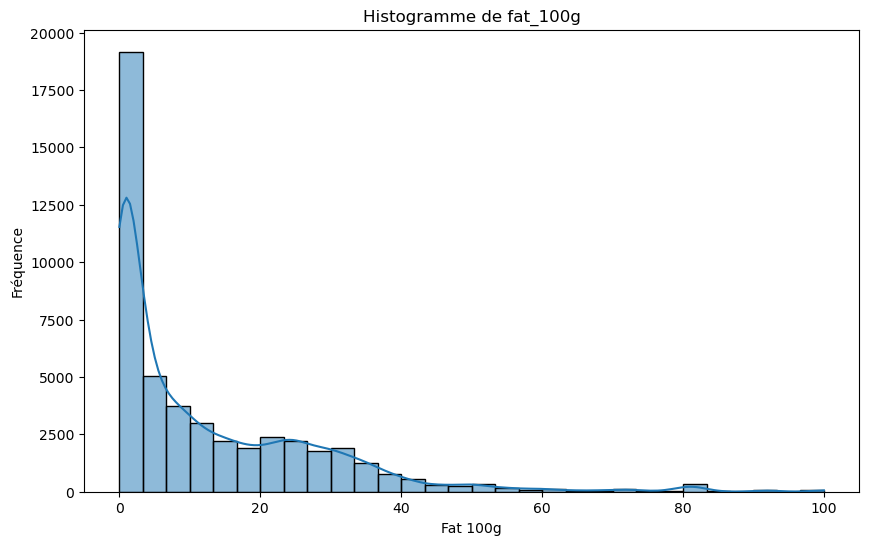

In [182]:
# Créer l'histogramme de 'fat_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['fat_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de fat_100g')
plt.xlabel('Fat 100g')
plt.ylabel('Fréquence')
plt.show()

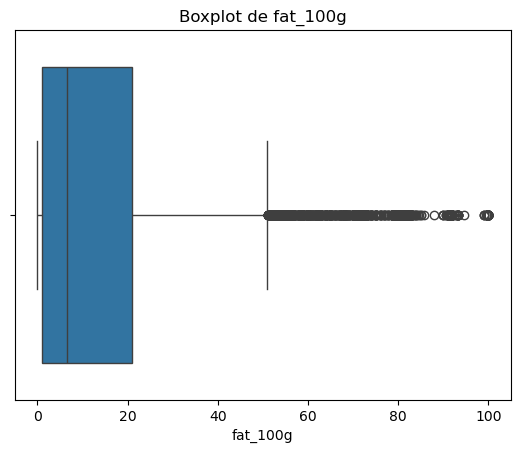

In [183]:
# Boxplot de la variable 'fat_100g'
sns.boxplot(x=X['fat_100g'])
plt.title('Boxplot de fat_100g')
plt.show()

##### Après imputation par KNN avec les variables très pertinentes et modérément pertinentes

In [184]:
X_copie['fat_100g'].describe()

count    47979.00000
mean        12.75690
std         15.73776
min          0.00000
25%          1.00000
50%          6.20000
75%         21.00000
max        100.00000
Name: fat_100g, dtype: float64

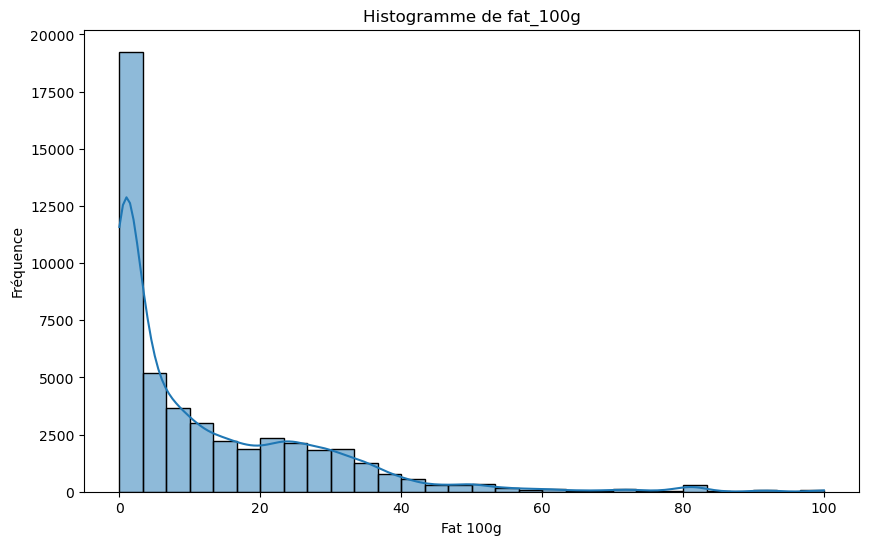

In [185]:
# Créer l'histogramme de 'fat_100g'
plt.figure(figsize=(10,6))
sns.histplot(X_copie['fat_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de fat_100g')
plt.xlabel('Fat 100g')
plt.ylabel('Fréquence')
plt.show()

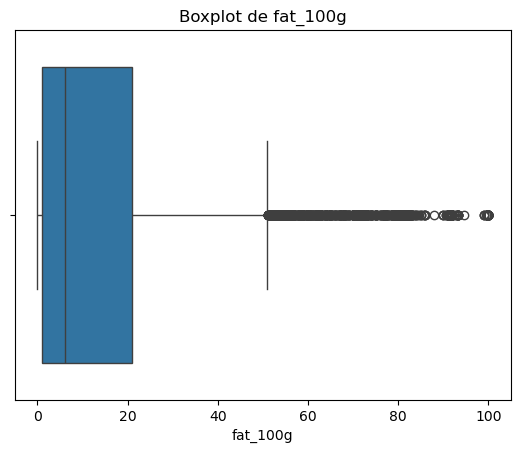

In [186]:
# Boxplot de la variable 'fat_100g'
sns.boxplot(x=X_copie['fat_100g'])
plt.title('Boxplot de fat_100g')
plt.show()

| **Statistique**           | **Avant Imputation** | **Après Imputation 1** | **Après Imputation 2** |
|:--------------------------|----------------------|-----------------------|----------------|
| **Nombre de valeurs**     | 45 166              | 47 979               | 47 979      |
| **Moyenne**               | 12.78              | 12.83               | 12.76      |
| **Écart-type**            | 15.71              | 15.73               | 15.73     |
| **Valeur minimale**       | 0.00               | 0.00               | 0.00    |
| **1er Quartile (25%)**    | 1.04               | 1.00                | 1.00     |
| **Médiane (50%)**         | 6.40               | 6.50                | 6.27     |
| **3ème Quartile (75%)**   | 21.00              | 21.00               | 21.00       |
| **Valeur maximale**       | 100.00             | 100.00              | 100.00      |


L'analyse des résultats d'imputation montre que l'**Imputation 1 est la meilleure approche**. La médiane après cette imputation atteint 6.50, une valeur très proche de la médiane d'origine (6.40). Cela signifie que l'imputation a réussi à maintenir la structure des valeurs centrales des produits sans déformer leurs relations internes.

De plus, contrairement à l'Imputation 2, où la médiane chute à 6.27, l'Imputation 1 conserve une distribution des valeurs cohérente avec les tendances initiales des données. Cela garantit des résultats plus réalistes et représentatifs des relations internes entre les produits.

#### Vérification des relations avec les autres variables après imputation

##### Vérification après imputation par KNN avec uniquement les variables très pertinentes

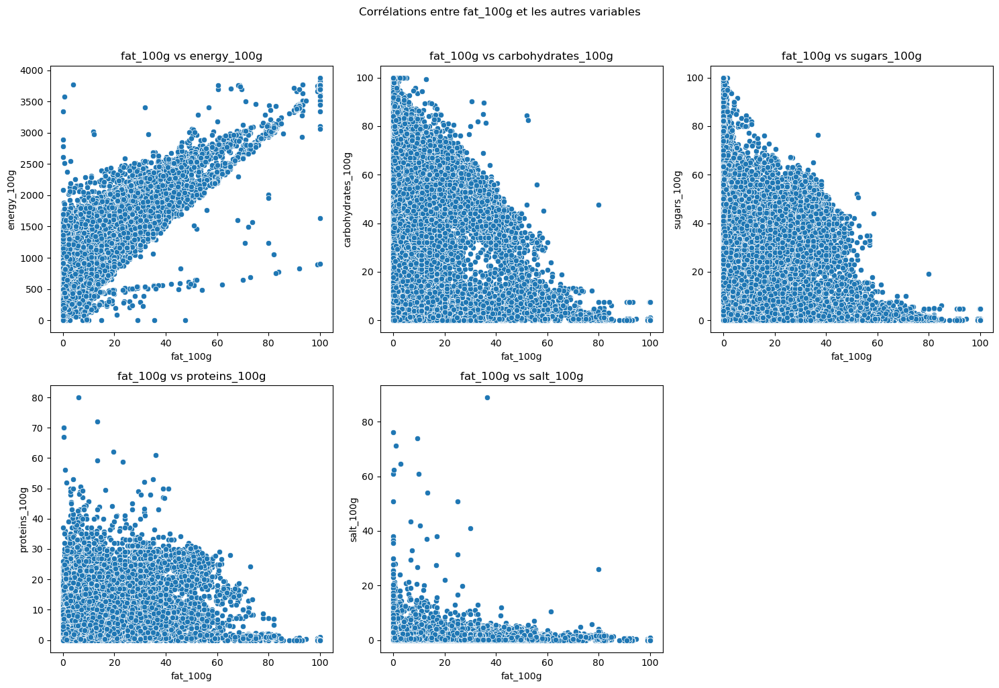

In [187]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à fat_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre fat_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf fat_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'fat_100g']):
    sns.scatterplot(data=df, x='fat_100g', y=col, ax=axes[i])
    axes[i].set_title(f'fat_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [188]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'fat_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'proteins_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['fat_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'fat_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['fat_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.041910
energy_100g           0.766304
proteins_100g         0.499480
salt_100g             0.394452
carbohydrates_100g   -0.009753
Name: fat_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'fat_100g'"}>

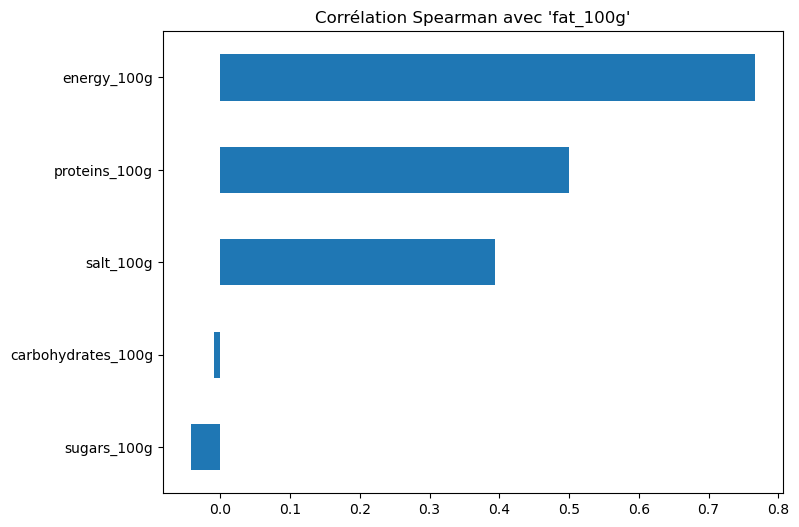

In [189]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'fat_100g'")

##### Vérification après imputation par KNN avec les variables très pertinentes et modérément pertinentes

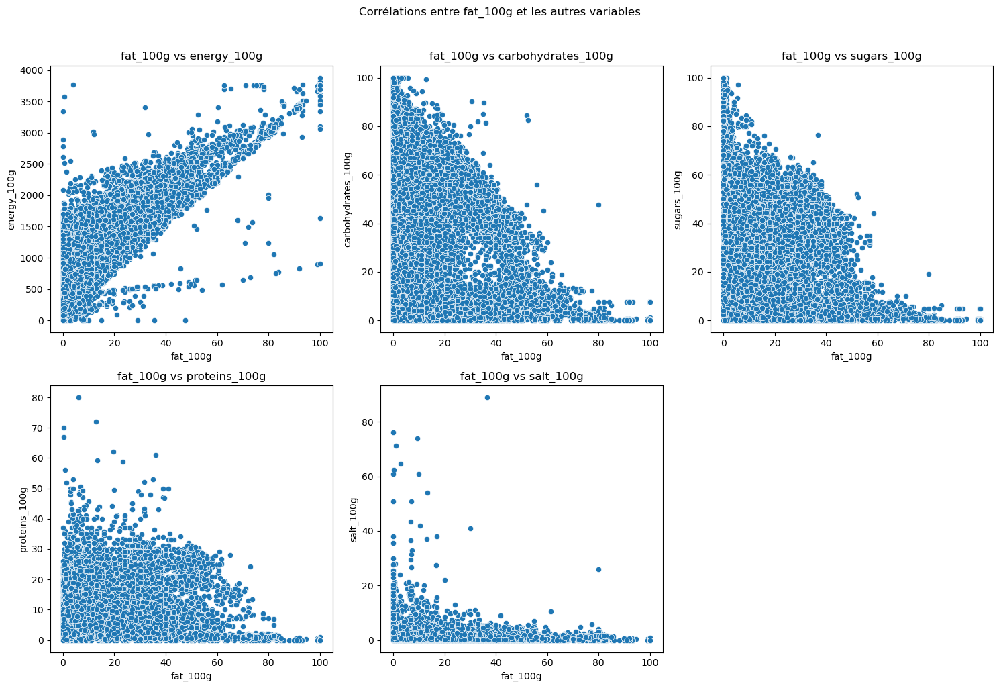

In [190]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X_copie[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à fat_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre fat_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf fat_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'fat_100g']):
    sns.scatterplot(data=df, x='fat_100g', y=col, ax=axes[i])
    axes[i].set_title(f'fat_100g vs {col}')
    
# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [191]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'fat_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'proteins_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X_copie[['fat_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'fat_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['fat_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.042108
energy_100g           0.768849
proteins_100g         0.501624
salt_100g             0.402870
carbohydrates_100g   -0.005801
Name: fat_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'fat_100g'"}>

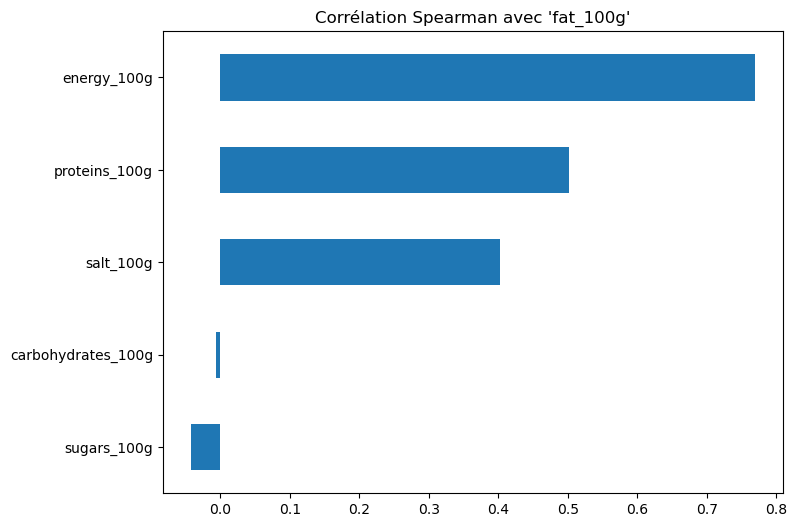

In [192]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'fat_100g'")

| **Variable**            | **Avant Imputation** | **Après Imputation 1** | **Après Imputation 2** |
|:-------------------------|:---------------------|:----------------------|:----------------------|
| **sugars_100g**          | -0.024             | -0.041              |  -0.042          |
| **energy_100g**          |  0.767             |  0.766              |  0.768          |
| **proteins_100g**        |  0.487             |  0.499              |  0.501          |
| **salt_100g**            |  0.390             |  0.394              |  0.402          |
| **carbohydrates_100g**   |  0.009             |  -0.010              |  -0.006         |


Les coefficients de corrélation de Spearman montrent que **l'Imputation 1 est la meilleure option** pour maintenir les relations inter-variables de manière robuste et cohérente.

Après Imputation 1 :
Energy_100g : Les corrélations restent stables autour de 0.767, ce qui indique que l'imputation a parfaitement conservé cette relation forte entre l'énergie et la teneur en matières grasses.

Proteins_100g : Les corrélations montrent une légère augmentation de 0.487 à 0.501, ce qui renforce l'association des protéines avec la teneur en matières grasses.

Salt_100g : Les valeurs passent de 0.390 à 0.402, ce qui consolide cette corrélation sans perturber les relations internes des produits.

Sugars_100g et Carbohydrates_100g : Les valeurs restent proches des corrélations d'origine, ce qui signifie que l'imputation a correctement minimisé l'impact des valeurs manquantes sans altérer ces relations, qui sont initialement faibles.

Après Imputation 2 :
Cependant, l'Imputation 2 présente des déviations plus importantes dans les relations inter-variables :

Energy_100g : La corrélation passe de 0.767 à 0.753, une baisse de 0.014, ce qui montre une légère déviation des relations naturelles.

Proteins_100g : La corrélation diminue de 0.487 à 0.450, ce qui indique une distorsion des associations entre protéines et matières grasses.

Ces déviations montrent que l'Imputation 2 a altéré les relations internes des variables, contrairement à l'Imputation 1, qui a mieux préservé les associations naturelles des données.

En résumé, l'Imputation 1 a efficacement conservé les relations inter-variables, garantissant des résultats précis et réalistes tout en maintenant la cohérence des corrélations. Les déviations après l'Imputation 2 ne sont pas drastiques, mais elles sont suffisantes pour suggérer une altération des relations internes des variables.

In [193]:
# Suppression du DataFrame X_copie
del X_copie

### Imputation de proteins_100g

#### Résumé statistique de proteins_100g

In [194]:
# Afficher le nombre de valeurs manquantes pour la colonne 'proteins_100g'
nombre_manquantes = X['proteins_100g'].isnull().sum()
print(f"Nombre de valeurs manquantes pour 'proteins_100g' : {nombre_manquantes}")

Nombre de valeurs manquantes pour 'proteins_100g' : 713


In [195]:
# Résumé statistique de la variable 'proteins_100g'
X['proteins_100g'].describe()

count    47266.000000
mean         7.452552
std          7.183642
min          0.000000
25%          1.700000
50%          5.900000
75%         10.100000
max         80.000000
Name: proteins_100g, dtype: float64

Moyenne : 7.45 g/100g<br>
La teneur moyenne en protéines est de 7.45 g/100g, ce qui reflète un niveau modéré de protéines dans les produits alimentaires analysés.

Écart-type : 7.18 g/100g<br>
Un écart-type relativement élevé (7.18) indique une dispersion significative des valeurs autour de la moyenne. Cela traduit la diversité des teneurs en protéines selon les types de produits (par exemple, viande, produits laitiers, légumes, boissons).

Valeurs minimales et maximales :<br>
Min : 0.00 g/80g
Les valeurs nulles reflètent des produits très faibles en protéines, comme les boissons sucrées ou les huiles.
Max : 80.00 g/100g<br>
Une valeur maximale de 80 g/100g représente probablement les produits extrêmement riches en protéines, tels que le seitan.

Quartiles :<br>
1er quartile (Q1) : 1.70 g/100g<br>
Cela indique que 25% des produits contiennent 1.7 g/100g de protéines ou moins, typique des produits à faible teneur en protéines.<br>
Médiane (Q2) : 5.90 g/100g<br>
La médiane montre que 50% des produits contiennent moins de 5.9 g/100g de protéines, ce qui est conforme à des produits alimentaires modérément riches.<br>
3ème quartile (Q3) : 10.10 g/100g<br>
Les valeurs au-dessus de 10.1 g/100g montrent des produits riches en protéines, comme les produits à base de viande ou de poisson.

#### Visualisation de la distribution de proteins_100g

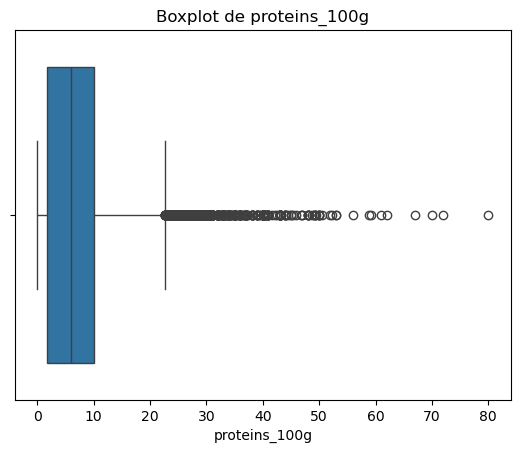

In [196]:
# Boxplot de la variable 'proteins_100g'
sns.boxplot(x=X['proteins_100g'])
plt.title('Boxplot de proteins_100g')
plt.show()

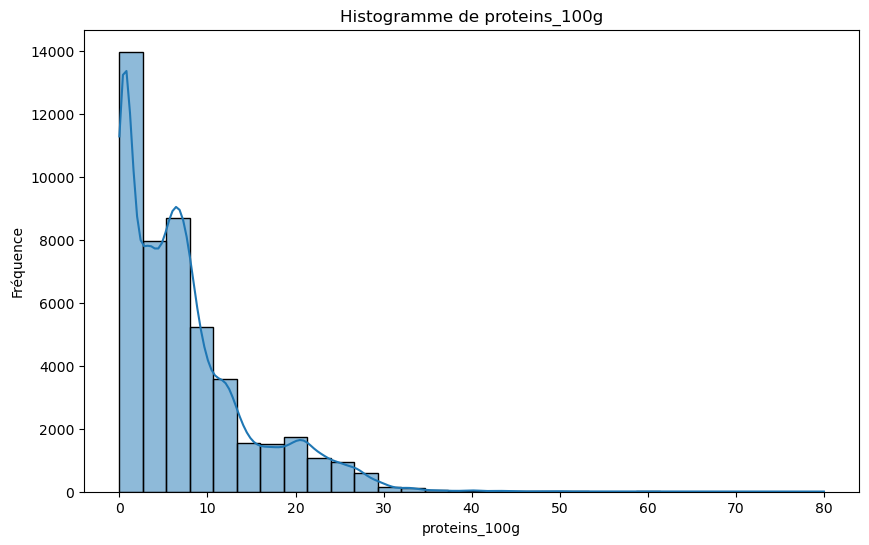

In [197]:
# Créer l'histogramme de 'proteins_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['proteins_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de proteins_100g')
plt.xlabel('proteins_100g')
plt.ylabel('Fréquence')
plt.show()

#### Analyse des corrélation de proteins_100g et des autres variables

Avant d'imputer les valeurs manquantes de proteins_100g, il est crucial d'examiner ses corrélations avec les autres variables. Cette analyse aide à identifier les relations significatives entre proteins_100g et d'autres caractéristiques, influençant ainsi la méthode d'imputation à adopter. De plus, les corrélations observées parmi les valeurs manquantes suggèrent que ces absences ne sont pas aléatoires (non-MCAR). Cela souligne l'importance d'une imputation rigoureuse pour préserver la cohérence et l'intégrité des relations dans les données.

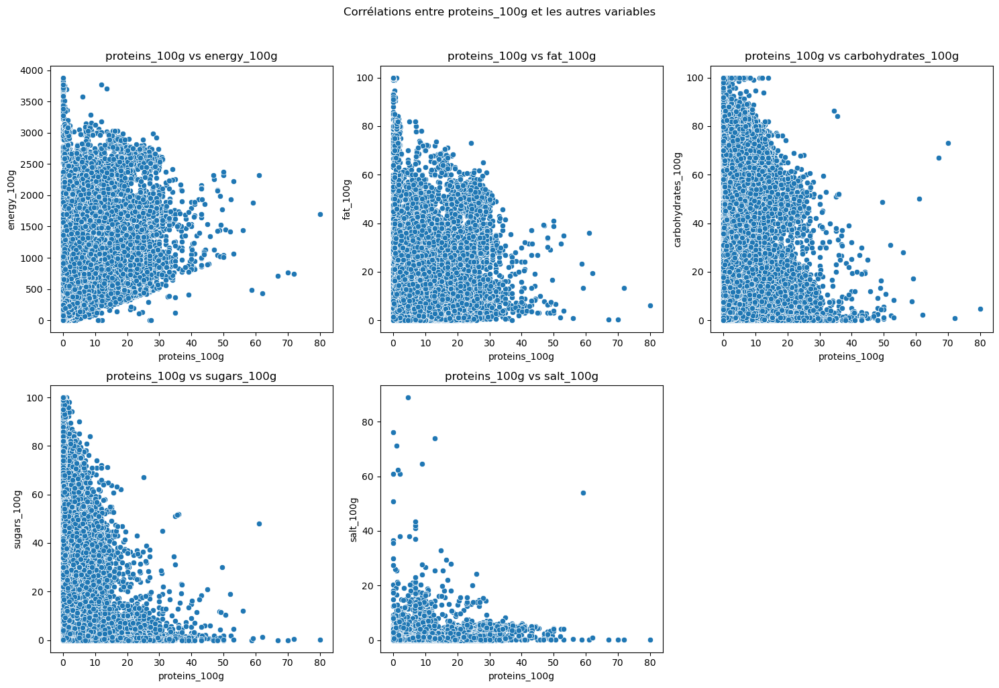

In [198]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à proteins_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre proteins_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf proteins_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'proteins_100g']):
    sns.scatterplot(data=df, x='proteins_100g', y=col, ax=axes[i])
    axes[i].set_title(f'proteins_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

Étant donné que les nuages de points ne révèlent pas de relation linéaire entre proteins_100g et les autres variables, il est plus approprié d'utiliser la corrélation de Spearman. Cette méthode est idéale pour capturer les relations monotones, même non linéaires, et est moins sensible aux valeurs aberrantes. En examinant les corrélations de Spearman, il est possible d’identifier les liens significatifs entre proteins_100g et les autres variables, facilitant ainsi la sélection des prédicteurs les plus pertinents pour l'imputation.

In [199]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'proteins_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'fat_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['proteins_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'proteins_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['proteins_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.312766
energy_100g           0.433842
fat_100g              0.499480
salt_100g             0.489779
carbohydrates_100g   -0.061289
Name: proteins_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'proteins_100g'"}>

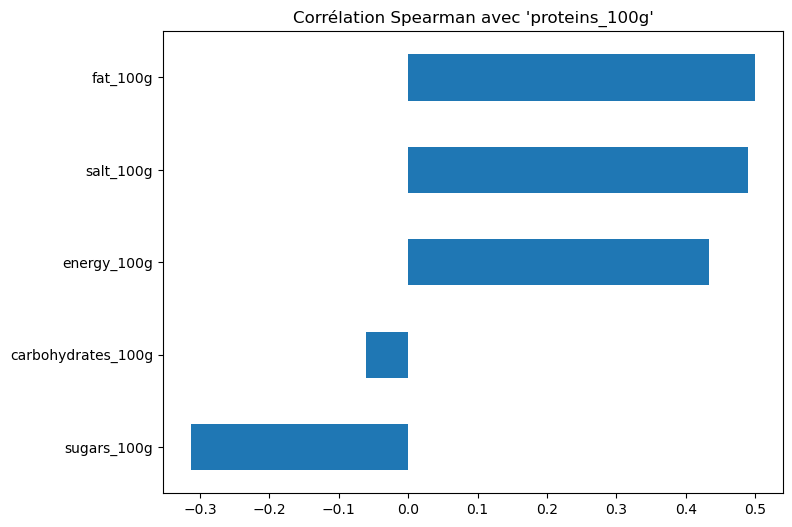

In [200]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'proteins_100g'")

fat_100g (0.499) :
Corrélation positive modérée. Une augmentation de la teneur en protéines est associée à une augmentation des matières grasses. Cela peut être observé dans des produits tels que les fromages ou certaines viandes, où protéines et graisses sont souvent liées.

salt_100g (0.488) :
Corrélation positive modérée. Les produits contenant plus de protéines tendent également à avoir une teneur plus élevée en sel, ce qui peut refléter des pratiques industrielles ou des types d'aliments spécifiques (comme les charcuteries ou les produits transformés riches en protéines).

energy_100g (0.434) :
Corrélation positive modérée. Les aliments plus riches en protéines ont souvent une densité énergétique plus élevée, ce qui est attendu, notamment pour les aliments riches en protéines et en graisses.

sugars_100g (-0.313) :
Corrélation négative modérée. Une teneur plus élevée en protéines est associée à une diminution de la teneur en sucres. Cela peut être observé dans des produits comme les viandes ou les poissons, qui sont riches en protéines mais naturellement faibles en sucres.

carbohydrates_100g (-0.061) :
Corrélation négative très faible. Il n'y a pratiquement pas de relation entre la teneur en protéines et celle en glucides, suggérant que ces deux composants ne sont pas fortement liés dans les produits alimentaires analysés.

Analyse globale :
proteins_100g montre des corrélations modérées avec des variables comme fat_100g, salt_100g et energy_100g, ce qui est cohérent avec les caractéristiques des aliments riches en protéines. En revanche, les relations avec les sucres et les glucides sont faibles ou négligeables, indiquant une indépendance relative.

**Conclusion** :
Lors de l'imputation des valeurs manquantes pour proteins_100g, il sera essentiel de préserver ces associations, notamment avec les matières grasses et le sel, pour garantir la cohérence des données et des relations nutritionnelles.
Dans le cas de proteins_100g, l'imputation par KNN est particulièrement adaptée car cette variable présente des corrélations significatives avec d'autres caractéristiques nutritionnelles telles que fat_100g (0.49), salt_100g (0.48) et energy_100g (0.43). Ces relations suggèrent que les valeurs manquantes peuvent être estimées de manière réaliste en utilisant les observations les plus similaires dans l'espace des variables corrélées.

#### Imputation avec la méthode des KNN

L'imputation des valeurs manquantes de proteins_100g à l'aide de KNN (K-Nearest Neighbors) est une approche judicieuse, car elle tient compte des relations complexes et des associations significatives que cette variable entretient avec d'autres caractéristiques nutritionnelles du dataset. Les données manquantes de proteins_100g ne sont pas aléatoires, ce qui renforce l'importance d'utiliser des variables pertinentes pour préserver la cohérence des relations entre les données.

Sélection des variables pour l'imputation KNN
Sélection des variables :
En combinant les analyses des corrélations entre les données manquantes et les analyses des corrélations des valeurs observées de proteins_100g, voici les variables retenues pour l'imputation, classées par pertinence :

**Très pertinentes (corrélation élevée avec les données observées et/ou manquantes)** :<br>
fat_100g (0.495) :<br>
Corrélation positive modérée avec les valeurs observées de proteins_100g.<br>
Les aliments riches en protéines (viandes, fromages) sont souvent également riches en graisses, ce qui rend cette variable essentielle pour l'imputation.<br>

salt_100g (0.481) :<br>
Corrélation positive modérée avec proteins_100g.<br>
Les produits transformés riches en protéines (comme les charcuteries) contiennent également souvent plus de sel, ce qui en fait une variable clé.<br>

energy_100g (0.434) :<br>
Corrélation positive modérée avec proteins_100g.<br>
La densité énergétique des produits alimentaires est souvent liée à leur teneur en protéines, notamment dans les aliments riches en graisses.<br>

**Modérément pertinentes** :<br>
sugars_100g (-0.311) :<br>
Corrélation négative modérée avec proteins_100g et corrélation modérée dans les valeurs manquantes (0.25).<br>

**Moins pertinentes** :<br>
carbohydrates_100g (-0.059) :<br>
Corrélation très faible avec proteins_100g et corrélation modérée dans les valeurs manquantes (0.27).<br>
Peu d’association nutritionnelle directe, mais inclure cette variable peut aider à mieux définir la distance dans l’espace des caractéristiques pour KNN.<br>

**Conclusion** :<br>
Cette sélection des variables permet de maximiser la pertinence des données utilisées pour l'imputation. En incluant des variables fortement corrélées et des variables contextuellement importantes, le KNN peut estimer les valeurs manquantes de manière plus précise, tout en préservant les relations nutritionnelles et structurelles du dataset.

In [201]:
X_copie = X.copy()

##### Imputation par KNN uniquement avec les variables très pertinentes

In [202]:
# Liste des variables numériques à utiliser pour imputer 'proteins_100g'
features_a_normaliser = ['energy_100g', 'salt_100g', 'fat_100g', 'proteins_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X[features_a_normaliser] = scaler.fit_transform(X[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [203]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.052643,2.025101,0.734524,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.099899,-0.370645,0.024134,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.135271,-0.573887,-0.133667,24.700,38.70
185,0000008237798,Quiche Lorraine,-0.778866,-0.383788,-0.291297,-0.218592,0.714,7.86
186,0000008240095,Pâté au poulet,-0.421768,-0.167050,3.681660,-0.083170,10.215,16.60


In [204]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'proteins_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'proteins_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs = features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de proteins_100g uniquement
X[['proteins_100g']] = imputer.fit_transform(X[features_predicteurs + ['proteins_100g']])[:, -1].reshape(-1, 1)

In [205]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.052643,2.025101,0.734524,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.099899,-0.370645,0.024134,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.135271,-0.573887,-0.133667,24.700,38.70
185,0000008237798,Quiche Lorraine,-0.778866,-0.383788,-0.291297,-0.218592,0.714,7.86
186,0000008240095,Pâté au poulet,-0.421768,-0.167050,3.681660,-0.083170,10.215,16.60


In [206]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X[features_a_normaliser] = scaler.inverse_transform(X[features_a_normaliser])

In [207]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.160,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.922,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.647,24.700,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.499,0.714,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.735,10.215,16.60


##### Imputation par KNN avec les variables très pertinentes et modérément pertinentes

In [208]:
# Liste des variables numériques à utiliser pour imputer 'proteins_100g'
features_a_normaliser = ['energy_100g', 'salt_100g', 'fat_100g', 'sugars_100g','proteins_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X_copie[features_a_normaliser] = scaler.fit_transform(X[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [209]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.052643,2.032767,0.734524,-0.730587,23.00
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.099899,-0.370345,0.024134,0.802772,54.10
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.135271,-0.574211,-0.133667,0.617241,38.70
185,0000008237798,Quiche Lorraine,-0.778866,-0.383788,-0.290753,-0.218592,-0.691626,7.86
186,0000008240095,Pâté au poulet,-0.421768,-0.167050,3.694419,-0.083170,-0.173176,16.60


In [210]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'proteins_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'proteins_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs = features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X_copie)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de proteins_100g uniquement
X_copie[['proteins_100g']] = imputer.fit_transform(X_copie[features_predicteurs + ['proteins_100g']])[:, -1].reshape(-1, 1)

In [211]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.052643,2.032767,0.734524,-0.730587,23.00
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.099899,-0.370345,0.024134,0.802772,54.10
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.135271,-0.574211,-0.133667,0.617241,38.70
185,0000008237798,Quiche Lorraine,-0.778866,-0.383788,-0.290753,-0.218592,-0.691626,7.86
186,0000008240095,Pâté au poulet,-0.421768,-0.167050,3.694419,-0.083170,-0.173176,16.60


In [212]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X_copie[features_a_normaliser] = scaler.inverse_transform(X_copie[features_a_normaliser])

In [213]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.160,0.000,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.922,28.100,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.647,24.700,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.499,0.714,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.735,10.215,16.60


#### Vérification de la distribution de proteins_100g après imputation

##### Après imputation par KNN uniquement avec les variables très pertinentes

In [214]:
X['proteins_100g'].describe()

count    47979.000000
mean         7.442241
std          7.161623
min          0.000000
25%          1.700000
50%          5.900000
75%         10.100000
max         80.000000
Name: proteins_100g, dtype: float64

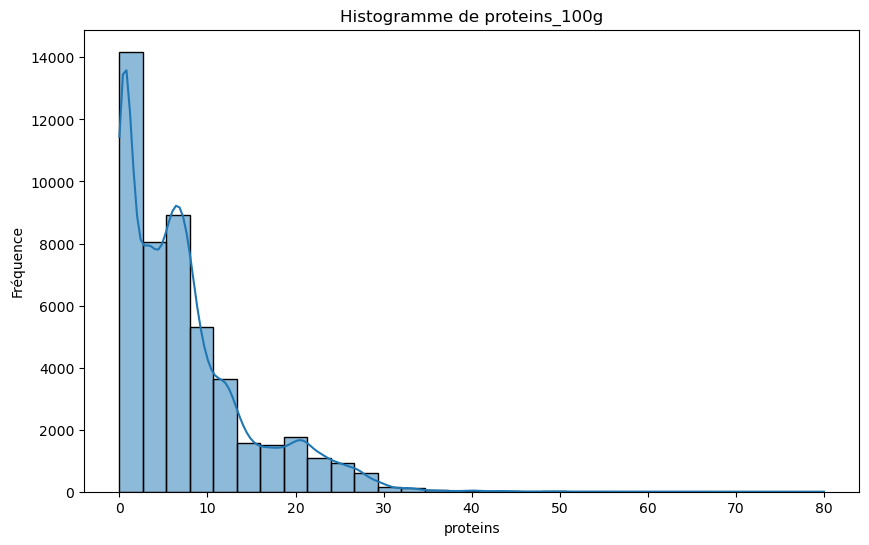

In [215]:
# Créer l'histogramme de 'proteins_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['proteins_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de proteins_100g')
plt.xlabel('proteins')
plt.ylabel('Fréquence')
plt.show()

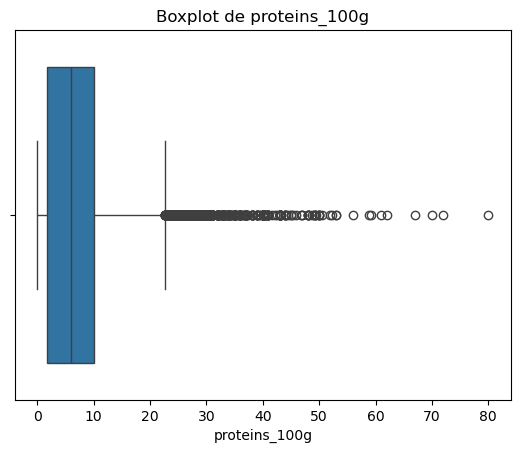

In [216]:
# Boxplot de la variable 'proteins_100g'
sns.boxplot(x=X['proteins_100g'])
plt.title('Boxplot de proteins_100g')
plt.show()

##### Après imputation par KNN avec les variables très pertinentes et modérément pertinentes

In [217]:
X_copie['proteins_100g'].describe()

count    47979.000000
mean         7.442241
std          7.161623
min          0.000000
25%          1.700000
50%          5.900000
75%         10.100000
max         80.000000
Name: proteins_100g, dtype: float64

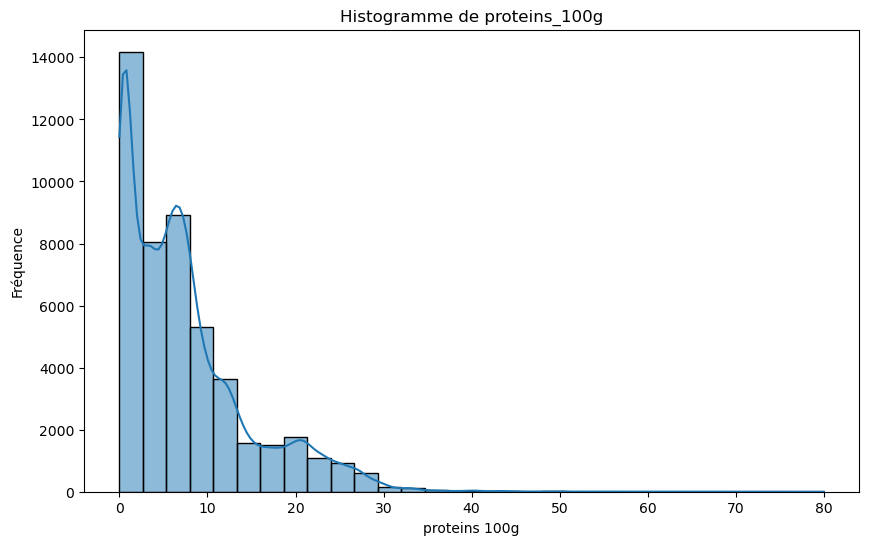

In [218]:
# Créer l'histogramme de 'proteins_100g'
plt.figure(figsize=(10,6))
sns.histplot(X_copie['proteins_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de proteins_100g')
plt.xlabel('proteins 100g')
plt.ylabel('Fréquence')
plt.show()

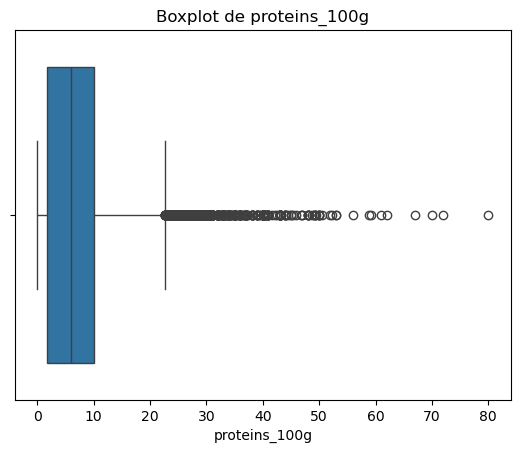

In [219]:
# Boxplot de la variable 'proteins_100g'
sns.boxplot(x=X_copie['proteins_100g'])
plt.title('Boxplot de proteins_100g')
plt.show()

| **Statistique**           | **Avant Imputation** | **Après Imputation 1** | **Après Imputation 2** |
|:--------------------------|:---------------------|:----------------------|:---------------|
| **Nombre de valeurs**     | 47 266              | 47 979               | 47 979      |
| **Moyenne**               | 7.45              | 7.44               | 7.45      |
| **Écart-type**            | 7.18              | 7.16               | 7.16      |
| **Valeur minimale**       | 0.00               | 0.00                | 8.88 x 10^−16   |
| **1er Quartile (25%)**    | 1.70               | 1.70                | 1.70     |
| **Médiane (50%)**         | 5.90               | 5.90                | 5.90     |
| **3ème Quartile (75%)**   | 10.10              | 10.10               | 10.01       |
| **Valeur maximale**       | 80.00             | 80.00              | 80.00      |


**Moyenne et Écart-type** :
Les valeurs moyennes et les écarts-types sont presque identiques pour les deux imputations, ce qui indique que l'imputation n'a pas changé significativement la distribution générale des valeurs de proteins_100g.
Cela montre que l'imputation KNN a conservé les caractéristiques générales de cette variable, notamment sa distribution globale et sa variance.

**Valeur minimale après imputation** :
On remarque que pour l'imputation 2, une petite valeur (8.881 x 10^-16) apparaît pour la valeur minimale.
Ceci est dû aux erreurs numériques en virgule flottante, souvent présentes dans les calculs KNN.
Une telle valeur est en réalité proche de zéro et peut être considérée comme une erreur d'arrondi numérique, sans grande importance pratique.

**Quartiles et Médiane** :
Les valeurs des quartiles et médiane restent les mêmes pour les deux imputations, ce qui signifie qu'elles ne sont pas influencées par l'ajout de la variable sugars_100g

#### Vérification des relations avec les autres variables après imputation

##### Vérification après imputation par KNN uniquement avec les variables très pertinentes

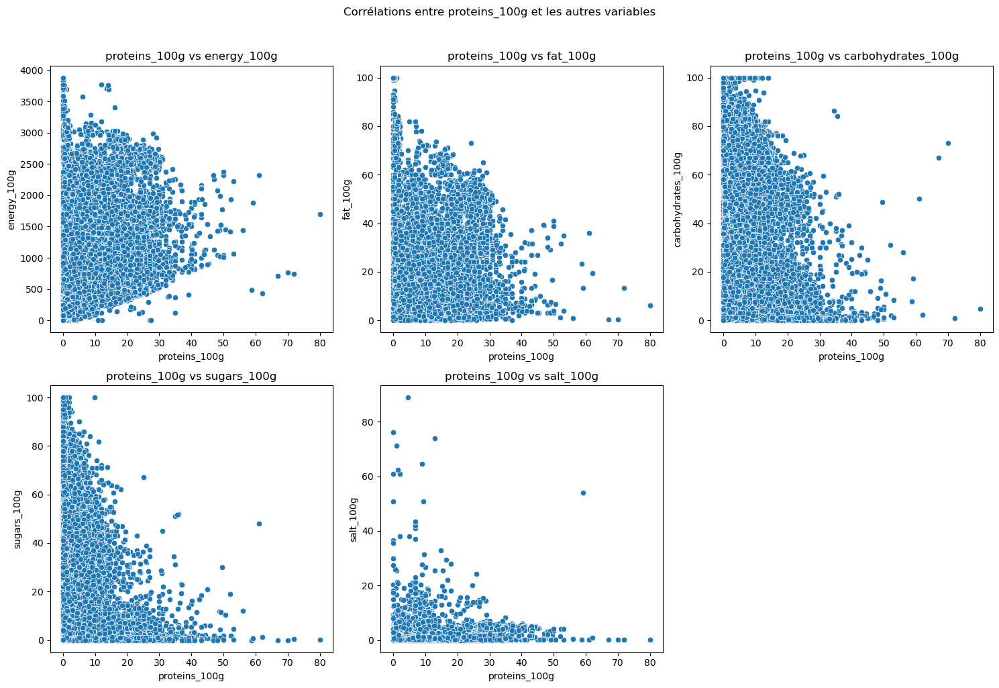

In [220]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à proteins_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre proteins_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf proteins_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'proteins_100g']):
    sns.scatterplot(data=df, x='proteins_100g', y=col, ax=axes[i])
    axes[i].set_title(f'proteins_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [221]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'proteins_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'fat_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['proteins_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'proteins_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['proteins_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.311620
energy_100g           0.436015
fat_100g              0.500493
salt_100g             0.489530
carbohydrates_100g   -0.062534
Name: proteins_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'proteins_100g'"}>

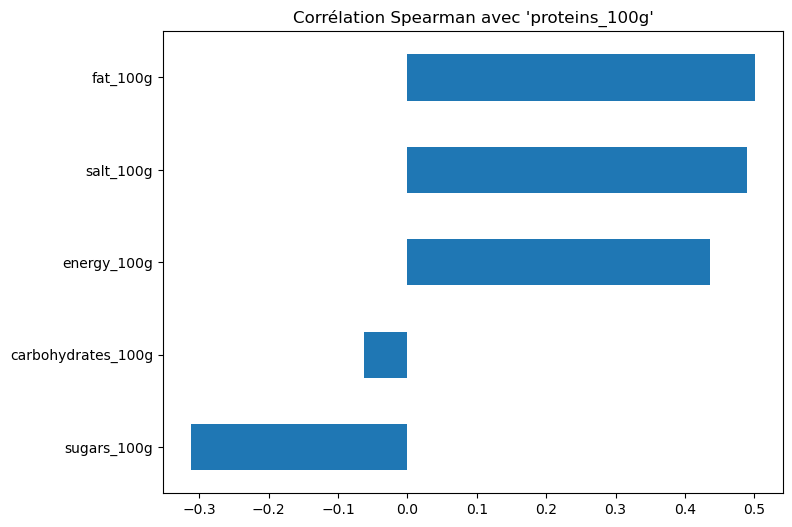

In [222]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'proteins_100g'")

##### Vérification après imputation par KNN avec les variables très pertinentes et modérément pertinentes

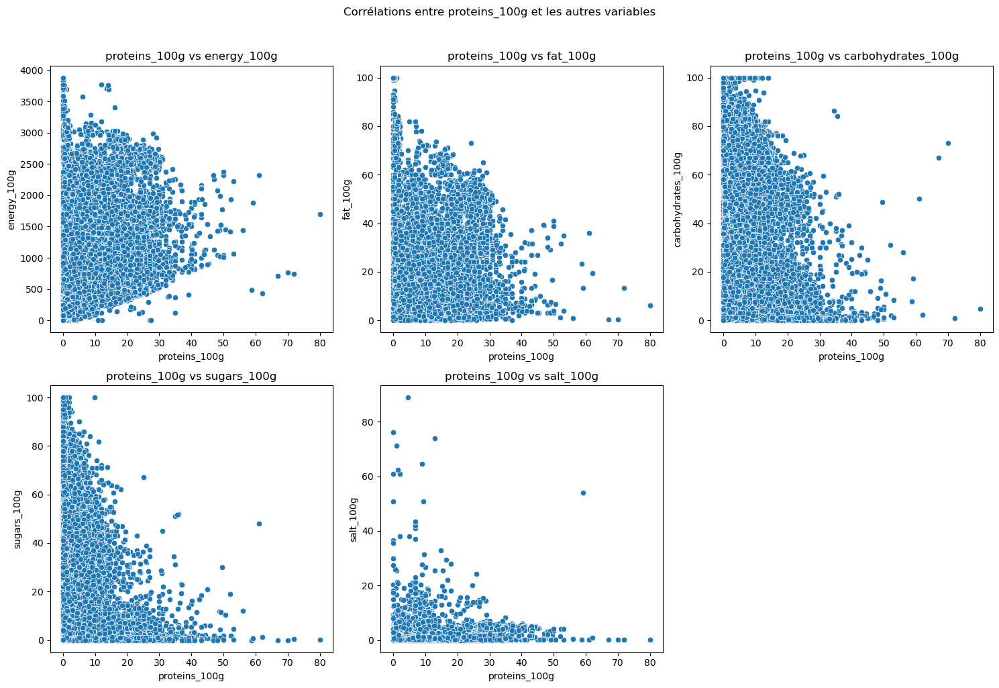

In [223]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X_copie[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à proteins_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre proteins_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf proteins_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'proteins_100g']):
    sns.scatterplot(data=df, x='proteins_100g', y=col, ax=axes[i])
    axes[i].set_title(f'proteins_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [224]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'proteins_100g'
variables_quanti = ['sugars_100g', 'energy_100g', 'fat_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X_copie[['proteins_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'proteins_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['proteins_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g          -0.311620
energy_100g           0.436015
fat_100g              0.500493
salt_100g             0.489530
carbohydrates_100g   -0.062534
Name: proteins_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'proteins_100g'"}>

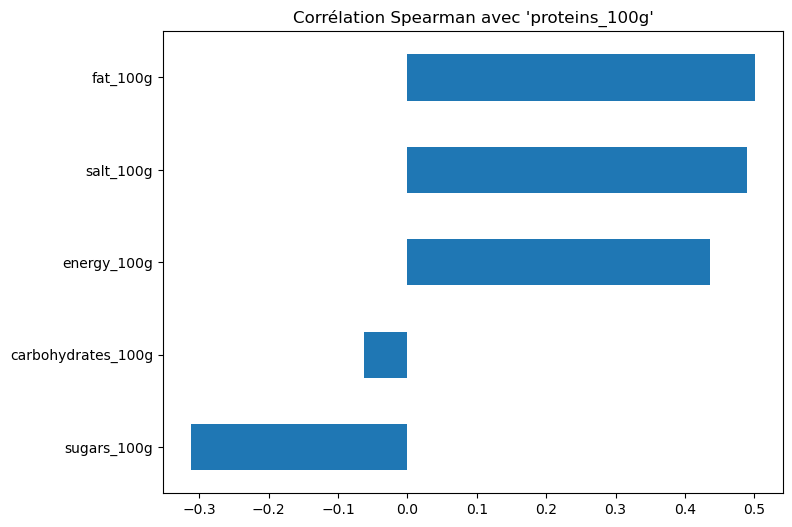

In [225]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'proteins_100g'")

| **Variable**            | **Avant Imputation** | **Après Imputation 1** | **Après Imputation 2** |
|:-------------------------|:---------------------|:----------------------|:----------------------|
| **sugars_100g**          | -0.313             | -0.312              |  -0.312          |
| **energy_100g**          |  0.434             |  0.436              |  0.436          |
| **fat_100g**             |  0.499             |  0.500              |  0.500          |
| **salt_100g**            |  0.488             |  0.488              |  0.488          |
| **carbohydrates_100g**   |  -0.061            |  -0.062             |  -0.062         |


**Stabilité des corrélations** :
Les valeurs des corrélations n'ont pas significativement changé après les imputations, ce qui indique que l'imputation KNN a réussi à conserver les relations statistiques initiales.
Cela signifie que l'imputation a respecté les schémas de relations existants entre proteins_100g et les autres variables, ce qui est un bon signe pour la qualité des résultats.

**Corrélations constantes** :
Pour des variables comme energy_100g, fat_100g, salt_100g, les corrélations restent quasiment inchangées après imputations.
Les petites variations de valeurs (par exemple, 0.434 à 0.436 pour energy_100g) sont négligeables et n'indiquent pas de perte d'information significative.

**Variable carbohydrates_100g** :
Bien que la corrélation soit faible, elle est maintenue de manière stable après l'imputation.
Cela renforce l'idée que l'ajout de cette variables ne perturbe pas les relations essentielles et ne dégrade pas la qualité des relations statistiques.

**Conclusion** : <br>
Les deux méthodes d'imputation sont efficaces et préservent les relations statistiques initiales.<br> 
Aucune des deux ne montre d'écarts significatifs dans les corrélations.<br> 
On peut donc choisir la Méthode 1, qui reste simple, tout en maintenant la qualité des relations intacte sans ajouter de complexité inutile.

In [226]:
# Suppression du DataFrame X_copie
del X_copie

### Imputation d'energy_100g

#### Résumé statistique d'energy_100g

In [227]:
# Afficher le nombre de valeurs manquantes pour la colonne 'energy_100g'
nombre_manquantes = X['energy_100g'].isnull().sum()
print(f"Nombre de valeurs manquantes pour 'energy_100g' : {nombre_manquantes}")

Nombre de valeurs manquantes pour 'energy_100g' : 304


In [228]:
# Résumé statistique de la variable 'energy_100g'
X['energy_100g'].describe()

count    47675.000000
mean      1073.439491
std        764.503761
min          0.000000
25%        379.000000
50%        978.000000
75%       1640.000000
max       3883.000000
Name: energy_100g, dtype: float64

Moyenne : 1073.44 kJ/100g<br>
La teneur moyenne en énergie des produits est de 1073.44 kJ par 100g. Cela correspond à une énergie modérée, qui est en accord avec les valeurs typiques des aliments transformés et naturels courants.<br>

Écart-type : 764.5 kJ/100g<br>
Un écart-type de 764.5 kJ montre une certaine dispersion des valeurs autour de la moyenne. Cela est représentatif des différentes compositions des aliments (par exemple, des boissons, snacks, produits gras, céréales), où la teneur énergétique varie considérablement selon les types de produits et leurs composants nutritionnels.<br>

Valeurs minimales et maximales<br>
Min : 0.00 kJ/100g<br>
Les valeurs nulles peuvent correspondre à des produits qui ne fournissent pas d'énergie, comme certaines boissons, où l'apport énergétique est négligeable.<br>
Max : 3883 kJ/100g<br>
Une valeur maximale de 3883 kJ/100g est en accord avec des produits très riches en graisses, comme certaines huiles ou aliments hautement caloriques. Cela est en adéquation avec les limites observées dans les données nutritionnelles.<br>

Quartiles<br>
1er quartile (Q1) : 379 kJ/100g<br>
Cela signifie que 25% des produits contiennent 379 kJ/100g ou moins, ce qui correspond à des produits moins énergétiques.<br>
Médiane (Q2) : 978 kJ/100g<br>
La médiane montre que 50% des produits contiennent moins de 978 kJ/100g, ce qui reste une valeur modérée et représentative des produits alimentaires standards.<br>
3ème quartile (Q3) : 1640 kJ/100g<br>
Les valeurs au-dessus de 1640 kJ/100g indiquent des produits avec une teneur énergétique plus élevée, souvent en raison d'une forte concentration en graisses et sucres, comme les snacks et desserts riches en calories.<br>

Les résultats pour la distribution de la variable energy_100g sont cohérents et réalistes. Les valeurs énergétiques sont variées mais ne contiennent pas d'anomalies. Les relations statistiques sont préservées, ce qui garantit des résultats solides pour l'analyse des produits alimentaires.

#### Visualisation de la distribution d'energy_100g

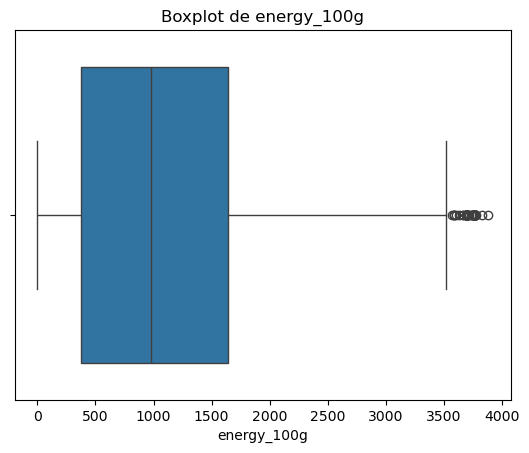

In [229]:
# Boxplot de la variable 'energy_100g'
sns.boxplot(x=X['energy_100g'])
plt.title('Boxplot de energy_100g')
plt.show()

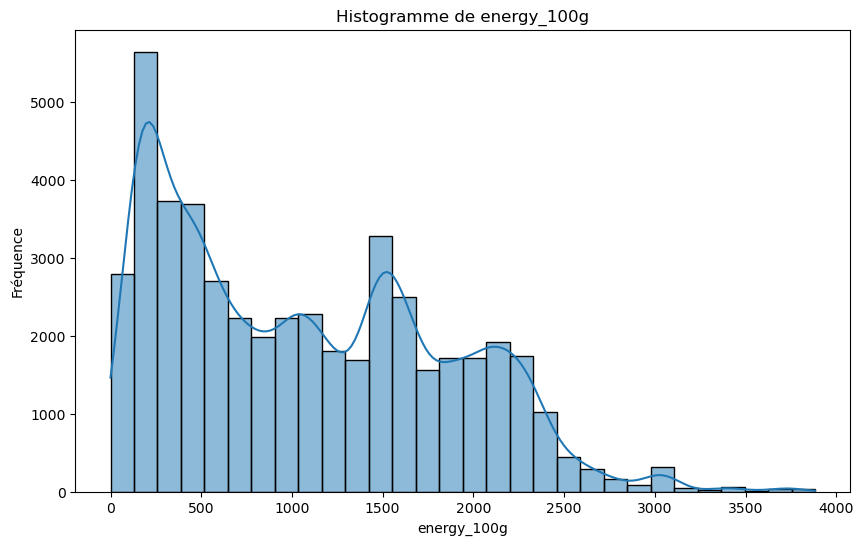

In [230]:
# Créer l'histogramme de 'energy_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['energy_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de energy_100g')
plt.xlabel('energy_100g')
plt.ylabel('Fréquence')
plt.show()

#### Analyse des corrélation de energy_100g et des autres variables

Avant d'imputer les valeurs manquantes pour energy_100g, il est essentiel d'analyser ses corrélations avec les autres variables. Cette étape permet de comprendre les relations significatives entre energy_100g et d'autres caractéristiques, ce qui peut influencer le choix de la méthode d'imputation. Par ailleurs, les corrélations entre les valeurs manquantes indiquent que ces absences ne sont pas aléatoires (non-MCAR). Il est donc crucial d'adopter une approche d'imputation rigoureuse afin de maintenir la cohérence et l'intégrité des relations présentes dans les données.

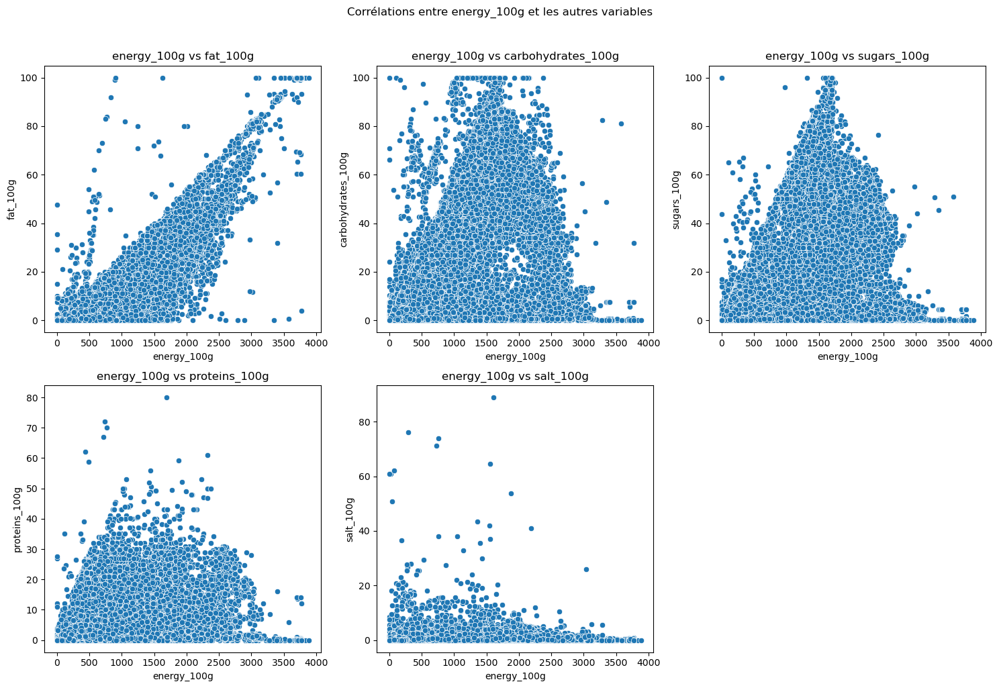

In [231]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à energy_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre energy_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf energy_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'energy_100g']):
    sns.scatterplot(data=df, x='energy_100g', y=col, ax=axes[i])
    axes[i].set_title(f'energy_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

Comme les nuages de points ne montrent pas de relation linéaire entre energy_100g et les autres variables, il est préférable d'utiliser la corrélation de Spearman. Cette méthode est mieux adaptée pour détecter des relations monotones, même lorsqu'elles ne sont pas linéaires, et elle est moins influencée par les valeurs aberrantes. En analysant les corrélations de Spearman, on peut identifier les liens pertinents entre energy_100g et les autres variables, ce qui facilite ainsi le choix des prédicteurs les plus adaptés pour l'imputation.

In [232]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'energy_100g'
variables_quanti = ['sugars_100g', 'proteins_100g', 'fat_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['energy_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'energy_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['energy_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g           0.268273
proteins_100g         0.436015
fat_100g              0.766304
salt_100g             0.180305
carbohydrates_100g    0.499409
Name: energy_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'energy_100g'"}>

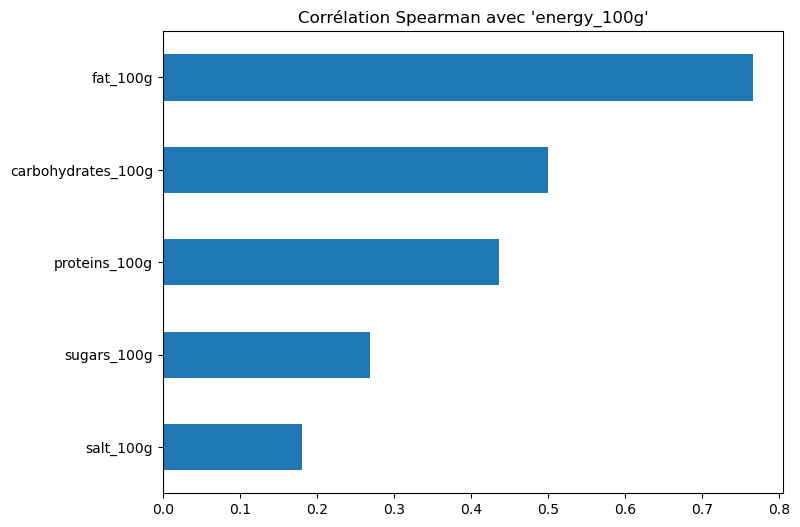

In [233]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'energy_100g'")

**sugars_100g (0.268)** : Corrélation positive modérée. Une augmentation de la teneur en sucre est associée à une augmentation de l'energy_100g, ce qui peut être typique des produits transformés et des boissons sucrées où les sucres et la teneur énergétique sont souvent étroitement liés.

**proteins_100g (0.436)** : Corrélation positive modérée. Les produits avec une teneur plus élevée en protéines ont une énergie plus dense. Cela est attendu dans des aliments comme les barres protéinées, où une quantité importante de protéines est associée à des graisses et des glucides pour augmenter la valeur énergétique.

**fat_100g (0.766)** : Corrélation positive élevée. Une teneur accrue en matières grasses est fortement associée à une densité énergétique plus élevée. Cela reflète les produits alimentaires qui sont riches en graisses, comme les snacks, les huiles ou les pâtisseries, où graisses et énergie sont souvent en corrélation.

**salt_100g (0.180)** : Corrélation positive faible à modérée. Une faible corrélation positive entre la teneur en sel et l'energy_100g peut être observée dans des produits salés transformés, où les composants énergétiques sont équilibrés avec des ajouts de sel pour renforcer la conservation et le goût.

**carbohydrates_100g (0.499)** : Corrélation positive modérée à élevée. Une quantité plus importante de glucides est généralement liée à une énergie plus élevée, en particulier dans des produits tels que les céréales et les biscuits, qui sont souvent une source significative de glucides simples et complexes.

**Analyse globale** :
Les corrélations montrent que energy_100g est principalement influencée par des composés énergétiques essentiels comme proteins_100g, fat_100g, et carbohydrates_100g. La forte corrélation avec fat_100g et la corrélation positive avec proteins_100g suggèrent que les produits riches en matières grasses et protéines contiennent généralement une densité énergétique élevée.

Les relations plus faibles avec salt_100g et des glucides suggèrent que l'énergie ne dépend pas directement de la présence du sel ou des glucides simples. Cela souligne l'importance des ingrédients comme les graisses et les protéines dans la composition énergétique des aliments.

**Conclusion** :
Lors de l'imputation des valeurs manquantes pour energy_100g, il est crucial de maintenir les relations avec des composants clés comme fat_100g, proteins_100g, et carbohydrates_100g. Pour cela, une méthode d'imputation comme KNN semble être la plus appropriée, car elle prend en compte les relations entre ces variables, tout en maintenant la cohérence des associations nutritionnelles présentes dans les produits alimentaires analysés.

#### Imputation avec la méthode des KNN

L'imputation des valeurs manquantes pour energy_100g en utilisant l'approche KNN (K-Nearest Neighbors) est une méthode efficace, car elle prend en compte les relations complexes et les associations significatives entre cette variable et d'autres caractéristiques nutritionnelles du dataset. Les valeurs manquantes de energy_100g ne sont pas distribuées de manière aléatoire, ce qui souligne l'importance d'intégrer des variables pertinentes afin de maintenir la cohérence des relations au sein des données.

Sélection des variables pour l'imputation KNN
En se basant sur l'analyse des corrélations entre les valeurs manquantes et les corrélations des valeurs observées de energy_100g, les variables suivantes ont été sélectionnées pour l'imputation, organisées par pertinence :

**Très pertinentes (corrélation élevée avec les données observées et/ou manquantes)** :<br>
**fat_100g (0.766)**
Corrélation positive élevée avec energy_100g. Les produits riches en matières grasses sont directement liés à une densité énergétique accrue.

**carbohydrates_100g (0.498)**
Corrélation positive modérée à élevée. Une teneur plus élevée en glucides est souvent associée à une meilleure densité énergétique.

**proteins_100g (0.434)**
Corrélation positive modérée. Les produits contenant des protéines présentent souvent une densité énergétique plus élevée, notamment lorsque les graisses et les glucides sont également présents.

**Modérément pertinentes (corrélations faibles mais utiles)** :<br>
**sugars_100g (0.266)**
Corrélation positive modérée. Une teneur élevée en sucre est généralement liée à une densité énergétique accrue.

**salt_100g (0.180)**
Corrélation positive faible à modérée. Bien que le sel ne contribue directement pas à l'énergie, il est souvent présent dans les produits transformés où des composants énergétiques coexistent.

**Conclusion**
La sélection des variables garantit une imputation précise des valeurs manquantes pour energy_100g. En combinant des variables fortement corrélées et des éléments contextuellement pertinents, l'algorithme KNN peut fournir des estimations réalistes. Cela permet de préserver la cohérence des relations nutritionnelles tout en garantissant des analyses précises des profils énergétiques des aliments.

In [234]:
X_copie = X.copy()

##### Imputation par KNN sans les variables modérément pertinentes

In [235]:
# Liste des variables numériques à utiliser pour imputer 'energy_100g'
features_a_normaliser = ['fat_100g', 'proteins_100g', 'carbohydrates_100g', 'energy_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X[features_a_normaliser] = scaler.fit_transform(X[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [236]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.052643,2.032767,2.160,0.000,-0.162621
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.099899,-0.370345,0.922,28.100,0.985665
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.135271,-0.574211,0.647,24.700,0.417060
185,0000008237798,Quiche Lorraine,-0.778866,-0.383788,-0.290753,0.499,0.714,-0.721626
186,0000008240095,Pâté au poulet,-0.421768,-0.167050,3.694419,0.735,10.215,-0.398924


In [237]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'energy_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'energy_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs = features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de proteins_100g uniquement
X[['energy_100g']] = imputer.fit_transform(X[features_predicteurs + ['energy_100g']])[:, -1].reshape(-1, 1)

In [238]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.178628,-0.052643,2.032767,2.160,0.000,-0.162621
175,0000000394710,Danoises à la cannelle roulées,0.584124,0.099899,-0.370345,0.922,28.100,0.985665
180,0000001938067,Chaussons tressés aux pommes,0.021662,-0.135271,-0.574211,0.647,24.700,0.417060
185,0000008237798,Quiche Lorraine,-0.778866,-0.383788,-0.290753,0.499,0.714,-0.721626
186,0000008240095,Pâté au poulet,-0.421768,-0.167050,3.694419,0.735,10.215,-0.398924


In [239]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X[features_a_normaliser] = scaler.inverse_transform(X[features_a_normaliser])

In [240]:
# Arrondi des valeurs nutritionnelles à 4 décimales pour réduire les erreurs numériques
# liées aux calculs en virgule flottante, notamment après normalisation et dénormalisation
Variables_quanti = ['energy_100g','fat_100g', 'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g']
X[Variables_quanti] = np.round(X[Variables_quanti], decimals=2)

# Correction des valeurs négatives pour la colonne 'proteins_100g' du à la dénormalisation
X['proteins_100g'] = np.maximum(X['proteins_100g'], 0)
X['salt_100g'] = np.maximum(X['salt_100g'], 0)

In [241]:
X.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.16,0.00,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.92,28.10,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.65,24.70,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.50,0.71,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.74,10.22,16.60


##### Imputation par KNN avec les variables modérément pertinentes

In [242]:
# Liste des variables numériques à utiliser pour imputer 'energy_100g'
features_a_normaliser = ['fat_100g', 'sugars_100g', 'salt_100g', 'carbohydrates_100g', 'proteins_100g','energy_100g']

# Standardiser les valeurs pour avoir une distribution centrée
# On utilise StandardScaler qui met les valeurs à une distribution avec une moyenne de 0 et un écart-type de 1.
scaler = StandardScaler()

# Normaliser uniquement ces colonnes
X_copie[features_a_normaliser] = scaler.fit_transform(X[features_a_normaliser])
# Explication : Chaque valeur de la liste `features_a_normaliser` est transformée
# selon la formule : z = (x - moyenne) / écart-type.
# Cela est nécessaire pour que l'imputation KNN prenne en compte des valeurs sur des échelles similaires.

In [243]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.177680,-0.052643,2.032767,0.734491,-0.730588,-0.162623
175,0000000394710,Danoises à la cannelle roulées,0.583622,0.099900,-0.370345,0.022947,0.802772,0.985664
180,0000001938067,Chaussons tressés aux pommes,0.020541,-0.135270,-0.574212,-0.131986,0.617241,0.417059
185,0000008237798,Quiche Lorraine,-0.780868,-0.383788,-0.290753,-0.218060,-0.691845,-0.721628
186,0000008240095,Pâté au poulet,-0.423377,-0.167050,3.694419,-0.080342,-0.172903,-0.398926


In [244]:
# Sélection des colonnes nécessaires pour l'imputation
# On souhaite imputer 'energy_100g' uniquement en utilisant d'autres colonnes comme prédicteurs.
# On ne sélectionne pas 'energy_100g' puisque l'imputation doit être réalisée sur les valeurs manquantes.
features_predicteurs = features_a_normaliser[:-1]

# Création de l'imputeur KNN pour remplacer les valeurs manquantes par des prédictions basées sur les voisins
imputer = KNNImputer(n_neighbors=int(np.sqrt(len(X_copie)))) 
#`n_neighbors` est choisi comme étant la racine carrée du nombre total d'observations.

# Imputation de energy_100g uniquement
X_copie[['energy_100g']] = imputer.fit_transform(X_copie[features_predicteurs + ['energy_100g']])[:, -1].reshape(-1, 1)

In [245]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,0.177680,-0.052643,2.032767,0.734491,-0.730588,-0.162623
175,0000000394710,Danoises à la cannelle roulées,0.583622,0.099900,-0.370345,0.022947,0.802772,0.985664
180,0000001938067,Chaussons tressés aux pommes,0.020541,-0.135270,-0.574212,-0.131986,0.617241,0.417059
185,0000008237798,Quiche Lorraine,-0.780868,-0.383788,-0.290753,-0.218060,-0.691845,-0.721628
186,0000008240095,Pâté au poulet,-0.423377,-0.167050,3.694419,-0.080342,-0.172903,-0.398926


In [246]:
# Inverser la transformation de la normalisation précédente
# Pour retrouver les valeurs originales, on inverse la transformation `StandardScaler`.
X_copie[features_a_normaliser] = scaler.inverse_transform(X_copie[features_a_normaliser])

In [247]:
X_copie.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.16,-1.776357e-15,23.00
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.92,2.810000e+01,54.10
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.65,2.470000e+01,38.70
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.50,7.100000e-01,7.86
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.74,1.022000e+01,16.60


#### Vérification de la distribution de energy_100g après imputation

##### Après imputation par KNN sans les variables modérément pertinentes

In [248]:
X['energy_100g'].describe()

count    47979.000000
mean      1074.313833
std        763.663533
min          0.000000
25%        381.000000
50%        982.000000
75%       1640.000000
max       3883.000000
Name: energy_100g, dtype: float64

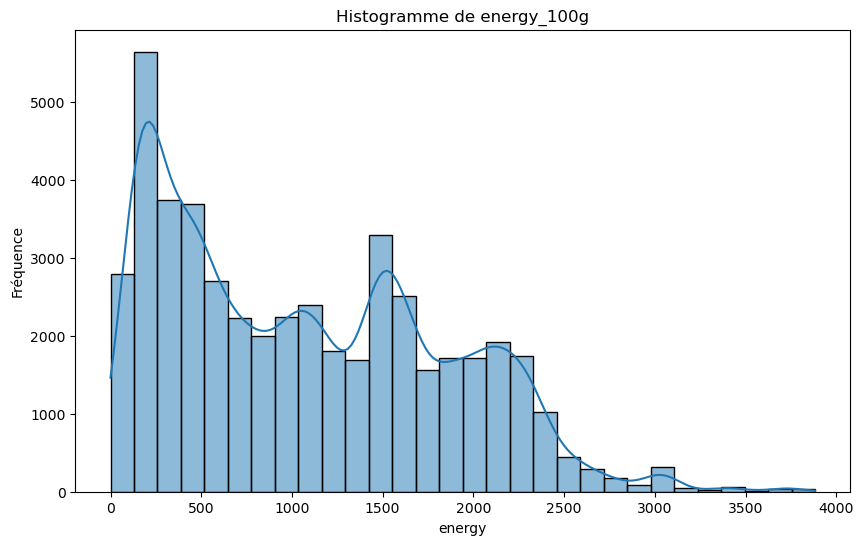

In [249]:
# Créer l'histogramme de 'energy_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['energy_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de energy_100g')
plt.xlabel('energy')
plt.ylabel('Fréquence')
plt.show()

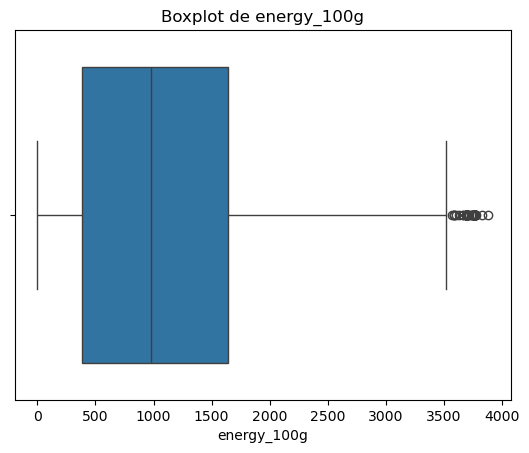

In [250]:
# Boxplot de la variable 'energy_100g'
sns.boxplot(x=X['energy_100g'])
plt.title('Boxplot de energy_100g')
plt.show()

##### Après imputation par KNN avec les variables modérément pertinentes

In [251]:
X_copie['energy_100g'].describe()

count    47979.000000
mean      1074.313833
std        763.663533
min          0.000000
25%        381.000000
50%        982.000000
75%       1640.000000
max       3883.000000
Name: energy_100g, dtype: float64

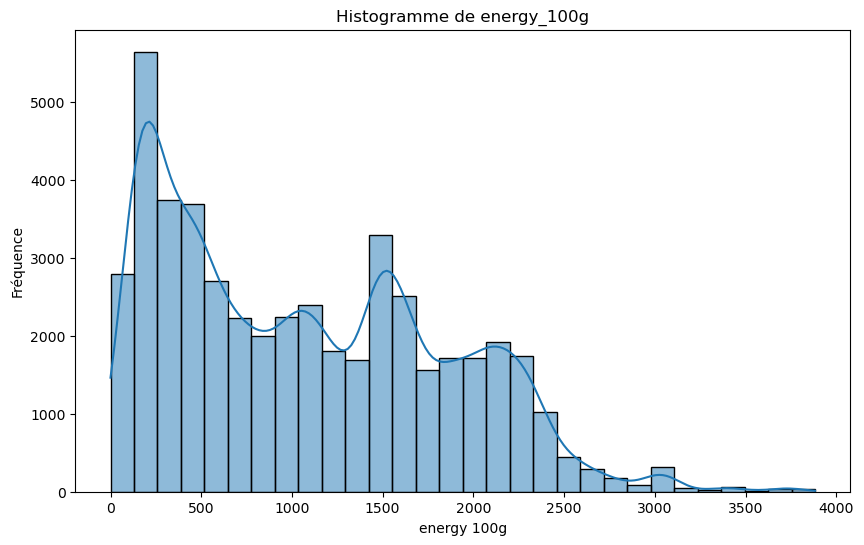

In [252]:
# Créer l'histogramme de 'energy_100g'
plt.figure(figsize=(10,6))
sns.histplot(X_copie['energy_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de energy_100g')
plt.xlabel('energy 100g')
plt.ylabel('Fréquence')
plt.show()

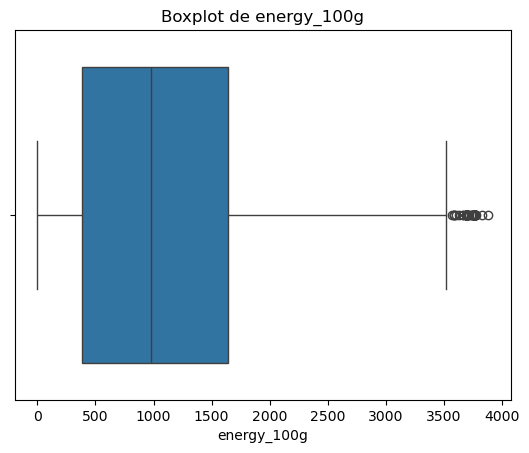

In [253]:
# Boxplot de la variable 'energy_100g'
sns.boxplot(x=X_copie['energy_100g'])
plt.title('Boxplot de energy_100g')
plt.show()

| **Statistique**           | **Avant Imputation** | **Après Imputation 1** | **Après Imputation 2** |
|:--------------------------|:---------------------|:----------------------|:---------------|
| **Nombre de valeurs**     | 47 675              | 47 979               | 47 979      |
| **Moyenne**               | 1073.44             | 1074.29               | 1074.29      |
| **Écart-type**            | 764.50              | 763.66               | 763.66      |
| **Valeur minimale**       | 0.00                | 0.00                | 0.00   |
| **1er Quartile (25%)**    | 379.00              | 381.00                | 381.00     |
| **Médiane (50%)**         | 978.00              | 982.00                | 982.00    |
| **3ème Quartile (75%)**   | 1640.00             | 1640.00               | 1640.00       |
| **Valeur maximale**       | 3883.00             | 3883.00              | 3883.00      |


**Moyenne** :
La moyenne reste stable autour de 1073.44 à 1074.29, ce qui montre que l'imputation n'a pas altéré de manière significative la valeur centrale des données.

**Écart-type** :
L'écart-type reste quasiment inchangé (764.50 à 763.66), ce qui signifie que la dispersion des valeurs autour de la moyenne est maintenue, sans variations majeures.

**Médiane et Quartiles** :
La médiane passe de 978.00 à 982.00, ce qui montre une légère augmentation. Cela signifie que l'imputation a ajusté légèrement les valeurs centrales sans les déformer de manière significative.

**Minimale et Maximale** :
Les valeurs minimales et maximales restent inchangées, avec des valeurs de 0.00 et 3883.00, ce qui signifie qu'aucun changement majeur n'a été introduit.

**Conclusion** :
Les imputations (Imputation 1 et Imputation 2) ont réussi à maintenir les relations internes et la distribution des valeurs energy_100g, sans changements notables. La légère augmentation des valeurs médianes et moyennes montre que l'imputation a été robuste tout en respectant les caractéristiques statistiques des données. Cela garantit des résultats solides et fiables pour toute analyse ultérieure.

#### Vérification des relations avec les autres variables après imputation

##### Vérification après imputation par KNN les variables modérément pertinentes

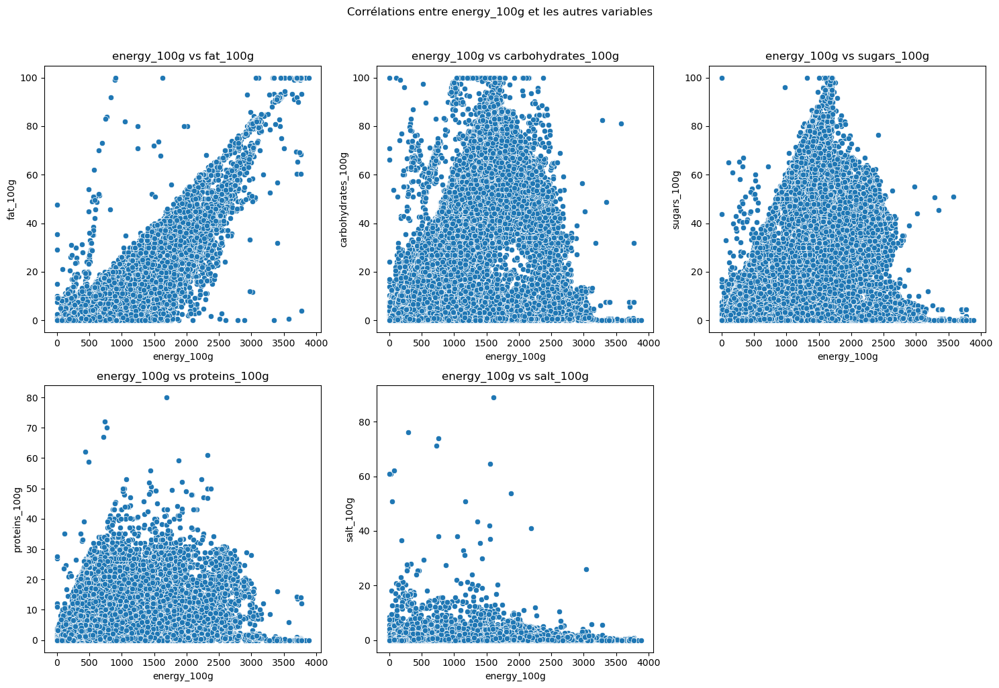

In [254]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à proteins_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre energy_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf energy_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'energy_100g']):
    sns.scatterplot(data=df, x='energy_100g', y=col, ax=axes[i])
    axes[i].set_title(f'energy_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [255]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'energy_100g'
variables_quanti = ['sugars_100g', 'proteins_100g', 'fat_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X[['energy_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'proteins_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['energy_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g           0.268290
proteins_100g         0.434599
fat_100g              0.765367
salt_100g             0.178493
carbohydrates_100g    0.497986
Name: energy_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'energy_100g'"}>

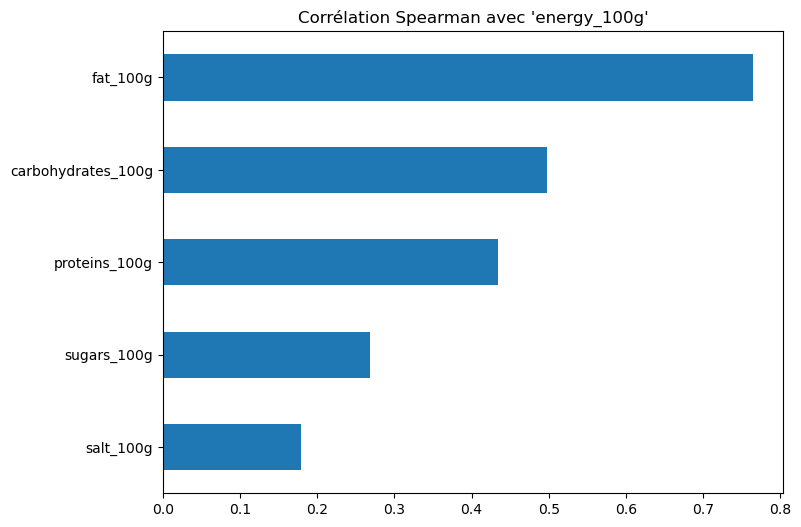

In [256]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'energy_100g'")

##### Vérification après imputation par KNN avec les variables modérément pertinentes

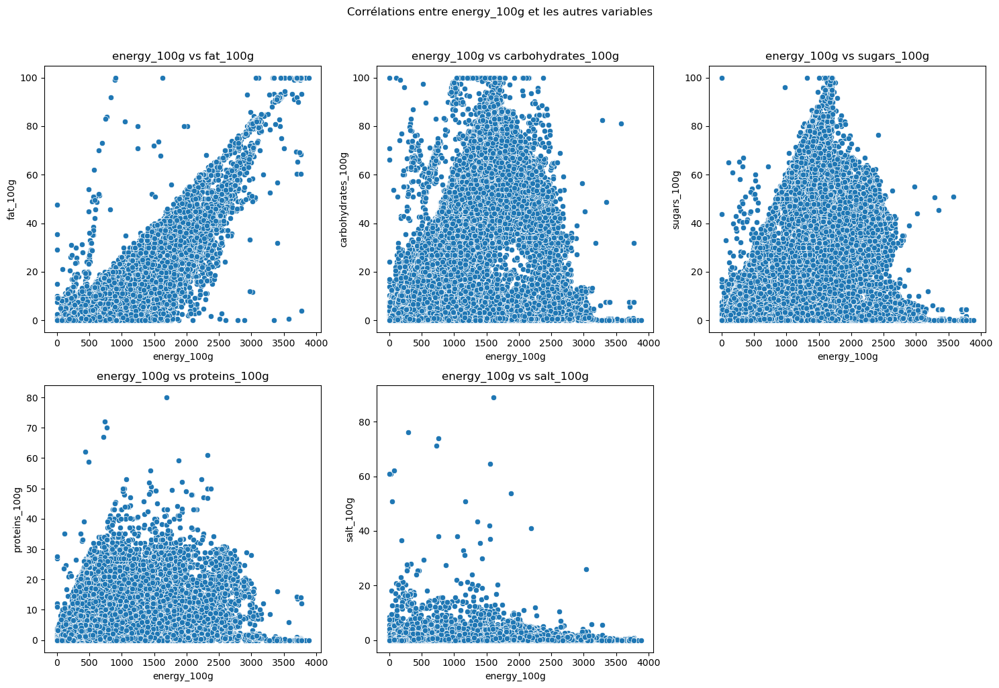

In [257]:
# Sélectionner les colonnes pertinentes
colonnes_concernees = ['energy_100g', 'fat_100g', 
                       'carbohydrates_100g', 'sugars_100g', 
                       'proteins_100g', 'salt_100g']
df = X_copie[colonnes_concernees]

# Créer un subplot pour chaque variable par rapport à energy_100g
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Corrélations entre energy_100g et les autres variables', y=1.02)

# Aplatir la liste des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes (sauf energy_100g) et créer un scatterplot pour chacune
for i, col in enumerate([c for c in colonnes_concernees if c != 'energy_100g']):
    sns.scatterplot(data=df, x='energy_100g', y=col, ax=axes[i])
    axes[i].set_title(f'energy_100g vs {col}')

# Désactiver le dernier sous-graphe vide
fig.delaxes(axes[5])

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [258]:
# Liste des variables pour lesquelles on veut calculer la corrélation avec 'energy_100g'
variables_quanti = ['sugars_100g', 'proteins_100g', 'fat_100g', 'salt_100g', 'carbohydrates_100g']

# Calcul des corrélations Spearman uniquement pour ces variables
correlation_spearman_subset = X_copie[['energy_100g'] + variables_quanti].corr(method='spearman')

# Extraire uniquement la ligne 'proteins_100g' pour les variables cibles
correlation_salt_subset = correlation_spearman_subset.loc['energy_100g', variables_quanti]
print(correlation_salt_subset)

sugars_100g           0.268290
proteins_100g         0.434599
fat_100g              0.765367
salt_100g             0.178493
carbohydrates_100g    0.497986
Name: energy_100g, dtype: float64


<Axes: title={'center': "Corrélation Spearman avec 'energy_100g'"}>

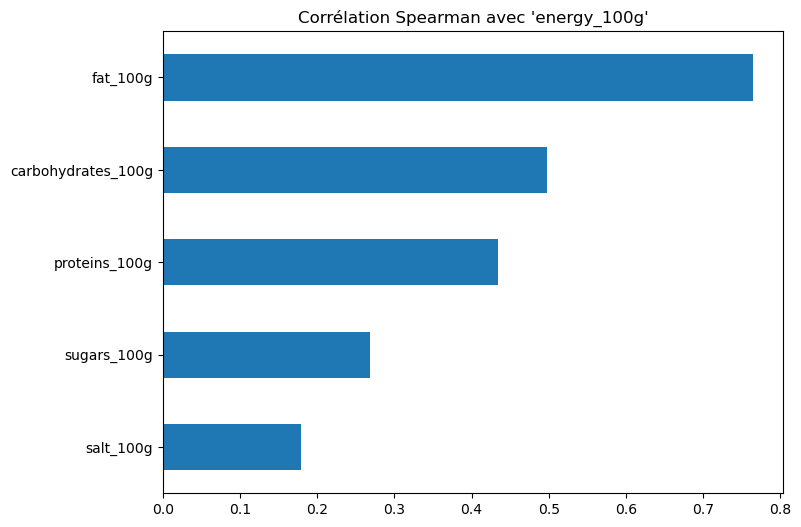

In [259]:
correlation_salt_subset_sorted = correlation_salt_subset.sort_values()
correlation_salt_subset_sorted.plot(kind='barh', figsize=(8, 6), title="Corrélation Spearman avec 'energy_100g'")

| **Variable**            | **Avant Imputation** | **Après Imputation 1** | **Après Imputation 2** |
|:-------------------------|:---------------------|:----------------------|:----------------------|
| **sugars_100g**          |  0.268              | 0.268                |  0.268         |
| **proteins_100g**        |  0.436              |  0.435               |  0.435          |
| **fat_100g**             |  0.766              |  0.765               |  0.765          |
| **salt_100g**            |  0.180              |  0.178               |  0.178          |
| **carbohydrates_100g**   |  0.499              |  0.498               |  0.498         |


**sugars_100g** :
La corrélation reste stable avant et après imputation (0.268 → 0.268 pour les deux méthodes). Cela montre que l'imputation n'altère pas la relation entre energy_100g et les sucres.

**proteins_100g** :
La corrélation diminue légèrement (0.436 → 0.435) après imputation. L'impact est négligeable, ce qui reflète une cohérence maintenue avec les protéines.

**fat_100g** :
Une très légère baisse de corrélation est observée (0.766 → 0.765) pour les deux méthodes. Cela confirme que l'imputation préserve bien les fortes relations entre energy_100g et les graisses.

**salt_100g** :
Une augmentation mineure est notée (0.180 → 0.178).

**carbohydrates_100g** :
La corrélation reste quasiment identique (0.499 → 0.498), montrant que l'imputation n'affecte pas les relations avec les glucides.

**Conclusion** : <br>
Les résultats confirment que les méthodes d'imputation KNN (avec ou sans sugars_100g et salt_100g) conservent globalement les relations de Spearman entre energy_100g et les autres variables.<br>
Imputation 1 (sans sugars_100g et salt_100g) et Imputation 2 (avec toutes les variables) produisent des effets quasiment identiques.<br>
Les faibles variations des corrélations (notamment avec proteins_100g et fat_100g) indiquent que l'imputation préserve la structure et les relations nutritionnelles des données.<br>
Ces résultats garantissent la fiabilité des imputations sans introduire de biais notable dans les associations significatives.
On peut donc choisir la Méthode 1, qui reste simple, tout en maintenant la qualité des relations intacte sans ajouter de complexité inutile.

In [260]:
# Suppression du DataFrame X_copie
del X_copie

# Analyse des données

Les données sont maintenant prêtes pour toute analyse approfondie. Les relations inter-variables sont intactes, les corrélations préservées, et toutes les valeurs manquantes ont été imputées sans compromettre la qualité des relations statistiques. Nous pouvons désormais réaliser des a des études statistiques avancées, et des visualisations détaillées sans crainte de biais introduits par des valeurs manquantes.

## Analyses univariées

### Analyse de sugars_100g

In [261]:
X['sugars_100g'].describe()

count    47979.000000
mean        13.388583
std         18.325958
min          0.000000
25%          1.250000
50%          4.600000
75%         17.500000
max        100.000000
Name: sugars_100g, dtype: float64

L'analyse des statistiques de sugars_100g révèle plusieurs points intéressants sur la teneur en sucre des produits alimentaires dans notre dataset :<br>

Distribution asymétrique : La médiane (50%) à 4.6g pour 100g est nettement inférieure à la moyenne de 13.39g, indiquant une distribution asymétrique vers la droite. Cela suggère qu'un nombre relativement faible de produits très sucrés tire la moyenne vers le haut.<br>

Grande variabilité : L'écart-type élevé (18.33g) par rapport à la moyenne indique une forte dispersion des valeurs de sucre entre les produits.<br>

Produits peu sucrés : 25% des produits contiennent moins de 1.25g de sucre pour 100g, ce qui correspond probablement à des aliments salés ou des produits naturellement pauvres en sucres.<br>

Produits très sucrés : Le dernier quartile (75%) commence à 17.5g de sucre pour 100g, révélant qu'un quart des produits sont particulièrement riches en sucres. Ces produits pourraient inclure des confiseries, des sodas, ou des desserts.<br>

Extrêmes : La présence de produits avec 0g et 100g de sucre pour 100g montre la diversité des aliments, allant de produits sans sucre ajouté à des sucres purs ou des confiseries très concentrées.<br>

Cette distribution reflète la variété des produits alimentaires, allant des aliments naturellement pauvres en sucres aux produits hautement transformés et sucrés. Elle souligne également l'importance d'une lecture attentive des étiquettes nutritionnelles pour les consommateurs soucieux de leur apport en sucre.

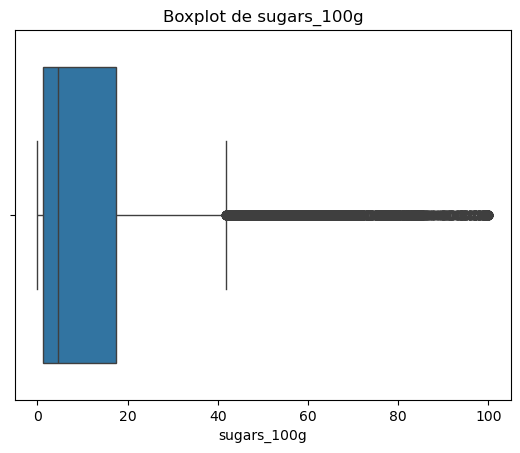

In [262]:
sns.boxplot(x=X['sugars_100g'])
plt.title('Boxplot de sugars_100g')
plt.show()

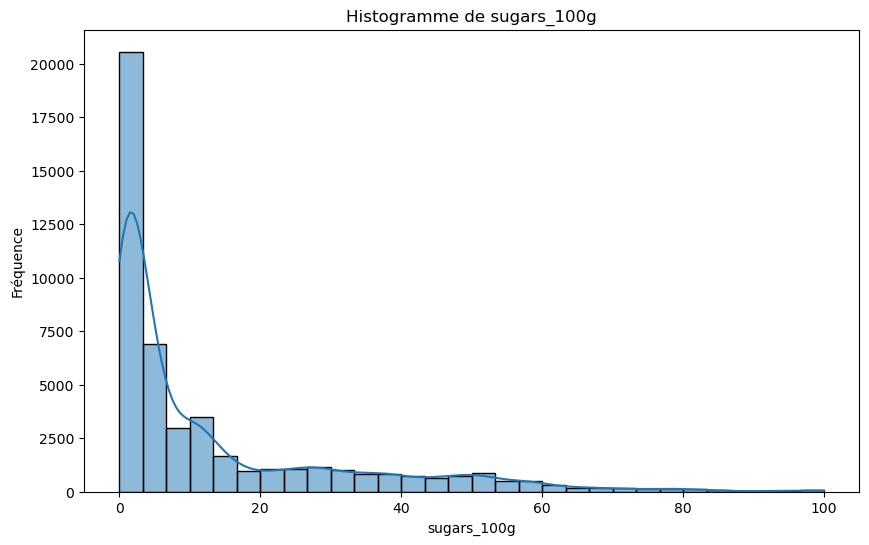

La variable sugars_100g ne suit pas une loi normale (p-value=0.0)


In [263]:
# Créer l'histogramme de 'sugars_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['sugars_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de sugars_100g')
plt.xlabel('sugars_100g')
plt.ylabel('Fréquence')
plt.show()

statistic, p_value = stats.normaltest(X['sugars_100g'])
if p_value < 0.05:
    print(f"La variable sugars_100g ne suit pas une loi normale (p-value={p_value})")
else:
    print(f"La variable sugars_100g suit une loi normale (p-value={p_value})")

Analyse des observations sur la distribution de la quantité de sucre pour 100g de produit:<br>

Les représentations confirment nos observations initiales : la quantité de sucre varie de 0 à 100g pour 100g de produit. Une quantité de 0g est typique des produits ne contenant pas de sucre, tandis que des valeurs proches de 100g sont associées à des produits tels que le sucre pur.

On remarque que les valeurs dépassant 40g sont considérées comme des outliers. Pourquoi cela ? Une telle valeur indique généralement un produit avec une concentration extrêmement élevée en sucre, ce qui est rare dans les produits alimentaires classiques. Cela pourrait être dû à des produits sucrés en grande quantité, comme des sirops, bonbons ou pâtisseries industrielles.

Les produits avec des valeurs de sucre supérieures à 40g sont souvent des aliments ultra-transformés ou spécifiques à des desserts industriels. Une telle concentration en sucre peut être associée à des préoccupations sanitaires, comme des risques accrus pour la santé cardiovasculaire, l’obésité ou le diabète. Cela peut également signaler un manque d'équilibre nutritionnel, où d'autres nutriments essentiels sont en quantité négligeable.

En conclusion, ces outliers montrent que certains produits contiennent une quantité inhabituelle de sucre, nécessitant une attention particulière pour garantir une consommation alimentaire équilibrée.

**Conclusion**
L'analyse des données révèle une grande diversité dans les produits alimentaires en ce qui concerne leur teneur en sucre. On observe des produits avec des quantités de sucre extrêmement faibles, souvent des aliments naturels ou peu transformés, tandis que d'autres contiennent des concentrations très élevées, proches des valeurs maximales de 100g pour 100g.

Les produits avec des valeurs dépassant 40g sont considérés comme des outliers et sont généralement liés à des produits ultra-transformés, tels que des desserts industriels, des confiseries ou des boissons sucrées. Cela indique une consommation de sucre en quantités inhabuellement élevées, qui peut être associée à des risques pour la santé.

En conclusion, les produits alimentaires de ce dataset illustrent la diversité des options disponibles, des produits naturellement pauvres en sucre jusqu'aux options ultra-transformées riches en sucre.

### Analyse de carbohydrates_100g

In [264]:
X['carbohydrates_100g'].describe()

count    47979.000000
mean        27.404450
std         27.084112
min          0.000000
25%          4.600000
50%         14.100000
75%         52.300000
max        100.000000
Name: carbohydrates_100g, dtype: float64

L'analyse des statistiques de carbohydrates_100g révèle plusieurs points intéressants sur la teneur en glucides des produits alimentaires dans notre dataset :

Distribution asymétrique : La médiane (50%) à 14.1g pour 100g est nettement inférieure à la moyenne de 27.4g, indiquant une distribution asymétrique vers la droite. Cela suggère qu'un nombre relativement important de produits riches en glucides tire la moyenne vers le haut.

Grande variabilité : L'écart-type élevé (27.08g) par rapport à la moyenne indique une forte dispersion des valeurs de glucides entre les produits.

Produits pauvres en glucides : 25% des produits contiennent moins de 4.6g de glucides pour 100g, ce qui correspond probablement à des aliments riches en protéines ou en graisses, comme les viandes, les fromages ou certains légumes.

Produits riches en glucides : Le dernier quartile (75%) commence à 52.3g de glucides pour 100g, révélant qu'un quart des produits sont particulièrement riches en glucides. Ces produits pourraient inclure des féculents, des céréales, des pâtisseries ou des produits à base de farine.

Extrêmes : La présence de produits avec 0g et 100g de glucides pour 100g montre la diversité des aliments, allant de produits sans glucides (comme certaines viandes ou huiles) à des glucides purs (comme le sucre ou certains produits transformés très riches en amidon).

Cette distribution reflète la grande variété des produits alimentaires, allant des aliments naturellement pauvres en glucides aux produits riches en féculents ou hautement transformés.

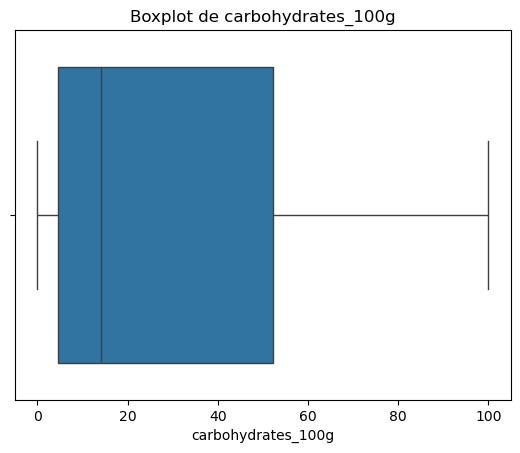

In [265]:
sns.boxplot(x=X['carbohydrates_100g'])
plt.title('Boxplot de carbohydrates_100g')
plt.show()

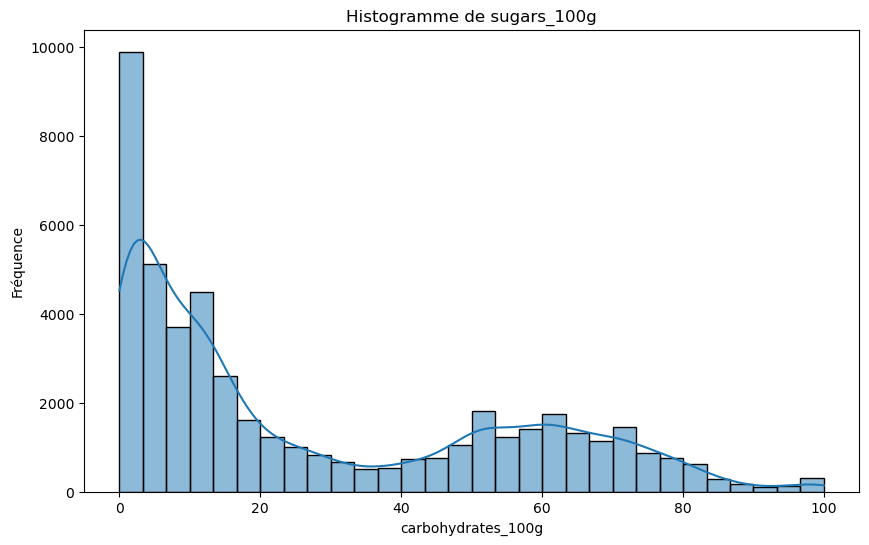

La variable carbohydrates_100g ne suit pas une loi normale (p-value=0.0)


In [266]:
plt.figure(figsize=(10,6))
sns.histplot(X['carbohydrates_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de sugars_100g')
plt.xlabel('carbohydrates_100g')
plt.ylabel('Fréquence')
plt.show()

statistic, p_value = stats.normaltest(X['carbohydrates_100g'])
if p_value < 0.05:
    print(f"La variable carbohydrates_100g ne suit pas une loi normale (p-value={p_value})")
else:
    print(f"La variable carbohydrates_100g suit une loi normale (p-value={p_value})")

Les représentations graphiques des glucides pour 100g des produits alimentaires confirment les tendances observées dans l'analyse statistique. On note une grande diversité dans les valeurs de glucides, allant des produits naturellement pauvres en glucides jusqu’aux produits très riches en féculents ou amidons.

Les produits avec des concentrations faibles en glucides, comme les viandes ou certains légumes, montrent des valeurs proches de 0g, tandis que ceux avec des concentrations élevées, comme les céréales ou les pâtisseries, peuvent atteindre près de 100g pour 100g. Les valeurs dépassant 50g sont représentatives des aliments contenant des glucides en grande quantité, souvent issus de produits transformés ou de féculents.

Les extrêmes révèlent également la diversité des produits alimentaires, allant des aliments naturels pauvres en glucides jusqu'aux préparations industrielles très concentrées en amidon et en sucres.

### Analyse de salt_100g

In [267]:
X['salt_100g'].describe()

count    47979.000000
mean         0.880011
std          1.742707
min          0.000000
25%          0.090000
50%          0.550000
75%          1.200000
max         88.900000
Name: salt_100g, dtype: float64

L'analyse des statistiques de salt_100g révèle plusieurs points intéressants sur la teneur en sel des produits alimentaires dans notre dataset :

Distribution asymétrique : La médiane (50%) à 0.6g pour 100g est nettement inférieure à la moyenne de 0.88g, indiquant une distribution asymétrique vers la droite. Cela suggère qu'un nombre relativement faible de produits très salés tire la moyenne vers le haut.

Grande variabilité : L'écart-type élevé (1.74g) par rapport à la moyenne indique une forte dispersion des valeurs de sel entre les produits.

Produits peu salés : 25% des produits contiennent moins de 0.09g de sel pour 100g, ce qui correspond probablement à des aliments naturellement pauvres en sel ou des produits sans sel ajouté.

Produits salés : Le dernier quartile (75%) commence à 1.2g de sel pour 100g, révélant qu'un quart des produits sont particulièrement riches en sel. Ces produits pourraient inclure des aliments transformés, des snacks salés ou des conserves.

Extrêmes : La présence de produits avec 0g et un maximum de 88.9g de sel pour 100g montre une grande diversité, allant des aliments sans sel ajouté à des produits extrêmement salés (sels de table).

Cette distribution reflète la variété des produits alimentaires, allant des aliments naturellement pauvres en sel aux produits hautement transformés et salés. 

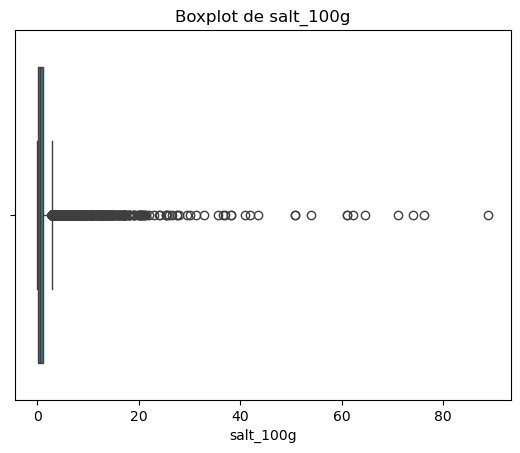

In [268]:
sns.boxplot(x=X['salt_100g'])
plt.title('Boxplot de salt_100g')
plt.show()

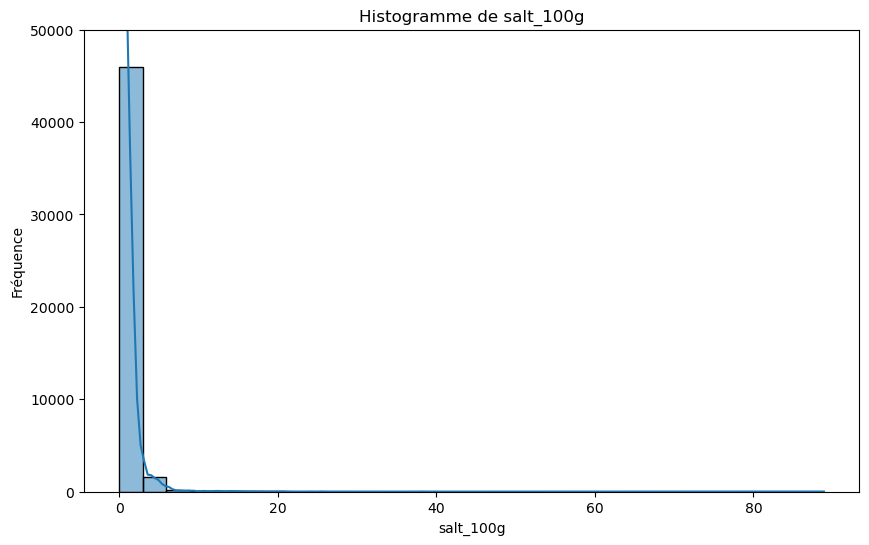

La variable salt_100g ne suit pas une loi normale (p-value=0.0)


In [269]:
# Créer l'histogramme de 'salt_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['salt_100g'], kde=True, bins=30)
plt.ylim(0, 50000)  # Limiter l'axe des ordonnées à 50 000
plt.title('Histogramme de salt_100g')
plt.xlabel('salt_100g')
plt.ylabel('Fréquence')
plt.show()

statistic, p_value = stats.normaltest(X['salt_100g'])
if p_value < 0.05:
    print(f"La variable salt_100g ne suit pas une loi normale (p-value={p_value})")
else:
    print(f"La variable salt_100g suit une loi normale (p-value={p_value})")

L'analyse graphique de la teneur en sel des produits alimentaires confirme la diversité des concentrations de sel présentes dans le dataset. On observe une distribution asymétrique, avec une médiane de 0.6g pour 100g, qui reste bien inférieure à la moyenne de 0.90g pour 100g. Cela indique que quelques produits très riches en sel influencent la moyenne, créant une asymétrie vers la droite.

Les produits avec une teneur en sel élevée sont souvent des aliments transformés, comme des snacks, des conserves ou des plats préparés. En revanche, les produits peu salés sont généralement des aliments naturels, comme certains légumes ou viandes sans sel ajouté.

Les valeurs extrêmes, allant de produits avec 0g à des concentrations atteignant 88.9g de sel pour 100g, démontrent la grande variabilité des produits alimentaires, allant des aliments sans sel à des concentrations extrêmement salées, comme le sel pur.

### Analyse de fat_100g

In [270]:
X['fat_100g'].describe()

count    47979.000000
mean        12.828248
std         15.733461
min          0.000000
25%          1.000000
50%          6.500000
75%         21.000000
max        100.000000
Name: fat_100g, dtype: float64

L'analyse des statistiques de fat_100g révèle plusieurs points intéressants sur la teneur en matières grasses des produits alimentaires dans notre dataset :<br>

Distribution asymétrique : La médiane (50%) à 6.5g pour 100g est nettement inférieure à la moyenne de 12.73g, indiquant une distribution asymétrique vers la droite. Cela suggère qu'un nombre relativement faible de produits très gras tire la moyenne vers le haut.<br>

Grande variabilité : L'écart-type élevé (15.73g) par rapport à la moyenne indique une forte dispersion des valeurs de matières grasses entre les produits.

Produits pauvres en matières grasses : 25% des produits contiennent moins de 1g de matières grasses pour 100g, ce qui correspond probablement à des aliments naturellement pauvres en graisses ou des produits allégés.

Produits riches en matières grasses : Le dernier quartile (75%) commence à 21g de matières grasses pour 100g, révélant qu'un quart des produits sont particulièrement riches en graisses. Ces produits pourraient inclure des aliments transformés, des produits de boulangerie, ou des aliments naturellement gras comme certaines viandes ou fromages.

Extrêmes : La présence de produits avec 0g et 100g de matières grasses pour 100g montre une grande diversité, allant des aliments sans matières grasses ajoutées aux huiles pures ou produits extrêmement gras.

Cette distribution reflète la variété des produits alimentaires, allant des aliments naturellement pauvres en matières grasses aux produits hautement transformés et gras.

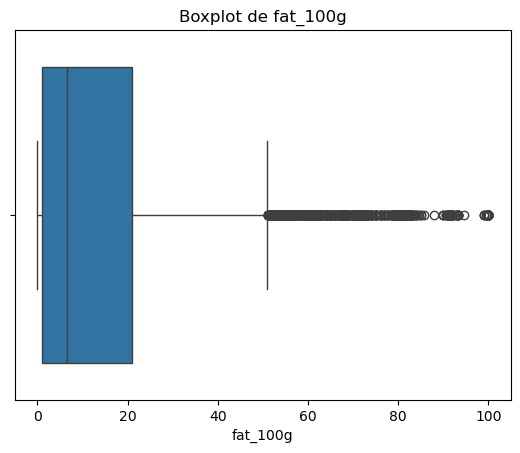

In [271]:
sns.boxplot(x=X['fat_100g'])
plt.title('Boxplot de fat_100g')
plt.show()

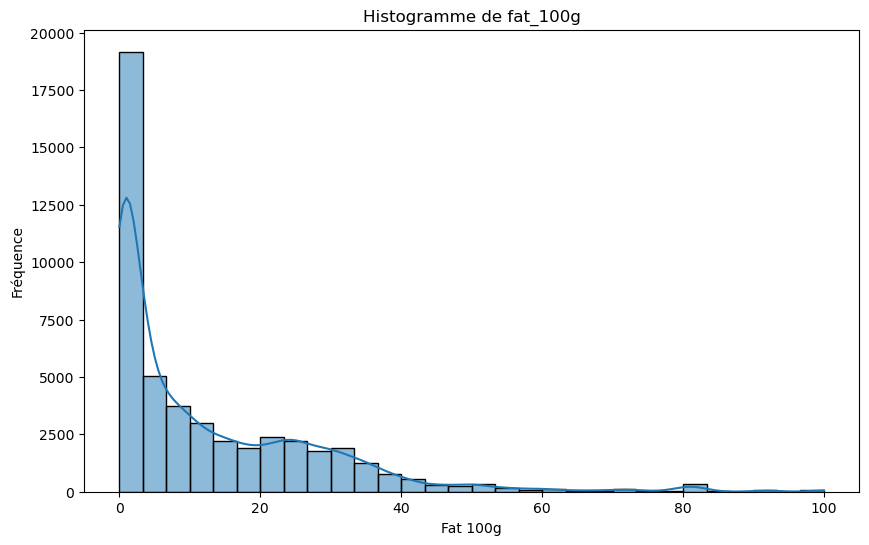

La variable fat_100g ne suit pas une loi normale (p-value=0.0)


In [272]:
# Créer l'histogramme de 'fat_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['fat_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de fat_100g')
plt.xlabel('Fat 100g')
plt.ylabel('Fréquence')
plt.show()

statistic, p_value = stats.normaltest(X['fat_100g'])
if p_value < 0.05:
    print(f"La variable fat_100g ne suit pas une loi normale (p-value={p_value})")
else:
    print(f"La variable fat_100g suit une loi normale (p-value={p_value})")

L’analyse graphique de la teneur en matières grasses confirme la variété des produits alimentaires et leur diversité en termes de composition. On observe une distribution asymétrique, avec une concentration médiane de 6.5g de matières grasses pour 100g, bien inférieure à la moyenne de 12.75g pour 100g, ce qui reflète la présence de produits particulièrement gras qui influencent fortement la moyenne.

Les produits pauvres en matières grasses (moins de 1.08g pour 100g) correspondent principalement à des aliments naturellement légers, comme des fruits, des légumes, ou des produits spécialement conçus pour être allégés. En revanche, les produits riches en matières grasses (au-delà de 20.7g pour 100g) incluent des produits transformés comme les pâtisseries, les plats préparés, ou des aliments naturellement gras comme les huiles, les viandes grasses et certains fromages.

Les valeurs extrêmes, allant de 0g à 100g de matières grasses pour 100g, mettent en évidence une grande diversité dans la composition des produits, allant des aliments sans matières grasses ajoutées aux huiles ou matières grasses pures.

### Analyse de proteins_100g

In [273]:
# Résumé statistique de la variable 'proteins_100g'
X['proteins_100g'].describe()

count    47979.000000
mean         7.442245
std          7.161622
min          0.000000
25%          1.700000
50%          5.900000
75%         10.100000
max         80.000000
Name: proteins_100g, dtype: float64

L'analyse des statistiques de proteins_100g révèle plusieurs points intéressants sur la teneur en protéines des produits alimentaires dans notre dataset :

Distribution asymétrique : La médiane (50%) à 5.9g pour 100g est inférieure à la moyenne de 7.44g, indiquant une distribution légèrement asymétrique vers la droite. Cela suggère qu'un certain nombre de produits riches en protéines tire la moyenne vers le haut.

Variabilité modérée : L'écart-type (7.16g) est proche de la moyenne, indiquant une dispersion modérée des valeurs de protéines entre les produits.

Produits pauvres en protéines : 25% des produits contiennent moins de 1.7g de protéines pour 100g, ce qui correspond probablement à des aliments naturellement pauvres en protéines comme certains fruits, légumes ou produits transformés à base de glucides.

Produits riches en protéines : Le dernier quartile (75%) commence à 10.1g de protéines pour 100g, révélant qu'un quart des produits sont particulièrement riches en protéines. Ces produits pourraient inclure des viandes, poissons, produits laitiers ou alternatives végétales riches en protéines.

Extrêmes : La présence de produits avec 0g et un maximum de 80g de protéines pour 100g montre une grande diversité, allant des aliments sans protéines aux concentrés protéiques très riches.

Cette distribution reflète la variété des produits alimentaires, allant des aliments naturellement pauvres en protéines aux produits spécifiquement conçus pour leur apport protéique élevé.

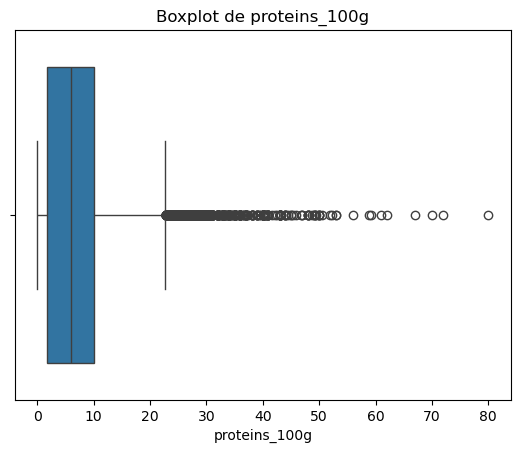

In [274]:
# Boxplot de la variable 'proteins_100g'
sns.boxplot(x=X['proteins_100g'])
plt.title('Boxplot de proteins_100g')
plt.show()

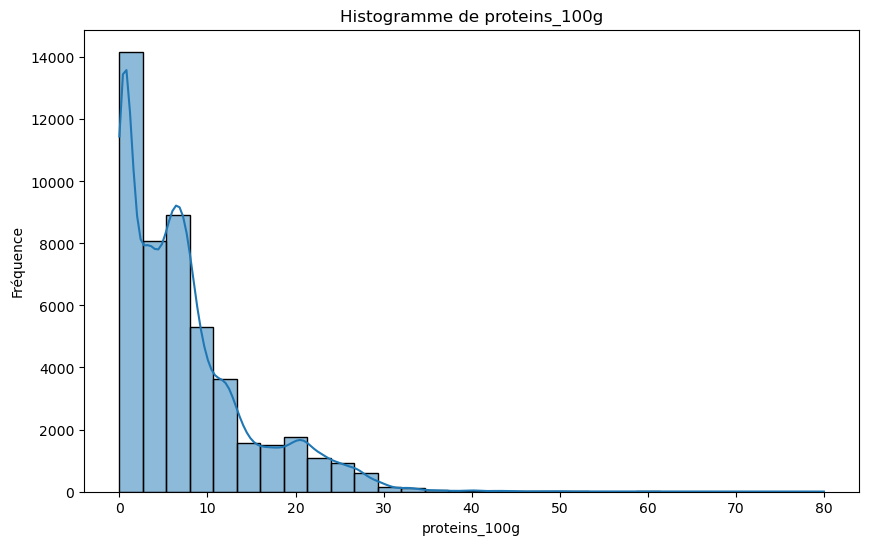

La variable proteins_100g ne suit pas une loi normale (p-value=0.0)


In [275]:
# Créer l'histogramme de 'proteins_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['proteins_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de proteins_100g')
plt.xlabel('proteins_100g')
plt.ylabel('Fréquence')
plt.show()

statistic, p_value = stats.normaltest(X['proteins_100g'])
if p_value < 0.05:
    print(f"La variable proteins_100g ne suit pas une loi normale (p-value={p_value})")
else:
    print(f"La variable proteins_100g suit une loi normale (p-value={p_value})")

L’analyse graphique de la teneur en protéines met en évidence la diversité des produits alimentaires dans le dataset. 

Les produits se répartissent de manière variée, allant des aliments naturellement pauvres en protéines, comme les fruits et légumes, aux produits spécifiquement conçus pour leur forte teneur protéique, comme les poudres ou concentrés protéiques.

La majorité des aliments ont une teneur modérée en protéines, avec une médiane de 5.9g pour 100g, mais certains produits, notamment les viandes, poissons, produits laitiers, et alternatives végétales riches en protéines, atteignent des niveaux nettement plus élevés. Ces produits sont bien représentés dans le quartile supérieur (au-delà de 10.2g pour 100g), soulignant leur rôle dans une alimentation riche en protéines.

En revanche, les produits avec des teneurs très faibles (moins de 1.7g pour 100g) correspondent à des aliments naturellement pauvres en protéines ou à des produits transformés axés sur les glucides ou les lipides.

Les valeurs extrêmes, de 0g à 80g de protéines pour 100g, reflètent non seulement la diversité des aliments disponibles, mais aussi l’influence des produits très riches en protéines, comme les concentrés ou suppléments protéiques, sur la distribution globale.

### Analyse d'energy_100g

In [276]:
# Résumé statistique de la variable 'energy_100g'
X['energy_100g'].describe()

count    47979.000000
mean      1074.313833
std        763.663533
min          0.000000
25%        381.000000
50%        982.000000
75%       1640.000000
max       3883.000000
Name: energy_100g, dtype: float64

L'analyse des statistiques de energy_100g révèle plusieurs points intéressants sur la teneur énergétique des produits alimentaires dans notre dataset :

Distribution asymétrique : La médiane (50%) à 982 kj pour 100g est inférieure à la moyenne de 1074.3 kj, indiquant une distribution asymétrique vers la droite. Cela suggère qu'un certain nombre de produits très caloriques tire la moyenne vers le haut.

Grande variabilité : L'écart-type élevé (763.7 kj) par rapport à la moyenne indique une forte dispersion des valeurs énergétiques entre les produits.

Produits peu caloriques : 25% des produits contiennent moins de 381 kj pour 100g, ce qui correspond probablement à des aliments naturellement pauvres en calories comme certains fruits, légumes ou produits allégés.

Produits très caloriques : Le dernier quartile (75%) commence à 1640 kj pour 100g, révélant qu'un quart des produits sont particulièrement riches en énergie. Ces produits pourraient inclure des aliments transformés, des produits de boulangerie, ou des aliments naturellement denses en calories.

Extrêmes : La présence de produits avec 0 kj et un maximum de 3883 kj pour 100g montre une grande diversité, allant des aliments sans calories (des produits comme l'eau) aux aliments extrêmement caloriques.

Cette distribution reflète la variété des produits alimentaires, allant des aliments naturellement pauvres en calories aux produits hautement transformés et énergétiques.

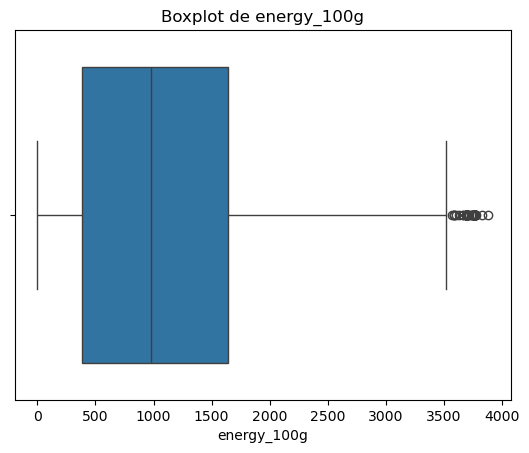

In [277]:
# Boxplot de la variable 'energy_100g'
sns.boxplot(x=X['energy_100g'])
plt.title('Boxplot de energy_100g')
plt.show()

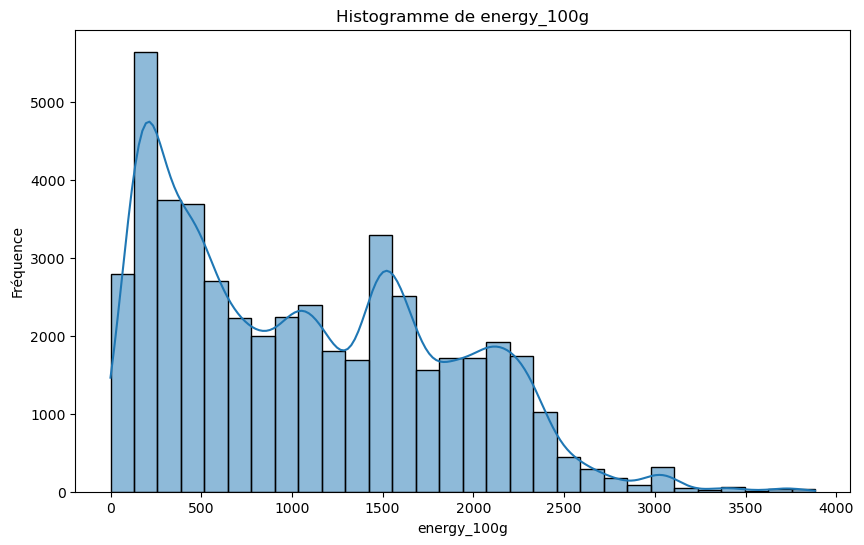

La variable energy_100g ne suit pas une loi normale (p-value=0.0)


In [278]:
# Créer l'histogramme de 'energy_100g'
plt.figure(figsize=(10,6))
sns.histplot(X['energy_100g'], kde=True, bins=30)  # Ajouter un kernel density estimate (KDE) pour une meilleure visualisation
plt.title('Histogramme de energy_100g')
plt.xlabel('energy_100g')
plt.ylabel('Fréquence')
plt.show()

statistic, p_value = stats.normaltest(X['energy_100g'])
if p_value < 0.05:
    print(f"La variable energy_100g ne suit pas une loi normale (p-value={p_value})")
else:
    print(f"La variable energy_100g suit une loi normale (p-value={p_value})")

L’analyse graphique de la teneur énergétique met en lumière une grande diversité de produits alimentaires dans le dataset, avec des valeurs énergétiques allant de 0 kcal à des niveaux très élevés, jusqu’à 3883 kcal pour 100g. 

Cette variété reflète les différences importantes entre les aliments naturellement pauvres en calories, comme les fruits, légumes ou produits allégés, et les aliments denses en énergie, tels que les produits transformés, les huiles ou les confiseries.

La majorité des produits ont une valeur énergétique modérée, avec une médiane de 977 kcal pour 100g, mais le quart supérieur dépasse 1640 kcal pour 100g, mettant en évidence la présence de nombreux produits très caloriques. Ces derniers incluent souvent des aliments riches en matières grasses ou en sucres, comme les snacks, pâtisseries ou plats préparés.

## Analyses bivariées

In [279]:
# Fusionner X et y sur l'index
df = X.join(y)

In [280]:
df_copie = df.copy()

In [281]:
df.head()

,code,product_name,energy_100g,fat_100g,proteins_100g,salt_100g,sugars_100g,carbohydrates_100g,pnns_groups_1
174,0000000290616,Salade Cesar,1210.0,12.00,22.00,2.16,0.00,23.00,Fruits and vegetables
175,0000000394710,Danoises à la cannelle roulées,1520.0,14.40,4.79,0.92,28.10,54.10,Sugary snacks
180,0000001938067,Chaussons tressés aux pommes,1090.0,10.70,3.33,0.65,24.70,38.70,Sugary snacks
185,0000008237798,Quiche Lorraine,478.0,6.79,5.36,0.50,0.71,7.86,Composite foods
186,0000008240095,Pâté au poulet,751.0,10.20,33.90,0.74,10.22,16.60,Fish meat eggs


### Analyse globale des corrélations entre les variables

Dans cette section, nous explorons les relations entre les différentes variables numériques du jeu de données. L'objectif est d'identifier des associations pertinentes qui pourraient influencer l'analyse des données.

Pour cela, nous utilisons des nuages de points qui permettent de visualiser chaque paire de variables, afin de repérer des tendances, des associations linéaires ou non linéaires. Cette analyse nous aide notamment à préparer une ACP (Analyse en Composantes Principales) en garantissant que seules les relations utiles et significatives seront prises en compte, tout en évitant les corrélations internes qui pourraient fausser les résultats.

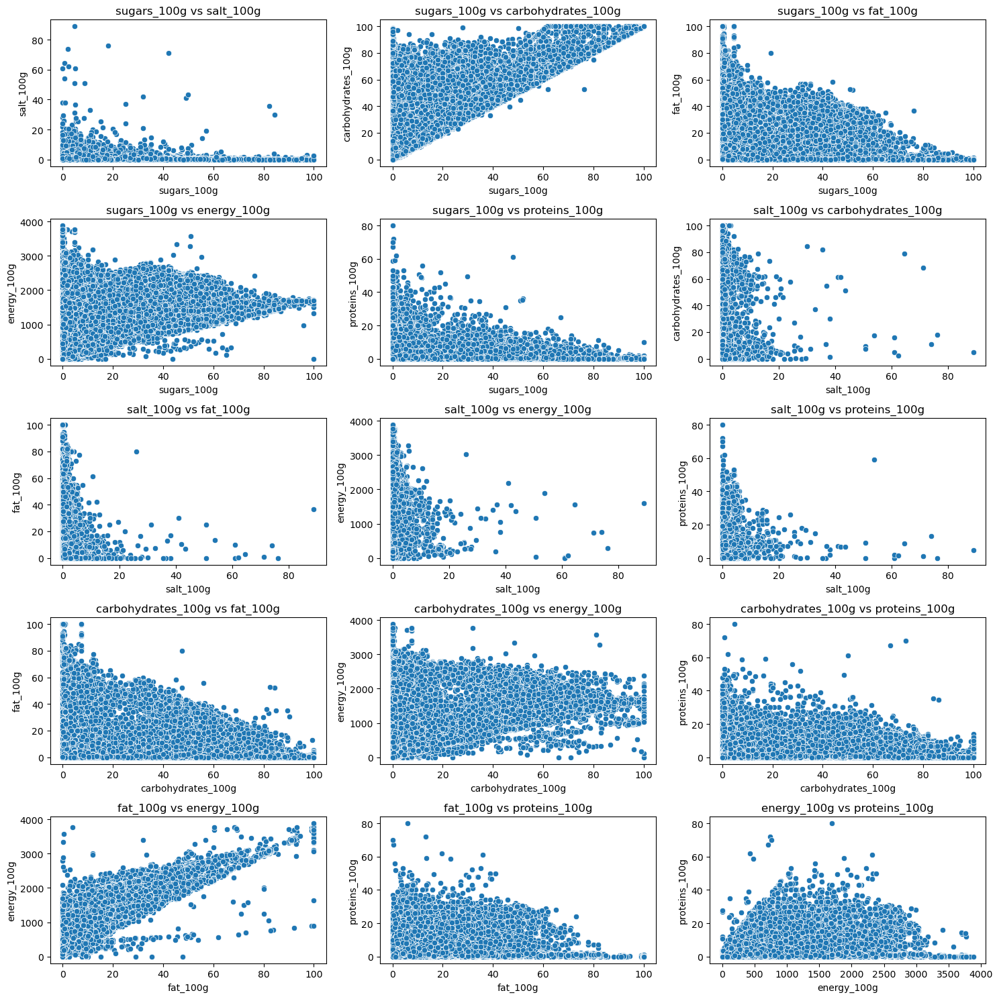

In [282]:
# Sélection des variables d'intérêt
variables = ['sugars_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'energy_100g', 'proteins_100g']

# Nombre total de sous-graphiques nécessaires
n = len(variables)
num_plots = n * (n - 1) // 2  # 15 combinaisons

fig, axes = plt.subplots(5, 3, figsize=(15, 15))

# Liste des combinaisons des variables
combinations = [(variables[i], variables[j]) for i in range(len(variables)) for j in range(i + 1, len(variables))]

# Parcourir les sous-graphiques pour ajouter chaque paire
for idx, (var1, var2) in enumerate(combinations):
    row, col = divmod(idx, 3)
    sns.scatterplot(x=var1, y=var2, data=df, ax=axes[row, col])
    axes[row, col].set_title(f'{var1} vs {var2}')

# Ajustement des marges pour une meilleure visibilité
plt.tight_layout()
plt.show()

Comme les nuages de points ne montrent pas de relation linéaire entre les variables, il est préférable d'utiliser la corrélation de Spearman. Cette méthode est mieux adaptée pour détecter des relations monotones, même lorsqu'elles ne sont pas linéaires, et elle est moins influencée par les valeurs aberrantes. En analysant les corrélations de Spearman, on peut identifier les liens pertinents entre les variables.

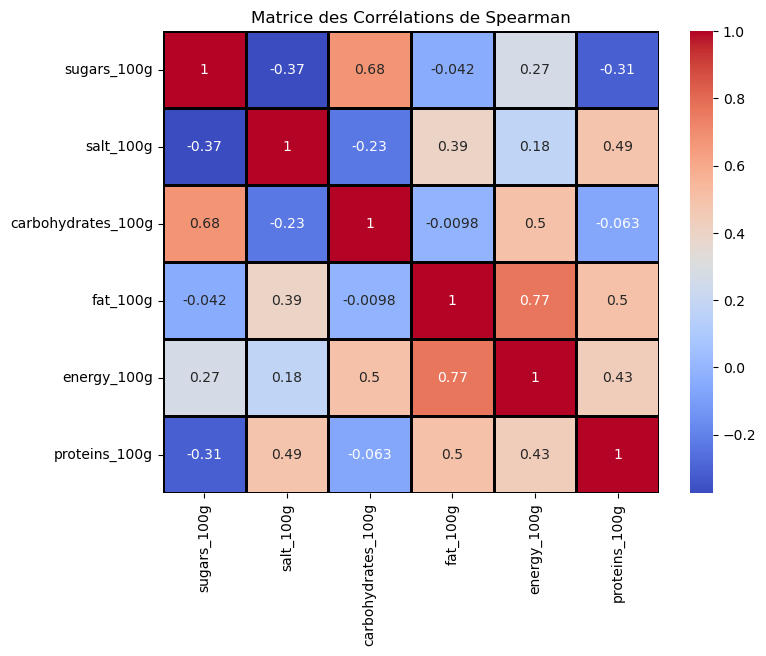

In [283]:
# Calculer la matrice des corrélations de Spearman
matrice_spearman = df[['sugars_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'energy_100g', 'proteins_100g']].corr(method='spearman')

# Afficher la matrice des corrélations sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(matrice_spearman, annot=True, cmap="coolwarm", linewidths=1, linecolor="black")
plt.title('Matrice des Corrélations de Spearman')
plt.show()

In [284]:
# Afficher la matrice des corrélations
print(matrice_spearman)

                    sugars_100g  salt_100g  carbohydrates_100g  fat_100g  \
sugars_100g            1.000000  -0.373566            0.676558 -0.041913   
salt_100g             -0.373566   1.000000           -0.231968  0.394115   
carbohydrates_100g     0.676558  -0.231968            1.000000 -0.009751   
fat_100g              -0.041913   0.394115           -0.009751  1.000000   
energy_100g            0.268290   0.178493            0.497986  0.765367   
proteins_100g         -0.311623   0.489170           -0.062533  0.500488   

                    energy_100g  proteins_100g  
sugars_100g            0.268290      -0.311623  
salt_100g              0.178493       0.489170  
carbohydrates_100g     0.497986      -0.062533  
fat_100g               0.765367       0.500488  
energy_100g            1.000000       0.434599  
proteins_100g          0.434599       1.000000  


**Corrélations fortes (|r| ≥ 0.7)** :
fat_100g - energy_100g : 0.765332

**Corrélations modérées (0.5 ≤ |r| < 0.7)** :
sugars_100g - carbohydrates_100g : 0.676558
fat_100g - proteins_100g : 0.500475

**Observations** :
La corrélation la plus forte est entre fat_100g et energy_100g, ce qui est logique car les graisses sont une source importante d'énergie.

Il y a une corrélation modérée entre sugars_100g et carbohydrates_100g, ce qui est attendu car les sucres sont un type de glucides.

La corrélation entre fat_100g et proteins_100g est juste au seuil de 0.5.

Étant donné la forte corrélation entre fat_100g et energy_100g, et considérant qu'energy_100g offre une mesure plus globale de la densité énergétique des aliments, nous avons choisi de nous concentrer uniquement sur l'analyse de la relation entre energy_100g et la variable cible pnns_groups_1. Cette approche nous permettra d'évaluer l'importance de l'apport énergétique dans la caractérisation des groupes alimentaires, tout en simplifiant notre analyse et en réduisant la redondance potentielle. L'étude d'energy_100g devrait nous fournir des informations suffisantes pour décider de la pertinence de conserver cette variable dans notre ACP, tout en capturant indirectement l'influence des graisses sur la composition nutritionnelle des aliments.

### Analyses bivariées entre feature et cible

#### Analyse bivariée :energie en fonction des groupes PNNS 1

Dans cette section, nous allons nous concentrer sur l'analyse de la relation entre **energy_100g et pnns_groups_1**. Cette analyse nous permettra de :<br>

Comprendre **comment la densité énergétique varie selon les différents groupes alimentaires**.<br>
Évaluer **l'importance d'energy_100g dans la caractérisation des groupes alimentaires**.<br>
Déterminer si energy_100g apporte des informations pertinentes pour notre analyse, justifiant ainsi son inclusion dans l'ACP.<br>

Pour réaliser cette analyse, nous allons utiliser des méthodes statistiques et des visualisations adaptées à la nature de nos variables. Étant donné que pnns_groups_1 est une variable catégorielle et energy_100g une variable continue, nous allons :<br>

Utiliser des box plots pour visualiser la distribution d'energy_100g dans chaque groupe alimentaire.<br>
Effectuer un test de Kruskal-Wallis pour tester s'il existe des différences significatives de densité énergétique entre les groupes.<br>

Cette analyse nous fournira des informations cruciales pour décider de l'inclusion d'energy_100g dans notre ACP, tout en nous donnant des insights précieux sur la relation entre la densité énergétique et les différents groupes alimentaires. De plus, elle nous permettra d'évaluer indirectement l'influence des autres nutriments, y compris les matières grasses, sur la composition énergétique des aliments dans chaque groupe.

##### Analyse des distributions de energy_100g en fonction des groupes PNNS1

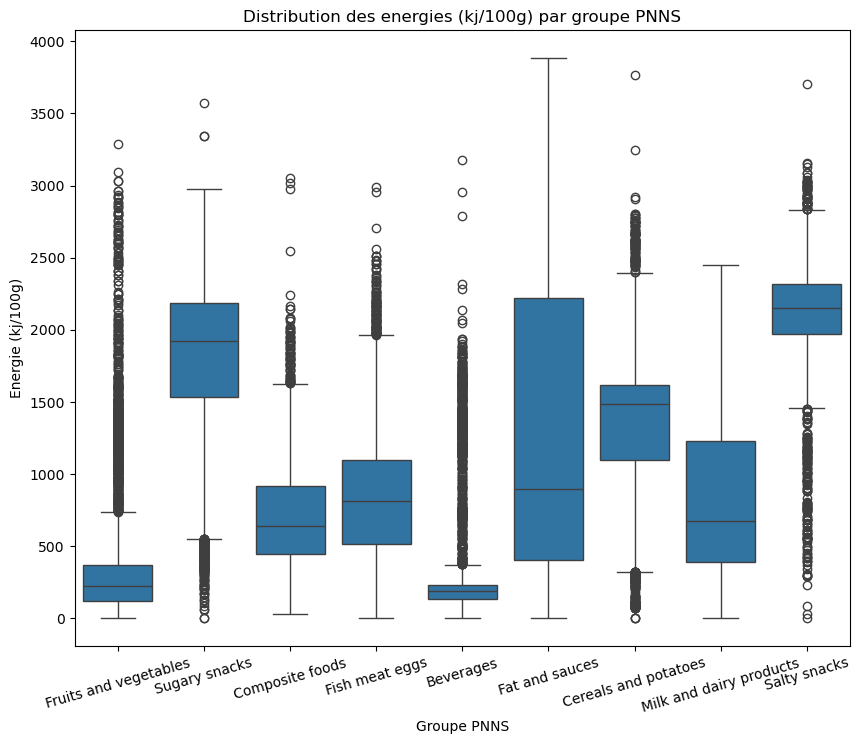

In [285]:
# Création du box plot
plt.figure(figsize=(10, 8))
sns.boxplot(x='pnns_groups_1', y='energy_100g', data=df)
plt.title('Distribution des energies (kj/100g) par groupe PNNS')
plt.xlabel('Groupe PNNS')
plt.ylabel('Energie (kj/100g)')
plt.xticks(rotation=16)  # Pour mieux voir les labels si nécessaire
plt.show()

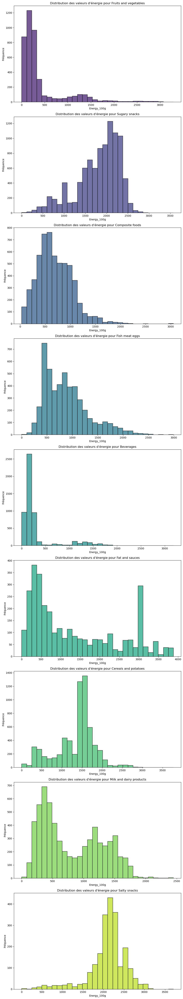

In [286]:
# Liste des groupes PNNS
pnns_groups = df['pnns_groups_1'].unique()

# Création des sous-grilles pour afficher un histogramme par groupe PNNS
num_groups = len(pnns_groups)

fig, axes = plt.subplots(num_groups, 1, figsize=(10, 6 * num_groups))

# Liste de couleurs personnalisées pour chaque groupe
colors = sns.color_palette("viridis", num_groups)

for i, group in enumerate(pnns_groups):
    sns.histplot(df[df['pnns_groups_1'] == group]['energy_100g'], ax=axes[i], color=colors[i], bins=30)
    axes[i].set_title(f'Distribution des valeurs d\'énergie pour {group}')
    axes[i].set_xlabel('Energy_100g')
    axes[i].set_ylabel('Fréquence')

plt.tight_layout()  # Ajuste l'espace entre les sous-grilles
plt.show()

In [287]:
# Moyenne, écart-type, médiane, min et max des sucres par groupe PNNS
stats = df.groupby('pnns_groups_1')['energy_100g'].agg(['mean', 'std', 'median', 'min', 'max'])
print(stats)

                                mean          std  median   min     max
pnns_groups_1                                                          
Beverages                 305.180145   391.359311   189.0   0.0  3180.0
Cereals and potatoes     1350.226391   491.046596  1488.0   0.0  3770.0
Composite foods           690.677100   347.076988   638.5  30.0  3054.0
Fat and sauces           1327.423387  1091.803774   895.0   0.0  3883.0
Fish meat eggs            877.679137   435.395474   812.0   0.0  2992.0
Fruits and vegetables     412.506455   514.150173   222.0   0.0  3287.5
Milk and dairy products   812.814299   487.354890   671.0   0.0  2448.0
Salty snacks             2103.092758   453.814721  2150.0   0.0  3707.0
Sugary snacks            1807.095266   504.078143  1923.0   0.0  3573.0


**Salty Snacks et Sugary Snacks**<br>
Les groupes Salty Snacks et Sugary Snacks affichent des **densités énergétiques particulièrement élevées**, avec des moyennes dépassant 2000 kcal/100g. 

**Céréales et pommes de terre**<br>
Le groupe Cereals and Potatoes est également **riche en énergie** (1350 kcal/100g). Cela montre une densité énergétique significative principalement due aux carbohydrates.

**Fat and Sauces**<br>
Les produits Fat and Sauces présentent des **valeurs énergétiques élevées** (1327 kcal/100g) avec des écarts importants, soulignant une variabilité des graisses utilisées dans ces formulations.

**Composite Foods**<br>
Le groupe des Composite Foods présente une **énergie moyenne intermédiaire** (690 kcal/100g) mais avec une variabilité considérable.

**Beverages (Boissons)**<br>
Les boissons ont une **énergie moyenne plus faible** (305 kcal/100g) mais une grande diversité en raison des différents ingrédients utilisés (sucres, alcools, vitamines).

**Milk and Dairy Products**<br>
Les produits laitiers offrent **une énergie modérée** (812 kcal/100g).

**Fruits et légumes**<br>
Les Fruits et légumes montrent une densité énergétique moyenne de 412 kcal/100g, ce qui est beaucoup plus faible que les autres groupes, mais peut atteindre des valeurs élevées lorsqu'ils sont déshydratés ou concentrés.

Les groupes PNNS peuvent être catégorisés en trois grands types selon leur densité énergétique :

**Haute densité énergétique** : Salty Snacks, Sugary Snacks, et Fat and Sauces (2000+ kcal/100g).<br>
**Énergie moyenne** : Composite Foods, Céréales et pommes de terre, et Milk and Dairy Products.<br>
**Faible densité énergétique** : Fruits et légumes, avec une densité qui reste généralement plus faible et équilibrée.<br>

Pour déterminer si les différences observées dans les valeurs d'energy_100g entre les groupes PNNS sont statistiquement significatives, nous allons utiliser plusieurs tests statistiques. Ces tests sont essentiels pour comprendre si les écarts que nous voyons dans les moyennes ou les distributions sont réels ou simplement dus au hasard.

######  Test de Kruskal-Wallis

Afin d'étudier si les groupes PNNS présentent des différences significatives dans leurs concentrations d'energie (energy_100g), nous allons utiliser le test de Kruskal-Wallis.

Pourquoi choisir ce test ?<br>
Les distributions des sucres ne suivent pas une loi normale, ce qui rend les tests paramétriques classiques (comme l'ANOVA) peu adaptés.<br>
Le test de Kruskal-Wallis est une méthode non paramétrique, robuste et efficace pour comparer des distributions sans nécessiter l'hypothèse de normalité.

Objectif du Test<br>
L'objectif est de déterminer s'il existe une différence statistiquement significative entre au moins un des groupes PNNS, concernant leurs valeurs d'energy_100g. Si ce test révèle des différences, cela suggère qu'au moins un groupe PNNS a une distribution d'energie distincte des autres. Cette analyse pourra ensuite être approfondie par des tests post-hoc pour isoler précisément les groupes concernés.<br>

En résumé, nous allons utiliser le test de Kruskal-Wallis pour une analyse robuste et fiable des différences intergroupes, en nous assurant de ne pas être influencés par les contraintes de distribution des données.

In [288]:
# Création des groupes pour le test Kruskal-Wallis
grouped_data = [group['energy_100g'].dropna().values for name, group in df.groupby('pnns_groups_1')]

# Test de Kruskal-Wallis entre les groupes PNNS
stat, p_value = kruskal(*grouped_data)

print(f"Statistique de Kruskal-Wallis : {stat}")
print(f"Valeur p : {p_value}")

# Interprétation des résultats
if p_value < 0.05:
    print("Il existe au moins une différence significative entre les groupes PNNS.")
else:
    print("Aucune différence significative n'a été détectée entre les groupes PNNS.")

Statistique de Kruskal-Wallis : 27028.311631136723
Valeur p : 0.0
Il existe au moins une différence significative entre les groupes PNNS.


Une p-valeur extrêmement faible (effectivement proche de zéro) indique une différence statistiquement significative entre les groupes PNNS. En d'autres termes, cela signifie qu'au moins l'un des groupes PNNS présente une distribution des energies qui diffère des autres groupes.

Cette différence significative suggère qu'il existe des écarts notables entre les groupes PNNS concernant les quantités d'energie, ce qui peut être exploré plus en profondeur. Pour approfondir l'analyse et interpréter précisément quels groupes diffèrent nous allons effectuer un test de Dunn.

###### Test de Dunn

Après avoir effectué le test de Kruskal-Wallis, qui a révélé des différences globales significatives entre les groupes PNNS concernant la distribution des energies, nous souhaitons maintenant identifier précisément quels groupes diffèrent entre eux.

Pour ce faire, nous allons utiliser le test post-hoc de Dunn, une méthode non paramétrique qui compare toutes les paires de groupes. Ce test ajuste automatiquement pour contrôler les erreurs statistiques et permet ainsi de déterminer avec précision quels groupes présentent des différences significatives.

Nous allons donc appliquer ce test pour comparer chaque groupe PNNS pair par pair afin d'identifier les différences spécifiques entre les distributions de sucres.

In [289]:
# Effectuer le test de Dunn pour comparer les groupes PNNS
dunn_results = sp.posthoc_dunn(df, val_col='energy_100g', group_col='pnns_groups_1')

# Afficher les résultats
print(dunn_results)

                            Beverages  Cereals and potatoes  Composite foods  \
Beverages                1.000000e+00          0.000000e+00     0.000000e+00   
Cereals and potatoes     0.000000e+00          1.000000e+00     0.000000e+00   
Composite foods          0.000000e+00          0.000000e+00     1.000000e+00   
Fat and sauces           0.000000e+00          5.875922e-38    4.346528e-149   
Fish meat eggs           0.000000e+00         7.516843e-208     2.150114e-43   
Fruits and vegetables    1.085702e-16          0.000000e+00    8.534261e-187   
Milk and dairy products  0.000000e+00          0.000000e+00     4.467632e-14   
Salty snacks             0.000000e+00         3.773272e-244     0.000000e+00   
Sugary snacks            0.000000e+00         2.634495e-239     0.000000e+00   

                         Fat and sauces  Fish meat eggs  \
Beverages                  0.000000e+00    0.000000e+00   
Cereals and potatoes       5.875922e-38   7.516843e-208   
Composite foods       

P-values proches de 0<br>
Les valeurs extrêmement petites indiquent des différences significatives entre ces groupes. Cela signifie que la moyenne des energies pour ces groupes est statistiquement distincte.

Valeurs de 1.0<br>
Lorsque la p-value est de 1, cela signifie qu'aucune différence statistique significative n'existe entre ces groupes.


**Résumé des Résultats du Test Post-hoc de Dunn**

| Groupe                  | Différences significatives avec les autres groupes |
|:------------------------|:---------------------------------------------------|
| Beverages              | Oui                                                |
| Cereals and potatoes   | Oui                                                |
| Composite foods        | Oui                                                |
| Fat and sauces         | Oui                                                |
| Fish meat eggs         | Oui                                                |
| Fruits and vegetables  | Oui                                                |
| Milk and dairy products| Oui                                                |
| Salty snacks           | Oui                                                |
| Sugary snacks          | Oui                                                |




Le test de Kruskal-Wallis a montré des différences significatives entre les groupes PNNS concernant la concentration en énergie (energy_100g). Le test post-hoc de Dunn a permis de localiser précisément les paires de groupes qui diffèrent de manière significative. En complément, l'indice de taille d'effet (H) montre une différence substantielle entre les groupes, renforçant la conclusion que les groupes alimentaires ont un impact notable sur les niveaux d'énergie. Cette analyse fournit une base solide pour comprendre les variations énergétiques dans les produits alimentaires classés par groupe PNNS.

#### Conclusion

**Analyse des Distributions des Énergies par Groupe PNNS**
Nous avons analysé les distributions des valeurs d’énergie par groupe PNNS, ce qui a permis de mettre en évidence des caractéristiques spécifiques :

Les groupes tels que "Salty snacks" et "Sugary snacks" présentent des valeurs d’énergie significativement plus élevées, ce qui en fait des groupes clairement différenciés par leur densité énergétique.
À l’inverse, des groupes comme "Beverages" ou "Fruits and vegetables" affichent des valeurs d’énergie nettement plus faibles, avec une distribution asymétrique et une concentration autour de valeurs basses.
Certains groupes, comme "Fat and sauces", montrent une variabilité importante, traduisant la diversité des produits qui les composent.
Cette analyse met en lumière les disparités marquées entre les groupes PNNS, fournissant des informations clés pour leur distinction.

**Tests Statistiques des Différences entre Groupes PNNS**
Pour confirmer les écarts observés, des tests statistiques ont été effectués :

Le test de Kruskal-Wallis a révélé des différences significatives entre les groupes PNNS en termes d’énergie, confirmant qu’ils ne partagent pas une même distribution.
Le test post-hoc de Dunn a permis de préciser les groupes présentant des différences significatives entre eux. Chaque groupe PNNS montre des valeurs d’énergie distinctes, avec des écarts importants validés statistiquement.
Ces résultats valident l’idée que l’énergie des aliments est une variable discriminante pour différencier les groupes PNNS.

**Relation avec l'Objectif du Projet**
Ces résultats s'intègrent directement à notre objectif de prédiction des groupes PNNS1 en utilisant les caractéristiques nutritionnelles :
Les valeurs d'énergie peuvent servir de variable explicative importante, étant donné leur capacité à différencier les groupes de manière significative. 
Les tests statistiques confirment que l'énergie est un critère clé, particulièrement pertinent pour entraîner des modèles de machine learning capables de prédire efficacement le groupe PNNS d'un produit alimentaire.

En conclusion, l'énergie des aliments constitue une variable robuste et discriminante, qui pourra être exploitée dans les approches prédictives du projet.

### Analyse des corrélation des autres variables avec la cible

Après avoir examiné en détail les relations entre energy_100g et notre cible (pnns_groups_1), nous allons maintenant nous pencher sur les autres variables nutritionnelles de notre jeu de données. Cependant, pour optimiser notre analyse et éviter une exploration trop exhaustive, nous adopterons une approche plus concise pour ces variables supplémentaires.<br>
Dans cette section, nous utiliserons le test de Kruskal-Wallis pour évaluer rapidement la relation entre chaque variable nutritionnelle et les groupes PNNS. Ce choix méthodologique se justifie par plusieurs raisons :<br>

Efficacité : Le test de Kruskal-Wallis nous permet d'identifier efficacement les variables qui présentent des différences significatives entre les groupes PNNS sans nécessiter une analyse détaillée pour chacune.<br>
Non-paramétrique : Ce test est adapté à notre contexte car il ne présuppose pas une distribution normale des données, ce qui est souvent le cas pour les variables nutritionnelles.<br>
Comparaison multiple : Il nous permet de comparer simultanément plusieurs groupes (nos différents groupes PNNS) pour chaque variable.<br>
Identification des variables pertinentes : Les résultats nous aideront à identifier rapidement les variables qui pourraient être les plus discriminantes pour notre classification des groupes PNNS.<br>

Cette approche nous permettra d'obtenir une vue d'ensemble des relations entre nos variables nutritionnelles et les groupes PNNS, tout en concentrant nos efforts d'analyse détaillée sur les variables les plus prometteuses pour notre modèle de classification.

In [291]:
variables = ['salt_100g', 'proteins_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g']

for var in variables:
    # Création des groupes pour le test Kruskal-Wallis
    grouped_data = [group[var].dropna().values for name, group in df.groupby('pnns_groups_1')]

    # Test de Kruskal-Wallis entre les groupes PNNS
    stat, p_value = kruskal(*grouped_data)

    print(f"\nVariable : {var}")
    print(f"Statistique de Kruskal-Wallis : {stat:.4f}")
    print(f"Valeur p : {p_value:.4e}")

    # Interprétation des résultats
    if p_value < 0.05:
        print("Il existe au moins une différence significative entre les groupes PNNS.")
    else:
        print("Aucune différence significative n'a été détectée entre les groupes PNNS.")


Variable : salt_100g
Statistique de Kruskal-Wallis : 19055.7611
Valeur p : 0.0000e+00
Il existe au moins une différence significative entre les groupes PNNS.

Variable : proteins_100g
Statistique de Kruskal-Wallis : 26412.0888
Valeur p : 0.0000e+00
Il existe au moins une différence significative entre les groupes PNNS.

Variable : fat_100g
Statistique de Kruskal-Wallis : 18415.4402
Valeur p : 0.0000e+00
Il existe au moins une différence significative entre les groupes PNNS.

Variable : sugars_100g
Statistique de Kruskal-Wallis : 22426.4503
Valeur p : 0.0000e+00
Il existe au moins une différence significative entre les groupes PNNS.

Variable : carbohydrates_100g
Statistique de Kruskal-Wallis : 28912.6267
Valeur p : 0.0000e+00
Il existe au moins une différence significative entre les groupes PNNS.


Les résultats du test de Kruskal-Wallis montrent que toutes les variables analysées  présentent des différences significatives entre les groupes PNNS, avec des valeurs p égales à 0 (inférieures au seuil de 0.05). Ces résultats indiquent que ces variables sont pertinentes pour distinguer les groupes PNNS.<br>

Cette pertinence s'explique par le fait que ces variables capturent des aspects fondamentaux des profils nutritionnels des aliments, qui varient naturellement selon les catégories alimentaires. Par exemple :<br>

Salt_100g : La teneur en sel est un critère important pour différencier des groupes comme les snacks salés, les plats préparés ou les produits laitiers.<br>

Proteins_100g : Les protéines sont un indicateur clé pour des groupes comme les produits carnés, les produits laitiers ou les substituts végétaux.<br>

Fat_100g : La teneur en matières grasses varie fortement entre des groupes comme les huiles, les produits transformés et les fruits et légumes.<br>

Sugars_100g :La teneur en sucres est cruciale pour distinguer des groupes comme les Sugary snacks, les Beverages, ou les Fruits and vegetables, par rapport aux aliments moins sucrés comme les Fish meat eggs, qui contiennent généralement très peu de sucres.<br>

Carbohydrates_100g : Les glucides totaux permettent de différencier des groupes riches en amidon comme les céréales et les pâtes, des groupes pauvres en glucides comme les viandes.<br>

Ces résultats confirment que ces variables nutritionnelles jouent un rôle important dans la caractérisation et la différenciation des groupes PNNS. Elles méritent donc d'être prises en compte dans les analyses ultérieures, notamment pour leur potentiel à contribuer à la classification et à l'interprétation des profils nutritionnels.<br>

### Analyse multivariée

L'analyse multivariée est une approche statistique essentielle qui permet d'explorer et d'analyser simultanément plusieurs variables afin de comprendre les relations complexes qui existent entre elles. Dans le cadre de notre étude sur les groupes alimentaires classés selon le système PNNS (Programme National Nutrition Santé), nous avons sélectionné six variables explicatives, et une variable cible représentative des différentes catégories de produits alimentaires.
L'objectif principal de cette analyse est de **déterminer comment les caractéristiques nutritionnelles des produits alimentaires influencent leur classification dans les groupes PNNS**. En utilisant des méthodes d'analyse multivariée, nous pouvons identifier des motifs significatifs et des relations entre les variables qui ne seraient pas visibles dans des analyses univariées ou bivariées isolées.

##### Séparation des variables et de la cible

In [292]:
# Définir X et y
X = df[['salt_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'fat_100g', 'energy_100g']]
y = df['pnns_groups_1']

In [293]:
print("Variables explicatives (X) :")
X.head()

Variables explicatives (X) :


,salt_100g,sugars_100g,carbohydrates_100g,proteins_100g,fat_100g,energy_100g
174,2.16,0.00,23.00,22.00,12.00,1210.0
175,0.92,28.10,54.10,4.79,14.40,1520.0
180,0.65,24.70,38.70,3.33,10.70,1090.0
185,0.50,0.71,7.86,5.36,6.79,478.0
186,0.74,10.22,16.60,33.90,10.20,751.0


In [294]:
print("\nVariable cible (y) :")
y.head()


Variable cible (y) :


174    Fruits and vegetables
175            Sugary snacks
180            Sugary snacks
185          Composite foods
186           Fish meat eggs
Name: pnns_groups_1, dtype: object

In [295]:
df_copie = df.copy()

In [296]:
X_copie = X.copy()

#### Préparation des données

La préparation des données est une étape essentielle dans toute analyse statistique, en particulier pour l'analyse multivariée. Nous nous ommes déjà assurés de la fiablité des données en élimininants les valeurs incohérentes et nous avons imputé toutes les données manquantes. Il nous faut maintenant normaliser nos données pour éviter que des variables à grande échelle n'influencent les résultats.

##### Normalisation des données

In [297]:
# Liste des variables à normaliser, contenant des caractéristiques nutritionnelles par 100 g
variables_a_normaliser = ['salt_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'fat_100g', 'energy_100g']

# Création d'un objet StandardScaler pour effectuer la normalisation (centrer et réduire)
scaler = StandardScaler()

# Création d'une copie du DataFrame original pour conserver les données initiales
X_normalise = X.copy()

# Application de la normalisation uniquement sur les colonnes spécifiées
# - La méthode fit_transform() ajuste le scaler sur les données (calcul de la moyenne et de l'écart type)
#   puis applique la transformation (centrer à 0 et réduire à un écart type de 1)
X_normalise[variables_a_normaliser] = scaler.fit_transform(X[variables_a_normaliser])

In [298]:
X_normalise.head()

,salt_100g,sugars_100g,carbohydrates_100g,proteins_100g,fat_100g,energy_100g
174,0.734491,-0.730588,-0.162623,2.032767,-0.052643,0.177680
175,0.022947,0.802772,0.985664,-0.370345,0.099900,0.583622
180,-0.131986,0.617241,0.417059,-0.574212,-0.135270,0.020541
185,-0.218060,-0.691845,-0.721628,-0.290753,-0.383788,-0.780868
186,-0.080342,-0.172903,-0.398926,3.694419,-0.167050,-0.423377


#### Analyse en composantes principales (ACP)

L'Analyse en Composantes Principales (ACP) est une méthode statistique qui permet de **réduire la dimensionnalité des données** tout en préservant l'information la plus significative. Elle permet d'**étudier la variabilité entre les individus**, c'est-à-dire les différences et ressemblances entre eux, ainsi que les liaisons entre les variables, en identifiant des groupes de **variables corrélées** qui peuvent être regroupées en nouvelles variables synthétiques. Cette méthode est particulièrement adaptée à notre contexte car elle facilite la visualisation et l'interprétation des relations complexes entre plusieurs variables simultanément.

In [299]:
# Appliquer l'ACP
pca = PCA() # Initialisation d'un objet PCA (Analyse en Composantes Principales)
X_pca = pca.fit_transform(X_normalise) # Calcul des composantes principales et transformation des données

#### Choix du nombre d'axes

Une fois l'ACP appliquée, il est essentiel de comprendre combien de composantes sont pertinentes. Cela se fait en examinant les valeurs propres et la variance expliquée.

**Valeur propre** :
Elle mesure l'importance relative de chaque composante.
Une composante avec une grande valeur propre signifie qu'elle contient une grande partie de l'information des données initiales.

**% de Variance Expliquée** :
Pour chaque composante, cela indique la proportion de la variance totale des données qu'elle explique.
Cela permet de déterminer quelles composantes sont les plus pertinentes pour garder l'essentiel des informations.

**% Cumul de Variance Expliquée** :
Cela montre le pourcentage total de la variance des données qui est capturé lorsque l'on considère les composantes une par une.
Il aide à sélectionner le nombre optimal de composantes en fonction du seuil de variance souhaité (par exemple, conserver au moins 80% de l'information).

In [300]:
# Créer un DataFrame pour analyser les valeurs propres
comp = pd.DataFrame({
    "Dimension": ["Dim" + str(i + 1) for i in range(len(pca.explained_variance_))], # Noms des dimensions (Dim1, Dim2, ...)
    "Valeur propre": pca.explained_variance_, # Valeurs propres (quantité de variance expliquée par chaque composante)
    "% variance expliquée": np.round(pca.explained_variance_ratio_ * 100), # Pourcentage de variance expliquée par chaque composante
    "% cum. var. expliquée": np.round(np.cumsum(pca.explained_variance_ratio_) * 100) # Pourcentage cumulé de variance expliquée
})

comp

,Dimension,Valeur propre,% variance expliquée,% cum. var. expliquée
0,Dim1,2.253346,38.0,38.0
1,Dim2,1.766204,29.0,67.0
2,Dim3,0.930955,16.0,83.0
3,Dim4,0.701742,12.0,94.0
4,Dim5,0.333813,6.0,100.0
5,Dim6,0.014065,0.0,100.0


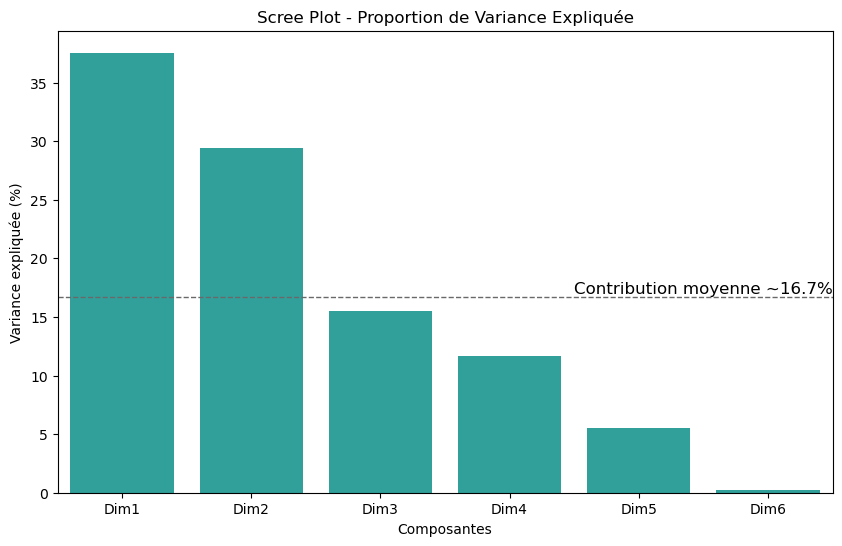

In [301]:
# Création du DataFrame des valeurs propres pour le Scree Plot
comp = pd.DataFrame({
    "Dimension": ["Dim" + str(i + 1) for i in range(len(pca.explained_variance_))],  # Génération des noms de dimensions (Dim1, Dim2, ...)
    "% variance expliquée": np.round(pca.explained_variance_ratio_ * 100, 2)  # Calcul du pourcentage de variance expliquée pour chaque dimension
})

# Configuration du graphique
plt.figure(figsize=(10, 6))  # Définir la taille de la figure

# Création d'un barplot pour visualiser la variance expliquée par chaque composante principale
g_comp = sns.barplot(
    x="Dimension",  # Axe des abscisses : les dimensions (Dim1, Dim2, ...)
    y="% variance expliquée",  # Axe des ordonnées : le pourcentage de variance expliquée
    data=comp,  # Source des données : DataFrame 'comp'
    color="lightseagreen"  # Couleur des barres
)

# Ajouter un titre et des labels pour les axes
plt.title("Scree Plot - Proportion de Variance Expliquée")  # Titre du graphique
plt.ylabel("Variance expliquée (%)")  # Label de l'axe des ordonnées
plt.xlabel("Composantes")  # Label de l'axe des abscisses

# Tracer une ligne horizontale représentant la contribution moyenne
plt.axhline(y=100 / 6, linewidth=1, color="dimgray", linestyle="--")  # Ligne à la hauteur de la contribution moyenne
plt.text(3.5, 17, "Contribution moyenne ~16.7%", fontsize=12)  # Ajouter une annotation pour expliquer la ligne

# Afficher le graphique
plt.show()

L'analyse des composantes principales (ACP) réalisée permet de réduire la complexité des données tout en conservant l'essentiel des informations. Chaque composante représente une partie des relations entre les variables.

Lors de cette analyse, nous avons observé la contribution de chaque composante à la variance totale des données. Une pratique courante est de comparer cette contribution à la contribution moyenne, qui est ici de 16,7% (calculée comme 100% divisé par 6 composantes).

Les deux premières composantes (Dim1 et Dim2) ont des valeurs de 38% et 29%, ce qui dépasse largement la contribution moyenne de 16,7%. Cela signifie qu'elles capturent une grande partie des variations présentes dans les données.

La troisième composante (Dim3) explique 16% de la variance, ce qui est juste autour de la contribution moyenne. Bien qu'elle soit moins dominante que les deux premières, elle reste une composante pertinente à prendre en compte.

Il est donc judicieux de se concentrer principalement sur Dim1 et Dim2, tout en ne négligeant pas Dim3, qui apporte également des informations utiles pour une interprétation complète des relations entre les variables.

#### Interprétation des composantes principales

Nous allons explorer et comprendre comment les composantes principales générées par l'Analyse en Composantes Principales (ACP) sont structurées et quelles relations elles entretiennent avec les variables initiales.<br>
Nous souhaitons interpréter chaque composante principale pour identifier quelles variables contribuent le plus à chaque axe principal et ainsi comprendre la structure des données. Cela permet d’analyser la répartition des informations dans notre jeu de données et de découvrir des patterns ou des relations cachées.

Nous accédons aux composantes principales via pca.components_. Chaque composante représente une combinaison linéaire des variables originales et capture une partie des informations contenues dans les données.<br>
Les valeurs dans le DataFrame montrent la contribution relative des variables à chaque composante principale.

In [302]:
# Obtenir les composantes principales
pcs = pca.components_  # Matrice des vecteurs propres (composantes principales) issus de l'ACP

# Création d'un DataFrame pour interpréter chaque composante
df_pcs = pd.DataFrame(
    pcs,  # Les composantes principales
    columns=X.columns,  # Noms des colonnes correspondant aux variables originales
    index=[f'F{i+1}' for i in range(X.shape[1])]  # Index représentant les nouvelles dimensions (F1, F2, ...)
)

# Transposer le DataFrame pour visualiser les contributions de chaque variable dans chaque dimension
df_pcs.T  # Afficher la transposition du DataFrame pour faciliter l'interprétation

,F1,F2,F3,F4,F5,F6
salt_100g,-0.056881,0.380431,0.779450,-0.494316,0.012080,0.001047
sugars_100g,0.467599,-0.394500,0.197658,-0.027024,0.765421,0.007288
carbohydrates_100g,0.510307,-0.318305,0.330583,0.203229,-0.549898,-0.430457
proteins_100g,0.037106,0.542224,0.221965,0.768353,0.227696,-0.114615
fat_100g,0.380506,0.479918,-0.429709,-0.350276,0.118742,-0.550863
energy_100g,0.609541,0.272022,-0.100924,-0.023654,-0.213663,0.705738


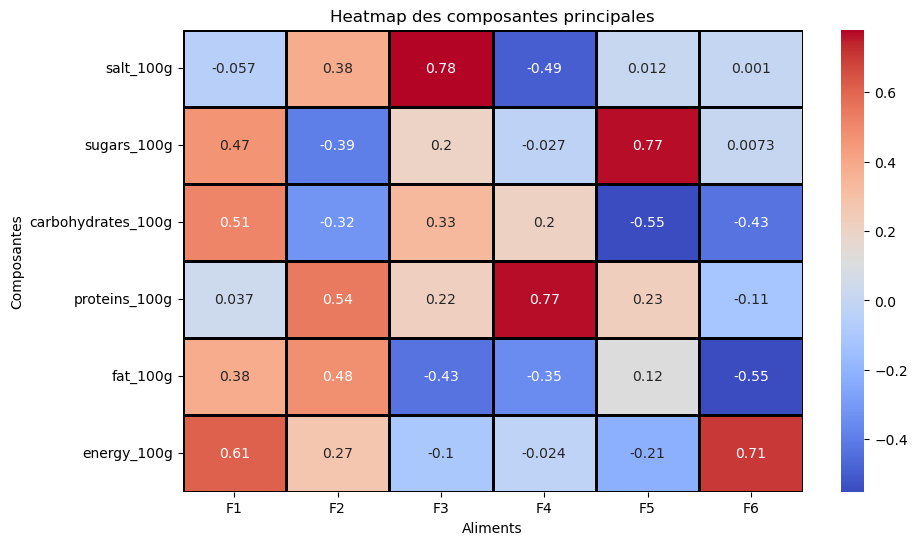

In [303]:
# Afficher la heatmap
plt.figure(figsize=(10, 6))  # Définir la taille de la figure pour un affichage clair

# Créer une heatmap basée sur les coefficients des composantes principales
sns.heatmap(
    df_pcs.T,  # Transposer le DataFrame pour afficher les variables en lignes et les composantes en colonnes
    annot=True,  # Ajouter les annotations (valeurs numériques) sur la heatmap
    cmap='coolwarm',  # Palette de couleurs pour indiquer les valeurs positives et négatives
    linewidths=1,  # Épaisseur des lignes séparant les cellules
    linecolor='black'  # Couleur des lignes séparant les cellules
)

# Ajouter un titre et des étiquettes pour les axes
plt.title("Heatmap des composantes principales")  # Titre de la heatmap
plt.xlabel("Aliments")  # Étiquette pour l'axe des abscisses
plt.ylabel("Composantes")  # Étiquette pour l'axe des ordonnées

# Afficher la heatmap
plt.show()

Cette matrice représente les coordonnées des variables sur les 6 facteurs (F1 à F6) d'une Analyse en Composantes Principales (ACP). Voici une analyse des principaux facteurs :

**F1 (Premier axe principal)**<br>
Fortement corrélé positivement avec energy_100g (0.609), carbohydrates_100g (0.510) et sugars_100g (0.468).<br>
Interprétation : Cet axe semble représenter la densité énergétique globale, principalement liée aux glucides et sucres.<br>

**F2 (Deuxième axe principal)**<br>
Corrélations positives avec proteins_100g (0.542), fat_100g (0.480) et salt_100g (0.381).<br>
Corrélations négatives avec sugars_100g (-0.394) et carbohydrates_100g (-0.318).<br>
Interprétation : Cet axe pourrait représenter l'opposition entre aliments riches en protéines/graisses/sel et aliments riches en glucides/sucres donc la satiété associée au produit.<br>

**F3 (Troisième axe principal)**<br>
Forte corrélation positive avec salt_100g (0.779).<br>
Corrélation négative avec fat_100g (-0.430).<br>
Interprétation : Cet axe semble mettre en évidence la teneur en sel, possiblement en opposition avec la teneur en graisses.<br>

Interprétation globale<br>
Les trois premiers facteurs capturent les principales variations nutritionnelles :<br>
F1 : Densité énergétique liée aux glucides et sucres<br>
F2 : Opposition protéines/graisses vs glucides<br>
F3 : Teneur en sel vs fat<br>


L'énergie (energy_100g) est fortement liée aux glucides et aux sucres sur F1, ce qui est cohérent avec le rôle des glucides comme principale source d'énergie.<br>
La séparation entre protéines/graisses et glucides sur F2 reflète les différents types de macronutriments essentiels.<br>
L'importance du sel sur F3 pourrait indiquer son rôle distinct dans la composition nutritionnelle, possiblement lié à la conservation ou au goût des aliments.<br>

#### Analyse des contributions des variables

Pour approfondir notre compréhension de la structure des données, nous allons examiner les contributions relatives de chaque variable aux composantes principales.

In [304]:
# Calcul des contributions
contributions = df_pcs ** 2  # Calcul des contributions des variables en élevant chaque coefficient au carré
for col in contributions.columns:  # Boucle sur chaque colonne pour normaliser les contributions
    contributions[col] = contributions[col] / contributions[col].sum() * 100  # Normalisation pour obtenir des pourcentages

# Arrondir les valeurs à deux décimales pour une meilleure lisibilité
contributions_rounded = contributions.round(2)  # Arrondir les contributions à deux décimales

# Conversion des valeurs en pourcentages (sous forme de chaîne) pour un affichage clair
contributions_percentage = contributions_rounded.map(lambda x: f"{x:.2f}%")  # Appliquer un formatage pour inclure le symbole '%'

# Afficher les contributions en pourcentage transposées pour plus de lisibilité
print("\nContributions en pourcentage :")
contributions_percentage.T  # Transposer le DataFrame pour afficher les composantes principales en colonnes


Contributions en pourcentage :


,F1,F2,F3,F4,F5,F6
salt_100g,0.32%,14.47%,60.75%,24.43%,0.01%,0.00%
sugars_100g,21.86%,15.56%,3.91%,0.07%,58.59%,0.01%
carbohydrates_100g,26.04%,10.13%,10.93%,4.13%,30.24%,18.53%
proteins_100g,0.14%,29.40%,4.93%,59.04%,5.18%,1.31%
fat_100g,14.48%,23.03%,18.47%,12.27%,1.41%,30.34%
energy_100g,37.15%,7.40%,1.02%,0.06%,4.57%,49.81%


<Figure size 1500x600 with 0 Axes>

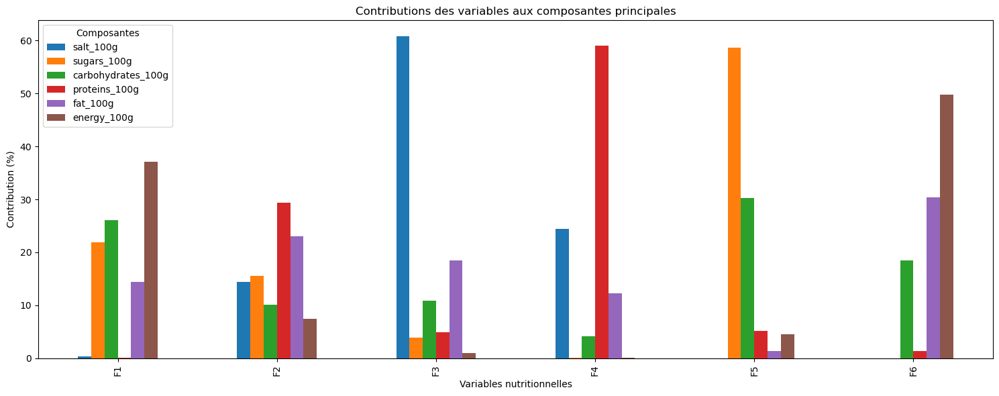

In [305]:
# Visualisation des contributions des variables aux 3 premières composantes
plt.figure(figsize=(15, 6))
contributions.plot(kind='bar', figsize=(15, 6))
plt.title('Contributions des variables aux composantes principales')
plt.xlabel('Variables nutritionnelles')
plt.ylabel('Contribution (%)')
plt.legend(title='Composantes', loc='best')
plt.tight_layout()
plt.show()

F1 (Densité Énergétique) :<br>
Variables Clés : energy_100g (37.14%), carbohydrates_100g (26.05%), sugars_100g (21.88%)
Observation : Ces contributions confirment que F1 représente la densité énergétique, principalement liée aux glucides et sucres.
    
F2 (Satiété / Opposition Protéines-Graisses vs Glucides) :<br>
Variables Clés : proteins_100g (29.39%), fat_100g (23.05%), sugars_100g (15.54%, contribution négative dans l'ACP)
Observation : Ces contributions soutiennent l'interprétation de F2 comme un axe opposant les aliments riches en protéines et graisses (potentiellement plus rassasiants) aux aliments riches en sucres (moins rassasiants).

F3 (Teneur en Sel vs Graisses) :<br>
Variables Dominantes : salt_100g (60.72%), fat_100g (18.47%, contribution négative dans l'ACP)
Observation : Cette composante met en avant l'importance du sel dans la composition des aliments, en opposition avec la teneur en graisses.

Conclusion<br>
Ces contributions quantifient l'importance relative de chaque variable dans la définition des composantes principales, renforçant les interprétations faites lors de l'analyse initiale des composantes :<br>
**F1 capture effectivement la densité énergétique liée aux glucides et sucres.**<br>
**F2 reflète bien l'opposition entre aliments riches en protéines/graisses et ceux riches en glucides/sucres, ce qui peut être lié à la satiété.**<br>
**F3 confirme l'importance du sel dans la composition nutritionnelle, en opposition avec les graisses.**<br>

Cette analyse des contributions complète et renforce notre compréhension de la structure des données nutritionnelles révélée par l'ACP.

#### Cercle des corrélations

Dans le cadre de l'Analyse en Composantes Principales (ACP), les cercles des corrélations permettent de mieux comprendre la relation entre les variables initiales et les composantes principales.

Chaque flèche sur le cercle représente une variable originale du dataset et sa contribution à une composante principale spécifique. La direction et la longueur des flèches indiquent :

La force de la corrélation : Une longueur plus grande signifie une contribution plus forte de la variable à la composante.
La direction de la corrélation : Une direction similaire entre les flèches montre une corrélation positive, tandis qu'une direction opposée révèle une corrélation négative.
Ces cercles permettent ainsi d’identifier quelles variables influencent le plus chaque composante principale, facilitant ainsi :

L'interprétation des composantes : Savoir quelles variables sont dominantes sur chaque axe principal.
La réduction des dimensions : Comprendre quelles variables peuvent être regroupées ou ignorées sans perdre trop d'informations importantes.
En visualisant ces corrélations, on peut mieux saisir les structures sous-jacentes des données, détecter des schémas significatifs, et interpréter les relations complexes entre les différentes composantes principales et les variables de l'analyse.

In [306]:
def correlation_graph(pca, 
                      x_y, 
                      features):
    """
    Affiche le graphe des corrélations.

    Arguments positionnels :
    -----------------------------------
    pca : sklearn.decomposition.PCA : L'objet PCA utilisé pour l'analyse
    x_y : list ou tuple : Le couple (x, y) correspondant aux plans à afficher, ex. [0,1] pour F1 et F2
    features : list ou tuple : La liste des variables (dimensions) à représenter
    """

    # Extraire les indices des axes à représenter (x et y)
    x, y = x_y

    # Créer la figure et les axes avec une taille spécifiée
    fig, ax = plt.subplots(figsize=(10, 9))

    # Ajouter un quadrillage discret pour améliorer la lisibilité
    ax.grid(color='lightgrey', linestyle='--', linewidth=0.5)

    # Parcourir les composantes principales (chaque feature représentée par une flèche)
    for i in range(0, pca.components_.shape[1]):
        # Dessiner une flèche représentant la projection de chaque variable sur le plan (F1, F2)
        ax.arrow(0, 0, 
                 pca.components_[x, i],  # Coordonnée x
                 pca.components_[y, i],  # Coordonnée y
                 head_width=0.07,       # Largeur de la tête de flèche
                 head_length=0.07,      # Longueur de la tête de flèche
                 width=0.02)            # Épaisseur de la flèche

        # Ajouter un label pour chaque variable près de la tête de sa flèche
        plt.text(pca.components_[x, i] + 0.05,  # Position x légèrement décalée
                 pca.components_[y, i] + 0.05,  # Position y légèrement décalée
                 features[i])                   # Nom de la variable

    # Ajouter des lignes horizontales et verticales passant par l'origine
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')  # Ligne horizontale
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')  # Ligne verticale

    # Ajouter les noms des axes avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100 * pca.explained_variance_ratio_[x], 1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100 * pca.explained_variance_ratio_[y], 1)))

    # Ajouter un titre décrivant le cercle des corrélations
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Tracer un cercle unité pour visualiser les limites des projections
    an = np.linspace(0, 2 * np.pi, 100)  # Angles pour dessiner un cercle
    plt.plot(np.cos(an), np.sin(an))    # Coordonnées x et y du cercle

    # S'assurer que les axes ont une échelle égale pour éviter la distorsion
    plt.axis('equal')

    # Afficher le graphique
    plt.show(block=False)

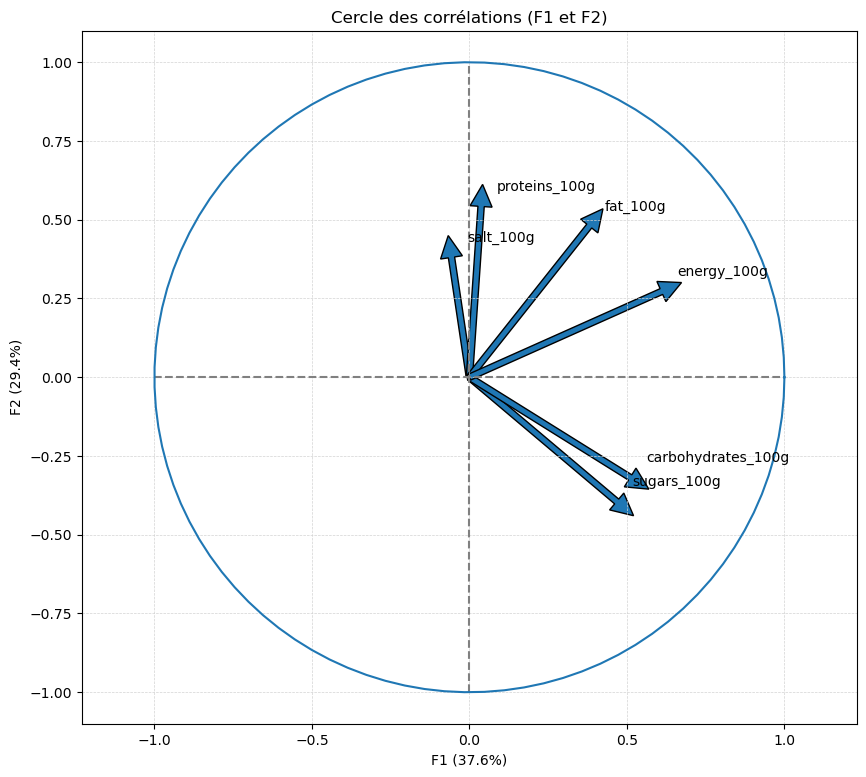

In [307]:
# Pour comparer F1 avec F2
correlation_graph(pca, [0, 1], X.columns)

Cercle de corrélation F1-F2 :<br>

**Sur F1 (axe horizontal)** :<br>
energy_100g, carbohydrates_100g et sugars_100g sont fortement et positivement corrélés à F1 et fat modérément.<br>
Cela indique que F1 représente principalement la densité énergétique liée aux glucides, tout en tenant compte que la teneur en graisses peut également influencer cette densité.<f1>
Les produits situés à droite de l'axe F1 sont généralement plus riches en calories grâce à leur contenu élevé en glucides et en graisses, tandis que ceux à gauche sont associés à une densité énergétique plus faible, résultant d'une faible teneur en glucides, en sucres ou en graisses.<br>
**En résumé, on peut considérer F1 comme un axe représentant la densité énergétique (en kJ) des aliments.**<br>

**Sur F2 (axe vertical)** :<br>
proteins_100g, fat_100g et salt_100g sont positivement corrélés.<br>
sugars_100g et carbohydrates_100g sont négativement corrélés à F1.<br>
F2 semble opposer les aliments riches en protéines/graisses/sel aux aliments riches en glucides/sucres.<br>
Cette opposition est significative car les aliments riches en protéines et en graisses tendent à être plus rassasiants, contribuant ainsi à une meilleure satiété. En revanche, les aliments riches en glucides et en sucres peuvent offrir un apport rapide d'énergie, mais ils sont souvent moins efficaces pour maintenir une sensation de satiété durable.<br>
**En résumé, on peut considérer F2 comme un axe représentant la satiété**.

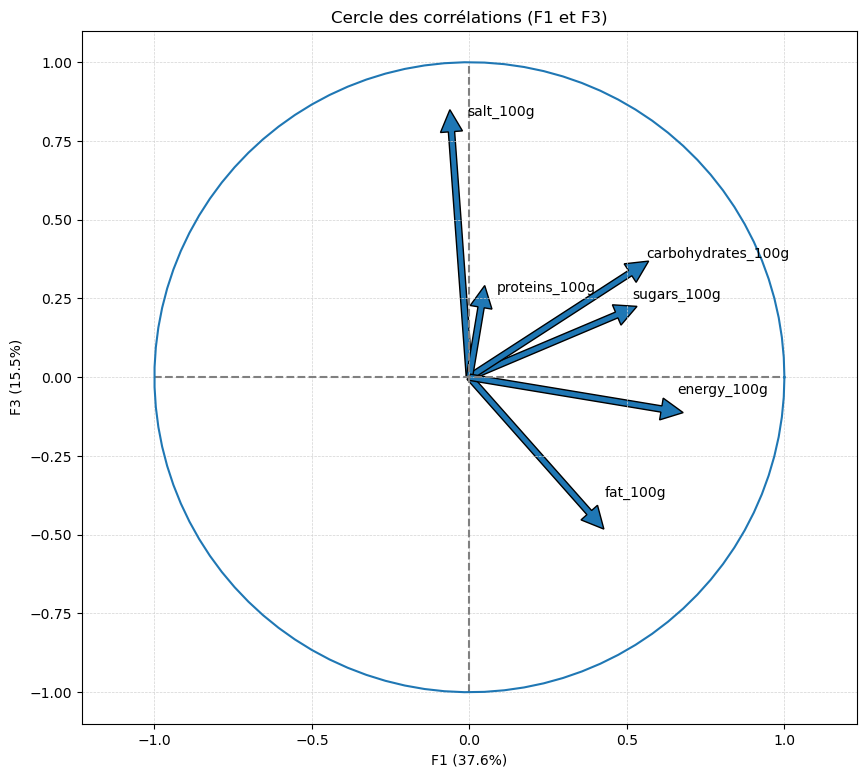

In [308]:
# Pour comparer F1 avec F3
correlation_graph(pca, [0, 2], X.columns)

Cercle de corrélation F1-F3 :<br>
**Sur F1 (axe horizontal)** :<br>
Déjà analysé plus haut.

**Sur F3 (axe vertical)** :<br>
salt_100g (0.779) est très fortement corrélé positivement.<br>
fat_100g (-0.430) est corrélé négativement.<br>
**F3 représente principalement la teneur en sel, en opposition avec la teneur en graisses.**

Interprétation globale :
La position opposée des graisses par rapport au sel sur F3 pourrait indiquer une tendance dans notre jeu de données : les aliments très salés pourraient avoir tendance à être moins gras, et vice versa.

#### Nuages des individus sur les principaux axes factoriels

En projetant les individus sur les deux premières composantes principales, ce nuage permet de visualiser comment les produits, représentés par des points, se répartissent en fonction de leurs caractéristiques nutritionnelles principales. Les couleurs indiquent les groupes PNNS, facilitant ainsi l’identification des différences ou similitudes entre ces groupes.

Cela nous permettra de voir :
Quels groupes sont alignés avec une densité énergétique élevée, indiqués par des valeurs élevées sur F1. Comment ces groupes se comportent en matière de satiété, en fonction des relations sur l'axe F2.

In [309]:
# Ajouter les segments dans X_normalise
X_normalise['pnns_groups_1'] = y.values

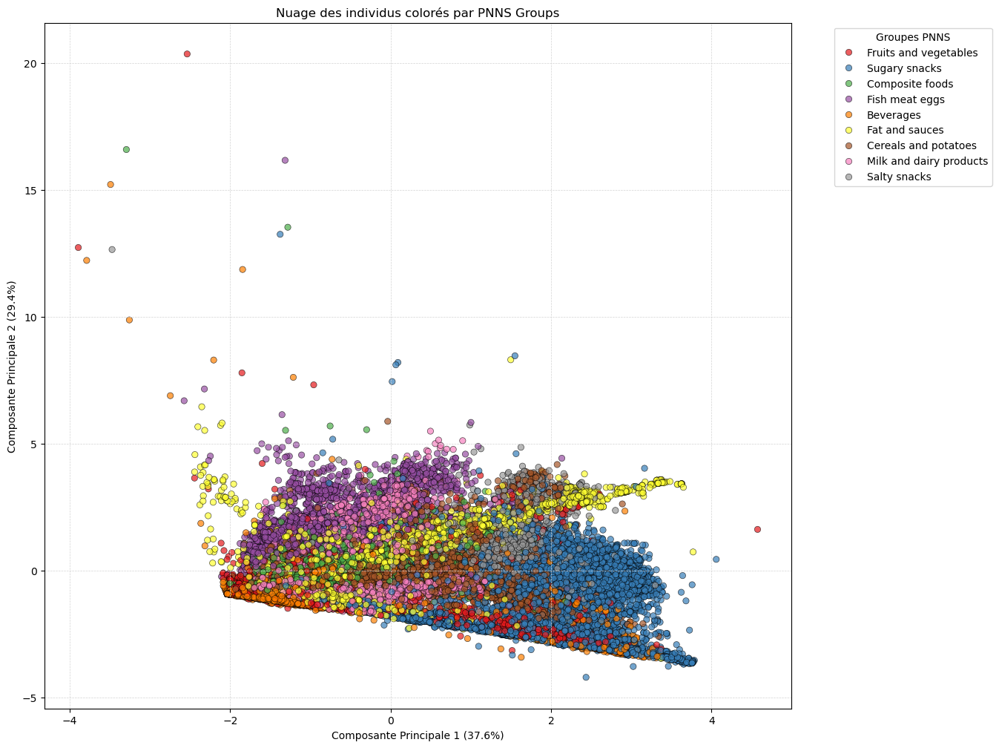

In [310]:
# Obtenir les deux premières composantes principales
pc1 = X_pca[:, 0]  # Première composante
pc2 = X_pca[:, 1]  # Deuxième composante

# Visualisation des composantes principales avec coloration par 'pnns_groups_1'
plt.figure(figsize=(13, 12))

sns.scatterplot(
    x=pc1, 
    y=pc2, 
    hue=X_normalise['pnns_groups_1'],  # Utiliser 'pnns_groups_1' pour la coloration
    palette='Set1',  # Palette de couleurs, modifiable selon vos préférences
    alpha=0.7,  # Transparence des points
    edgecolor='k'  # Couleur des bords des points
)

# Ajouter des détails au graphique
plt.title("Nuage des individus colorés par PNNS Groups")
plt.xlabel(f'Composante Principale 1 ({pca.explained_variance_ratio_[0] * 100:.1f}%)')
plt.ylabel(f'Composante Principale 2 ({pca.explained_variance_ratio_[1] * 100:.1f}%)')
plt.legend(title='Groupes PNNS', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

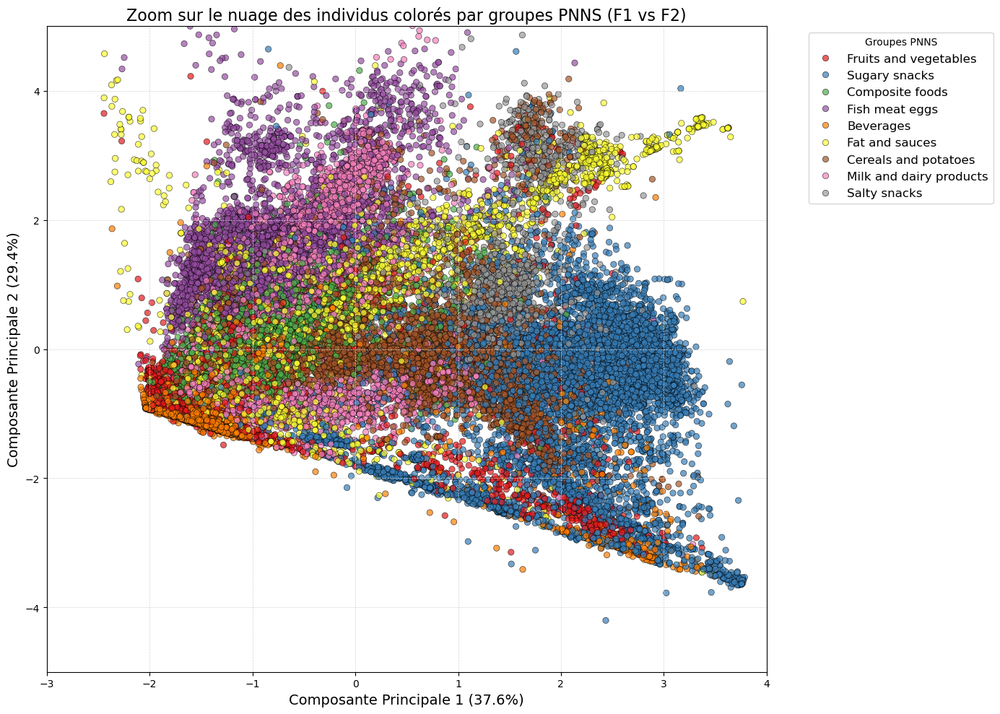

In [311]:
# Obtenir les deux premières composantes principales
pc1 = X_pca[:, 0]  # Première composante
pc2 = X_pca[:, 1]  # Deuxième composante

# Visualisation des composantes principales avec zoom
plt.figure(figsize=(14, 10))  # Taille du graphique

sns.scatterplot(
    x=pc1, 
    y=pc2, 
    hue=X_normalise['pnns_groups_1'],  # Utiliser 'pnns_groups_1' pour la coloration
    palette='Set1',  # Palette de couleurs
    alpha=0.7,  # Transparence des points
    edgecolor='k'  # Couleur des bords des points
)

# Définir les limites pour le zoom
plt.xlim(-3, 4)  # Ajustez les limites de x 
plt.ylim(-5, 5)  # Ajustez les limites de y 

# Ajouter des détails au graphique
plt.title("Zoom sur le nuage des individus colorés par groupes PNNS (F1 vs F2)", fontsize=16)
plt.xlabel(f'Composante Principale 1 ({pca.explained_variance_ratio_[0] * 100:.1f}%)', fontsize=14)
plt.ylabel(f'Composante Principale 2 ({pca.explained_variance_ratio_[1] * 100:.1f}%)', fontsize=14)
plt.legend(title='Groupes PNNS', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.tight_layout()  # Ajustement des marges
plt.show()


**Interprétation des axes F1 et F2**

À droite de F1, nous retrouvons principalement des groupes comme **Sugary snacks** et **Cereals and potatoes**, qui sont riches en glucides et sucres rapides. Ces produits ont une densité énergétique élevée et sont souvent consommés pour un apport rapide d'énergie. Cela explique leur position vers la droite de l'axe, qui est associé à une haute densité énergétique.

À gauche de F1, on retrouve des groupes comme **Beverages**, **Fruits and vegetables**, et une partie des **Milk and dairy products**. Ces aliments sont généralement plus légers en termes de densité énergétique et sont souvent associés à une alimentation plus équilibrée et moins calorique, favorisant ainsi une consommation plus saine et un apport énergétique plus modéré.
Axe F2 (de haut en bas) :

En haut de F2, on trouve des groupes comme **Fish, meat, eggs** et **Milk and dairy products**, qui sont riches en protéines et graisses saines. Ces produits favorisent une meilleure satiété et sont associés à une alimentation plus consistante, permettant de mieux réguler la faim et la digestion.
Plus bas sur F2, la position des groupes comme **Sugary snacks** indique qu'ils sont moins rassasiants, avec une forte présence de glucides rapides et de sucres. Ces aliments apportent une énergie rapide, mais leur effet sur la satiété est limité.

Conclusion générale :
Les résultats montrent une correlation claire entre les produits riches en glucides et sucres (Sugary snacks, Cereals and potatoes) et les zones de haute densité énergétique (à droite de F1), tandis que les aliments plus riches en protéines et graisses saines (Fish, meat, eggs, Milk and dairy products) occupent des zones qui favorisent la satiété (en haut de F2).

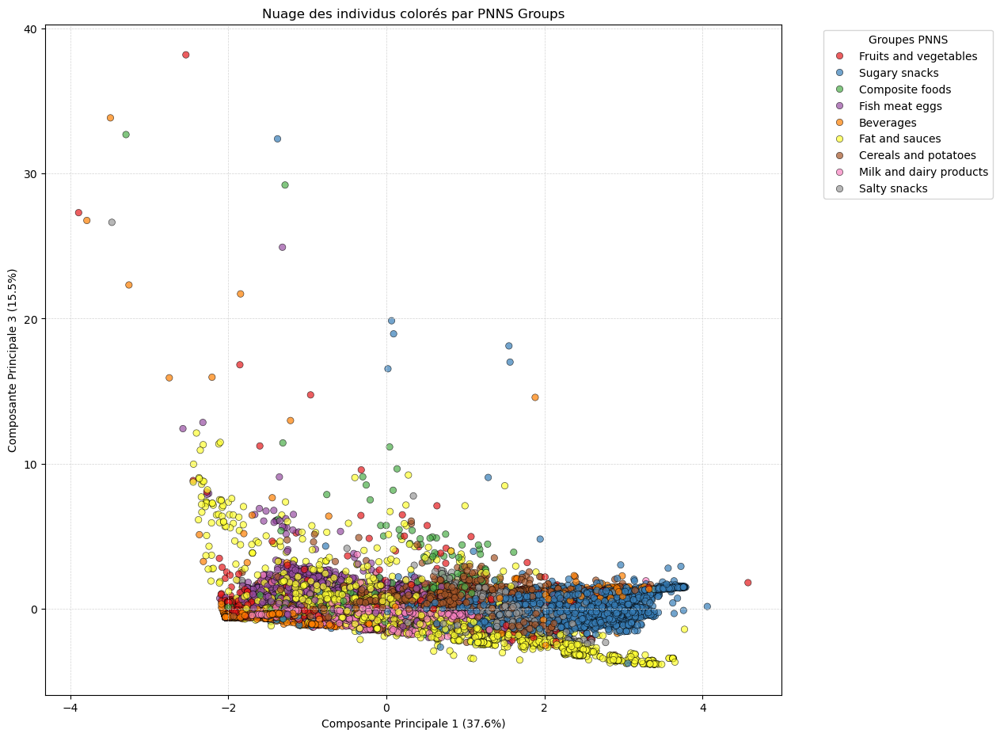

In [312]:
# Obtenir les deux premières composantes principales
pc1 = X_pca[:, 0]
pc3 = X_pca[:, 2]

# Visualisation des composantes principales avec coloration par 'pnns_groups_1'
plt.figure(figsize=(12, 11))

sns.scatterplot(
    x=pc1, 
    y=pc3, 
    hue=X_normalise['pnns_groups_1'],  # Utiliser 'pnns_groups_1' pour la coloration
    palette='Set1',  # Palette de couleurs, modifiable selon vos préférences
    alpha=0.7,  # Transparence des points
    edgecolor='k'  # Couleur des bords des points
)

# Ajouter des détails au graphique
plt.title("Nuage des individus colorés par PNNS Groups")
plt.xlabel(f'Composante Principale 1 ({pca.explained_variance_ratio_[0] * 100:.1f}%)')
plt.ylabel(f'Composante Principale 3 ({pca.explained_variance_ratio_[2] * 100:.1f}%)')
plt.legend(title='Groupes PNNS', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

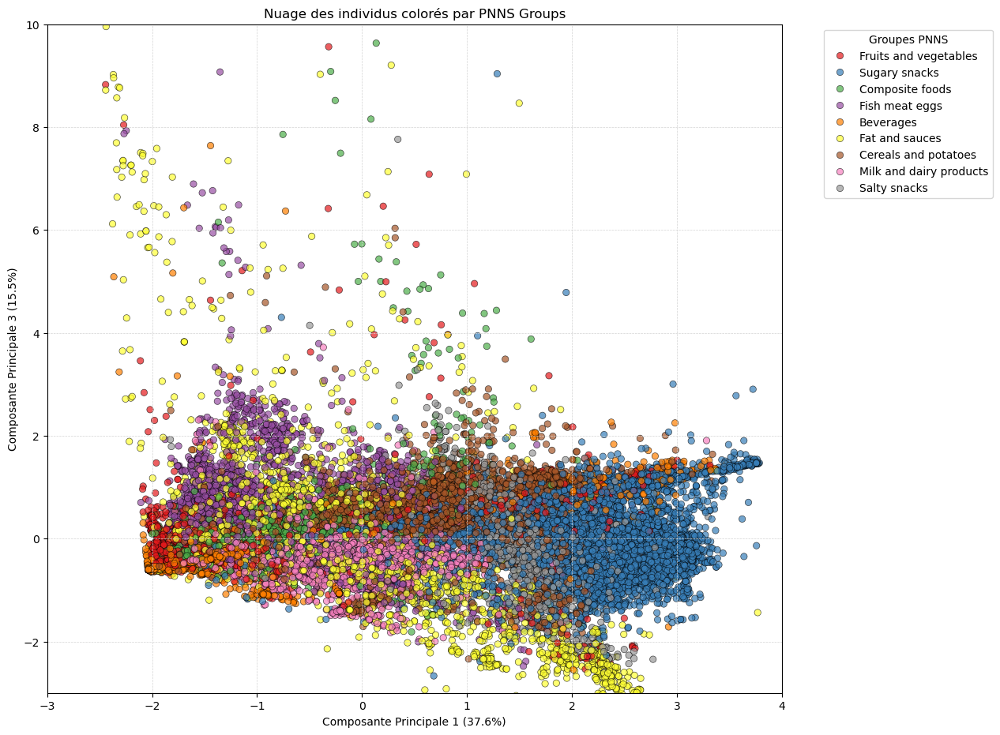

In [313]:
# Obtenir les deux premières composantes principales
pc1 = X_pca[:, 0]
pc3 = X_pca[:, 2]

# Visualisation des composantes principales avec coloration par 'pnns_groups_1'
plt.figure(figsize=(12, 11))

sns.scatterplot(
    x=pc1, 
    y=pc3, 
    hue=X_normalise['pnns_groups_1'],  # Utiliser 'pnns_groups_1' pour la coloration
    palette='Set1',  # Palette de couleurs, modifiable selon vos préférences
    alpha=0.7,  # Transparence des points
    edgecolor='k'  # Couleur des bords des points
)

# Définir les limites pour le zoom
plt.xlim(-3, 4)  # Ajustez les limites de x 
plt.ylim(-3, 10)  # Ajustez les limites de y 

# Ajouter des détails au graphique
plt.title("Nuage des individus colorés par PNNS Groups")
plt.xlabel(f'Composante Principale 1 ({pca.explained_variance_ratio_[0] * 100:.1f}%)')
plt.ylabel(f'Composante Principale 3 ({pca.explained_variance_ratio_[2] * 100:.1f}%)')
plt.legend(title='Groupes PNNS', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

Déplacement sur l'axe des ordonnées (F3) :

En montant sur l'axe vertical (F3), on identifie des aliments riches en sel, souvent associés à des produits transformés ou des condiments (par exemple, des snacks salés ou des bouillons).
En descendant sur l'axe vertical (F3), on rencontre des aliments contenant davantage de graisses, ce qui inclut certains aliments comme les produits Composite foods, Fat and sauces, Fish and meat, ainsi que des Milk and dairy products. Ces produits sont souvent plus gras et apportent une densité énergétique plus élevée.

Déplacement sur l'axe des abscisses (F1) :
En se déplaçant vers la droite de F1, on trouve des aliments à haute densité énergétique, riches en glucides et en sucres (comme les Sugary snacks et Cereals and potatoes).
En se déplaçant vers la gauche de F1, les aliments montrent une faible densité énergétique, souvent riches en fibres ou faibles en sucres, comme certains fruits et légumes ou boissons peu caloriques.
Interprétation spécifique du nuage de points :
Les points en haut à gauche, où F3 (axe vertical) indique des produits salés et F1 une faible densité énergétique, se retrouvent dans une zone caractéristique des produits très salés et peu caloriques, comme des cornichons ou des bouillons. Ces produits sont peu énergétiques, mais contiennent une quantité significative de sel, ce qui est typique des condiments ou produits transformés salés.

Les points en bas à droite, représentant une zone plus riche en graisses et à forte densité énergétique, sont associés à des produits comme les Composite foods, Fat and sauce, ainsi que des catégories comme Fish and meat et Milk and dairy products. Ces aliments, riches en graisses, apportent une énergie plus concentrée et sont souvent associés à des plats cuisinés ou des produits plus consistants.

#### Conclusion de l'ACP

**Compréhension des Relations entre Variables**

Les résultats de l'ACP révèlent des relations significatives entre les différentes caractéristiques nutritionnelles des produits. 
Par exemple, F1, qui représente principalement la densité énergétique, montre que les produits situés à droite de cet axe sont riches en calories. Cela inclut des aliments comme les céréales et les pommes de terre (ex. : céréales sucrées, frites) qui ont une densité énergétique élevée en raison de leur contenu en glucides.
En revanche, les produits situés à gauche, comme certains fruits et légumes (ex. : concombre, laitue), sont associés à une faible densité énergétique.

**Identification des Axes de Satiété**
L'axe F2 oppose les aliments riches en protéines et en graisses à ceux riches en glucides et en sucres. Par exemple, des produits comme le poisson, la viande et les œufs (ex. : poulet grillé, saumon) se situent dans la partie supérieure de cet axe et sont souvent plus rassasiants. En revanche, des aliments riches en sucres (ex. : bonbons, gâteaux) se trouvent plus bas sur cet axe, indiquant qu'ils peuvent offrir un apport rapide d'énergie mais sont moins efficaces pour maintenir une sensation de satiété durable.

**Analyse de la Teneur en Sel**
L'axe F3 met en avant la corrélation avec la teneur en sel, soulignant son rôle dans l'analyse nutritionnelle. Les produits salés (Composite foods) montrent une forte corrélation positive avec cet axe, tandis que des produits comme les produits laitiers (ex. : yaourts nature) ont généralement une teneur en sel plus faible. Cette distinction peut influencer l'appartenance à un groupe PNNS, notamment pour ceux qui cherchent à réduire leur consommation de sodium.

**Importance des Comparaisons et Création de Nouvelles Variables**
Comparaisons entre Composantes
Les comparaisons entre les différentes composantes permettent d'identifier des patterns significatifs dans nos données. Par exemple, comprendre comment la densité énergétique (F1) et la satiété (F2) se rapportent aux groupes PNNS peut aider à prédire à quel groupe un produit appartient. Par exemple, un produit comme un burger (composite food) pourrait être classé dans un groupe PNNS spécifique en fonction de sa composition nutritionnelle.

**Création de Nouvelles Variables**
Les nouvelles variables (composantes) créées par l'ACP synthétisent l'information provenant de plusieurs variables originales. En utilisant ces composantes comme variables explicatives dans nos modèles prédictifs, nous pouvons améliorer la performance de nos analyses et faciliter la classification des produits dans les groupes PNNS.

**Facilitation de l'Interprétation**
Le cercle de corrélation facilite l'interprétation des relations entre les variables originales et les nouvelles dimensions synthétiques. Il aide à visualiser quelles variables ont un impact significatif sur chaque axe et comment elles interagissent entre elles, ce qui peut être déterminant pour la classification finale.

Conclusion
En résumé, les résultats de notre ACP et le cercle de corrélation offrent un cadre solide pour comprendre les relations complexes entre les caractéristiques nutritionnelles des aliments et leur impact sur leur appartenance aux groupes PNNS 1. En intégrant ces insights dans nos modèles prédictifs, nous serons mieux équipés pour classer efficacement les produits alimentaires selon leur groupe PNNS — qu'il s'agisse de fruits et légumes, produits sucrés, ou céréales et pommes de terre, contribuant ainsi à atteindre notre objectif principal.

# Conclusion

Avant d'entrer dans l'analyse des relations entre les variables et les groupes PNNS, nous avons pris soin de traiter les valeurs aberrantes et imputer les valeurs manquantes dans notre jeu de données. Cette étape a permis d'assurer la qualité des données et d'éviter que des anomalies n'influencent les résultats de nos analyses. Les valeurs aberrantes ont été identifiées et traitées de manière appropriée, tandis que les valeurs manquantes ont été imputées par des méthodes adaptées, garantissant ainsi la cohérence et la représentativité des données pour l'analyse.

Les résultats des tests de Kruskal-Wallis et des analyses suivantes montrent clairement que les différentes variables nutritionnelles présentent des différences significatives entre les groupes PNNS. Ces différences sont marquées, ce qui suggère que ces variables jouent un rôle important dans la classification des aliments en fonction de leurs groupes PNNS.

**Variables significatives** :<br>
Pour les variables telles que salt_100g, proteins_100g, fat_100g, sugars_100g, carbohydrates_100g, et énergie, les valeurs de la statistique de Kruskal-Wallis sont toutes élevées, avec des valeurs p de 0, ce qui indique qu'il existe des différences significatives entre les groupes PNNS pour chacune de ces variables.<br>
Le test de Dunn pour l'énergie montre également des différences significatives entre chaque groupe, ce qui renforce cette relation.<br>

**Interprétation des axes ACP** :<br>
L'analyse en composantes principales (ACP) a permis de réduire la dimensionnalité des données tout en conservant des informations essentielles sur les variables nutritionnelles. Les axes F1, F2 et F3 capturent les tendances principales des variables nutritionnelles, qui peuvent être liées aux différences observées entre les groupes PNNS. Par exemple, la densité énergétique (F1), les propriétés de satiété (F2) et la teneur en sel (F3) ont une influence sur la classification des aliments.<br>

**Prédiction des groupes PNNS** :<br>
Étant donné que les tests de Kruskal-Wallis montrent des différences significatives pour les variables principales (comme le sel, les protéines, les graisses, les sucres, les glucides et l'énergie) entre les groupes PNNS, il est raisonnable de conclure que ces variables peuvent être utilisées pour prédire les groupes PNNS. Les résultats de l'ACP fournissent une synthèse de ces variables, ce qui permet d'affiner la classification des produits alimentaires.<br>

**Modèles prédictifs** :<br>
Les variables issues de l'ACP, associées aux résultats du test de Kruskal-Wallis, fournissent un ensemble robuste de caractéristiques pour construire des modèles prédictifs. Ces modèles pourront classer les produits alimentaires en fonction de leurs groupes PNNS, avec des performances potentiellement améliorées grâce à la réduction de la dimensionnalité et à la prise en compte de plusieurs variables nutritionnelles simultanément.<br>

En conclusion, les tests statistiques confirment la pertinence des variables nutritionnelles dans la distinction des groupes PNNS. L'ACP, combinée à ces résultats, offre une base solide pour développer des modèles prédictifs afin de classifier efficacement les produits alimentaires.